In [1]:
# importing required libraries
import numpy as np
import pandas as pd
import pickle # saving and loading trained model
from os import path

# importing required libraries for normalizing data
from sklearn import preprocessing
from sklearn.preprocessing import (StandardScaler, OrdinalEncoder,LabelEncoder, MinMaxScaler, OneHotEncoder)
from sklearn.preprocessing import Normalizer, MaxAbsScaler , RobustScaler, PowerTransformer

# importing library for plotting/

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
from sklearn.metrics import accuracy_score # for calculating accuracy of model
from sklearn.model_selection import train_test_split # for splitting the dataset for training and testing
from sklearn.metrics import classification_report # for generating a classification report of model

from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

import tensorflow as tf
from tensorflow.keras.utils import to_categorical

from keras.layers import Dense # importing dense layer

from keras.layers import Input
from keras.models import Model
# representation of model layers
from keras.utils import plot_model
from sklearn.metrics import confusion_matrix
import shap
from imblearn.over_sampling import SMOTE
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer


/opt/homebrew/lib/python3.10/site-packages/shap/utils/_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
/opt/homebrew/lib/python3.10/site-packages/shap/utils/_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def delta_minimization_order(all_masks, max_swap_size=100

In [2]:
#Defining metric functions
def ACC(TP,TN,FP,FN):
    Acc = (TP+TN)/(TP+FP+FN+TN)
    return Acc
def ACC_2 (TP, FN):
    ac = (TP/(TP+FN))
    return ac
def PRECISION(TP,FP):
    eps = 1e-7
    Precision = TP/(TP+FP+eps)
    

    return Precision
def RECALL(TP,FN):
    Recall = TP/(TP+FN)
    return Recall
def F1(Recall, Precision):
    F1 = 2 * Recall * Precision / (Recall + Precision)
    return F1
def BACC(TP,TN,FP,FN):
    BACC =(TP/(TP+FN)+ TN/(TN+FP))*0.5
    return BACC
def MCC(TP,TN,FP,FN):
    eps = 1e-7
    MCC = (TN*TP-FN*FP)/(((TP+FP+eps)*(TP+FN+eps)*(TN+FP+eps)*(TN+FN+eps))**.5)
    return MCC
def AUC_ROC(y_test_bin,y_score):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    auc_avg = 0
    counting = 0
    for i in range(n_classes):
      fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
     # plt.plot(fpr[i], tpr[i], color='darkorange', lw=2)
      #print('AUC for Class {}: {}'.format(i+1, auc(fpr[i], tpr[i])))
      auc_avg += auc(fpr[i], tpr[i])
      counting = i+1
    return auc_avg/counting

In [3]:
# attach the column names to the dataset
feature=["duration","protocol_type","service","flag","src_bytes","dst_bytes","land","wrong_fragment","urgent","hot",
          "num_failed_logins","logged_in","num_compromised","root_shell","su_attempted","num_root","num_file_creations","num_shells",
          "num_access_files","num_outbound_cmds","is_host_login","is_guest_login","count","srv_count","serror_rate","srv_serror_rate",
          "rerror_rate","srv_rerror_rate","same_srv_rate","diff_srv_rate","srv_diff_host_rate","dst_host_count","dst_host_srv_count", 
          "dst_host_same_srv_rate","dst_host_diff_srv_rate","dst_host_same_src_port_rate","dst_host_srv_diff_host_rate","dst_host_serror_rate",
          "dst_host_srv_serror_rate","dst_host_rerror_rate","dst_host_srv_rerror_rate","label","difficulty"]
# KDDTrain+_2.csv & KDDTest+_2.csv are the datafiles without the last column about the difficulty score
# these have already been removed.

train='KDDTrain+.txt'
test='KDDTest+.txt'

df=pd.read_csv(train,names=feature)
df_test=pd.read_csv(test,names=feature)

# shape, this gives the dimensions of the dataset
print('Dimensions of the Training set:',df.shape)
print('Dimensions of the Test set:',df_test.shape)

Dimensions of the Training set: (125973, 43)
Dimensions of the Test set: (22544, 43)


In [4]:
df.drop(['difficulty'],axis=1,inplace=True)
df_test.drop(['difficulty'],axis=1,inplace=True)

In [5]:
print('Label distribution Training set:')
print(df['label'].value_counts())
print()
print('Label distribution Test set:')
print(df_test['label'].value_counts())

Label distribution Training set:
normal             67343
neptune            41214
satan               3633
ipsweep             3599
portsweep           2931
smurf               2646
nmap                1493
back                 956
teardrop             892
warezclient          890
pod                  201
guess_passwd          53
buffer_overflow       30
warezmaster           20
land                  18
imap                  11
rootkit               10
loadmodule             9
ftp_write              8
multihop               7
phf                    4
perl                   3
spy                    2
Name: label, dtype: int64

Label distribution Test set:
normal             9711
neptune            4657
guess_passwd       1231
mscan               996
warezmaster         944
apache2             737
satan               735
processtable        685
smurf               665
back                359
snmpguess           331
saint               319
mailbomb            293
snmpgetattack       178


In [6]:
# colums that are categorical and not binary yet: protocol_type (column 2), service (column 3), flag (column 4).
# explore categorical features
print('Training set:')
for col_name in df.columns:
    if df[col_name].dtypes == 'object' :
        unique_cat = len(df[col_name].unique())
        print("Feature '{col_name}' has {unique_cat} categories".format(col_name=col_name, unique_cat=unique_cat))

#see how distributed the feature service is, it is evenly distributed and therefore we need to make dummies for all.
print()
print('Distribution of categories in service:')
print(df['service'].value_counts().sort_values(ascending=False).head())

Training set:
Feature 'protocol_type' has 3 categories
Feature 'service' has 70 categories
Feature 'flag' has 11 categories
Feature 'label' has 23 categories

Distribution of categories in service:
http        40338
private     21853
domain_u     9043
smtp         7313
ftp_data     6860
Name: service, dtype: int64


In [7]:
# Test set
print('Test set:')
for col_name in df_test.columns:
    if df_test[col_name].dtypes == 'object' :
        unique_cat = len(df_test[col_name].unique())
        print("Feature '{col_name}' has {unique_cat} categories".format(col_name=col_name, unique_cat=unique_cat))

Test set:
Feature 'protocol_type' has 3 categories
Feature 'service' has 64 categories
Feature 'flag' has 11 categories
Feature 'label' has 38 categories


In [8]:
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
categorical_columns=['protocol_type', 'service', 'flag']
# insert code to get a list of categorical columns into a variable, categorical_columns
categorical_columns=['protocol_type', 'service', 'flag'] 
 # Get the categorical values into a 2D numpy array
df_categorical_values = df[categorical_columns]
testdf_categorical_values = df_test[categorical_columns]
df_categorical_values.head()

,protocol_type,service,flag
0,tcp,ftp_data,SF
1,udp,other,SF
2,tcp,private,S0
3,tcp,http,SF
4,tcp,http,SF


In [9]:
# protocol type
unique_protocol=sorted(df.protocol_type.unique())
string1 = 'Protocol_type_'
unique_protocol2=[string1 + x for x in unique_protocol]
# service
unique_service=sorted(df.service.unique())
string2 = 'service_'
unique_service2=[string2 + x for x in unique_service]
# flag
unique_flag=sorted(df.flag.unique())
string3 = 'flag_'
unique_flag2=[string3 + x for x in unique_flag]
# put together
dumcols=unique_protocol2 + unique_service2 + unique_flag2
print(dumcols)

#do same for test set
unique_service_test=sorted(df_test.service.unique())
unique_service2_test=[string2 + x for x in unique_service_test]
testdumcols=unique_protocol2 + unique_service2_test + unique_flag2

['Protocol_type_icmp', 'Protocol_type_tcp', 'Protocol_type_udp', 'service_IRC', 'service_X11', 'service_Z39_50', 'service_aol', 'service_auth', 'service_bgp', 'service_courier', 'service_csnet_ns', 'service_ctf', 'service_daytime', 'service_discard', 'service_domain', 'service_domain_u', 'service_echo', 'service_eco_i', 'service_ecr_i', 'service_efs', 'service_exec', 'service_finger', 'service_ftp', 'service_ftp_data', 'service_gopher', 'service_harvest', 'service_hostnames', 'service_http', 'service_http_2784', 'service_http_443', 'service_http_8001', 'service_imap4', 'service_iso_tsap', 'service_klogin', 'service_kshell', 'service_ldap', 'service_link', 'service_login', 'service_mtp', 'service_name', 'service_netbios_dgm', 'service_netbios_ns', 'service_netbios_ssn', 'service_netstat', 'service_nnsp', 'service_nntp', 'service_ntp_u', 'service_other', 'service_pm_dump', 'service_pop_2', 'service_pop_3', 'service_printer', 'service_private', 'service_red_i', 'service_remote_job', 'serv

In [10]:
df_categorical_values_enc=df_categorical_values.apply(LabelEncoder().fit_transform)
print(df_categorical_values_enc.head())
# test set
testdf_categorical_values_enc=testdf_categorical_values.apply(LabelEncoder().fit_transform)

   protocol_type  service  flag
0              1       20     9
1              2       44     9
2              1       49     5
3              1       24     9
4              1       24     9


In [11]:
enc = OneHotEncoder()
df_categorical_values_encenc = enc.fit_transform(df_categorical_values_enc)
df_cat_data = pd.DataFrame(df_categorical_values_encenc.toarray(),columns=dumcols)
# test set
testdf_categorical_values_encenc = enc.fit_transform(testdf_categorical_values_enc)
testdf_cat_data = pd.DataFrame(testdf_categorical_values_encenc.toarray(),columns=testdumcols)

df_cat_data.head()

,Protocol_type_icmp,Protocol_type_tcp,Protocol_type_udp,service_IRC,service_X11,service_Z39_50,service_aol,service_auth,service_bgp,service_courier,...,flag_REJ,flag_RSTO,flag_RSTOS0,flag_RSTR,flag_S0,flag_S1,flag_S2,flag_S3,flag_SF,flag_SH
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [12]:
trainservice=df['service'].tolist()
testservice= df_test['service'].tolist()
difference=list(set(trainservice) - set(testservice))
string = 'service_'
difference=[string + x for x in difference]
difference

['service_harvest',
 'service_http_8001',
 'service_http_2784',
 'service_aol',
 'service_urh_i',
 'service_red_i']

In [13]:
for col in difference:
    testdf_cat_data[col] = 0

testdf_cat_data.shape

(22544, 84)

In [14]:
newdf=df.join(df_cat_data)
newdf.drop('flag', axis=1, inplace=True)
newdf.drop('protocol_type', axis=1, inplace=True)
newdf.drop('service', axis=1, inplace=True)
# test data
newdf_test=df_test.join(testdf_cat_data)
newdf_test.drop('flag', axis=1, inplace=True)
newdf_test.drop('protocol_type', axis=1, inplace=True)
newdf_test.drop('service', axis=1, inplace=True)
print(newdf.shape)
print(newdf_test.shape)

(125973, 123)
(22544, 123)


In [15]:
# take label column
labeldf=newdf['label']
labeldf_test=newdf_test['label']
# change the label column
newlabeldf=labeldf.replace({ 'normal' : 0, 'neptune' : 1 ,'back': 1, 'land': 1, 'pod': 1, 'smurf': 1, 'teardrop': 1,'mailbomb': 1, 'apache2': 1, 'processtable': 1, 'udpstorm': 1, 'worm': 1,
                           'ipsweep' : 2,'nmap' : 2,'portsweep' : 2,'satan' : 2,'mscan' : 2,'saint' : 2
                           ,'ftp_write': 3,'guess_passwd': 3,'imap': 3,'multihop': 3,'phf': 3,'spy': 3,'warezclient': 3,'warezmaster': 3,'sendmail': 3,'named': 3,'snmpgetattack': 3,'snmpguess': 3,'xlock': 3,'xsnoop': 3,'httptunnel': 3,
                           'buffer_overflow': 4,'loadmodule': 4,'perl': 4,'rootkit': 4,'ps': 4,'sqlattack': 4,'xterm': 4})
newlabeldf_test=labeldf_test.replace({ 'normal' : 0, 'neptune' : 1 ,'back': 1, 'land': 1, 'pod': 1, 'smurf': 1, 'teardrop': 1,'mailbomb': 1, 'apache2': 1, 'processtable': 1, 'udpstorm': 1, 'worm': 1,
                           'ipsweep' : 2,'nmap' : 2,'portsweep' : 2,'satan' : 2,'mscan' : 2,'saint' : 2
                           ,'ftp_write': 3,'guess_passwd': 3,'imap': 3,'multihop': 3,'phf': 3,'spy': 3,'warezclient': 3,'warezmaster': 3,'sendmail': 3,'named': 3,'snmpgetattack': 3,'snmpguess': 3,'xlock': 3,'xsnoop': 3,'httptunnel': 3,
                           'buffer_overflow': 4,'loadmodule': 4,'perl': 4,'rootkit': 4,'ps': 4,'sqlattack': 4,'xterm': 4})
# put the new label column back
newdf['label'] = newlabeldf
newdf_test['label'] = newlabeldf_test
print(newdf['label'].head())

0    0
1    0
2    1
3    0
4    0
Name: label, dtype: int64


In [16]:
# creating a dataframe with multi-class labels (Dos,Probe,R2L,U2R,normal)
multi_data = newdf.copy()
multi_label = pd.DataFrame(multi_data.label)

multi_data_test=newdf_test.copy()
multi_label_test = pd.DataFrame(multi_data_test.label)

In [17]:
# using standard scaler for normalizing
std_scaler = StandardScaler()
def standardization(df,col):
    for i in col:
        arr = df[i]
        arr = np.array(arr)
        df[i] = std_scaler.fit_transform(arr.reshape(len(arr),1))
    return df

numeric_col = multi_data.select_dtypes(include='number').columns
data = standardization(multi_data,numeric_col)
numeric_col_test = multi_data_test.select_dtypes(include='number').columns
data_test = standardization(multi_data_test,numeric_col_test)

In [18]:
# label encoding (0,1,2,3,4) multi-class labels (Dos,normal,Probe,R2L,U2R)
le2 = preprocessing.LabelEncoder()
le2_test = preprocessing.LabelEncoder()
enc_label = multi_label.apply(le2.fit_transform)
enc_label_test = multi_label_test.apply(le2_test.fit_transform)
multi_data = multi_data.copy()
multi_data_test = multi_data_test.copy()

multi_data['intrusion'] = enc_label
multi_data_test['intrusion'] = enc_label_test

#y_mul = multi_data['intrusion']
multi_data
multi_data_test


,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_S3,flag_SF,flag_SH,service_harvest,service_http_8001,service_http_2784,service_aol,service_urh_i,service_red_i,intrusion
0,-0.155534,-0.021988,-0.096896,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,-1.392705,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,1
1,-0.155534,-0.021988,-0.096896,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,-1.392705,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,1
2,-0.154113,0.005473,-0.096896,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,0
3,-0.155534,-0.021946,-0.096896,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,2
4,-0.154823,-0.021988,-0.096189,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,-1.392705,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22539,-0.155534,-0.020309,-0.081202,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,1.123125,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,0
22540,-0.155534,-0.021318,-0.052690,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,1.123125,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,0
22541,-0.155534,0.093373,0.294926,-0.017624,-0.059104,-0.019459,2.040705,-0.143999,1.123125,0.121069,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,1
22542,-0.155534,-0.021899,-0.094917,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,0


In [19]:

multi_data.drop(labels= [ 'label'], axis=1, inplace=True)
multi_data
multi_data_test.drop(labels= [ 'label'], axis=1, inplace=True)
multi_data_test

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,flag_S3,flag_SF,flag_SH,service_harvest,service_http_8001,service_http_2784,service_aol,service_urh_i,service_red_i,intrusion
0,-0.155534,-0.021988,-0.096896,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,-1.392705,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,1
1,-0.155534,-0.021988,-0.096896,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,-1.392705,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,1
2,-0.154113,0.005473,-0.096896,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,0
3,-0.155534,-0.021946,-0.096896,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,2
4,-0.154823,-0.021988,-0.096189,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,-1.392705,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22539,-0.155534,-0.020309,-0.081202,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,1.123125,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,0
22540,-0.155534,-0.021318,-0.052690,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,1.123125,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,0
22541,-0.155534,0.093373,0.294926,-0.017624,-0.059104,-0.019459,2.040705,-0.143999,1.123125,0.121069,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,1
22542,-0.155534,-0.021899,-0.094917,-0.017624,-0.059104,-0.019459,-0.113521,-0.143999,-0.890373,-0.016494,...,-0.105681,0.718027,-0.056997,0.0,0.0,0.0,0.0,0.0,0.0,0


In [20]:
y_train_multi= multi_data[['intrusion']]
X_train_multi= multi_data.drop(labels=['intrusion'], axis=1)

print('X_train has shape:',X_train_multi.shape,'\ny_train has shape:',y_train_multi.shape)

y_test_multi= multi_data_test[['intrusion']]
X_test_multi= multi_data_test.drop(labels=['intrusion'], axis=1)

print('X_test has shape:',X_test_multi.shape,'\ny_test has shape:',y_test_multi.shape)

X_train has shape: (125973, 122) 
y_train has shape: (125973, 1)
X_test has shape: (22544, 122) 
y_test has shape: (22544, 1)


In [21]:
from sklearn.preprocessing import LabelBinarizer

y_train_multi = LabelBinarizer().fit_transform(y_train_multi)
y_train_multi

y_test_multi = LabelBinarizer().fit_transform(y_test_multi)
y_test_multi

array([[0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0],
       ...,
       [0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [0, 0, 1, 0, 0]])

In [22]:
Y_train=y_train_multi.copy()
X_train=X_train_multi.copy()

Y_test=y_test_multi.copy()
X_test=X_test_multi.copy()

In [23]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Fit the scaler to the training data and transform it in one step
X_train_n = scaler.fit_transform(X_train)

# Transform the test data using the fitted scaler
X_test_n = scaler.transform(X_test)

# Print the transformed data
print(X_train)
print(X_test)


        duration  src_bytes  dst_bytes      land  wrong_fragment    urgent  \
0      -0.110249  -0.007679  -0.004919 -0.014089       -0.089486 -0.007736   
1      -0.110249  -0.007737  -0.004919 -0.014089       -0.089486 -0.007736   
2      -0.110249  -0.007762  -0.004919 -0.014089       -0.089486 -0.007736   
3      -0.110249  -0.007723  -0.002891 -0.014089       -0.089486 -0.007736   
4      -0.110249  -0.007728  -0.004814 -0.014089       -0.089486 -0.007736   
...          ...        ...        ...       ...             ...       ...   
125968 -0.110249  -0.007762  -0.004919 -0.014089       -0.089486 -0.007736   
125969 -0.107178  -0.007744  -0.004883 -0.014089       -0.089486 -0.007736   
125970 -0.110249  -0.007382  -0.004823 -0.014089       -0.089486 -0.007736   
125971 -0.110249  -0.007762  -0.004919 -0.014089       -0.089486 -0.007736   
125972 -0.110249  -0.007737  -0.004919 -0.014089       -0.089486 -0.007736   

             hot  num_failed_logins  logged_in  num_compromised

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.



In [24]:
import pandas as pd

# Convert normalized data back to DataFrame
X_train = pd.DataFrame(X_train_n, columns=X_train.columns)
X_test = pd.DataFrame(X_test_n, columns=X_test.columns)


In [25]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
import time




# Create RandomForestClassifier instance with modified parameters
rf = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=5, 
                            min_samples_leaf=3, class_weight='balanced_subsample', 
                            random_state=0)

# Wrap RandomForestClassifier with MultiOutputClassifier
rf_classifier=rf

start = time.time()

# Training the model with reduced feature set
rf_classifier.fit(X_train.values, Y_train)

end = time.time()
time_taken = end - start
print(f'Time taken for training: {time_taken} seconds')

start = time.time()

# Predicting the test set results with the same reduced feature set
y_preds =rf_classifier.predict(X_test)

end = time.time()
time_taken = end - start
print(f'Time taken for prediction: {time_taken} seconds')


Time taken for training: 14.595601797103882 seconds


X has feature names, but RandomForestClassifier was fitted without feature names


Time taken for prediction: 0.3411860466003418 seconds


In [26]:
explainer = shap.KernelExplainer(rf_classifier.predict, shap.sample(X_train, 50))
#shap_values = explainer.shap_values(X_test[:5])


In [27]:
# Get SHAP values for the 34rd sample
shap_values = explainer.shap_values(X_test.iloc[:50])



  0%|          | 0/50 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklea

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklea

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklea

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

In [37]:
print(y_preds)

[[0 0 1 0 0]
 [0 0 1 0 0]
 [1 0 0 0 0]
 ...
 [1 0 0 0 0]
 [1 0 0 0 0]
 [0 0 1 0 0]]


In [38]:
import numpy as np

for i in range(len(y_preds)):
    if np.array_equal(y_preds[i], [0,0,1,0,0]) and np.array_equal(Y_test[i], [0,0,1,0,0]):
        print(i)
        


34
64
98
100
122
162
176
177
205
255
273
296
306
310
339
340
345
347
367
393
413
437
456
457
458
465
485
525
530
548
564
599
615
644
671
689
709
712
715
718
735
769
790
799
859
893
917
920
926
968
972
983
997
999
1034
1035
1048
1060
1074
1098
1126
1131
1137
1143
1149
1169
1214
1241
1244
1249
1287
1300
1302
1313
1321
1323
1340
1362
1373
1378
1413
1423
1425
1461
1482
1494
1552
1596
1613
1639
1658
1678
1698
1720
1724
1754
1760
1763
1797
1820
1823
1832
1834
1844
1851
1875
1900
1916
1925
1933
1934
1935
1940
1950
1956
1965
1985
1997
2009
2022
2033
2061
2087
2097
2109
2120
2126
2131
2133
2161
2167
2180
2182
2189
2209
2239
2270
2274
2275
2330
2346
2384
2411
2440
2443
2444
2448
2461
2493
2507
2520
2524
2530
2531
2533
2535
2570
2573
2586
2597
2637
2639
2648
2692
2739
2760
2827
2844
2854
2862
2880
2882
2886
2951
2973
3001
3027
3049
3050
3054
3056
3131
3132
3140
3153
3156
3207
3232
3278
3279
3291
3295
3304
3313
3315
3333
3356
3369
3383
3396
3425
3448
3449
3464
3480
3483
3492
3495
3507
3550
3561
35

In [28]:
Dos_sample = X_test.iloc[64].values.reshape(1, -1)

In [31]:
# Mapping the binary class labels to class names
class_names = ['Normal', 'DoS', 'Probe', 'U2R', 'R2L']

# Predicting the class using RF classifier
prediction = rf_classifier.predict(Dos_sample)

# Converting binary class labels to class names
predicted_class = class_names[[i for i, x in enumerate(prediction[0]) if x][0]]

print(f"The RF predicted: {predicted_class}")
print("------------------------------------------")

# Getting the actual value from y_test
actual_value = Y_test[64]

# Converting actual binary class labels to class names
actual_class = class_names[[i for i, x in enumerate(actual_value) if x][0]]

# Printing the actual class name
print(f"Actual value: {actual_class}")


The RF predicted: Probe
------------------------------------------
Actual value: Probe


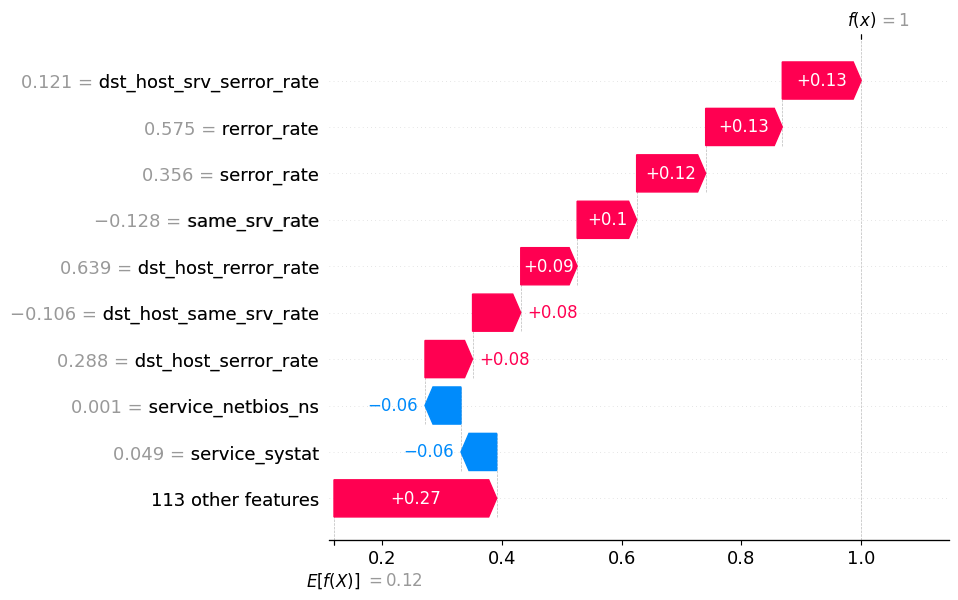

In [32]:
instance_index = 0  # Correcting the instance index because we have SHAP values for only one instance
class_index = 2

# Extracting explanation for the specific instance and class
explanation = shap.Explanation(
    values=shap_values[class_index][instance_index],
    base_values=explainer.expected_value[class_index],
    data=X_test.iloc[64],  # Keeping the actual instance index here to get the correct data point
    feature_names=X_test.columns.tolist()
)

# Plotting the waterfall plot
shap.waterfall_plot(explanation)

In [34]:
Dos_sample_p1 = X_test.iloc[64]

In [35]:
Dos_sample_p1[['dst_host_srv_serror_rate']] =0

In [36]:
Dos_sample_p1 = Dos_sample_p1.values.reshape(1, -1)

In [37]:
prediction = rf_classifier.predict(Dos_sample_p1)

In [38]:
explainer = shap.KernelExplainer(rf_classifier.predict, shap.sample(X_train, 50))

In [39]:
# Get SHAP values for the 34rd sample
shap_values = explainer.shap_values(X_test.iloc[:50])



  0%|          | 0/50 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklea

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklea

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklea

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

In [40]:
print(prediction)

[[0 0 1 0 0]]


In [41]:
# Mapping the binary class labels to class names
class_names = ['Normal', 'DoS', 'Probe', 'U2R', 'R2L']

# Predicting the class using RF classifier
prediction = rf_classifier.predict(Dos_sample_p1)
print(prediction)
# Converting binary class labels to class names
predicted_class = class_names[[i for i, x in enumerate(prediction[0]) if x][0]]

print(f"The RF predicted: {predicted_class}")
print("------------------------------------------")

# Getting the actual value from y_test
actual_value = Y_test[34]

# Converting actual binary class labels to class names
actual_class = class_names[[i for i, x in enumerate(actual_value) if x][0]]

# Printing the actual class name
print(f"Actual value: {actual_class}")


[[0 0 1 0 0]]
The RF predicted: Probe
------------------------------------------
Actual value: Probe


In [50]:
explainer = shap.KernelExplainer(rf_classifier.predict, shap.sample(X_train, 50))

In [51]:
# Get SHAP values for the 34rd sample
shap_values = explainer.shap_values(X_test.iloc[:50])



  0%|          | 0/50 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
divide by zero encountered in log
invalid value encountered in divide
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler

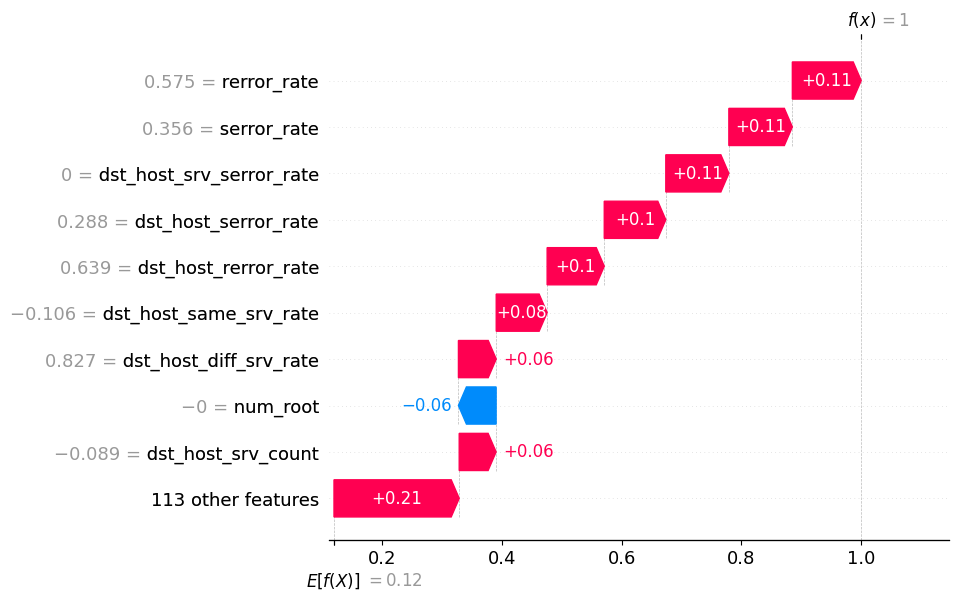

In [42]:
instance_index = 0  # Correcting the instance index because we have SHAP values for only one instance
class_index = 2

# Extracting explanation for the specific instance and class
explanation = shap.Explanation(
    values=shap_values[class_index][instance_index],
    base_values=explainer.expected_value[class_index],
    data=X_test.iloc[64],  # Keeping the actual instance index here to get the correct data point
    feature_names=X_test.columns.tolist()
)

# Plotting the waterfall plot
shap.waterfall_plot(explanation)

In [43]:
Dos_sample_p2 = X_test.iloc[64]

In [44]:
Dos_sample_p2[['dst_host_srv_serror_rate']] =0

In [45]:
Dos_sample_p2[['rerror_rate']] =0

In [46]:
Dos_sample_p2 = Dos_sample_p2.values.reshape(1, -1)

In [47]:
# Mapping the binary class labels to class names
class_names = ['Normal', 'DoS', 'Probe', 'U2R', 'R2L']

# Predicting the class using RF classifier
prediction = rf_classifier.predict(Dos_sample_p2)
print(prediction)
# Converting binary class labels to class names
predicted_class = class_names[[i for i, x in enumerate(prediction[0]) if x][0]]

print(f"The RF predicted: {predicted_class}")
print("------------------------------------------")

# Getting the actual value from y_test
actual_value = Y_test[64]

# Converting actual binary class labels to class names
actual_class = class_names[[i for i, x in enumerate(actual_value) if x][0]]

# Printing the actual class name
print(f"Actual value: {actual_class}")


[[0 0 1 0 0]]
The RF predicted: Probe
------------------------------------------
Actual value: Probe


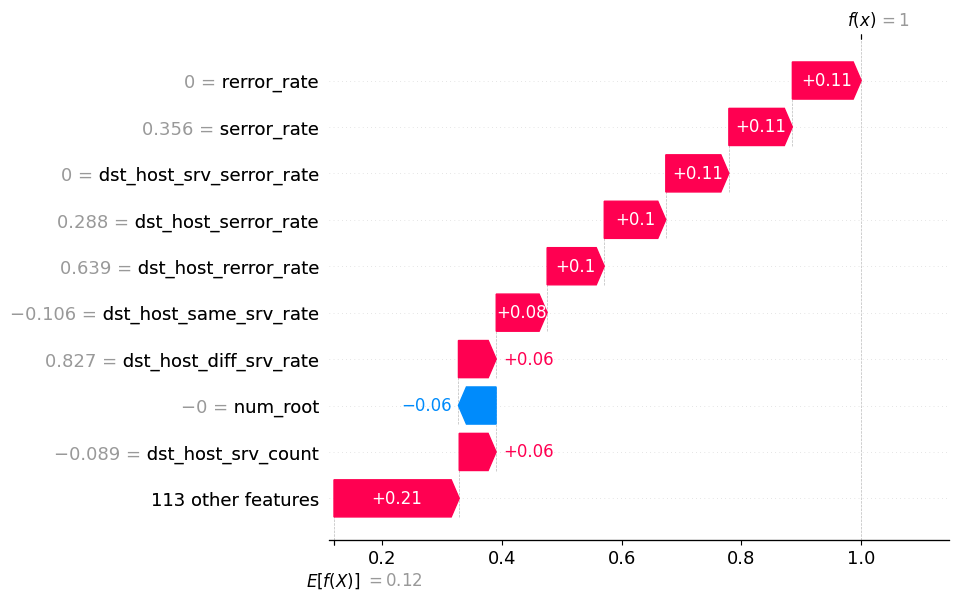

In [49]:
instance_index = 0  # Correcting the instance index because we have SHAP values for only one instance
class_index = 2

# Extracting explanation for the specific instance and class
explanation = shap.Explanation(
    values=shap_values[class_index][instance_index],
    base_values=explainer.expected_value[class_index],
    data=X_test.iloc[64],  # Keeping the actual instance index here to get the correct data point
    feature_names=X_test.columns.tolist()
)

# Plotting the waterfall plot
shap.waterfall_plot(explanation)

In [91]:
def waterfall_explanator(sample, instance_index=0):
    # datapoint to explain
    explainer = shap.TreeExplainer(rf)  
    prediction = rf.predict(sample)  # Prediction of the sample
    # Convert the numpy array to a Python list
    prediction_list = prediction[0].tolist()
    # Extract the index accordingly to prediction
    label = [[1,0,0,0,0], [0,1,0,0,0], [0,0,1,0,0], [0,0,0,1,0], [0,0,0,0,1],[0,0,0,0,0]]
    class_index = label.index(prediction_list)
    
    # Generating SHAP values
    shap_values = explainer.shap_values(sample)
    
    # Creating DataFrame of feature importances
    feature_importance = pd.DataFrame({
        'feature': sample.columns,
        'shap_values': shap_values[class_index][instance_index],
    })

    feature_importance['abs_shap_values'] = feature_importance['shap_values'].abs()
    feature_importance.sort_values(by=['abs_shap_values'], ascending=False, inplace=True)
    
    return prediction, feature_importance


In [96]:
def completeness_all(single_class_samples, number_samples, number_of_features_perturbation):
    Counter_all_samples = 0
    counter_samples_changed_class = 0
    print('------------------------------------------------')
    print('Initiating Completeness Experiment')
    print('------------------------------------------------')
    for i in range(number_samples):
        # Select sample
        sample = single_class_samples[i:i+1].copy()
        # Explain the original sample
        u = waterfall_explanator(sample)
        if u is None:  # Skip if the explanation is None (edge case where prediction is [0,0,0,0,0])
            continue
        print(u)
        # Select top k features from the original sample
        top_k_features = u[1]['feature'].head(number_of_features_perturbation).tolist()
        break_condition = False
        for feature in top_k_features:
            for j in range(11):  # 11 steps to include 1.0 (0 to 10)
                perturbation = j / 10.0  # Divide by 10 to get steps of 0.1
                temp_var = sample[feature].copy()
                sample[feature] = perturbation
                v = waterfall_explanator(sample)
                if v is None or not np.array_equal(v[0], u[0]):
                    break_condition = True
                    counter_samples_changed_class += 1
                    break
                else:
                    sample[feature] = temp_var  # Restore the original value
            if break_condition:
                break
        Counter_all_samples += 1
        progress = 100 * Counter_all_samples / number_samples
        if progress % 10 == 0:
            print('Progress', progress, '%')
    return counter_samples_changed_class, Counter_all_samples


In [97]:
import numpy as np
import pandas as pd

# Assume Y_test is a numpy array with shape (n_samples, 5) and X_test is a pandas DataFrame
# If Y_test is not a numpy array, convert it using Y_test = np.array(Y_test)

# Create masks for each class
masks = {
    'Normal': Y_test[:, 0] == 1,
    'DoS': Y_test[:, 1] == 1,
    'Probe': Y_test[:, 2] == 1,
    'U2R': Y_test[:, 3] == 1,
    'R2L': Y_test[:, 4] == 1
}

# Number of samples and features for perturbation to test
number_samples = 1000  # Change accordingly
number_of_features_perturbation = 5  # Change accordingly

# Iterate through each class
for attack_class, mask in masks.items():
    # Extract X_test samples for the current class
    class_samples = X_test[mask]
    
    print(f"Processing {attack_class} samples:")
    
    # Ensure there are enough samples to process
    if class_samples.shape[0] < number_samples:
        print(f"Not enough samples for {attack_class}. Adjusting number of samples to {class_samples.shape[0]}.")
        number_samples = class_samples.shape[0]
    
    # Run the completeness_all function for the current class samples
    changed, total = completeness_all(class_samples, number_samples, number_of_features_perturbation)
    
    print(f"Class {attack_class}: {changed} out of {total} samples changed classification.")
    print("----------------------------------------------------")


Processing Normal samples:
------------------------------------------------
Initiating Completeness Experiment
------------------------------------------------
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010823         0.010823
29           dst_host_srv_count    -0.008124         0.008124
28               dst_host_count    -0.006754         0.006754
20                    srv_count    -0.006461         0.006461
33  dst_host_srv_diff_host_rate    -0.005994         0.005994
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016664         0.016664
8                logged_in    -0.014494         0.014494
90            service_smtp     0.011493         0.011493
36    dst_host_rerror_rate     0.009605         0.009605
30  dst_host_same_srv_rate     0.007912         0.007912
..                     ...          ...              ...
70            service_link     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025323         0.025323
20                    srv_count    -0.012048         0.012048
8                     logged_in    -0.011683       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015151         0.015151
8                     logged_in    -0.011573         0.011573
20                    srv_count    -0.010726         0.010726
27           srv_diff_host_rate    -0.009203         0.009203
32  dst_host_same_src_port_rate    -0.009129         0.009129
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.011557         0.011557
8                      logged_in    -0.010617         0.010617
32   dst_host_same_src_port_rate    -0.010122         0.010122
2                      dst_bytes    -0.007962         0.007962
28                dst_host_count    -0.007139         0.007139
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023199         0.023199
20                    srv_count    -0.012410         0.012410
32  dst_host_same_src_port_rate    -0.011773         0.011773
8                     logged_in    -0.011409         0.011409
19                        count    -0.010400         0.010400
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025662         0.025662
20                     srv_count    -0.013527         0.013527
32   dst_host_same_src_port_rate    -0.011309         0.011309
8                      logged_in    -0.011125         0.011125
19                         count    -0.008686         0.008686
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024663         0.024663
20                     srv_count    -0.011689         0.011689
8                      logged_in    -0.011298         0.011298
32   dst_host_same_src_port_rate    -0.011269         0.011269
19                         count    -0.009649         0.009649
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       Protocol_type_tcp     0.006668         0.006668
20               srv_count    -0.006517         0.006517
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025578         0.025578
20                    srv_count    -0.013532         0.013532
32  dst_host_same_src_port_rate    -0.011326       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026445         0.026445
20                    srv_count    -0.011405         0.011405
8                     logged_in    -0.011250         0.011250
32  dst_host_same_src_port_rate    -0.010502         0.010502
19                        count    -0.009677         0.009677
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022589         0.022589
8                     logged_in    -0.011938         0.011938
20                    srv_count    -0.011723         0.011723
32  dst_host_same_src_port_rate    -0.010810         0.010810
19                        count    -0.009366         0.009366
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025493         0.025493
20                    srv_count    -0.013946         0.013946
32  dst_host_same_src_port_rate    -0.011560         0.011560
19                        count    -0.010768         0.010768
8                     logged_in    -0.010513         0.010513
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012575         0.012575
20                    srv_count    -0.011259         0.011259
27           srv_diff_host_rate    -0.010877       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024143         0.024143
20                    srv_count    -0.012797         0.012797
32  dst_host_same_src_port_rate    -0.012359         0.012359
8                     logged_in    -0.010418         0.010418
19                        count    -0.010122         0.010122
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007011         0.007011
19                  count    -0.005512         0.005512
120     service_http_2784     0.005482         0.005482
20              srv_count    -0.004674         0.004674
116     service_http_8001     0.004541         0.004541
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
17          is_host_login     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023256         0.023256
20                    srv_count    -0.013345         0.013345
32  dst_host_same_src_port_rate    -0.011588         0.011588
8                     logged_in    -0.010759         0.010759
19                        count    -0.010098         0.010098
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022843         0.022843
32  dst_host_same_src_port_rate    -0.010964         0.010964
8                     logged_in     0.008884         0.008884
20                    srv_count    -0.007991         0.007991
30       dst_host_same_srv_rate    -0.007974         0.007974
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.012654         0.012654
20                    srv_count    -0.010051         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024909         0.024909
8                      logged_in    -0.011456         0.011456
32   dst_host_same_src_port_rate    -0.011339         0.011339
20                     srv_count    -0.010983         0.010983
19                         count    -0.008423         0.008423
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022325         0.022325
20                    srv_count    -0.012230         0.012230
8                     logged_in    -0.011472         0.011472
32  dst_host_same_src_port_rate    -0.010484         0.010484
28               dst_host_count    -0.007222         0.007222
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022418         0.022418
20                    srv_count    -0.012939         0.012939
8                     logged_in    -0.010690         0.010690
32  dst_host_same_src_port_rate    -0.010645         0.010645
19                        count    -0.009841         0.009841
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023010         0.023010
8                      logged_in     0.009281         0.009281
30        dst_host_same_srv_rate    -0.008222         0.008222
20                     srv_count    -0.007190         0.007190
33   dst_host_srv_diff_host_rate    -0.006230         0.006230
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.016558         0.016558
20           srv_count    -0.014185         0.014185
19    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022068         0.022068
20                    srv_count    -0.012720         0.012720
8                     logged_in    -0.011314         0.011314
32  dst_host_same_src_port_rate    -0.010210         0.010210
19                        count    -0.009994         0.009994
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027115         0.027115
32  dst_host_same_src_port_rate    -0.011855         0.011855
19                        count    -0.011149         0.011149
8                     logged_in    -0.009334         0.009334
20                    srv_count    -0.009278         0.009278
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013934         0.013934
32  dst_host_same_src_port_rate    -0.011560         0.011560
19                        count    -0.010740         0.010740
8                     logged_in    -0.010513         0.010513
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021440         0.021440
20                    srv_count    -0.012633         0.012633
32  dst_host_same_src_port_rate    -0.010987         0.010987
8                     logged_in    -0.010965         0.010965
19                        count    -0.010005         0.010005
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022455         0.022455
20                    srv_count    -0.012956         0.012956
8                     logged_in    -0.010687         0.010687
32  dst_host_same_src_port_rate    -0.010653         0.010653
19                        count    -0.009943         0.009943
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025657         0.025657
20                     srv_count    -0.013436         0.013436
32   dst_host_same_src_port_rate    -0.011294         0.011294
8                      logged_in    -0.011249         0.011249
19                         count    -0.008576         0.008576
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025590         0.025590
20                    srv_count    -0.013531         0.013531
32  dst_host_same_src_port_rate    -0.011313         0.011313
8                     logged_in    -0.010712         0.010712
19                        count    -0.010460         0.010460
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015775         0.015775
8                     logged_in    -0.012574         0.012574
20                    srv_count    -0.010921         0.010921
28               dst_host_count    -0.010316         0.010316
32  dst_host_same_src_port_rate    -0.009863         0.009863
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.027240         0.027240
20                     srv_count    -0.014358         0.014358
32   dst_host_same_src_port_rate    -0.011755         0.011755
19                         count    -0.011309         0.011309
8                      logged_in    -0.010349         0.010349
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025084         0.025084
20                    srv_count    -0.012314         0.012314
8                     logged_in    -0.011387         0.011387
32  dst_host_same_src_port_rate    -0.010976         0.010976
19                        count    -0.010462         0.010462
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026547         0.026547
32   dst_host_same_src_port_rate    -0.011057         0.011057
8                      logged_in    -0.010731         0.010731
19                         count    -0.010570         0.010570
28                dst_host_count    -0.010062         0.010062
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023227         0.023227
20                    srv_count    -0.012394         0.012394
32  dst_host_same_src_port_rate    -0.011639         0.011639
8                     logged_in    -0.011443         0.011443
19                        count    -0.010341         0.010341
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027042         0.027042
20                    srv_count    -0.014713         0.014713
19                        count    -0.011506         0.011506
8                     logged_in    -0.009800         0.009800
32  dst_host_same_src_port_rate    -0.009699         0.009699
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024843         0.024843
20                    srv_count    -0.013092         0.013092
8                     logged_in    -0.011245         0.011245
32  dst_host_same_src_port_rate    -0.010515         0.010515
19                        count    -0.008301         0.008301
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027729         0.027729
20                    srv_count    -0.015129         0.015129
19                        count    -0.011686         0.011686
8                     logged_in    -0.009926         0.009926
32  dst_host_same_src_port_rate    -0.008899         0.008899
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025684         0.025684
20                     srv_count    -0.013450         0.013450
32   dst_host_same_src_port_rate    -0.011308         0.011308
8                      logged_in    -0.011254         0.011254
19                         count    -0.008623         0.008623
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024668         0.024668
20                    srv_count    -0.012273         0.012273
8                     logged_in    -0.011469         0.011469
32  dst_host_same_src_port_rate    -0.011041         0.011041
19                        count    -0.010565         0.010565
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023334         0.023334
20                    srv_count    -0.013244         0.013244
32  dst_host_same_src_port_rate    -0.011586         0.011586
8                     logged_in    -0.010718         0.010718
19                        count    -0.010186         0.010186
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016985         0.016985
29      dst_host_srv_count     0.006232         0.006232
34    dst_host_serror_rate     0.006014         0.006014
31  dst_host_diff_srv_rate     0.004880         0.004880
90            service_smtp    -0.004783         0.004783
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025714         0.025714
20                    srv_count    -0.013080         0.013080
32  dst_host_same_src_port_rate    -0.011832       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023262         0.023262
20                    srv_count    -0.013313         0.013313
32  dst_host_same_src_port_rate    -0.011540         0.011540
8                     logged_in    -0.010730         0.010730
19                        count    -0.010128         0.010128
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in    -0.014834         0.014834
90          service_smtp     0.014612         0.014612
29    dst_host_srv_count     0.007504         0.007504
34  dst_host_serror_rate     0.004355         0.004355
36  dst_host_rerror_rate    -0.003928         0.003928
..                   ...          ...              ...
70          service_link     0.000000         0.000000
63          service_http     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023266         0.023266
20                    srv_count    -0.012128         0.012128
32  dst_host_same_src_port_rate    -0.011726         0.011726
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023508         0.023508
32  dst_host_same_src_port_rate    -0.011135         0.011135
8                     logged_in     0.008896         0.008896
20                    srv_count    -0.008835         0.008835
19                        count    -0.008426         0.008426
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011997         0.011997
19                        count    -0.011339         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.028009         0.028009
20                    srv_count    -0.013810         0.013810
32  dst_host_same_src_port_rate    -0.012239         0.012239
8                     logged_in    -0.010368         0.010368
19                        count    -0.008914         0.008914
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015611         0.015611
19                        count    -0.012866         0.012866
32  dst_host_same_src_port_rate    -0.011793         0.011793
8                     logged_in    -0.010814         0.010814
28               dst_host_count    -0.008849         0.008849
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024875         0.024875
20                    srv_count    -0.013323         0.013323
32  dst_host_same_src_port_rate    -0.010920         0.010920
8                     logged_in    -0.010478         0.010478
19                        count    -0.010448         0.010448
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024740         0.024740
20                    srv_count    -0.013157         0.013157
8                     logged_in    -0.010550         0.010550
32  dst_host_same_src_port_rate    -0.010516         0.010516
19                        count    -0.009696         0.009696
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026888         0.026888
20                     srv_count    -0.012128         0.012128
32   dst_host_same_src_port_rate    -0.011229         0.011229
19                         count    -0.011205         0.011205
8                      logged_in    -0.010650         0.010650
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015926         0.015926
31  dst_host_diff_srv_rate     0.014537         0.014537
55           service_ecr_i    -0.008387         0.008387
30  dst_host_same_srv_rate     0.007431         0.007431
34    dst_host_serror_rate     0.006994         0.006994
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023150         0.023150
8                     logged_in     0.009395         0.009395
32  dst_host_same_src_port_rate    -0.008327       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021220         0.021220
32   dst_host_same_src_port_rate    -0.011220         0.011220
8                      logged_in     0.009305         0.009305
20                     srv_count    -0.008660         0.008660
19                         count    -0.008271         0.008271
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023531         0.023531
8                     logged_in     0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023198         0.023198
20                    srv_count    -0.012210         0.012210
32  dst_host_same_src_port_rate    -0.011793         0.011793
8                     logged_in    -0.011480         0.011480
19                        count    -0.010257         0.010257
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025390         0.025390
20                    srv_count    -0.012504         0.012504
8                     logged_in    -0.011238         0.011238
32  dst_host_same_src_port_rate    -0.011123         0.011123
19                        count    -0.010524         0.010524
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025447         0.025447
20                    srv_count    -0.013578         0.013578
32  dst_host_same_src_port_rate    -0.011418         0.011418
8                     logged_in    -0.010560         0.010560
19                        count    -0.010013         0.010013
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023867         0.023867
20                    srv_count    -0.012867         0.012867
19                        count    -0.011195         0.011195
32  dst_host_same_src_port_rate    -0.011086         0.011086
8                     logged_in    -0.010558         0.010558
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023508         0.023508
32  dst_host_same_src_port_rate    -0.011135         0.011135
8                     logged_in     0.008896         0.008896
20                    srv_count    -0.008835         0.008835
19                        count    -0.008426         0.008426
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023330         0.023330
20                    srv_count    -0.012838         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025242         0.025242
20                    srv_count    -0.012475         0.012475
8                     logged_in    -0.011409         0.011409
32  dst_host_same_src_port_rate    -0.010866         0.010866
19                        count    -0.010306         0.010306
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022396         0.022396
20                    srv_count    -0.012014         0.012014
8                     logged_in    -0.011345         0.011345
32  dst_host_same_src_port_rate    -0.011154         0.011154
19                        count    -0.010079         0.010079
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022111         0.022111
20                    srv_count    -0.011720         0.011720
8                     logged_in    -0.011560         0.011560
32  dst_host_same_src_port_rate    -0.011412         0.011412
19                        count    -0.010105         0.010105
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024643         0.024643
20                    srv_count    -0.013386         0.013386
8                     logged_in    -0.010668         0.010668
32  dst_host_same_src_port_rate    -0.010640         0.010640
19                        count    -0.010338         0.010338
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in    -0.012083         0.012083
20           srv_count    -0.011178         0.011178
27  srv_diff_host_rate    -0.011061         0.011061
19               count    -0.010315         0.010315
29  dst_host_srv_count    -0.009954         0.009954
..                 ...          ...              ...
16   num_outbound_cmds     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022805         0.022805
8                     logged_in     0.008820         0.008820
32  dst_host_same_src_port_rate    -0.008065         0.008065
20                    srv_count    -0.007760         0.007760
30       dst_host_same_srv_rate    -0.007721         0.007721
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.022489         0.022489
19                count    -0.010984         0.010984
20            s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025616         0.025616
20                    srv_count    -0.013538         0.013538
32  dst_host_same_src_port_rate    -0.011312         0.011312
8                     logged_in    -0.011142         0.011142
19                        count    -0.010119         0.010119
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022842         0.022842
32  dst_host_same_src_port_rate    -0.010999         0.010999
8                     logged_in     0.008930         0.008930
30       dst_host_same_srv_rate    -0.007950         0.007950
20                    srv_count    -0.007947         0.007947
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023209         0.023209
32  dst_host_same_src_port_rate    -0.010108         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019141         0.019141
8                     logged_in    -0.012154         0.012154
28               dst_host_count    -0.009352         0.009352
32  dst_host_same_src_port_rate    -0.009151         0.009151
90                 service_smtp     0.008705         0.008705
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022306         0.022306
20                    srv_count    -0.011900         0.011900
8                     logged_in    -0.011577         0.011577
32  dst_host_same_src_port_rate    -0.010859         0.010859
19                        count    -0.009909         0.009909
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022353         0.022353
8                      logged_in     0.009738         0.009738
32   dst_host_same_src_port_rate    -0.009674         0.009674
19                         count    -0.008103         0.008103
20                     srv_count    -0.007687         0.007687
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014320         0.014320
20                    srv_count    -0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022510         0.022510
20                    srv_count    -0.012594         0.012594
8                     logged_in    -0.010862         0.010862
32  dst_host_same_src_port_rate    -0.010510         0.010510
19                        count    -0.008995         0.008995
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025487         0.025487
20                    srv_count    -0.013254         0.013254
32  dst_host_same_src_port_rate    -0.011479         0.011479
19                        count    -0.010705         0.010705
8                     logged_in    -0.010433         0.010433
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025620         0.025620
20                     srv_count    -0.013857         0.013857
32   dst_host_same_src_port_rate    -0.011616         0.011616
19                         count    -0.010815         0.010815
8                      logged_in    -0.010473         0.010473
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024537         0.024537
20                    srv_count    -0.013191         0.013191
8                     logged_in    -0.010530         0.010530
32  dst_host_same_src_port_rate    -0.010451         0.010451
19                        count    -0.010033         0.010033
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024201         0.024201
20                    srv_count    -0.011582         0.011582
8                     logged_in    -0.011226         0.011226
32  dst_host_same_src_port_rate    -0.011007         0.011007
19                        count    -0.010021         0.010021
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023459         0.023459
8                      logged_in    -0.011827         0.011827
20                     srv_count    -0.011611         0.011611
32   dst_host_same_src_port_rate    -0.011546         0.011546
19                         count    -0.010807         0.010807
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.015865         0.015865
39            Protocol_type_tcp     0.010002         0.010002
30       dst_host_same_srv_rate    -0.007351         0.007351
90                 service_smtp    -0.005236         0.005236
32  dst_host_same_src_port_rate    -0.004677         0.004677
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023460         0.023460
20                    srv_count    -0.012887         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015049         0.015049
55           service_ecr_i    -0.007741         0.007741
39       Protocol_type_tcp     0.007298         0.007298
34    dst_host_serror_rate     0.006638         0.006638
30  dst_host_same_srv_rate     0.005907         0.005907
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026734         0.026734
20                    srv_count    -0.015300         0.015300
19                        count    -0.011987       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025179         0.025179
20                    srv_count    -0.012081         0.012081
32  dst_host_same_src_port_rate    -0.011748         0.011748
8                     logged_in    -0.011042         0.011042
19                        count    -0.010248         0.010248
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024606         0.024606
20                    srv_count    -0.013137         0.013137
8                     logged_in    -0.010684         0.010684
32  dst_host_same_src_port_rate    -0.010489         0.010489
19                        count    -0.010203         0.010203
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
29       dst_host_srv_count    -0.022709         0.022709
8                 logged_in     0.009053         0.009053
20                srv_count    -0.008926         0.008926
30   dst_host_same_srv_rate    -0.007646         0.007646
28           dst_host_count    -0.006963         0.006963
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023275         0.023275
20                    srv_count    -0.012387         0.012387
32  dst_host_same_src_port_rate    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 10.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024457         0.024457
20                    srv_count    -0.012688         0.012688
8                     logged_in    -0.011261         0.011261
32  dst_host_same_src_port_rate    -0.011187         0.011187
19                        count    -0.007737         0.007737
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023067         0.023067
8                     logged_in     0.009570         0.009570
32  dst_host_same_src_port_rate    -0.008913         0.008913
30       dst_host_same_srv_rate    -0.007986         0.007986
20                    srv_count    -0.007528         0.007528
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025576         0.025576
20                     srv_count    -0.013100      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012719         0.012719
30  dst_host_same_srv_rate    -0.007422         0.007422
31  dst_host_diff_srv_rate    -0.006808         0.006808
39       Protocol_type_tcp     0.006696         0.006696
20               srv_count    -0.006337         0.006337
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021301         0.021301
20                    srv_count    -0.012788         0.012788
19                        count    -0.010410       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012373         0.012373
28               dst_host_count    -0.011196         0.011196
32  dst_host_same_src_port_rate    -0.010029       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022810         0.022810
8                     logged_in     0.008937         0.008937
32  dst_host_same_src_port_rate    -0.008462         0.008462
30       dst_host_same_srv_rate    -0.007686         0.007686
20                    srv_count    -0.007211         0.007211
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021690         0.021690
20                    srv_count    -0.012695         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026176         0.026176
20                    srv_count    -0.012369         0.012369
32  dst_host_same_src_port_rate    -0.011765         0.011765
8                     logged_in    -0.011131         0.011131
19                        count    -0.010791         0.010791
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020618         0.020618
8                      logged_in    -0.012227         0.012227
32   dst_host_same_src_port_rate    -0.010185         0.010185
20                     srv_count    -0.009930         0.009930
90                  service_smtp     0.008909         0.008909
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014985         0.014985
20                    srv_count    -0.012559         0.012559
8                     logged_in    -0.011401         0.011401
19                        count    -0.010395         0.010395
32  dst_host_same_src_port_rate    -0.009749         0.009749
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.022421         0.022421
19                count    -0.011461         0.011461
20            srv_count    -0.009781         0.009781
8             logged_in    -0.009631         0.009631
61       service_gopher    -0.008194         0.008194
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
94       service_supdup     0.000000         0.000000
86      service_private     0.000000         0.000000
87   service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023249         0.023249
20                    srv_count    -0.012666         0.012666
32  dst_host_same_src_port_rate    -0.011770         0.011770
8                     logged_in    -0.011501         0.011501
19                        count    -0.010444         0.010444
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023287         0.023287
20                    srv_count    -0.012684         0.012684
32  dst_host_same_src_port_rate    -0.011597         0.011597
8                     logged_in    -0.010637         0.010637
19                        count    -0.010001         0.010001
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023392         0.023392
20                    srv_count    -0.012980         0.012980
8                     logged_in    -0.011367         0.011367
32  dst_host_same_src_port_rate    -0.011289         0.011289
19                        count    -0.009466         0.009466
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022118         0.022118
20                    srv_count    -0.013058         0.013058
32  dst_host_same_src_port_rate    -0.012787         0.012787
8                     logged_in    -0.011305         0.011305
19                        count    -0.010625         0.010625
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019583         0.019583
32   dst_host_same_src_port_rate    -0.010442         0.010442
8                      logged_in     0.009691         0.009691
20                     srv_count    -0.008029         0.008029
19                         count    -0.007221         0.007221
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022538         0.022538
20                    srv_count    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025620         0.025620
20                     srv_count    -0.013857         0.013857
32   dst_host_same_src_port_rate    -0.011616         0.011616
19                         count    -0.010815         0.010815
8                      logged_in    -0.010473         0.010473
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012951         0.012951
30  dst_host_same_srv_rate    -0.007247         0.007247
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023245         0.023245
20                    srv_count    -0.011683         0.011683
32  dst_host_same_src_port_rate    -0.011638       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023615         0.023615
32  dst_host_same_src_port_rate    -0.010364         0.010364
8                     logged_in     0.009523         0.009523
30       dst_host_same_srv_rate    -0.008654         0.008654
20                    srv_count    -0.007845         0.007845
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024582         0.024582
20                    srv_count    -0.012791         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
20                     srv_count    -0.013282         0.013282
32   dst_host_same_src_port_rate    -0.012099         0.012099
19                         count    -0.011641         0.011641
29            dst_host_srv_count    -0.011639         0.011639
8                      logged_in    -0.010077         0.010077
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022844         0.022844
20                    srv_count    -0.012682         0.012682
32  dst_host_same_src_port_rate    -0.011621         0.011621
8                     logged_in    -0.011459         0.011459
19                        count    -0.010038         0.010038
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024004         0.024004
20                    srv_count    -0.012802         0.012802
32  dst_host_same_src_port_rate    -0.011998         0.011998
8                     logged_in    -0.011037         0.011037
19                        count    -0.010747         0.010747
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024753         0.024753
20                    srv_count    -0.012518         0.012518
32  dst_host_same_src_port_rate    -0.011548         0.011548
8                     logged_in    -0.011282         0.011282
19                        count    -0.010836         0.010836
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       Protocol_type_tcp     0.006668         0.006668
20               srv_count    -0.006517         0.006517
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023011         0.023011
20                     srv_count    -0.011892         0.011892
32   dst_host_same_src_port_rate    -0.011391   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.023568         0.023568
19               count    -0.010702         0.010702
61      service_gopher    -0.010194         0.010194
8            logged_in    -0.009409         0.009409
20           srv_count    -0.007904         0.007904
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009889         0.009889
29            dst_host_srv_count    -0.009640         0.009640
28                dst_host_count    -0.009567         0.009567
32   dst_host_same_src_port_rate    -0.009517         0.009517
30        dst_host_same_srv_rate    -0.008897         0.008897
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
29       dst_host_srv_count    -0.022707         0.022707
8                 logged_in     0.009035         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025008         0.025008
20                    srv_count    -0.011752         0.011752
8                     logged_in    -0.011485         0.011485
32  dst_host_same_src_port_rate    -0.010638         0.010638
19                        count    -0.010263         0.010263
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013027         0.013027
30  dst_host_same_srv_rate    -0.007248         0.007248
31  dst_host_diff_srv_rate    -0.006878         0.006878
20               srv_count    -0.006839         0.006839
39       Protocol_type_tcp     0.006777         0.006777
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025616         0.025616
20                    srv_count    -0.013538         0.013538
32  dst_host_same_src_port_rate    -0.011312       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015897         0.015897
34  dst_host_serror_rate     0.005791         0.005791
29    dst_host_srv_count     0.005164         0.005164
90          service_smtp    -0.004407         0.004407
39     Protocol_type_tcp    -0.004337         0.004337
..                   ...          ...              ...
86       service_private     0.000000         0.000000
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024659         0.024659
20                    srv_count    -0.012355         0.012355
8                     logged_in    -0.011322         0.011322
32  dst_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023537         0.023537
32  dst_host_same_src_port_rate    -0.011169         0.011169
8                     logged_in    -0.010990         0.010990
19                        count    -0.009958         0.009958
28               dst_host_count    -0.009796         0.009796
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026356         0.026356
20                    srv_count    -0.013497         0.013497
19                        count    -0.011595         0.011595
8                     logged_in    -0.009888         0.009888
32  dst_host_same_src_port_rate    -0.008455         0.008455
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020508         0.020508
8                     logged_in    -0.012434         0.012434
32  dst_host_same_src_port_rate    -0.010192         0.010192
20                    srv_count    -0.009437         0.009437
28               dst_host_count    -0.009168         0.009168
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024757         0.024757
20                    srv_count    -0.012396         0.012396
8                     logged_in    -0.011367         0.011367
32  dst_host_same_src_port_rate    -0.010639         0.010639
19                        count    -0.009796         0.009796
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024731         0.024731
20                    srv_count    -0.013151         0.013151
8                     logged_in    -0.010663         0.010663
32  dst_host_same_src_port_rate    -0.010519         0.010519
19                        count    -0.009532         0.009532
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.011597         0.011597
30       dst_host_same_srv_rate     0.006068         0.006068
29           dst_host_srv_count     0.005056         0.005056
31       dst_host_diff_srv_rate    -0.005051         0.005051
32  dst_host_same_src_port_rate    -0.004243         0.004243
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.013723         0.013723
32  dst_host_same_src_port_rate    -0.010105         0.010105
8                     logged_in     0.009774         0.009774
20                    srv_count    -0.008615         0.008615
19                        count    -0.007808         0.007808
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023339         0.023339
20                    srv_count    -0.012333         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023351         0.023351
20                    srv_count    -0.013015         0.013015
32  dst_host_same_src_port_rate    -0.011299         0.011299
8                     logged_in    -0.010779         0.010779
19                        count    -0.009432         0.009432
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022313         0.022313
20                    srv_count    -0.011746         0.011746
8                     logged_in    -0.011493       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023170         0.023170
32  dst_host_same_src_port_rate    -0.010139         0.010139
20                    srv_count    -0.008942         0.008942
8                     logged_in     0.008802         0.008802
30       dst_host_same_srv_rate    -0.008000         0.008000
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022837         0.022837
32  dst_host_same_src_port_rate    -0.010253         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.024030         0.024030
20           srv_count    -0.013552         0.013552
19               count    -0.011693         0.011693
8            logged_in    -0.009706         0.009706
61      service_gopher    -0.009535         0.009535
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
44        service_auth     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023329         0.023329
20                    srv_count    -0.013241         0.013241
32  dst_host_same_src_port_rate    -0.011584         0.011584
8                     logged_in    -0.010699         0.010699
19                        count    -0.010181         0.010181
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022650         0.022650
8                     logged_in     0.008450         0.008450
32  dst_host_same_src_port_rate    -0.008444         0.008444
20                    srv_count    -0.007789         0.007789
30       dst_host_same_srv_rate    -0.007729         0.007729
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012719         0.012719
30  dst_host_same_srv_rate    -0.007422         0.007422
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024656         0.024656
20                    srv_count    -0.013543         0.013543
32  dst_host_same_src_port_rate    -0.010678         0.010678
8                     logged_in    -0.010526         0.010526
19                        count    -0.010379         0.010379
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022347         0.022347
20                    srv_count    -0.012002         0.012002
8                     logged_in    -0.011432         0.011432
32  dst_host_same_src_port_rate    -0.011131         0.011131
19                        count    -0.010200         0.010200
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025488         0.025488
20                    srv_count    -0.013958         0.013958
32  dst_host_same_src_port_rate    -0.011611         0.011611
19                        count    -0.010710         0.010710
8                     logged_in    -0.010534         0.010534
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015920         0.015920
8                     logged_in    -0.011547         0.011547
19                        count    -0.011017         0.011017
28               dst_host_count    -0.010041         0.010041
32  dst_host_same_src_port_rate    -0.009721         0.009721
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023546         0.023546
32  dst_host_same_src_port_rate    -0.011274         0.011274
8                     logged_in     0.009033         0.009033
20                    srv_count    -0.009004         0.009004
19                        count    -0.008282         0.008282
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024112         0.024112
32   dst_host_same_src_port_rate    -0.009879      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023070         0.023070
20                    srv_count    -0.011334         0.011334
32  dst_host_same_src_port_rate    -0.010246         0.010246
8                     logged_in    -0.010170         0.010170
19                        count    -0.009295         0.009295
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022384         0.022384
20                    srv_count    -0.012641         0.012641
8                     logged_in    -0.010752         0.010752
32  dst_host_same_src_port_rate    -0.010602         0.010602
19                        count    -0.009103         0.009103
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011341         0.011341
29           dst_host_srv_count     0.009642         0.009642
32  dst_host_same_src_port_rate    -0.007561         0.007561
2                     dst_bytes    -0.007521         0.007521
0                      duration    -0.006856         0.006856
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022757         0.022757
8                     logged_in     0.009581         0.009581
32  dst_host_same_src_port_rate    -0.009268         0.009268
30       dst_host_same_srv_rate    -0.007966         0.007966
20                    srv_count    -0.007020         0.007020
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022893         0.022893
8                     logged_in    -0.011313         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022387         0.022387
8                     logged_in    -0.011392         0.011392
20                    srv_count    -0.011289         0.011289
32  dst_host_same_src_port_rate    -0.010908         0.010908
19                        count    -0.010013         0.010013
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022435         0.022435
20                    srv_count    -0.013008         0.013008
8                     logged_in    -0.010678         0.010678
32  dst_host_same_src_port_rate    -0.010658         0.010658
19                        count    -0.009848         0.009848
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.028591         0.028591
20                     srv_count    -0.012258         0.012258
32   dst_host_same_src_port_rate    -0.011904         0.011904
8                      logged_in    -0.011288         0.011288
19                         count    -0.009304         0.009304
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
44                  service_auth     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024639         0.024639
20                    srv_count    -0.013341         0.013341
8                     logged_in    -0.010692         0.010692
32  dst_host_same_src_port_rate    -0.010690         0.010690
19                        count    -0.010259         0.010259
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026941         0.026941
20                    srv_count    -0.012307         0.012307
32  dst_host_same_src_port_rate    -0.011663         0.011663
19                        count    -0.011117         0.011117
8                     logged_in    -0.010945         0.010945
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       Protocol_type_tcp     0.006668         0.006668
20               srv_count    -0.006517         0.006517
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025657         0.025657
20                     srv_count    -0.013436         0.013436
32   dst_host_same_src_port_rate    -0.011294   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.027805         0.027805
20                     srv_count    -0.012059         0.012059
32   dst_host_same_src_port_rate    -0.011257         0.011257
8                      logged_in    -0.011082         0.011082
19                         count    -0.008834         0.008834
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
94                service_supdup     0.000000         0.000000
44                  service_auth     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024611         0.024611
20                    srv_count    -0.013147         0.013147
32  dst_host_same_src_port_rate    -0.010612         0.010612
8                     logged_in    -0.010562         0.010562
19                        count    -0.009708         0.009708
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022408         0.022408
20                    srv_count    -0.012979         0.012979
8                     logged_in    -0.010694         0.010694
32  dst_host_same_src_port_rate    -0.010659         0.010659
19                        count    -0.009841         0.009841
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025620         0.025620
20                     srv_count    -0.013857         0.013857
32   dst_host_same_src_port_rate    -0.011616   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024385         0.024385
20                    srv_count    -0.012324         0.012324
32  dst_host_same_src_port_rate    -0.011755         0.011755
8                     logged_in    -0.010820         0.010820
19                        count    -0.009926         0.009926
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.017373         0.017373
8                     logged_in    -0.011387         0.011387
32  dst_host_same_src_port_rate    -0.010068         0.010068
19                        count    -0.010065         0.010065
28               dst_host_count    -0.008418         0.008418
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026061         0.026061
20                     srv_count    -0.012360         0.012360
32   dst_host_same_src_port_rate    -0.011486         0.011486
8                      logged_in    -0.011282         0.011282
19                         count    -0.010987         0.010987
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023539         0.023539
20                    srv_count    -0.011684         0.011684
32  dst_host_same_src_port_rate    -0.011615         0.011615
8                     logged_in    -0.011437         0.011437
19                        count    -0.010309         0.010309
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020263         0.020263
20                    srv_count    -0.012096         0.012096
8                     logged_in    -0.011702         0.011702
32  dst_host_same_src_port_rate    -0.010297         0.010297
19                        count    -0.009641         0.009641
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015388         0.015388
31  dst_host_diff_srv_rate    -0.008763         0.008763
30  dst_host_same_srv_rate    -0.006088         0.006088
39       Protocol_type_tcp    -0.005315         0.005315
55           service_ecr_i    -0.004588         0.004588
..                     ...          ...              ...
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.005657         0.005657
8               logged_in    -0.004449         0.004449
21            serror_rate     0.003807         0.003807
20              srv_count    -0.003454         0.003454
116     service_http_8001     0.003044         0.003044
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
94         service_supdup     0.000000         0.000000
63           service_http     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025628         0.025628
20                    srv_count    -0.012933         0.012933
32  dst_host_same_src_port_rate    -0.011571         0.011571
8                     logged_in    -0.011292         0.011292
19                        count    -0.010790         0.010790
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013082         0.013082
39            Protocol_type_tcp     0.007502         0.007502
4                wrong_fragment    -0.007187         0.007187
31       dst_host_diff_srv_rate    -0.005797         0.005797
33  dst_host_srv_diff_host_rate    -0.004514         0.004514
..                          ...          ...              ...
86              service_private     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023535         0.023535
32  dst_host_same_src_port_rate    -0.011246         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023334         0.023334
20                    srv_count    -0.012699         0.012699
32  dst_host_same_src_port_rate    -0.011548         0.011548
8                     logged_in    -0.010605         0.010605
19                        count    -0.010012         0.010012
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.014107         0.014107
39   Protocol_type_tcp     0.010938         0.010938
55       service_ecr_i    -0.007721         0.007721
19               count    -0.005977         0.005977
28      dst_host_count    -0.004824         0.004824
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
94      service_supdup     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
86     service_private     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025620         0.025620
20                     srv_count    -0.013857         0.013857
32   dst_host_same_src_port_rate    -0.011616         0.011616
19                         count 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025522         0.025522
20                    srv_count    -0.013096         0.013096
32  dst_host_same_src_port_rate    -0.011588         0.011588
8                     logged_in    -0.011331         0.011331
19                        count    -0.010816         0.010816
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 20.0 %
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.025223         0.025223
20           srv_count    -0.013661         0.013661
19               count    -0.010782         0.010782
8            logged_in    -0.010270         0.010270
61      service_gopher    -0.009245         0.009245
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024877         0.024877
20                    srv_count    -0.011951         0.011951
8                     logged_in    -0.011286         0.011286
32  dst_host_same_src_port_rate    -0.010755         0.010755
19                        count    -0.010157         0.010157
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.027289         0.027289
20           srv_count    -0.015291         0.015291
19               count    -0.012215         0.012215
8            logged_in    -0.009562         0.009562
61      service_gopher    -0.006158         0.006158
..                 ...          ...              ...
87  service_remote_job     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012375         0.012375
29           dst_host_srv_count    -0.011013         0.011013
32  dst_host_same_src_port_rate    -0.010568         0.010568
8                     logged_in    -0.010435         0.010435
20                    srv_count    -0.007334         0.007334
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023525         0.023525
32  dst_host_same_src_port_rate    -0.011059         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006234         0.006234
120            service_http_2784     0.006069         0.006069
19                         count    -0.005899         0.005899
26                 diff_srv_rate    -0.005589         0.005589
32   dst_host_same_src_port_rate     0.005249         0.005249
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023132         0.023132
32   dst_host_same_src_port_rate    -0.011855         0.011855
8                      logged_in     0.009008         0.009008
20                     srv_count    -0.008167         0.008167
30        dst_host_same_srv_rate    -0.007991         0.007991
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023520         0.023520
8                     logged_in    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022590         0.022590
8                     logged_in    -0.011990         0.011990
20                    srv_count    -0.011429         0.011429
32  dst_host_same_src_port_rate    -0.010749         0.010749
28               dst_host_count    -0.009377         0.009377
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024574         0.024574
20                    srv_count    -0.011785         0.011785
32  dst_host_same_src_port_rate    -0.011561         0.011561
8                     logged_in    -0.011260         0.011260
19                        count    -0.010458         0.010458
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024689         0.024689
20                    srv_count    -0.013875         0.013875
8                     logged_in    -0.010743         0.010743
19                        count    -0.010675         0.010675
32  dst_host_same_src_port_rate    -0.010290         0.010290
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023287         0.023287
20                    srv_count    -0.012684         0.012684
32  dst_host_same_src_port_rate    -0.011597         0.011597
8                     logged_in    -0.010637         0.010637
19                        count    -0.010001         0.010001
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024957         0.024957
20                    srv_count    -0.011956         0.011956
8                     logged_in    -0.011184         0.011184
32  dst_host_same_src_port_rate    -0.010866         0.010866
19                        count    -0.010539         0.010539
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027470         0.027470
20                    srv_count    -0.013904         0.013904
32  dst_host_same_src_port_rate    -0.012303         0.012303
19                        count    -0.011031         0.011031
8                     logged_in    -0.010514         0.010514
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
29       dst_host_srv_count    -0.022708         0.022708
8                 logged_in     0.009035         0.009035
20                srv_count    -0.008912         0.008912
30   dst_host_same_srv_rate    -0.007676         0.007676
28           dst_host_count    -0.007010         0.007010
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023354         0.023354
20                    srv_count    -0.013015         0.013015
32  dst_host_same_src_port_rate    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026278         0.026278
20                    srv_count    -0.014112         0.014112
19                        count    -0.011578         0.011578
8                     logged_in    -0.009893         0.009893
32  dst_host_same_src_port_rate    -0.008486         0.008486
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
20                     srv_count    -0.008883         0.008883
34          dst_host_serror_rate     0.007952         0.007952
19                         count    -0.007170         0.007170
32   dst_host_same_src_port_rate     0.006015         0.006015
120            service_http_2784     0.004517         0.004517
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013030         0.013030
30  dst_host_same_srv_rate    -0.007252         0.007252
20               srv_count    -0.006783         0.006783
39       Protocol_type_tcp     0.006731         0.006731
31  dst_host_diff_srv_rate    -0.006679         0.006679
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024848         0.024848
20                    srv_count    -0.013127         0.013127
32  dst_host_same_src_port_rate    -0.010900       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024538         0.024538
32   dst_host_same_src_port_rate    -0.011058         0.011058
8                      logged_in    -0.010715         0.010715
19                         count    -0.010538         0.010538
61                service_gopher    -0.007952         0.007952
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025448         0.025448
20                    srv_count    -0.013595         0.013595
32  dst_host_same_src_port_rate    -0.011432         0.011432
8                     logged_in    -0.010560         0.010560
19                        count    -0.010016         0.010016
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015323         0.015323
20                    srv_count    -0.013369         0.013369
8                     logged_in    -0.011398         0.011398
32  dst_host_same_src_port_rate    -0.008868         0.008868
19                        count    -0.008598         0.008598
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022675         0.022675
32   dst_host_same_src_port_rate    -0.010606         0.010606
20                     srv_count    -0.008201         0.008201
8                      logged_in     0.008054         0.008054
30        dst_host_same_srv_rate    -0.007728         0.007728
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024642         0.024642
20                    srv_count    -0.013

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025793         0.025793
20                    srv_count    -0.013924         0.013924
32  dst_host_same_src_port_rate    -0.011773         0.011773
19                        count    -0.011457         0.011457
8                     logged_in    -0.010000         0.010000
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007072         0.007072
120            service_http_2784     0.005448         0.005448
19                         count    -0.004891         0.004891
32   dst_host_same_src_port_rate     0.004627         0.004627
116            service_http_8001     0.004593         0.004593
..                           ...          ...              ...
86               service_private     0.000000         0.000000
63                  service_http     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022841         0.022841
8                      logged_in     0.009581         0.009581
32   dst_host_same_src_port_rate    -0.008965         0.008965
30        dst_host_same_srv_rate    -0.007943         0.007943
20                     srv_count    -0.007035         0.007035
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021024         0.021024
8                     logged_in     0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023351         0.023351
20                    srv_count    -0.013176         0.013176
32  dst_host_same_src_port_rate    -0.011367         0.011367
8                     logged_in    -0.010648         0.010648
19                        count    -0.010423         0.010423
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024813         0.024813
20                    srv_count    -0.010915         0.010915
32  dst_host_same_src_port_rate    -0.010883         0.010883
8                     logged_in     0.009432         0.009432
19                        count    -0.008992         0.008992
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025391         0.025391
20                    srv_count    -0.012530         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
20           srv_count    -0.009505         0.009505
28      dst_host_count    -0.008300         0.008300
19               count    -0.008034         0.008034
8            logged_in     0.007961         0.007961
27  srv_diff_host_rate    -0.006017         0.006017
..                 ...          ...              ...
87  service_remote_job     0.000000         0.000000
86     service_private     0.000000         0.000000
63        service_http     0.000000         0.000000
68      service_kshell     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023283         0.023283
20                    srv_count    -0.011847         0.011847
32  dst_host_same_src_port_rate    -0.011529         0.011529
8                     logged_in    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015674         0.015674
30  dst_host_same_srv_rate     0.009032         0.009032
34    dst_host_serror_rate     0.007273         0.007273
29      dst_host_srv_count     0.006156         0.006156
36    dst_host_rerror_rate    -0.005247         0.005247
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025419         0.025419
20                    srv_count    -0.012789         0.012789
32  dst_host_same_src_port_rate    -0.011755       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.014367         0.014367
8            logged_in    -0.012412         0.012412
20           srv_count    -0.011661         0.011661
19               count    -0.009926         0.009926
27  srv_diff_host_rate    -0.009228         0.009228
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
94      service_supdup     0.000000         0.000000
17       is_host_login     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015938         0.015938
30  dst_host_same_srv_rate     0.007376         0.007376
34    dst_host_serror_rate     0.006890         0.006890
29      dst_host_srv_count     0.005776         0.005776
36    dst_host_rerror_rate    -0.004960         0.004960
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.014919         0.014919
19               count    -0.014260         0.014260
20           srv_count    -0.009484         0.009484
8            logged_in   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022837         0.022837
32  dst_host_same_src_port_rate    -0.010253         0.010253
8                     logged_in     0.008350         0.008350
20                    srv_count    -0.008150         0.008150
30       dst_host_same_srv_rate    -0.007671         0.007671
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022415         0.022415
20                    srv_count    -0.012987         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026184         0.026184
32   dst_host_same_src_port_rate    -0.011151         0.011151
19                         count    -0.010662         0.010662
8                      logged_in    -0.010647         0.010647
28                dst_host_count    -0.009169         0.009169
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026634         0.026634
20                    srv_count    -0.013208         0.013208
19                        count    -0.012007         0.012007
8                     logged_in    -0.010540         0.010540
32  dst_host_same_src_port_rate    -0.009668         0.009668
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023229         0.023229
20                    srv_count    -0.013032         0.013032
32  dst_host_same_src_port_rate    -0.011409         0.011409
8                     logged_in    -0.010785         0.010785
19                        count    -0.009398         0.009398
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025587         0.025587
20                    srv_count    -0.012781         0.012781
8                     logged_in    -0.012130         0.012130
32  dst_host_same_src_port_rate    -0.011493         0.011493
19                        count    -0.008219         0.008219
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016548         0.016548
8                     logged_in    -0.011629         0.011629
32  dst_host_same_src_port_rate    -0.010900         0.010900
19                        count    -0.010540         0.010540
28               dst_host_count    -0.008626         0.008626
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025620         0.025620
20                     srv_count    -0.013863         0.013863
32   dst_host_same_src_port_rate    -0.011618         0.011618
19                         count    -0.010812         0.010812
8                      logged_in    -0.010492         0.010492
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024658         0.024658
20                    srv_count    -0.013525         0.013525
32  dst_host_same_src_port_rate    -0.010665         0.010665
8                     logged_in    -0.010527         0.010527
19                        count    -0.010378         0.010378
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014925         0.014925
20                    srv_count    -0.013122         0.013122
19                        count    -0.012265         0.012265
8                     logged_in    -0.011556         0.011556
32  dst_host_same_src_port_rate    -0.011430         0.011430
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024861         0.024861
20                    srv_count    -0.013352         0.013352
32  dst_host_same_src_port_rate    -0.012390         0.012390
19                        count    -0.010257         0.010257
8                     logged_in    -0.010235         0.010235
..                          ...          ...              ...
86              service_private     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006788         0.006788
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006652         0.006652
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023634         0.023634
20                    srv_count    -0.012546         0.012546
32  dst_host_same_src_port_rate    -0.011765       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024603         0.024603
32   dst_host_same_src_port_rate    -0.010703         0.010703
19                         count    -0.010273         0.010273
8                      logged_in    -0.010170         0.010170
28                dst_host_count    -0.008888         0.008888
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016752         0.016752
30  dst_host_same_srv_rate     0.008237         0.008237
34    dst_host_serror_rate     0.006185         0.006185
29      dst_host_srv_count     0.006068         0.006068
36    dst_host_rerror_rate    -0.004827         0.004827
..                     ...          ...              ...
70            service_link     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023329         0.023329
20                    srv_count    -0.013241         0.013241
32  dst_host_same_src_port_rate    -0.011584       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.025160         0.025160
20            srv_count    -0.013344         0.013344
19                count    -0.013252         0.013252
8             logged_in    -0.009449         0.009449
61       service_gopher    -0.007286         0.007286
..                  ...          ...              ...
102   service_uucp_path     0.000000         0.000000
44         service_auth     0.000000         0.000000
94       service_supdup     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025578         0.025578
20                    srv_count    -0.013532         0.013532
32  dst_host_same_src_port_rate    -0.011326         0.011326
8                     logged_in    -0.010670         0.010670
19                        count    -0.009867         0.009867
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023498         0.023498
32  dst_host_same_src_port_rate    -0.011394         0.011394
8                     logged_in     0.009040         0.009040
20                    srv_count    -0.008827         0.008827
19                        count    -0.008360         0.008360
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007318         0.007318
34   dst_host_serror_rate     0.006499         0.006499
20       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023260         0.023260
20                    srv_count    -0.012521         0.012521
32  dst_host_same_src_port_rate    -0.011281         0.011281
8                     logged_in    -0.010879         0.010879
19                        count    -0.009354         0.009354
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.014127         0.014127
19                        count    -0.011770         0.011770
20                    srv_count    -0.011510         0.011510
8                     logged_in    -0.009805         0.009805
32  dst_host_same_src_port_rate    -0.008498         0.008498
..                          ...          ...              ...
86              service_private     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
94               service_supdup     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021915         0.021915
8                     logged_in    -0.012770         0.012770
32  dst_host_same_src_port_rate    -0.011139         0.011139
20                    srv_count    -0.009227         0.009227
19                        count    -0.007044         0.007044
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025508         0.025508
20                    srv_count    -0.012282         0.012282
32  dst_host_same_src_port_rate    -0.011868         0.011868
19                        count    -0.011276         0.011276
8                     logged_in    -0.011117         0.011117
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022522         0.022522
20                    srv_count    -0.012596         0.012596
8                     logged_in    -0.010904         0.010904
32  dst_host_same_src_port_rate    -0.010502         0.010502
19                        count    -0.009549         0.009549
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025208         0.025208
20                    srv_count    -0.012779         0.012779
8                     logged_in    -0.011207         0.011207
32  dst_host_same_src_port_rate    -0.010996         0.010996
19                        count    -0.010548         0.010548
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022438         0.022438
20                    srv_count    -0.011992         0.011992
8                     logged_in    -0.011445         0.011445
32  dst_host_same_src_port_rate    -0.010877         0.010877
19                        count    -0.010014         0.010014
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026486         0.026486
20                    srv_count    -0.012716         0.012716
32  dst_host_same_src_port_rate    -0.011725         0.011725
19                        count    -0.011151         0.011151
8                     logged_in    -0.010438         0.010438
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025512         0.025512
20                    srv_count    -0.013777         0.013777
32  dst_host_same_src_port_rate    -0.011497         0.011497
19                        count    -0.010842         0.010842
8                     logged_in    -0.010523         0.010523
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023283         0.023283
20                    srv_count    -0.013337         0.013337
32  dst_host_same_src_port_rate    -0.011591         0.011591
8                     logged_in    -0.010735         0.010735
19                        count    -0.010097         0.010097
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.027177         0.027177
20                     srv_count    -0.014674         0.014674
32   dst_host_same_src_port_rate    -0.012532         0.012532
19                         count    -0.011109         0.011109
8                      logged_in    -0.010036         0.010036
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006807         0.006807
19                  count    -0.006349         0.006349
120     service_http_2784     0.004887         0.004887
20              srv_count    -0.004664         0.004664
116     service_http_8001     0.004579         0.004579
..                    ...          ...              ...
16      num_outbound_cmds     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022162         0.022162
8                      logged_in     0.009765         0.009765
32   dst_host_same_src_port_rate    -0.009682         0.009682
19                         count    -0.008085         0.008085
20                     srv_count    -0.007825         0.007825
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.015056         0.015056
90            service_smtp     0.014144         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014495         0.014495
29           dst_host_srv_count     0.011049         0.011049
28               dst_host_count    -0.010477         0.010477
8                     logged_in    -0.009501         0.009501
32  dst_host_same_src_port_rate    -0.009485         0.009485
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024656         0.024656
20                    srv_count    -0.013543         0.013543
32  dst_host_same_src_port_rate    -0.010678         0.010678
8                     logged_in    -0.010526         0.010526
19                        count    -0.010379         0.010379
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022446         0.022446
20                    srv_count    -0.011580         0.011580
8                     logged_in    -0.011445         0.011445
32  dst_host_same_src_port_rate    -0.011160         0.011160
19                        count    -0.010022         0.010022
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.026091         0.026091
20            srv_count    -0.013702         0.013702
19                count    -0.013350         0.013350
8             logged_in    -0.009346         0.009346
61       service_gopher    -0.009229         0.009229
..                  ...          ...              ...
102   service_uucp_path     0.000000         0.000000
44         service_auth     0.000000         0.000000
94       service_supdup     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015486         0.015486
8                     logged_in    -0.012462         0.012462
20                    srv_count    -0.011376         0.011376
32  dst_host_same_src_por

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026420         0.026420
8                     logged_in    -0.012000         0.012000
20                    srv_count    -0.011554         0.011554
32  dst_host_same_src_port_rate    -0.011307         0.011307
28               dst_host_count    -0.009014         0.009014
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025493         0.025493
20                    srv_count    -0.013946         0.013946
32  dst_host_same_src_port_rate    -0.011560         0.011560
19                        count    -0.010768         0.010768
8                     logged_in    -0.010513         0.010513
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022518         0.022518
8                     logged_in    -0.010623         0.010623
32  dst_host_same_src_port_rate    -0.010014         0.010014
19                        count    -0.009540         0.009540
28               dst_host_count    -0.008051         0.008051
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022764         0.022764
8                     logged_in     0.008933         0.008933
32  dst_host_same_src_port_rate    -0.008511         0.008511
30       dst_host_same_srv_rate    -0.007680         0.007680
20                    srv_count    -0.007153         0.007153
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022911         0.022911
20                    srv_count    -0.011853         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.028593         0.028593
20                    srv_count    -0.012386         0.012386
32  dst_host_same_src_port_rate    -0.011910         0.011910
8                     logged_in    -0.011161         0.011161
19                        count    -0.009344         0.009344
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024643         0.024643
20                    srv_count    -0.013552         0.013552
32  dst_host_same_src_port_rate    -0.010678         0.010678
8                     logged_in    -0.010505         0.010505
19                        count    -0.010406         0.010406
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013030         0.013030
30  dst_host_same_srv_rate    -0.007252         0.007252
20               srv_count    -0.006783         0.006783
39       Protocol_type_tcp     0.006731         0.006731
31  dst_host_diff_srv_rate    -0.006679         0.006679
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.005954         0.005954
19                  count    -0.005715         0.005715
20              srv_count    -0.004943         0.004943
116     servi

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024549         0.024549
20                    srv_count    -0.011428         0.011428
32  dst_host_same_src_port_rate    -0.011420         0.011420
8                     logged_in    -0.011304         0.011304
19                        count    -0.009749         0.009749
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023956         0.023956
32  dst_host_same_src_port_rate    -0.011162         0.011162
8                     logged_in    -0.010996         0.010996
28               dst_host_count    -0.010606         0.010606
19                        count    -0.009866         0.009866
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025992         0.025992
20                    srv_count    -0.013585         0.013585
19                        count    -0.011472         0.011472
8                     logged_in    -0.009953         0.009953
32  dst_host_same_src_port_rate    -0.009027         0.009027
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019510         0.019510
8                     logged_in    -0.011739         0.011739
20                    srv_count    -0.010479         0.010479
32  dst_host_same_src_port_rate    -0.010308         0.010308
19                        count    -0.008320         0.008320
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024838         0.024838
20                    srv_count    -0.013198         0.013198
32  dst_host_same_src_port_rate    -0.010903         0.010903
8                     logged_in    -0.010739         0.010739
19                        count    -0.010385         0.010385
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.023529         0.023529
20           srv_count    -0.013121         0.013121
19               count    -0.011818         0.011818
8            logged_in    -0.009820         0.009820
61      service_gopher    -0.007666         0.007666
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024483         0.024483
20                    srv_count    -0.011612         0.011612
32  dst_host_same_src_port_rate    -0.011227         0.011227
8                     logged_in    -0.010849         0.010849
19                        count    -0.010713         0.010713
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022909         0.022909
8                     logged_in    -0.010635         0.010635
32  dst_host_same_src_port_rate    -0.010211         0.010211
19                        count    -0.009935         0.009935
28               dst_host_count    -0.008020         0.008020
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022320         0.022320
20                    srv_count    -0.011618         0.011618
8                     logged_in    -0.011555         0.011555
32  dst_host_same_src_port_rate    -0.011097         0.011097
19                        count    -0.010102         0.010102
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.027176         0.027176
20            srv_count    -0.014412         0.014412
19                count    -0.012285         0.012285
8             logged_in    -0.009452         0.009452
61       service_gopher    -0.007790         0.007790
..                  ...          ...              ...
66     service_iso_tsap     0.000000         0.000000
63         service_http     0.000000         0.000000
44         service_auth     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 30.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025488         0.025488
20                    srv_count    -0.013958         0.013958
32  dst_host_same_src_port_rate    -0.011611         0.011611
19                        count    -0.010710         0.010710
8                     logged_in    -0.010534         0.010534
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012504         0.012504
30  dst_host_same_srv_rate     0.007026         0.007026
29      dst_host_srv_count     0.005000         0.005000
19                   count     0.004722         0.004722
34    dst_host_serror_rate     0.004142         0.004142
..                     ...          ...              ...
63            service_http     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024655         0.024655
32  dst_host_same_src_port_rate    -0.011819         0.011819
19                        count    -0.010184       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026590         0.026590
20                    srv_count    -0.013314         0.013314
19                        count    -0.012247         0.012247
8                     logged_in    -0.010495         0.010495
32  dst_host_same_src_port_rate    -0.009634         0.009634
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.017197         0.017197
8                logged_in     0.016780         0.016780
36    dst_host_rerror_rate     0.006897         0.006897
34    dst_host_serror_rate     0.006027         0.006027
1                src_bytes    -0.005381         0.005381
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006817         0.006817
19                  count    -0.006098         0.006098
120     service_http_2784     0.004883         0.004883
116     servi

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012614         0.012614
27            srv_diff_host_rate    -0.010746         0.010746
20                     srv_count    -0.009804         0.009804
19                         count    -0.009243         0.009243
32   dst_host_same_src_port_rate    -0.009124         0.009124
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
44                  service_auth     0.000000         0.000000
63                  service_http     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026888         0.026888
20                     srv_count    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012951         0.012951
30  dst_host_same_srv_rate    -0.007247         0.007247
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023380         0.023380
20                    srv_count    -0.011704         0.011704
32  dst_host_same_src_port_rate    -0.011604       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.017124         0.017124
39            Protocol_type_tcp     0.010517         0.010517
33  dst_host_srv_diff_host_rate    -0.005288         0.005288
90                 service_smtp    -0.004926         0.004926
34         dst_host_serror_rate     0.004890         0.004890
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
98                service_tim_i     0.000000         0.000000
70                 service_link     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022408         0.022408
20                    srv_count    -0.012987         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022417         0.022417
20                    srv_count    -0.013017         0.013017
8                     logged_in    -0.010696         0.010696
32  dst_host_same_src_port_rate    -0.010654         0.010654
19                        count    -0.009850         0.009850
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022419         0.022419
20                    srv_count    -0.012840         0.012840
8                     logged_in    -0.010838         0.010838
32  dst_host_same_src_port_rate    -0.010648         0.010648
19                        count    -0.009833         0.009833
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024365         0.024365
20                    srv_count    -0.013424         0.013424
8                     logged_in    -0.010981         0.010981
32  dst_host_same_src_port_rate    -0.010912         0.010912
19                        count    -0.010628         0.010628
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023672         0.023672
8                     logged_in    -0.011880         0.011880
20                    srv_count    -0.011489         0.011489
32  dst_host_same_src_port_rate    -0.011373         0.011373
28               dst_host_count    -0.009916         0.009916
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025347         0.025347
20                    srv_count    -0.011986         0.011986
8                     logged_in    -0.011810         0.011810
32  dst_host_same_src_port_rate    -0.010722         0.010722
28               dst_host_count    -0.009992         0.009992
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014905         0.014905
31  dst_host_diff_srv_rate    -0.010173         0.010173
36    dst_host_rerror_rate     0.009914         0.009914
30  dst_host_same_srv_rate     0.009502         0.009502
34    dst_host_serror_rate     0.008198         0.008198
..                     ...          ...              ...
63            service_http     0.000000         0.000000
94          service_supdup     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022842         0.022842
32  dst_host_same_src_port_rate    -0.010962         0.010962
8                     logged_in     0.008884       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024643         0.024643
20                    srv_count    -0.013552         0.013552
32  dst_host_same_src_port_rate    -0.010678         0.010678
8                     logged_in    -0.010505         0.010505
19                        count    -0.010406         0.010406
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015317         0.015317
19                        count    -0.011283         0.011283
8                     logged_in    -0.010096         0.010096
32  dst_host_same_src_port_rate    -0.009010         0.009010
90                 service_smtp     0.007607         0.007607
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025083         0.025083
20                    srv_count    -0.012501         0.012501
8                     logged_in    -0.011365         0.011365
32  dst_host_same_src_port_rate    -0.010935         0.010935
19                        count    -0.010511         0.010511
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024423         0.024423
20                    srv_count    -0.013463         0.013463
32  dst_host_same_src_port_rate    -0.011365         0.011365
8                     logged_in    -0.010582         0.010582
19                        count    -0.010413         0.010413
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022336         0.022336
20                    srv_count    -0.011581         0.011581
8                     logged_in    -0.011335         0.011335
32  dst_host_same_src_port_rate    -0.011072         0.011072
19                        count    -0.009800         0.009800
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.009573         0.009573
27       srv_diff_host_rate    -0.008180         0.008180
28           dst_host_count    -0.007702         0.007702
8                 logged_in     0.007429         0.007429
30   dst_host_same_srv_rate    -0.007338         0.007338
..                      ...          ...              ...
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.016612         0.016612
20           srv_count    -0.014093         0.014093
19               count    -0.013532         0.013532
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007988         0.007988
20              srv_count    -0.007345         0.007345
34   dst_host_serror_rate     0.005919         0.005919
120     service_http_2784     0.004989         0.004989
8               logged_in    -0.004653         0.004653
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
94         service_supdup     0.000000         0.000000
17          is_host_login     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006788         0.006788
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006652         0.006652
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013021         0.013021
30  dst_host_same_srv_rate    -0.007250         0.007250
20               srv_count    -0.006785         0.006785
39       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016777         0.016777
29    dst_host_srv_count     0.005726         0.005726
34  dst_host_serror_rate     0.005660         0.005660
39     Protocol_type_tcp    -0.004781         0.004781
90          service_smtp    -0.004512         0.004512
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024610         0.024610
20                    srv_count    -0.013157         0.013157
32  dst_host_same_src_port_rate    -0.010597         0.010597
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025657         0.025657
20                     srv_count    -0.013169         0.013169
32   dst_host_same_src_port_rate    -0.011294         0.011294
8                      logged_in    -0.011249         0.011249
19                         count    -0.008084         0.008084
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024511         0.024511
20                    srv_count    -0.013408         0.013408
32  dst_host_same_src_port_rate    -0.012377         0.012377
19                        count    -0.010432         0.010432
8                     logged_in    -0.010348         0.010348
..                          ...          ...              ...
86              service_private     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016335         0.016335
39     Protocol_type_tcp    -0.005202         0.005202
34  dst_host_serror_rate     0.004643         0.004643
29    dst_host_srv_count    -0.004191         0.004191
90          service_smtp    -0.003979         0.003979
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
63          service_http     0.000000         0.000000
70          service_link     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022897         0.022897
32   dst_host_same_src_port_rate    -0.009764         0.009764
20                     srv_count    -0.008683         0.008683
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.014557         0.014557
90             service_smtp     0.013617         0.013617
31   dst_host_diff_srv_rate     0.008431         0.008431
30   dst_host_same_srv_rate    -0.007693         0.007693
28           dst_host_count    -0.005456         0.005456
..                      ...          ...              ...
44             service_auth     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026464         0.026464
20                    srv_count    -0.012485         0.012485
32  dst_host_same_src_port_rate    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024652         0.024652
20                    srv_count    -0.013554         0.013554
32  dst_host_same_src_port_rate    -0.010796         0.010796
8                     logged_in    -0.010505         0.010505
19                        count    -0.010423         0.010423
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021686         0.021686
8                     logged_in    -0.011953         0.011953
32  dst_host_same_src_port_rate    -0.010853         0.010853
28               dst_host_count    -0.010448         0.010448
90                 service_smtp     0.009848         0.009848
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025598         0.025598
20                    srv_count    -0.012774         0.012774
8                     logged_in    -0.011515         0.011515
32  dst_host_same_src_port_rate    -0.011419         0.011419
19                        count    -0.010583         0.010583
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023464         0.023464
20                    srv_count    -0.012892         0.012892
8                     logged_in    -0.011483         0.011483
32  dst_host_same_src_port_rate    -0.011279         0.011279
19                        count    -0.007924         0.007924
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023928         0.023928
32  dst_host_same_src_port_rate    -0.010720         0.010720
8                     logged_in    -0.010131         0.010131
19                        count    -0.009769         0.009769
28               dst_host_count    -0.008124         0.008124
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
29       dst_host_srv_count    -0.022464         0.022464
8                 logged_in     0.008956         0.008956
20                srv_count    -0.008789         0.008789
30   dst_host_same_srv_rate    -0.007649         0.007649
28           dst_host_count    -0.007046         0.007046
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025448         0.025448
20                    srv_count    -0.013595         0.013595
32  dst_host_same_src_port_rate    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022892         0.022892
32   dst_host_same_src_port_rate    -0.009764         0.009764
20                     srv_count    -0.008683         0.008683
8                      logged_in     0.008224         0.008224
30        dst_host_same_srv_rate    -0.007730         0.007730
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024653         0.024653
20                    srv_count    -0.013

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023351         0.023351
20                    srv_count    -0.012969         0.012969
32  dst_host_same_src_port_rate    -0.011303         0.011303
8                     logged_in    -0.010895         0.010895
19                        count    -0.009288         0.009288
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023557         0.023557
8                      logged_in     0.009579         0.009579
32   dst_host_same_src_port_rate    -0.009307         0.009307
30        dst_host_same_srv_rate    -0.008212         0.008212
19                         count    -0.008065         0.008065
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022954         0.022954
8                     logged_in    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022576         0.022576
20                    srv_count    -0.012462         0.012462
8                     logged_in    -0.011440         0.011440
32  dst_host_same_src_port_rate    -0.010524         0.010524
19                        count    -0.007544         0.007544
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022767         0.022767
8                     logged_in     0.008938         0.008938
32  dst_host_same_src_port_rate    -0.008470         0.008470
30       dst_host_same_srv_rate    -0.007679         0.007679
20                    srv_count    -0.007146         0.007146
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012065         0.012065
8                     logged_in    -0.010796         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022288         0.022288
20                    srv_count    -0.012217         0.012217
8                     logged_in    -0.011925         0.011925
32  dst_host_same_src_port_rate    -0.010234         0.010234
19                        count    -0.008843         0.008843
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027213         0.027213
20                    srv_count    -0.014578         0.014578
19                        count    -0.011278         0.011278
32  dst_host_same_src_port_rate    -0.010600         0.010600
8                     logged_in    -0.010367         0.010367
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.022672         0.022672
19               count    -0.011324         0.011324
20           srv_count    -0.011098         0.011098
8            logged_in    -0.010127         0.010127
61      service_gopher    -0.009335         0.009335
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
94      service_supdup     0.000000         0.000000
17       is_host_login     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.024505         0.024505
20           srv_count    -0.012376         0.012376
19               count    -0.011979         0.011979
8            logged_in    -0.009936         0.009936
61      service_gopher    -0.007125         0.007125
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.018153         0.018153
19                        count    -0.012264         0.012264
8                     logged_in    -0.011627         0.011627
32  dst_host_same_src_port_rate    -0.009964         0.009964
20                    srv_count    -0.007690         0.007690
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count     0.014180         0.014180
8            logged_in    -0.010505         0.010505
27  srv_diff_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023274         0.023274
20                    srv_count    -0.012322         0.012322
32  dst_host_same_src_port_rate    -0.011813         0.011813
8                     logged_in    -0.011404         0.011404
19                        count    -0.010521         0.010521
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022828         0.022828
20                    srv_count    -0.011375         0.011375
8                     logged_in    -0.011348         0.011348
32  dst_host_same_src_port_rate    -0.010971         0.010971
28               dst_host_count    -0.009704         0.009704
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024806         0.024806
20                    srv_count    -0.013052         0.013052
8                     logged_in    -0.011245         0.011245
32  dst_host_same_src_port_rate    -0.010509         0.010509
19                        count    -0.008245         0.008245
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023405         0.023405
32  dst_host_same_src_port_rate    -0.012518         0.012518
20                    srv_count    -0.012077         0.012077
8                     logged_in    -0.010639         0.010639
19                        count    -0.009864         0.009864
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024412         0.024412
20                    srv_count    -0.013551         0.013551
32  dst_host_same_src_port_rate    -0.011907         0.011907
8                     logged_in    -0.010641         0.010641
19                        count    -0.010639         0.010639
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016598         0.016598
34  dst_host_serror_rate     0.005840         0.005840
29    dst_host_srv_count     0.005402         0.005402
90          service_smtp    -0.004558         0.004558
39     Protocol_type_tcp    -0.004403         0.004403
..                   ...          ...              ...
86       service_private     0.000000         0.000000
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013934         0.013934
32  dst_host_same_src_port_rate    -0.011560         0.011560
19           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013916         0.013916
39     Protocol_type_tcp     0.009521         0.009521
55         service_ecr_i    -0.007797         0.007797
34  dst_host_serror_rate     0.005835         0.005835
19                 count    -0.005403         0.005403
..                   ...          ...              ...
86       service_private     0.000000         0.000000
68        service_kshell     0.000000         0.000000
70          service_link     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025578         0.025578
20                    srv_count    -0.013532         0.013532
32  dst_host_same_src_port_rate    -0.011326         0.011326
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025371         0.025371
20                    srv_count    -0.012671         0.012671
32  dst_host_same_src_port_rate    -0.011606         0.011606
8                     logged_in    -0.011513         0.011513
19                        count    -0.010858         0.010858
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.025063         0.025063
20           srv_count    -0.014216         0.014216
19               count    -0.011548         0.011548
8            logged_in    -0.009894         0.009894
61      service_gopher    -0.009719         0.009719
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
44        service_auth     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025502         0.025502
20                    srv_count    -0.012660         0.012660
32  dst_host_same_src_port_rate    -0.011334         0.011334
8                     logged_in    -0.011138         0.011138
28               dst_host_count    -0.010764         0.010764
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025620         0.025620
20                     srv_count    -0.013857         0.013857
32   dst_host_same_src_port_rate    -0.011616         0.011616
19                         count    -0.010815         0.010815
8                      logged_in    -0.010473         0.010473
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025852         0.025852
20                     srv_count    -0.012756         0.012756
8                      logged_in    -0.011418         0.011418
32   dst_host_same_src_port_rate    -0.011408         0.011408
19                         count    -0.010899         0.010899
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015910         0.015910
30  dst_host_same_srv_rate     0.008299         0.008299
34    dst_host_serror_rate     0.005792         0.005792
39       Protocol_type_tcp    -0.004842         0.004842
29      dst_host_srv_count    -0.004230         0.004230
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023248         0.023248
20                    srv_count    -0.011853         0.011853
32  dst_host_same_src_port_rate    -0.011624       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025316         0.025316
20                    srv_count    -0.012192         0.012192
8                     logged_in    -0.011236         0.011236
32  dst_host_same_src_port_rate    -0.011152         0.011152
19                        count    -0.010482         0.010482
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024731         0.024731
20                    srv_count    -0.013151         0.013151
8                     logged_in    -0.010663         0.010663
32  dst_host_same_src_port_rate    -0.010519         0.010519
19                        count    -0.009532         0.009532
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024660         0.024660
20                    srv_count    -0.013587         0.013587
32  dst_host_same_src_port_rate    -0.010826         0.010826
8                     logged_in    -0.010501         0.010501
19                        count    -0.010416         0.010416
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.018260         0.018260
8                     logged_in    -0.012322         0.012322
20                    srv_count    -0.010431         0.010431
32  dst_host_same_src_port_rate    -0.010401         0.010401
19                        count    -0.008851         0.008851
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011713         0.011713
27           srv_diff_host_rate    -0.010838         0.010838
20                    srv_count    -0.010663         0.010663
32  dst_host_same_src_port_rate    -0.009047         0.009047
19                        count    -0.008659         0.008659
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022436         0.022436
20                    srv_count    -0.011822         0.011822
8                     logged_in    -0.011423         0.011423
32  dst_host_same_src_port_rate    -0.011066         0.011066
19                        count    -0.010096         0.010096
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012951         0.012951
30  dst_host_same_srv_rate    -0.007247         0.007247
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023002         0.023002
32   dst_host_same_src_port_rate    -0.008745         0.008745
8                      logged_in     0.008342   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.024233         0.024233
19               count    -0.012237         0.012237
20           srv_count    -0.012191         0.012191
8            logged_in    -0.010194         0.010194
27  srv_diff_host_rate    -0.006353         0.006353
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022512         0.022512
20                    srv_count    -0.012269         0.012269
32  dst_host_same_src_port_rate    -0.010844         0.010844
8                     logged_in    -0.010742         0.010742
19                        count    -0.009777         0.009777
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022298         0.022298
20                    srv_count    -0.011512         0.011512
8                     logged_in    -0.011379         0.011379
32  dst_host_same_src_port_rate    -0.010897         0.010897
19                        count    -0.009973         0.009973
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022394         0.022394
20                    srv_count    -0.012595         0.012595
8                     logged_in    -0.010751         0.010751
32  dst_host_same_src_port_rate    -0.010588         0.010588
19                        count    -0.009105         0.009105
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022167         0.022167
8                      logged_in     0.009761         0.009761
32   dst_host_same_src_port_rate    -0.009683         0.009683
19                         count    -0.008088         0.008088
20                     srv_count    -0.007895         0.007895
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022805         0.022805
32  dst_host_same_src_port_rate    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
29       dst_host_srv_count    -0.022710         0.022710
8                 logged_in     0.009053         0.009053
20                srv_count    -0.008926         0.008926
30   dst_host_same_srv_rate    -0.007646         0.007646
28           dst_host_count    -0.006963         0.006963
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022339         0.022339
20                    srv_count    -0.011925         0.011925
8                     logged_in    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024838         0.024838
20                    srv_count    -0.013198         0.013198
32  dst_host_same_src_port_rate    -0.010903         0.010903
8                     logged_in    -0.010739         0.010739
19                        count    -0.010385         0.010385
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022866         0.022866
32   dst_host_same_src_port_rate    -0.009816         0.009816
20                     srv_count    -0.008691         0.008691
8                      logged_in     0.008205         0.008205
30        dst_host_same_srv_rate    -0.007705         0.007705
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023702         0.023702
20                    srv_count    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016566         0.016566
30  dst_host_same_srv_rate     0.008343         0.008343
34    dst_host_serror_rate     0.006873         0.006873
29      dst_host_srv_count     0.005932         0.005932
36    dst_host_rerror_rate    -0.004936         0.004936
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022303         0.022303
20                    srv_count    -0.011506         0.011506
8                     logged_in    -0.011383       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025620         0.025620
20                     srv_count    -0.013863         0.013863
32   dst_host_same_src_port_rate    -0.011618         0.011618
19                         count    -0.010812         0.010812
8                      logged_in    -0.010492         0.010492
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
29       dst_host_srv_count    -0.022707         0.022707
8                 logged_in     0.009035         0.009035
20                srv_count    -0.008912         0.008912
30   dst_host_same_srv_rate    -0.007676         0.007676
28           dst_host_count    -0.007010         0.007010
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025741         0.025741
20                     srv_count    -0.012013         0.012013
32   dst_host_same_src_port_rate    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024759         0.024759
20                    srv_count    -0.012645         0.012645
8                     logged_in    -0.011393         0.011393
32  dst_host_same_src_port_rate    -0.010795         0.010795
19                        count    -0.009974         0.009974
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024746         0.024746
20                    srv_count    -0.012638         0.012638
8                     logged_in    -0.010792         0.010792
32  dst_host_same_src_port_rate    -0.010404         0.010404
19                        count    -0.010103         0.010103
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021674         0.021674
8                     logged_in    -0.011758         0.011758
32  dst_host_same_src_port_rate    -0.011438         0.011438
20                    srv_count    -0.011149         0.011149
28               dst_host_count    -0.009213         0.009213
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015256         0.015256
8                     logged_in    -0.012459         0.012459
20                    srv_count    -0.010431         0.010431
32  dst_host_same_src_port_rate    -0.009223         0.009223
19                        count    -0.009158         0.009158
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009560         0.009560
20                    srv_count    -0.009093         0.009093
8                     logged_in     0.007369         0.007369
28               dst_host_count    -0.006610         0.006610
32  dst_host_same_src_port_rate    -0.005653         0.005653
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023189         0.023189
32  dst_host_same_src_port_rate    -0.011631         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026333         0.026333
20                    srv_count    -0.013572         0.013572
19                        count    -0.011575         0.011575
8                     logged_in    -0.009972         0.009972
32  dst_host_same_src_port_rate    -0.008473         0.008473
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024803         0.024803
20                    srv_count    -0.012924         0.012924
19                        count    -0.010672         0.010672
8                     logged_in    -0.010114         0.010114
32  dst_host_same_src_port_rate    -0.008858         0.008858
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024876         0.024876
20                    srv_count    -0.012395         0.012395
8                     logged_in    -0.011334         0.011334
32  dst_host_same_src_port_rate    -0.011027         0.011027
19                        count    -0.010566         0.010566
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023881         0.023881
20                    srv_count    -0.013403         0.013403
8                     logged_in    -0.011110         0.011110
32  dst_host_same_src_port_rate    -0.011065         0.011065
19                        count    -0.010644         0.010644
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007138         0.007138
116            service_http_8001     0.005074         0.005074
120            service_http_2784     0.004965         0.004965
8                      logged_in    -0.004172         0.004172
32   dst_host_same_src_port_rate     0.003520         0.003520
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023333         0.023333
20                    srv_count    -0.013

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013201         0.013201
32  dst_host_same_src_port_rate    -0.011702         0.011702
8                     logged_in    -0.011342         0.011342
19                        count    -0.010802         0.010802
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
29      dst_host_srv_count    -0.027575         0.027575
20               srv_count    -0.014126         0.014126
19                   count    -0.012115         0.012115
8                logged_in    -0.009645         0.009645
30  dst_host_same_srv_rate    -0.006347         0.006347
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022817         0.022817
32  dst_host_same_src_port_rate    -0.009615         0.009615
8                     logged_in     0.009194         0.009194
20                    srv_count    -0.007806         0.007806
30       dst_host_same_srv_rate    -0.007672         0.007672
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022560         0.022560
32   dst_host_same_src_port_rate    -0.009998      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024571         0.024571
32   dst_host_same_src_port_rate    -0.011727         0.011727
20                     srv_count    -0.011550         0.011550
8                      logged_in    -0.011161         0.011161
19                         count    -0.010467         0.010467
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026074         0.026074
20                    srv_count    -0.012383         0.012383
8                     logged_in    -0.011824         0.011824
32  dst_host_same_src_port_rate    -0.011332         0.011332
28               dst_host_count    -0.009966         0.009966
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022886         0.022886
20                    srv_count    -0.012155         0.012155
8                     logged_in    -0.011409       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026168         0.026168
32   dst_host_same_src_port_rate    -0.010771         0.010771
19                         count    -0.010507         0.010507
8                      logged_in    -0.009848         0.009848
20                     srv_count    -0.008462         0.008462
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022806         0.022806
32  dst_host_same_src_port_rate    -0.011015         0.011015
8                     logged_in     0.008912         0.008912
20                    srv_count    -0.007999         0.007999
30       dst_host_same_srv_rate    -0.007975         0.007975
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024122         0.024122
32   dst_host_same_src_port_rate    -0.009878      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024191         0.024191
32   dst_host_same_src_port_rate    -0.011833         0.011833
30        dst_host_same_srv_rate    -0.008743         0.008743
19                         count    -0.008672         0.008672
8                      logged_in     0.007887         0.007887
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
44                  service_auth     0.000000         0.000000
63                  service_http     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025442         0.025442
20                    srv_count    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022396         0.022396
20                    srv_count    -0.012814         0.012814
8                     logged_in    -0.010692         0.010692
32  dst_host_same_src_port_rate    -0.010648         0.010648
19                        count    -0.009895         0.009895
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.012504         0.012504
19                        count    -0.012420         0.012420
8                     logged_in    -0.011482         0.011482
32  dst_host_same_src_port_rate    -0.011091         0.011091
28               dst_host_count    -0.008986         0.008986
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023229         0.023229
20                    srv_count    -0.012577         0.012577
32  dst_host_same_src_port_rate    -0.011791         0.011791
8                     logged_in    -0.011473         0.011473
19                        count    -0.010408         0.010408
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009649         0.009649
20                    srv_count    -0.009474         0.009474
8                     logged_in     0.007302         0.007302
28               dst_host_count    -0.006619         0.006619
32  dst_host_same_src_port_rate    -0.006122         0.006122
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025016         0.025016
20                    srv_count    -0.012225         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025103         0.025103
20                    srv_count    -0.012427         0.012427
8                     logged_in    -0.011230         0.011230
32  dst_host_same_src_port_rate    -0.011058         0.011058
19                        count    -0.010690         0.010690
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025451         0.025451
61               service_gopher    -0.011200         0.011200
19                        count    -0.010484         0.010484
8                     logged_in    -0.009631         0.009631
32  dst_host_same_src_port_rate    -0.008546         0.008546
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023782         0.023782
20                    srv_count    -0.013050         0.013050
19                        count    -0.010949         0.010949
8                     logged_in    -0.010160         0.010160
32  dst_host_same_src_port_rate    -0.008352         0.008352
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.010199         0.010199
20           srv_count    -0.009702         0.009702
29  dst_host_srv_count    -0.007672         0.007672
28      dst_host_count    -0.006831         0.006831
8            logged_in     0.005979         0.005979
..                 ...          ...              ...
86     service_private     0.000000         0.000000
63        service_http     0.000000         0.000000
44        service_auth     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024766         0.024766
20                    srv_count    -0.013395         0.013395
32  dst_host_same_src_port_rate    -0.010892         0.010892
8                     logged_in    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023928         0.023928
32  dst_host_same_src_port_rate    -0.010720         0.010720
8                     logged_in    -0.010131         0.010131
19                        count    -0.009768         0.009768
28               dst_host_count    -0.008124         0.008124
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.005305         0.005305
8               logged_in     0.005152         0.005152
116     service_http_8001     0.003186         0.003186
120     service_http_2784     0.003032         0.003032
20              srv_count    -0.002756         0.002756
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
44           service_auth     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024554         0.024554
20                    srv_count    -0.012369         0.012369
8                     logged_in    -0.011538         0.011538
3

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025456         0.025456
20                    srv_count    -0.011933         0.011933
8                     logged_in    -0.011176         0.011176
32  dst_host_same_src_port_rate    -0.010803         0.010803
19                        count    -0.010474         0.010474
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022852         0.022852
32  dst_host_same_src_port_rate    -0.010253         0.010253
8                     logged_in     0.008350         0.008350
20                    srv_count    -0.008229         0.008229
30       dst_host_same_srv_rate    -0.007673         0.007673
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023306         0.023306
8                     logged_in     0.009695         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022511         0.022511
20                    srv_count    -0.011731         0.011731
8                     logged_in    -0.011444         0.011444
32  dst_host_same_src_port_rate    -0.011110         0.011110
19                        count    -0.010054         0.010054
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022511         0.022511
20                    srv_count    -0.012581         0.012581
8                     logged_in    -0.010851         0.010851
32  dst_host_same_src_port_rate    -0.010498         0.010498
19                        count    -0.008977         0.008977
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026648         0.026648
20                     srv_count    -0.012168         0.012168
8                      logged_in    -0.011825         0.011825
32   dst_host_same_src_port_rate    -0.011307         0.011307
28                dst_host_count    -0.010119         0.010119
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012772         0.012772
20            srv_count    -0.010918         0.010918
8             logged_in    -0.009381         0.009381
2             dst_bytes    -0.008773         0.008773
61       service_gopher    -0.008016         0.008016
..                  ...          ...              ...
44         service_auth     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000
63         service_http     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
87   service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022985         0.022985
8                      logged_in     0.009281         0.009281
30        dst_host_same_srv_rate    -0.008222         0.008222
20                     srv_count    -0.007218         0.007218
33   dst_host_srv_diff_host_rate    -0.006230         0.006230
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.024715         0.024715
20           srv_count    -0.013022         0.013022
19    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022424         0.022424
8                     logged_in     0.009006         0.009006
32  dst_host_same_src_port_rate    -0.008720         0.008720
20                    srv_count    -0.007266         0.007266
30       dst_host_same_srv_rate    -0.006801         0.006801
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025074         0.025074
8                     logged_in    -0.011586         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025500         0.025500
20                    srv_count    -0.013176         0.013176
32  dst_host_same_src_port_rate    -0.011652         0.011652
8                     logged_in    -0.011321         0.011321
19                        count    -0.010846         0.010846
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016648         0.016648
30  dst_host_same_srv_rate     0.008137         0.008137
31  dst_host_diff_srv_rate     0.007160         0.007160
29      dst_host_srv_count     0.006885         0.006885
34    dst_host_serror_rate     0.006338         0.006338
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025039         0.025039
20                    srv_count    -0.013139         0.013139
32  dst_host_same_src_port_rate    -0.012421         0.012421
19                        count    -0.010562         0.010562
8                     logged_in    -0.010301         0.010301
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024655         0.024655
20                    srv_count    -0.013553         0.013553
32  dst_host_same_src_port_rate    -0.010678         0.010678
8                     logged_in    -0.010504         0.010504
19                        count    -0.010406         0.010406
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022474         0.022474
20                    srv_count    -0.012833         0.012833
8                     logged_in    -0.010798         0.010798
32  dst_host_same_src_port_rate    -0.010579         0.010579
19                        count    -0.010052         0.010052
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025278         0.025278
20                    srv_count    -0.011902         0.011902
8                     logged_in    -0.011164         0.011164
32  dst_host_same_src_port_rate    -0.010743         0.010743
19                        count    -0.010335         0.010335
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027597         0.027597
19                        count    -0.011757         0.011757
32  dst_host_same_src_port_rate    -0.009883         0.009883
8                     logged_in    -0.009844         0.009844
20                    srv_count    -0.008910         0.008910
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027050         0.027050
20                    srv_count    -0.012101         0.012101
32  dst_host_same_src_port_rate    -0.011327         0.011327
8                     logged_in    -0.010609         0.010609
19                        count    -0.010157         0.010157
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026174         0.026174
32   dst_host_same_src_port_rate    -0.010523         0.010523
19                         count    -0.010291         0.010291
8                      logged_in    -0.010021         0.010021
28                dst_host_count    -0.008546         0.008546
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023172         0.023172
32  dst_host_same_src_port_rate    -0.010160         0.010160
20                    srv_count    -0.008942         0.008942
8                     logged_in     0.008802         0.008802
30       dst_host_same_srv_rate    -0.007956         0.007956
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022956         0.022956
32   dst_host_same_src_port_rate    -0.009740      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022577         0.022577
20                    srv_count    -0.012517         0.012517
8                     logged_in    -0.011441         0.011441
32  dst_host_same_src_port_rate    -0.010478         0.010478
19                        count    -0.007743         0.007743
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       Protocol_type_tcp     0.006668         0.006668
20               srv_count    -0.006517         0.006517
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025662         0.025662
20                     srv_count    -0.013527         0.013527
32   dst_host_same_src_port_rate    -0.011309   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023266         0.023266
20                    srv_count    -0.012180         0.012180
32  dst_host_same_src_port_rate    -0.011806         0.011806
8                     logged_in    -0.011443         0.011443
19                        count    -0.010423         0.010423
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
29       dst_host_srv_count    -0.019725         0.019725
20                srv_count    -0.009235         0.009235
8                 logged_in     0.008524         0.008524
28           dst_host_count    -0.008283         0.008283
30   dst_host_same_srv_rate    -0.006453         0.006453
..                      ...          ...              ...
94           service_supdup     0.000000         0.000000
63             service_http     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015712         0.015712
34    dst_host_serror_rate     0.005720         0.005720
29      dst_host_srv_count     0.005523         0.0055

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025225         0.025225
8                     logged_in    -0.011998         0.011998
20                    srv_count    -0.011693         0.011693
32  dst_host_same_src_port_rate    -0.010729         0.010729
28               dst_host_count    -0.009832         0.009832
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023578         0.023578
20                    srv_count    -0.012500         0.012500
8                     logged_in    -0.011730         0.011730
32  dst_host_same_src_port_rate    -0.011576         0.011576
19                        count    -0.010165         0.010165
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022910         0.022910
32   dst_host_same_src_port_rate    -0.009439         0.009439
8                      logged_in     0.008675         0.008675
20                     srv_count    -0.008592         0.008592
30        dst_host_same_srv_rate    -0.007667         0.007667
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.023505         0.023505
19               count    -0.011161         0.011161
61    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025573         0.025573
20                     srv_count    -0.013347         0.013347
32   dst_host_same_src_port_rate    -0.011620         0.011620
19                         count    -0.010681         0.010681
8                      logged_in    -0.010409         0.010409
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025566         0.025566
20                    srv_count    -0.012582         0.012582
32  dst_host_same_src_port_rate    -0.011615         0.011615
8                     logged_in    -0.011268         0.011268
19                        count    -0.010747         0.010747
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016566         0.016566
34    dst_host_serror_rate     0.006645         0.006645
29      dst_host_srv_count     0.006045         0.006045
30  dst_host_same_srv_rate     0.004944         0.004944
36    dst_host_rerror_rate    -0.004678         0.004678
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012923         0.012923
30  dst_host_same_srv_rate    -0.007417         0.007417
31  dst_host_diff_srv_rate    -0.006924         0.006924
39       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024554         0.024554
20                    srv_count    -0.013161         0.013161
32  dst_host_same_src_port_rate    -0.010636         0.010636
8                     logged_in    -0.010556         0.010556
19                        count    -0.009974         0.009974
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025659         0.025659
20                    srv_count    -0.012232         0.012232
8                     logged_in    -0.011777         0.011777
32  dst_host_same_src_port_rate    -0.011365         0.011365
28               dst_host_count    -0.009809         0.009809
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023253         0.023253
20                    srv_count    -0.013360         0.013360
32  dst_host_same_src_port_rate    -0.011588         0.011588
8                     logged_in    -0.010736         0.010736
19                        count    -0.010128         0.010128
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022610         0.022610
32   dst_host_same_src_port_rate    -0.010647         0.010647
20                     srv_count    -0.008096         0.008096
8                      logged_in     0.008082         0.008082
30        dst_host_same_srv_rate    -0.007729         0.007729
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025671         0.025671
20                    srv_count    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 50.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022317         0.022317
20                    srv_count    -0.012674         0.012674
8                     logged_in    -0.010752         0.010752
32  dst_host_same_src_port_rate    -0.010639         0.010639
19                        count    -0.009376         0.009376
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026852         0.026852
20                    srv_count    -0.012220         0.012220
32  dst_host_same_src_port_rate    -0.011555         0.011555
8                     logged_in    -0.011001         0.011001
19                        count    -0.010934         0.010934
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in    -0.012173         0.012173
20           srv_count    -0.010940         0.010940
28      dst_host_count    -0.010839         0.010839
19               count   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014348         0.014348
31  dst_host_diff_srv_rate    -0.009483         0.009483
39       Protocol_type_tcp     0.008612         0.008612
30  dst_host_same_srv_rate    -0.007412         0.007412
55           service_ecr_i    -0.004769         0.004769
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016410         0.016410
0               duration    -0.007477         0.007477
34  dst_host_serror_rate     0.007256         0.007256
90          service_smtp    -0.005853         0.005853
39     Protocol_type_tcp     0.005656         0.005656
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
70          service_link     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.018272         0.018272
26           diff_srv_rate     0.008232         0.008232
34    dst_host_serror_rate     0.008109         0.008109
30  dst_host_same_srv_rate     0.007810         0.007810
29      dst_host_srv_count     0.007237         0.007237
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024771         0.024771
20                    srv_count    -0.012990         0.012990
8                     logged_in    -0.011252       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022407         0.022407
20                    srv_count    -0.013005         0.013005
8                     logged_in    -0.010702         0.010702
32  dst_host_same_src_port_rate    -0.010654         0.010654
19                        count    -0.009819         0.009819
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026100         0.026100
32  dst_host_same_src_port_rate    -0.011174         0.011174
8                     logged_in    -0.010758         0.010758
19                        count    -0.010616         0.010616
28               dst_host_count    -0.010278         0.010278
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014603         0.014603
19                         count    -0.010739         0.010739
20                     srv_count    -0.008859   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016269         0.016269
32  dst_host_same_src_port_rate    -0.012559         0.012559
19                        count    -0.011124         0.011124
20                    srv_count    -0.010997         0.010997
8                     logged_in    -0.010617         0.010617
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022842         0.022842
32  dst_host_same_src_port_rate    -0.011000         0.011000
8                     logged_in     0.008930         0.008930
30       dst_host_same_srv_rate    -0.007950         0.007950
20                    srv_count    -0.007947         0.007947
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024146         0.024146
8                     logged_in    -0.011817         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022586         0.022586
32  dst_host_same_src_port_rate    -0.010471         0.010471
8                     logged_in    -0.010241         0.010241
19                        count    -0.009326         0.009326
28               dst_host_count    -0.008080         0.008080
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027076         0.027076
20                    srv_count    -0.015198         0.015198
19                        count    -0.011639         0.011639
8                     logged_in    -0.009884         0.009884
32  dst_host_same_src_port_rate    -0.009672         0.009672
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014780         0.014780
20                    srv_count    -0.013789         0.013789
8                     logged_in    -0.011574         0.011574
19                        count    -0.010822         0.010822
32  dst_host_same_src_port_rate    -0.009822         0.009822
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022454         0.022454
20                    srv_count    -0.013002         0.013002
32  dst_host_same_src_port_rate    -0.010727         0.010727
8                     logged_in    -0.010667         0.010667
19                        count    -0.009831         0.009831
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024737         0.024737
20                    srv_count    -0.013189         0.013189
32  dst_host_same_src_port_rate    -0.012799         0.012799
19                        count    -0.010840         0.010840
8                     logged_in    -0.010813         0.010813
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022558         0.022558
32   dst_host_same_src_port_rate    -0.012208         0.012208
30        dst_host_same_srv_rate    -0.008683         0.008683
19                         count    -0.008607         0.008607
8                      logged_in     0.007820         0.007820
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012494         0.012494
8                     logged_in    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.015449         0.015449
29            dst_host_srv_count     0.011522         0.011522
32   dst_host_same_src_port_rate    -0.010351         0.010351
8                      logged_in    -0.008956         0.008956
20                     srv_count    -0.006806         0.006806
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023351         0.023351
20                    srv_count    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.015177         0.015177
39            Protocol_type_tcp    -0.004876         0.004876
34         dst_host_serror_rate     0.004714         0.004714
33  dst_host_srv_diff_host_rate    -0.003791         0.003791
55                service_ecr_i    -0.003751         0.003751
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023265         0.023265
20                    srv_count    -0.012122         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024634         0.024634
20                    srv_count    -0.012234         0.012234
8                     logged_in    -0.011349         0.011349
32  dst_host_same_src_port_rate    -0.010729         0.010729
19                        count    -0.010393         0.010393
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006706         0.006706
20              srv_count    -0.005042         0.005042
25          same_srv_rate    -0.004746         0.004746
116     service_http_8001     0.004651         0.004651
120     service_http_2784     0.004499         0.004499
..                    ...          ...              ...
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
94         service_supdup     0.000000         0.000000
86        service_private     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025878         0.025878
20                     srv_count    -0.012249         0.012249
32   dst_host_same_src_port_rate    -0.011298         0.011298
8                      logged_in    -0.011252         0.011252
19                         count    -0.010788         0.010788
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025213         0.025213
61               service_gopher    -0.010788         0.010788
19                        count    -0.010368         0.010368
8                     logged_in    -0.010088         0.010088
32  dst_host_same_src_port_rate    -0.009879         0.009879
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023764         0.023764
32  dst_host_same_src_port_rate    -0.012730         0.012730
19                        count    -0.008649         0.008649
8                     logged_in     0.008622         0.008622
30       dst_host_same_srv_rate    -0.008573         0.008573
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026944         0.026944
20                     srv_count    -0.012123      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.017814         0.017814
8                      logged_in    -0.012060         0.012060
32   dst_host_same_src_port_rate    -0.010554         0.010554
28                dst_host_count    -0.010309         0.010309
19                         count    -0.009551         0.009551
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021856         0.021856
20                    srv_count    -0.011746         0.011746
8                     logged_in    -0.011695         0.011695
32  dst_host_same_src_port_rate    -0.010864         0.010864
19                        count    -0.010057         0.010057
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027556         0.027556
19                        count    -0.011988         0.011988
32  dst_host_same_src_port_rate    -0.009871         0.009871
8                     logged_in    -0.009561         0.009561
20                    srv_count    -0.008919         0.008919
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013092         0.013092
4           wrong_fragment    -0.007689         0.007689
39       Protocol_type_tcp     0.006944         0.006944
31  dst_host_diff_srv_rate    -0.006062         0.006062
26           diff_srv_rate    -0.004842         0.004842
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025657         0.025657
20                     srv_count    -0.013436         0.013436
32   dst_host_same_src_port_rate    -0.011294   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023829         0.023829
32  dst_host_same_src_port_rate    -0.010975         0.010975
19                        count    -0.010627         0.010627
20                    srv_count    -0.009702         0.009702
10                   root_shell     0.009594         0.009594
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015835         0.015835
20                    srv_count    -0.015482         0.015482
19                        count    -0.013316         0.013316
32  dst_host_same_src_port_rate    -0.012184         0.012184
8                     logged_in    -0.009946         0.009946
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.016775         0.016775
34   dst_host_serror_rate     0.006585         0.006585
29     dst_host_srv_count     0.005706         0.005706
90           service_smtp    -0.004301         0.004301
39      Protocol_type_tcp    -0.004281         0.004281
..                    ...          ...              ...
102     service_uucp_path     0.000000         0.000000
68         service_kshell     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
70           service_link     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007162         0.007162
20              srv_count    -0.004942         0.004942
25          same_srv_rate    -0.004591         0.004591
116     service_http_8001

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025645         0.025645
20                     srv_count    -0.012954         0.012954
32   dst_host_same_src_port_rate    -0.011639         0.011639
8                      logged_in    -0.011289         0.011289
19                         count    -0.010884         0.010884
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015839         0.015839
30  dst_host_same_srv_rate     0.008580         0.008580
34    dst_host_serror_rate     0.006295         0.006295
29      dst_host_srv_count     0.005874         0.005874
36    dst_host_rerror_rate    -0.005058         0.005058
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.015456         0.015456
29   dst_host_srv_count     0.013119         0.013119
20            srv_count    -0.013022         0.013022
8             logged_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.022954         0.022954
19                count    -0.011331         0.011331
61       service_gopher    -0.010031         0.010031
20            srv_count    -0.009765         0.009765
8             logged_in    -0.009526         0.009526
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
94       service_supdup     0.000000         0.000000
86      service_private     0.000000         0.000000
87   service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022159         0.022159
20                    srv_count    -0.012825         0.012825
32  dst_host_same_src_port_rate    -0.010807         0.010807
8                     logged_in    -0.010667         0.010667
19                        count    -0.009898         0.009898
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025102         0.025102
20                    srv_count    -0.014759         0.014759
19                        count    -0.011331         0.011331
8                     logged_in    -0.010997         0.010997
32  dst_host_same_src_port_rate    -0.010540         0.010540
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014416         0.014416
20                    srv_count    -0.011337         0.011337
19                        count    -0.008054         0.008054
8                     logged_in     0.007240         0.007240
33  dst_host_srv_diff_host_rate    -0.005778         0.005778
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024561         0.024561
32  dst_host_same_src_port_rate    -0.011739         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016751         0.016751
8                     logged_in    -0.010966         0.010966
32  dst_host_same_src_port_rate    -0.009552         0.009552
28               dst_host_count    -0.009144         0.009144
19                        count    -0.008887         0.008887
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022897         0.022897
32   dst_host_same_src_port_rate    -0.009764         0.009764
20                     srv_count    -0.008683         0.008683
8                      logged_in     0.008224         0.008224
30        dst_host_same_srv_rate    -0.007686         0.007686
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011638         0.011638
19                        count    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021817         0.021817
20                    srv_count    -0.012803         0.012803
8                     logged_in    -0.011353         0.011353
32  dst_host_same_src_port_rate    -0.011055         0.011055
19                        count    -0.009978         0.009978
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026971         0.026971
20                     srv_count    -0.014810         0.014810
32   dst_host_same_src_port_rate    -0.012265         0.012265
19                         count    -0.011071         0.011071
8                      logged_in    -0.010083         0.010083
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015613         0.015613
31  dst_host_diff_srv_rate    -0.009159         0.009159
30  dst_host_same_srv_rate     0.008037         0.008037
34    dst_host_serror_rate     0.006622         0.006622
29      dst_host_srv_count     0.005224         0.005224
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024087         0.024087
8                     logged_in    -0.012072         0.012072
20                    srv_count    -0.011553       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.024747         0.024747
19               count    -0.010721         0.010721
8            logged_in    -0.009728         0.009728
61      service_gopher    -0.009107         0.009107
20           srv_count    -0.007948         0.007948
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023191         0.023191
8                     logged_in    -0.011931         0.011931
20                    srv_count    -0.011124         0.011124
32  dst_host_same_src_port_rate    -0.010576         0.010576
19                        count    -0.009319         0.009319
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026537         0.026537
20                     srv_count    -0.014039         0.014039
32   dst_host_same_src_port_rate    -0.012385         0.012385
19                         count    -0.010622         0.010622
8                      logged_in    -0.010517         0.010517
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.022397         0.022397
20           srv_count    -0.012447         0.012447
19               count    -0.011923         0.011923
8            logged_in   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024885         0.024885
20                    srv_count    -0.012327         0.012327
8                     logged_in    -0.011326         0.011326
32  dst_host_same_src_port_rate    -0.010985         0.010985
19                        count    -0.010486         0.010486
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024725         0.024725
20                    srv_count    -0.011543         0.011543
8                     logged_in    -0.011069         0.011069
32  dst_host_same_src_port_rate    -0.010799         0.010799
19                        count    -0.010589         0.010589
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026427         0.026427
20                    srv_count    -0.013272         0.013272
32  dst_host_same_src_port_rate    -0.012360         0.012360
19                        count    -0.011142         0.011142
8                     logged_in    -0.010394         0.010394
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024644         0.024644
20                    srv_count    -0.013554         0.013554
32  dst_host_same_src_port_rate    -0.010584         0.010584
8                     logged_in    -0.010531         0.010531
19                        count    -0.010416         0.010416
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026776         0.026776
20                    srv_count    -0.015330         0.015330
19                        count    -0.011546         0.011546
8                     logged_in    -0.010382         0.010382
32  dst_host_same_src_port_rate    -0.010219         0.010219
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024589         0.024589
32  dst_host_same_src_port_rate    -0.011840         0.011840
20                    srv_count    -0.011754         0.011754
19                        count    -0.010675         0.010675
8                     logged_in    -0.010604         0.010604
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025452         0.025452
20                    srv_count    -0.012690         0.012690
32  dst_host_same_src_port_rate    -0.011603         0.011603
8                     logged_in    -0.011328         0.011328
19                        count    -0.010768         0.010768
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024640         0.024640
20                    srv_count    -0.012439         0.012439
8                     logged_in    -0.011332         0.011332
32  dst_host_same_src_port_rate    -0.011014         0.011014
19                        count    -0.010602         0.010602
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022843         0.022843
32  dst_host_same_src_port_rate    -0.010962         0.010962
8                     logged_in     0.008884         0.008884
20                    srv_count    -0.007983         0.007983
30       dst_host_same_srv_rate    -0.007973         0.007973
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023284         0.023284
20                    srv_count    -0.012684         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023272         0.023272
20                    srv_count    -0.011848         0.011848
32  dst_host_same_src_port_rate    -0.011696         0.011696
8                     logged_in    -0.011322         0.011322
19                        count    -0.010339         0.010339
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022746         0.022746
8                     logged_in     0.009579         0.009579
32  dst_host_same_src_port_rate    -0.009269         0.009269
30       dst_host_same_srv_rate    -0.007966         0.007966
20                    srv_count    -0.007020         0.007020
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024122         0.024122
20                    srv_count    -0.013126         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016982         0.016982
8                     logged_in    -0.010379         0.010379
32  dst_host_same_src_port_rate    -0.009711         0.009711
19                        count    -0.008750         0.008750
28               dst_host_count    -0.007755         0.007755
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.023565         0.023565
19               count    -0.010702         0.010702
61      service_gopher    -0.010194         0.010194
8            logged_in    -0.009409         0.009409
20           srv_count    -0.007904         0.007904
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021990         0.021990
32   dst_host_same_src_port_rate    -0.012238         0.012238
30        dst_host_same_srv_rate    -0.008772         0.008772
8                      logged_in     0.008258         0.008258
19                         count    -0.007262         0.007262
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012031         0.012031
2            dst_bytes    -0.008474         0.008474
8     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016753         0.016753
29    dst_host_srv_count     0.005952         0.005952
39     Protocol_type_tcp    -0.004709         0.004709
90          service_smtp    -0.004677         0.004677
34  dst_host_serror_rate     0.004604         0.004604
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
44          service_auth     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006787         0.006787
19                  count    -0.006231         0.006231
120     service_http_2784     0.004884         0.004884
116     service_http_8001     0.00457

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022934         0.022934
20                    srv_count    -0.012171         0.012171
8                     logged_in    -0.011693         0.011693
32  dst_host_same_src_port_rate    -0.009816         0.009816
19                        count    -0.009716         0.009716
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007325         0.007325
20              srv_count    -0.006820         0.006820
34   dst_host_serror_rate     0.006074         0.006074
120     service_http_2784     0.005051         0.005051
25          same_srv_rate    -0.004686         0.004686
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025448         0.025448
20                    srv_count    -0.013595         0.013595
32  dst_host_same_src_port_rate    -0.011432         0.011432
8                     logged_in    -0.010560         0.010560
19                        count    -0.010016         0.010016
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026307         0.026307
20                    srv_count    -0.012892         0.012892
32  dst_host_same_src_port_rate    -0.011399         0.011399
8                     logged_in    -0.010679         0.010679
19                        count    -0.010618         0.010618
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015272         0.015272
30   dst_host_same_srv_rate     0.008172         0.008172
31   dst_host_diff_srv_rate    -0.007439         0.007439
34     dst_host_serror_rate     0.005815         0.005815
29       dst_host_srv_count     0.005051         0.005051
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
70             service_link     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025436         0.025436
20                     srv_count    -0.013147         0.013147
32   dst_host_same_src_port_rate    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024601         0.024601
20                    srv_count    -0.013196         0.013196
32  dst_host_same_src_port_rate    -0.010626         0.010626
8                     logged_in    -0.010560         0.010560
19                        count    -0.009702         0.009702
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011176         0.011176
19                        count    -0.010955         0.010955
28               dst_host_count    -0.009602         0.009602
32  dst_host_same_src_port_rate    -0.008650         0.008650
90                 service_smtp     0.008386         0.008386
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025582         0.025582
20                    srv_count    -0.013188         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014976         0.014976
31  dst_host_diff_srv_rate    -0.007484         0.007484
39       Protocol_type_tcp    -0.004660         0.004660
55           service_ecr_i    -0.003796         0.003796
90            service_smtp    -0.003702         0.003702
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025609         0.025609
20                    srv_count    -0.013837         0.013837
32  dst_host_same_src_port_rate    -0.011556       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022625         0.022625
32   dst_host_same_src_port_rate    -0.010647         0.010647
20                     srv_count    -0.008103         0.008103
8                      logged_in     0.008082         0.008082
30        dst_host_same_srv_rate    -0.007729         0.007729
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022455         0.022455
8                     logged_in    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026006         0.026006
32   dst_host_same_src_port_rate    -0.010771         0.010771
19                         count    -0.010513         0.010513
8                      logged_in    -0.009785         0.009785
20                     srv_count    -0.008459         0.008459
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024122         0.024122
32   dst_host_same_src_port_rate    -0.009878         0.009878
30        dst_host_same_srv_rate    -0.008657         0.008657
8                      logged_in     0.008504         0.008504
19                         count    -0.008082         0.008082
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
Progress 60.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025590         0.025590
20                    srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023356         0.023356
20                    srv_count    -0.013011         0.013011
19                        count    -0.011086         0.011086
8                     logged_in    -0.010628         0.010628
32  dst_host_same_src_port_rate    -0.009832         0.009832
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024514         0.024514
20                    srv_count    -0.014098         0.014098
32  dst_host_same_src_port_rate    -0.012026         0.012026
19                        count    -0.010815         0.010815
8                     logged_in    -0.010686         0.010686
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025892         0.025892
20                     srv_count    -0.012421         0.012421
32   dst_host_same_src_port_rate    -0.011304         0.011304
8                      logged_in    -0.011275         0.011275
19                         count    -0.010752         0.010752
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.014472         0.014472
39   Protocol_type_tcp     0.011232         0.011232
55       service_ecr_i    -0.007465         0.007465
19               count    -0.006256         0.006256
28      dst_host_count    -0.005087         0.005087
..                 ...          ...              ...
86     service_private     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
94      service_supdup     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
70        service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.027537         0.027537
19               count    -0.012157         0.012157
20           srv_count    -0.009762         0.009762
8            logged_in    -0.009005         0.009005
61      service_goph

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025427         0.025427
20                     srv_count    -0.012218         0.012218
32   dst_host_same_src_port_rate    -0.011422         0.011422
8                      logged_in    -0.011344         0.011344
19                         count    -0.010694         0.010694
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024252         0.024252
20                    srv_count    -0.012455         0.012455
32  dst_host_same_src_port_rate    -0.012127         0.012127
8                     logged_in    -0.010965         0.010965
19                        count    -0.009612         0.009612
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.017441         0.017441
34  dst_host_serror_rate     0.007370         0.007370
26         diff_srv_rate     0.005057         0.005057
90          service_smtp    -0.004171         0.004171
39     Protocol_type_tcp    -0.003820         0.003820
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.013492         0.013492
19                        count    -0.012040         0.012040
8                     logged_in    -0.010420         0.010420
32  dst_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025609         0.025609
20                    srv_count    -0.013331         0.013331
32  dst_host_same_src_port_rate    -0.011490         0.011490
19                        count    -0.010673         0.010673
8                     logged_in    -0.010433         0.010433
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023228         0.023228
20                    srv_count    -0.013015         0.013015
32  dst_host_same_src_port_rate    -0.011396         0.011396
8                     logged_in    -0.010785         0.010785
19                        count    -0.009396         0.009396
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023753         0.023753
8                     logged_in    -0.011969         0.011969
20                    srv_count    -0.011358         0.011358
32  dst_host_same_src_port_rate    -0.011289         0.011289
19                        count    -0.009541         0.009541
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025393         0.025393
20                    srv_count    -0.013603         0.013603
32  dst_host_same_src_port_rate    -0.011471         0.011471
8                     logged_in    -0.010562         0.010562
19                        count    -0.010300         0.010300
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025038         0.025038
20                    srv_count    -0.011833         0.011833
32  dst_host_same_src_port_rate    -0.011717         0.011717
8                     logged_in    -0.010677         0.010677
19                        count    -0.010324         0.010324
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       Protocol_type_tcp     0.006668         0.006668
20               srv_count    -0.006517         0.006517
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020893         0.020893
8                     logged_in     0.009818         0.009818
32  dst_host_same_src_port_rate    -0.009217       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022865         0.022865
32   dst_host_same_src_port_rate    -0.009816         0.009816
20                     srv_count    -0.008691         0.008691
8                      logged_in     0.008205         0.008205
30        dst_host_same_srv_rate    -0.007705         0.007705
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.013166         0.013166
20                    srv_count    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024971         0.024971
20                    srv_count    -0.012837         0.012837
32  dst_host_same_src_port_rate    -0.012633         0.012633
8                     logged_in    -0.011103         0.011103
19                        count    -0.010081         0.010081
..                          ...          ...              ...
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.023568         0.023568
19               count    -0.010702         0.010702
61      service_gopher    -0.010194         0.010194
8            logged_in    -0.009409         0.009409
20           srv_count    -0.007904         0.007904
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025614         0.025614
20                    srv_count    -0.012301         0.012301
8                     logged_in    -0.012118         0.012118
32  dst_host_same_src_port_rate    -0.011437         0.011437
28               dst_host_count    -0.009777         0.009777
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023172         0.023172
32  dst_host_same_src_port_rate    -0.010160         0.010160
20                    srv_count    -0.008942         0.008942
8                     logged_in     0.008802         0.008802
30       dst_host_same_srv_rate    -0.007956         0.007956
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022372         0.022372
20                    srv_count    -0.012633         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024807         0.024807
20                    srv_count    -0.013051         0.013051
8                     logged_in    -0.011250         0.011250
32  dst_host_same_src_port_rate    -0.010511         0.010511
19                        count    -0.008241         0.008241
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016461         0.016461
31  dst_host_diff_srv_rate     0.007633         0.007633
34    dst_host_serror_rate     0.005377         0.005377
1                src_bytes    -0.004994         0.004994
90            service_smtp    -0.004698         0.004698
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023321         0.023321
20                    srv_count    -0.013061         0.013061
32  dst_host_same_src_port_rate    -0.011348       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.013199         0.013199
19                        count    -0.012630         0.012630
32  dst_host_same_src_port_rate    -0.011615         0.011615
8                     logged_in    -0.010840         0.010840
29           dst_host_srv_count    -0.010443         0.010443
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
29      dst_host_srv_count    -0.027328         0.027328
20               srv_count    -0.014838         0.014838
19                   count    -0.012418         0.012418
8                logged_in    -0.009466         0.009466
30  dst_host_same_srv_rate    -0.006284         0.006284
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013029         0.013029
30  dst_host_same_srv_rate    -0.007252         0.007252
20               srv_count    -0.006783         0.006783
39       Protocol_type_tcp     0.006731         0.006731
31  dst_host_diff_srv_rate    -0.006679         0.006679
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027624         0.027624
20                    srv_count    -0.014631         0.014631
19                        count    -0.011331       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013934         0.013934
32  dst_host_same_src_port_rate    -0.011560         0.011560
19                        count    -0.010740         0.010740
8                     logged_in    -0.010513         0.010513
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022805         0.022805
8                     logged_in     0.008867         0.008867
32  dst_host_same_src_port_rate    -0.008055         0.008055
20                    srv_count    -0.007760         0.007760
30       dst_host_same_srv_rate    -0.007703         0.007703
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.026521         0.026521
19               count    -0.012522         0.012522
61      service_go

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025573         0.025573
20                     srv_count    -0.013347         0.013347
32   dst_host_same_src_port_rate    -0.011620         0.011620
19                         count    -0.010681         0.010681
8                      logged_in    -0.010409         0.010409
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024447         0.024447
20                    srv_count    -0.012864         0.012864
32  dst_host_same_src_port_rate    -0.012695         0.012695
8                     logged_in    -0.010896         0.010896
19                        count    -0.010221         0.010221
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025621         0.025621
20                    srv_count    -0.012343         0.012343
32  dst_host_same_src_port_rate    -0.011560         0.011560
8                     logged_in    -0.011033         0.011033
19                        count    -0.010950         0.010950
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024653         0.024653
20                    srv_count    -0.013600         0.013600
32  dst_host_same_src_port_rate    -0.010793         0.010793
8                     logged_in    -0.010505         0.010505
19                        count    -0.010406         0.010406
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
90            service_smtp     0.015183         0.015183
8                logged_in    -0.012177         0.012177
30  dst_host_same_srv_rate     0.008062         0.008062
29      dst_host_srv_count     0.006720         0.006720
31  dst_host_diff_srv_rate    -0.006638         0.006638
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.026175         0.026175
20           srv_count    -0.014251         0.014251
19               count    -0.012530         0.012530
8            logged_in   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024181         0.024181
32  dst_host_same_src_port_rate    -0.011832         0.011832
30       dst_host_same_srv_rate    -0.008760         0.008760
19                        count    -0.008643         0.008643
8                     logged_in     0.007884         0.007884
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in    -0.005130         0.005130
34   dst_host_serror_rate     0.005027         0.005027
21       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025393         0.025393
20                    srv_count    -0.013603         0.013603
32  dst_host_same_src_port_rate    -0.011471         0.011471
8                     logged_in    -0.010562         0.010562
19                        count    -0.010300         0.010300
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
29       dst_host_srv_count    -0.022611         0.022611
8                 logged_in     0.009051         0.009051
20                srv_count    -0.008814         0.008814
30   dst_host_same_srv_rate    -0.007676         0.007676
28           dst_host_count    -0.006742         0.006742
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.0067

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024840         0.024840
20                    srv_count    -0.013165         0.013165
32  dst_host_same_src_port_rate    -0.010872         0.010872
8                     logged_in    -0.010750         0.010750
19                        count    -0.010370         0.010370
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026203         0.026203
32   dst_host_same_src_port_rate    -0.011081         0.011081
8                      logged_in    -0.010674         0.010674
19                         count    -0.010542         0.010542
28                dst_host_count    -0.008915         0.008915
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       Protocol_type_tcp     0.006668         0.006668
20               srv_count    -0.006517         0.006517
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022971         0.022971
20                    srv_count    -0.012178         0.012178
32  dst_host_same_src_port_rate    -0.011349       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022619         0.022619
20                    srv_count    -0.012541         0.012541
8                     logged_in    -0.011439         0.011439
32  dst_host_same_src_port_rate    -0.010490         0.010490
19                        count    -0.007566         0.007566
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.024464         0.024464
20           srv_count    -0.012898         0.012898
19               count    -0.011072         0.011072
8            logged_in    -0.010019         0.010019
61      service_gopher    -0.009109         0.009109
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023134         0.023134
20                    srv_count    -0.013114         0.013114
8                     logged_in    -0.011132         0.011132
32  dst_host_same_src_port_rate    -0.011007         0.011007
19                        count    -0.010395         0.010395
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count     0.013843         0.013843
19               count    -0.013517         0.013517
20           srv_count    -0.010639         0.010639
8            logged_in    -0.009172         0.009172
61      service_gopher    -0.006488         0.006488
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025432         0.025432
20                    srv_count    -0.013618         0.013618
32  dst_host_same_src_port_rate    -0.011269         0.011269
8                     logged_in    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020202         0.020202
8                     logged_in    -0.012836         0.012836
28               dst_host_count    -0.010670         0.010670
32  dst_host_same_src_port_rate    -0.009928         0.009928
20                    srv_count    -0.009743         0.009743
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022997         0.022997
20                    srv_count    -0.012040         0.012040
32  dst_host_same_src_port_rate    -0.011394         0.011394
8                     logged_in    -0.011255         0.011255
28               dst_host_count    -0.010310         0.010310
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023212         0.023212
20                    srv_count    -0.012600         0.012600
8                     logged_in    -0.011501         0.011501
32  dst_host_same_src_port_rate    -0.011424         0.011424
30       dst_host_same_srv_rate    -0.007333         0.007333
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024601         0.024601
20                    srv_count    -0.013042         0.013042
8                     logged_in    -0.010712         0.010712
32  dst_host_same_src_port_rate    -0.010586         0.010586
19                        count    -0.009612         0.009612
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015838         0.015838
19                        count    -0.012040         0.012040
8                     logged_in    -0.010369         0.010369
32  dst_host_same_src_port_rate    -0.010149         0.010149
20                    srv_count    -0.008453         0.008453
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006789         0.006789
19                  count    -0.006310         0.006310
120     s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026631         0.026631
20                     srv_count    -0.014055         0.014055
32   dst_host_same_src_port_rate    -0.012462         0.012462
19                         count    -0.010648         0.010648
8                      logged_in    -0.010526         0.010526
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024066         0.024066
20                    srv_count    -0.012894         0.012894
19                        count    -0.011510         0.011510
8                     logged_in    -0.010685         0.010685
32  dst_host_same_src_port_rate    -0.009645         0.009645
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023536         0.023536
32  dst_host_same_src_port_rate    -0.011238         0.011238
8                     logged_in    -0.010891         0.010891
19                        count    -0.009961         0.009961
28               dst_host_count    -0.009843         0.009843
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count     0.013547         0.013547
19               count    -0.013517         0.013517
20           srv_count    -0.010642         0.010642
8            logged_in    -0.009175         0.009175
61      service_gopher    -0.006488         0.006488
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025503         0.025503
20                    srv_count    -0.012651         0.012651
32  dst_host_same_src_port_rate    -0.011336         0.011336
8                     logged_in    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024311         0.024311
20                    srv_count    -0.012914         0.012914
32  dst_host_same_src_port_rate    -0.011284         0.011284
19                        count    -0.010664         0.010664
8                     logged_in    -0.010589         0.010589
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.015304         0.015304
39            Protocol_type_tcp     0.010636         0.010636
33  dst_host_srv_diff_host_rate    -0.005035         0.005035
90                 service_smtp    -0.004598         0.004598
55                service_ecr_i    -0.004582         0.004582
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024811         0.024811
20                    srv_count    -0.013144         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024971         0.024971
20                    srv_count    -0.012829         0.012829
32  dst_host_same_src_port_rate    -0.012635         0.012635
8                     logged_in    -0.011094         0.011094
19                        count    -0.010082         0.010082
..                          ...          ...              ...
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025814         0.025814
20                     srv_count    -0.012288         0.012288
32   dst_host_same_src_port_rate    -0.012273         0.012273
8                      logged_in    -0.010761         0.010761
19                         count    -0.010607         0.010607
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023748         0.023748
20                    srv_count    -0.012436         0.012436
32  dst_host_same_src_port_rate    -0.011767         0.011767
8                     logged_in    -0.011406         0.011406
19                        count    -0.010649         0.010649
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024654         0.024654
20                    srv_count    -0.013167         0.013167
32  dst_host_same_src_port_rate    -0.010694         0.010694
8                     logged_in    -0.010643         0.010643
19                        count    -0.010369         0.010369
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026082         0.026082
20                    srv_count    -0.013559         0.013559
32  dst_host_same_src_port_rate    -0.011815         0.011815
19                        count    -0.011642         0.011642
8                     logged_in    -0.010622         0.010622
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       Protocol_type_tcp     0.006668         0.006668
20               srv_count    -0.006517         0.006517
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014727         0.014727
20                    srv_count    -0.011817         0.011817
8                     logged_in    -0.011003       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011439         0.011439
8                     logged_in    -0.008031         0.008031
35     dst_host_srv_serror_rate    -0.007188         0.007188
28               dst_host_count    -0.007180         0.007180
32  dst_host_same_src_port_rate    -0.005828         0.005828
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023665         0.023665
20                    srv_count    -0.011964         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023335         0.023335
20                    srv_count    -0.012607         0.012607
32  dst_host_same_src_port_rate    -0.011597         0.011597
8                     logged_in    -0.011417         0.011417
19                        count    -0.010451         0.010451
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023588         0.023588
32  dst_host_same_src_port_rate    -0.010720         0.010720
8                     logged_in    -0.010131         0.010131
19                        count    -0.009768         0.009768
28               dst_host_count    -0.008124         0.008124
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015591         0.015591
26           diff_srv_rate     0.007152         0.007152
34    dst_host_serror_rate     0.006883         0.006883
25           same_srv_rate     0.006741         0.006741
31  dst_host_diff_srv_rate    -0.005683         0.005683
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024643         0.024643
20                    srv_count    -0.013550         0.013550
32  dst_host_same_src_port_rate    -0.010680       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022439         0.022439
20                    srv_count    -0.012115         0.012115
8                     logged_in    -0.011452         0.011452
32  dst_host_same_src_port_rate    -0.011188         0.011188
19                        count    -0.010171         0.010171
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023318         0.023318
20                    srv_count    -0.013173         0.013173
19                        count    -0.010984         0.010984
8                     logged_in    -0.010157         0.010157
32  dst_host_same_src_port_rate    -0.008417         0.008417
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025452         0.025452
20                    srv_count    -0.011937         0.011937
19                        count    -0.011180         0.011180
8                     logged_in    -0.010031         0.010031
32  dst_host_same_src_port_rate    -0.008024         0.008024
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025218         0.025218
20                    srv_count    -0.014217         0.014217
19                        count    -0.011497         0.011497
8                     logged_in    -0.010188         0.010188
32  dst_host_same_src_port_rate    -0.008943         0.008943
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026974         0.026974
20                    srv_count    -0.013385         0.013385
32  dst_host_same_src_port_rate    -0.011584         0.011584
19                        count    -0.011572         0.011572
8                     logged_in    -0.010281         0.010281
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013917         0.013917
23           rerror_rate     0.009168         0.009168
36  dst_host_rerror_rate     0.007999         0.007999
29    dst_host_srv_count     0.006875         0.006875
2              dst_bytes    -0.006000         0.006000
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
70          service_link     0.000000         0.000000
17         is_host_login     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026879         0.026879
20                    srv_count    -0.012283         0.012283
19                        count    -0.011603         0.011603
32  dst_host_same_src_port_rate    -0.010903         0.010903
8                     logged_in    -0.010722         0.010722
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025956         0.025956
20                     srv_count    -0.012844         0.012844
32   dst_host_same_src_port_rate    -0.011556         0.011556
8                      logged_in    -0.011453         0.011453
19                         count    -0.010894         0.010894
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025447         0.025447
20                    srv_count    -0.012657         0.012657
32  dst_host_same_src_port_rate    -0.011654         0.011654
8                     logged_in    -0.011349         0.011349
19                        count    -0.010738         0.010738
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025616         0.025616
20                    srv_count    -0.013538         0.013538
32  dst_host_same_src_port_rate    -0.011312         0.011312
8                     logged_in    -0.011142         0.011142
19                        count    -0.010119         0.010119
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025972         0.025972
19                        count    -0.012208         0.012208
8                     logged_in    -0.009247         0.009247
20                    srv_count    -0.008786         0.008786
32  dst_host_same_src_port_rate     0.007814         0.007814
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025020         0.025020
32   dst_host_same_src_port_rate    -0.011271      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.027285         0.027285
20                     srv_count    -0.014555         0.014555
32   dst_host_same_src_port_rate    -0.012279         0.012279
19                         count    -0.010859         0.010859
8                      logged_in    -0.009872         0.009872
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 70.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021833         0.021833
32  dst_host_same_src_port_rate    -0.011228         0.011228
8                     logged_in     0.009134         0.009134
20                    srv_count    -0.009000         0.009000
19                        count    -0.008030         0.008030
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024456         0.024456
20                    srv_count    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023546         0.023546
32  dst_host_same_src_port_rate    -0.011349         0.011349
8                     logged_in     0.009033         0.009033
20                    srv_count    -0.008898         0.008898
19                        count    -0.008282         0.008282
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025333         0.025333
20                    srv_count    -0.012279         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023255         0.023255
20                    srv_count    -0.013360         0.013360
32  dst_host_same_src_port_rate    -0.011588         0.011588
8                     logged_in    -0.010736         0.010736
19                        count    -0.010128         0.010128
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023354         0.023354
20                    srv_count    -0.013015         0.013015
32  dst_host_same_src_port_rate    -0.011299         0.011299
8                     logged_in    -0.010779         0.010779
19                        count    -0.009431         0.009431
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025662         0.025662
20                     srv_count    -0.013527         0.013527
32   dst_host_same_src_port_rate    -0.011309         0.011309
8                      logged_in    -0.011125         0.011125
19                         count    -0.008686         0.008686
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013021         0.013021
30  dst_host_same_srv_rate    -0.007250         0.007250
20               srv_count    -0.006785         0.006785
39       Protocol_type_tcp     0.006730         0.006730
31  dst_host_diff_srv_rate    -0.006685         0.006685
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021349         0.021349
8                     logged_in    -0.012244         0.012244
32  dst_host_same_src_port_rate    -0.010794       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009765         0.009765
29           dst_host_srv_count    -0.007954         0.007954
20                    srv_count    -0.006796         0.006796
28               dst_host_count    -0.006388         0.006388
33  dst_host_srv_diff_host_rate    -0.005989         0.005989
..                          ...          ...              ...
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025680         0.025680
20                    srv_count    -0.012209         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023932         0.023932
20                    srv_count    -0.012850         0.012850
32  dst_host_same_src_port_rate    -0.011370         0.011370
8                     logged_in    -0.010800         0.010800
19                        count    -0.010008         0.010008
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022370         0.022370
8                     logged_in    -0.011795         0.011795
20                    srv_count    -0.011749         0.011749
32  dst_host_same_src_port_rate    -0.010886         0.010886
19                        count    -0.009840         0.009840
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024737         0.024737
20                    srv_count    -0.012681         0.012681
8                     logged_in    -0.010825         0.010825
32  dst_host_same_src_port_rate    -0.010317         0.010317
19                        count    -0.009844         0.009844
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024875         0.024875
20                    srv_count    -0.013323         0.013323
32  dst_host_same_src_port_rate    -0.010920         0.010920
8                     logged_in    -0.010478         0.010478
19                        count    -0.010448         0.010448
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013694         0.013694
39            Protocol_type_tcp     0.006536         0.006536
31       dst_host_diff_srv_rate    -0.005427         0.005427
32  dst_host_same_src_port_rate    -0.004640         0.004640
90                 service_smtp    -0.003994         0.003994
..                          ...          ...              ...
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
68               service_kshell     0.000000         0.000000
98                service_tim_i     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024797         0.024797
20                    srv_count    -0.013439         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025610         0.025610
20                     srv_count    -0.013025         0.013025
32   dst_host_same_src_port_rate    -0.011210         0.011210
8                      logged_in    -0.010764         0.010764
19                         count    -0.009830         0.009830
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023101         0.023101
8                     logged_in    -0.011530         0.011530
20                    srv_count    -0.011526         0.011526
32  dst_host_same_src_port_rate    -0.011467         0.011467
19                        count    -0.009500         0.009500
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025382         0.025382
8                     logged_in    -0.011648         0.011648
20                    srv_count    -0.011413         0.011413
32  dst_host_same_src_port_rate    -0.010411         0.010411
19                        count    -0.009805         0.009805
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024558         0.024558
20                    srv_count    -0.013209         0.013209
32  dst_host_same_src_port_rate    -0.010650         0.010650
8                     logged_in    -0.010554         0.010554
19                        count    -0.009968         0.009968
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006788         0.006788
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006652         0.006652
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.011067         0.011067
19                        count    -0.010414         0.010414
27           srv_diff_host_rate    -0.008625       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006519         0.006519
19                  count    -0.006317         0.006317
20              srv_count    -0.005851         0.005851
25          same_srv_rate    -0.004674         0.004674
116     service_http_8001     0.004585         0.004585
..                    ...          ...              ...
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
17          is_host_login     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023823         0.023823
20                    srv_count    -0.013507         0.013507
8                     logged_in    -0.011143         0.011143
32  dst_host_same_src_port_rate    -0.011007         0.011007
19                        count    -0.010591         0.010591
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024889         0.024889
20                    srv_count    -0.012344         0.012344
8                     logged_in    -0.011792         0.011792
32  dst_host_same_src_port_rate    -0.010641         0.010641
28               dst_host_count    -0.008863         0.008863
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024764         0.024764
20                    srv_count    -0.012381         0.012381
8                     logged_in    -0.011361         0.011361
32  dst_host_same_src_port_rate    -0.010645         0.010645
19                        count    -0.009819         0.009819
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023145         0.023145
8                     logged_in     0.009395         0.009395
32  dst_host_same_src_port_rate    -0.008327         0.008327
30       dst_host_same_srv_rate    -0.008014         0.008014
20                    srv_count    -0.007999         0.007999
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025573         0.025573
20                     srv_count    -0.013347      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024810         0.024810
20                    srv_count    -0.012247         0.012247
8                     logged_in    -0.011632         0.011632
32  dst_host_same_src_port_rate    -0.010576         0.010576
19                        count    -0.010130         0.010130
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015813         0.015813
30   dst_host_same_srv_rate     0.008826         0.008826
34     dst_host_serror_rate     0.007234         0.007234
29       dst_host_srv_count     0.005913         0.005913
36     dst_host_rerror_rate    -0.005178         0.005178
..                      ...          ...              ...
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023213         0.023213
20                    srv_count    -0.012282         0.012282
8                     logged_in    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022342         0.022342
20                    srv_count    -0.012602         0.012602
8                     logged_in    -0.010732         0.010732
32  dst_host_same_src_port_rate    -0.010638         0.010638
19                        count    -0.009388         0.009388
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012863         0.012863
8                     logged_in    -0.010354         0.010354
32  dst_host_same_src_port_rate    -0.009847         0.009847
90                 service_smtp     0.008117         0.008117
28               dst_host_count    -0.007955         0.007955
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025187         0.025187
20                    srv_count    -0.012828         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025616         0.025616
20                     srv_count    -0.013861         0.013861
32   dst_host_same_src_port_rate    -0.011616         0.011616
19                         count    -0.010806         0.010806
8                      logged_in    -0.010473         0.010473
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022429         0.022429
20                    srv_count    -0.012998         0.012998
32  dst_host_same_src_port_rate    -0.010800         0.010800
8                     logged_in    -0.010684         0.010684
19                        count    -0.009911         0.009911
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.026005         0.026005
20           srv_count    -0.012725         0.012725
19               count    -0.012244         0.012244
8            logged_in    -0.009645         0.009645
27  srv_diff_host_rate    -0.006280         0.006280
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024653         0.024653
20                    srv_count    -0.013600         0.013600
32  dst_host_same_src_port_rate    -0.010793         0.010793
8                     logged_in    -0.010505         0.010505
19                        count    -0.010406         0.010406
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023302         0.023302
20                    srv_count    -0.012148         0.012148
32  dst_host_same_src_port_rate    -0.011815         0.011815
8                     logged_in    -0.011412         0.011412
19                        count    -0.010395         0.010395
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023115         0.023115
20                    srv_count    -0.011898         0.011898
32  dst_host_same_src_port_rate    -0.011655         0.011655
8                     logged_in    -0.011499         0.011499
19                        count    -0.009845         0.009845
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025488         0.025488
20                    srv_count    -0.013958         0.013958
32  dst_host_same_src_port_rate    -0.011611         0.011611
19                        count    -0.010710         0.010710
8                     logged_in    -0.010534         0.010534
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024619         0.024619
20                    srv_count    -0.012265         0.012265
8                     logged_in    -0.011320         0.011320
32  dst_host_same_src_port_rate    -0.010815         0.010815
19                        count    -0.010594         0.010594
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016396         0.016396
29      dst_host_srv_count    -0.004963         0.004963
39       Protocol_type_tcp    -0.004932         0.004932
34    dst_host_serror_rate     0.004623         0.004623
31  dst_host_diff_srv_rate    -0.004538         0.004538
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022635         0.022635
20                    srv_count    -0.011416         0.011416
8                     logged_in    -0.011372       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011251         0.011251
35     dst_host_srv_serror_rate    -0.008651         0.008651
8                     logged_in    -0.007970         0.007970
28               dst_host_count    -0.007665         0.007665
32  dst_host_same_src_port_rate    -0.006240         0.006240
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022949         0.022949
32   dst_host_same_src_port_rate    -0.009731      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024653         0.024653
20                    srv_count    -0.013600         0.013600
32  dst_host_same_src_port_rate    -0.010793         0.010793
8                     logged_in    -0.010505         0.010505
19                        count    -0.010406         0.010406
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025100         0.025100
20                    srv_count    -0.011984         0.011984
8                     logged_in    -0.011188         0.011188
32  dst_host_same_src_port_rate    -0.010726         0.010726
19                        count    -0.010352         0.010352
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022990         0.022990
20                    srv_count    -0.013241         0.013241
32  dst_host_same_src_port_rate    -0.011584         0.011584
8                     logged_in    -0.010699         0.010699
19                        count    -0.010180         0.010180
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023245         0.023245
20                    srv_count    -0.013083         0.013083
32  dst_host_same_src_port_rate    -0.012225         0.012225
8                     logged_in    -0.010759         0.010759
19                        count    -0.010535         0.010535
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013992         0.013992
32  dst_host_same_src_port_rate    -0.011560         0.011560
19                        count    -0.010739         0.010739
8                     logged_in    -0.010513         0.010513
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023379         0.023379
20                    srv_count    -0.012462         0.012462
32  dst_host_same_src_port_rate    -0.011628         0.011628
8                     logged_in    -0.011400         0.011400
19                        count    -0.010510         0.010510
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024576         0.024576
20                    srv_count    -0.012347         0.012347
8                     logged_in    -0.011476         0.011476
32  dst_host_same_src_port_rate    -0.010772         0.010772
19                        count    -0.010476         0.010476
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022522         0.022522
20                    srv_count    -0.012596         0.012596
8                     logged_in    -0.010904         0.010904
32  dst_host_same_src_port_rate    -0.010502         0.010502
19                        count    -0.009549         0.009549
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.014845         0.014845
20            srv_count    -0.012166         0.012166
61       service_gopher    -0.010000         0.010000
8             logged_in    -0.009419         0.009419
2             dst_bytes    -0.008826         0.008826
..                  ...          ...              ...
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
68       service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.015364         0.015364
8                      logged_in    -0.012261         0.012261
20                     srv_count    -0.011001         0.011001
19                         count    -0.009536         0.009536
32   dst_host_same_src_port_rate    -0.009125         0.009125
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025487         0.025487
20                    srv_count    -0.013973         0.013973
32  dst_host_same_src_port_rate    -0.011611         0.011611
19                        count    -0.010739         0.010739
8                     logged_in    -0.010511         0.010511
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024653         0.024653
20                    srv_count    -0.013499         0.013499
32  dst_host_same_src_port_rate    -0.010666         0.010666
8                     logged_in    -0.010506         0.010506
19                        count    -0.010429         0.010429
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
20                srv_count    -0.010763         0.010763
19                    count    -0.010494         0.010494
28           dst_host_count    -0.008783         0.008783
8                 logged_in     0.006854         0.006854
30   dst_host_same_srv_rate    -0.006694         0.006694
..                      ...          ...              ...
63             service_http     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025487         0.025487
20                    srv_count    -0.013973         0.013973
32  dst_host_same_src_port_rate    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022421         0.022421
20                    srv_count    -0.012003         0.012003
8                     logged_in    -0.011430         0.011430
32  dst_host_same_src_port_rate    -0.011000         0.011000
19                        count    -0.010042         0.010042
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025573         0.025573
20                     srv_count    -0.013347         0.013347
32   dst_host_same_src_port_rate    -0.011620         0.011620
19                         count    -0.010681         0.010681
8                      logged_in    -0.010409         0.010409
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.013684         0.013684
8                      logged_in    -0.011271         0.011271
19                         count    -0.010870         0.010870
32   dst_host_same_src_port_rate    -0.007782         0.007782
90                  service_smtp     0.006992         0.006992
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022837         0.022837
32  dst_host_same_src_port_rate    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count     0.014181         0.014181
8            logged_in    -0.010505         0.010505
27  srv_diff_host_rate    -0.010407         0.010407
20           srv_count    -0.010343         0.010343
19               count    -0.010140         0.010140
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
44        service_auth     0.000000         0.000000
94      service_supdup     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023826         0.023826
32  dst_host_same_src_port_rate    -0.012682         0.012682
19                        count    -0.009016         0.009016
20                    srv_count    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027351         0.027351
20                    srv_count    -0.014418         0.014418
19                        count    -0.011808         0.011808
8                     logged_in    -0.010054         0.010054
32  dst_host_same_src_port_rate    -0.008937         0.008937
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021196         0.021196
8                     logged_in     0.009024         0.009024
32  dst_host_same_src_port_rate    -0.008266         0.008266
20                    srv_count    -0.008244         0.008244
30       dst_host_same_srv_rate    -0.006722         0.006722
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022744         0.022744
8                      logged_in     0.009497      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.026341         0.026341
20           srv_count    -0.014016         0.014016
19               count    -0.012473         0.012473
8            logged_in    -0.009553         0.009553
61      service_gopher    -0.006082         0.006082
..                 ...          ...              ...
16   num_outbound_cmds     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015457         0.015457
30  dst_host_same_srv_rate     0.008032         0.008032
34    dst_host_serror_rate     0.007283         0.007283
29      dst_host_srv_count     0.005952         0.005952
36    dst_host_rerror_rate    -0.005817         0.005817
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014647         0.014647
20                    srv_count    -0.012103         0.012103
8                     logged_in    -0.011318       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006783         0.006783
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006606         0.006606
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022432         0.022432
8                     logged_in    -0.011416         0.011416
20                    srv_count    -0.011039       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025072         0.025072
20                    srv_count    -0.013411         0.013411
32  dst_host_same_src_port_rate    -0.012496         0.012496
19                        count    -0.010335         0.010335
8                     logged_in    -0.010147         0.010147
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023115         0.023115
8                     logged_in     0.009479         0.009479
32  dst_host_same_src_port_rate    -0.009186         0.009186
30       dst_host_same_srv_rate    -0.008124         0.008124
20                    srv_count    -0.007793         0.007793
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023814         0.023814
32  dst_host_same_src_port_rate    -0.012680         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
19                   count    -0.015667         0.015667
29      dst_host_srv_count     0.014382         0.014382
20               srv_count    -0.013694         0.013694
8                logged_in    -0.008450         0.008450
30  dst_host_same_srv_rate    -0.005871         0.005871
..                     ...          ...              ...
86         service_private     0.000000         0.000000
44            service_auth     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024047         0.024047
20                    srv_count    -0.011210         0.011210
32  dst_host_same_src_port_rate    -0.011181       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.027172         0.027172
20            srv_count    -0.014176         0.014176
19                count    -0.012119         0.012119
8             logged_in    -0.009686         0.009686
61       service_gopher    -0.007811         0.007811
..                  ...          ...              ...
66     service_iso_tsap     0.000000         0.000000
63         service_http     0.000000         0.000000
44         service_auth     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.015725         0.015725
29           dst_host_srv_count    -0.014675         0.014675
19                        count    -0.014636         0.014636
32  dst_host_same_src_port_rate    -0.010625         0.010625
8                     logged_in    -0.010417         0.010417
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025857         0.025857
20                     srv_count    -0.012142         0.012142
32   dst_host_same_src_port_rate    -0.011514         0.011514
8                      logged_in    -0.011322         0.011322
19                         count    -0.010796         0.010796
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023211         0.023211
20                    srv_count    -0.012581         0.012581
32  dst_host_same_src_port_rate    -0.012121         0.012121
8                     logged_in    -0.010811         0.010811
19                        count    -0.009940         0.009940
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.015491         0.015491
39            Protocol_type_tcp     0.010471         0.010471
33  dst_host_srv_diff_host_rate    -0.004854         0.004854
90                 service_smtp    -0.004711         0.004711
55                service_ecr_i    -0.004408         0.004408
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025485         0.025485
20                    srv_count    -0.011927         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.015492         0.015492
19               count    -0.013244         0.013244
61      service_gopher    -0.010229         0.010229
8            logged_in    -0.009263         0.009263
20           srv_count    -0.008302         0.008302
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015787         0.015787
31  dst_host_diff_srv_rate    -0.011458         0.011458
25           same_srv_rate     0.009617         0.009617
34    dst_host_serror_rate     0.009167         0.009167
30  dst_host_same_srv_rate     0.008711         0.008711
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024687         0.024687
20                    srv_count    -0.013877         0.013877
8                     logged_in    -0.010744       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023262         0.023262
20                    srv_count    -0.013313         0.013313
32  dst_host_same_src_port_rate    -0.011540         0.011540
8                     logged_in    -0.010730         0.010730
19                        count    -0.010128         0.010128
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023931         0.023931
32  dst_host_same_src_port_rate    -0.011188         0.011188
8                     logged_in    -0.010884         0.010884
19                        count    -0.009965         0.009965
28               dst_host_count    -0.008607         0.008607
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023143         0.023143
32  dst_host_same_src_port_rate    -0.011774         0.011774
20                    srv_count    -0.010573         0.010573
8                     logged_in    -0.010182         0.010182
19                        count    -0.009931         0.009931
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
94               service_supdup     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005529         0.005529
32   dst_host_same_src_port_rate     0.004255         0.004255
8                      logged_in    -0.003984         0.003984
21                   serror_rate     0.003383         0.003383
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 80.0 %
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.027486         0.027486
32   dst_host_same_src_port_rate    -0.011430         0.011430
19                         count    -0.010961         0.010961
8                      logged_in    -0.010370         0.010370
61                service_gopher    -0.008948         0.008948
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025291         0.025291
20                    srv_count    -0.012380         0.012380
8                     logged_in    -0.011717         0.011717
32  dst_host_same_src_port_rate    -0.010855         0.010855
19                        count    -0.009943         0.009943
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020650         0.020650
8                     logged_in    -0.011591         0.011591
32  dst_host_same_src_port_rate    -0.010667         0.010667
20                    srv_count    -0.010133         0.010133
28               dst_host_count    -0.008744         0.008744
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023741         0.023741
32  dst_host_same_src_port_rate    -0.012686         0.012686
19                        count    -0.008627         0.008627
8                     logged_in     0.008595         0.008595
30       dst_host_same_srv_rate    -0.008587         0.008587
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016465         0.016465
30  dst_host_same_srv_rate     0.008696         0.008696
34    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025984         0.025984
20                    srv_count    -0.012742         0.012742
32  dst_host_same_src_port_rate    -0.011593         0.011593
8                     logged_in    -0.011122         0.011122
19                        count    -0.011105         0.011105
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count     0.014319         0.014319
27   srv_diff_host_rate    -0.010427         0.010427
20            srv_count    -0.010404         0.010404
8             logged_in    -0.010130         0.010130
19                count    -0.009976         0.009976
..                  ...          ...              ...
94       service_supdup     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
68       service_kshell     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020094         0.020094
8                     logged_in    -0.011897         0.011897
32  dst_host_same_src_port_rate    -0.010374         0.010374
20                    srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.023568         0.023568
19               count    -0.010702         0.010702
61      service_gopher    -0.010194         0.010194
8            logged_in    -0.009409         0.009409
20           srv_count    -0.007904         0.007904
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
20           srv_count    -0.010382         0.010382
19               count    -0.009885         0.009885
8            logged_in     0.006913         0.006913
28      dst_host_count    -0.006873         0.006873
29  dst_host_srv_count    -0.006349         0.006349
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.017947         0.017947
20                     srv_count    -0.012160         0.012160
32   dst_host_same_src_port_rate    -0.012092         0.012092
19                         count 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024220         0.024220
20                    srv_count    -0.012730         0.012730
32  dst_host_same_src_port_rate    -0.012034         0.012034
8                     logged_in    -0.010031         0.010031
19                        count    -0.009798         0.009798
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025920         0.025920
20                    srv_count    -0.012752         0.012752
32  dst_host_same_src_port_rate    -0.011553         0.011553
8                     logged_in    -0.011208         0.011208
19                        count    -0.010992         0.010992
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023209         0.023209
32  dst_host_same_src_port_rate    -0.010108         0.010108
20                    srv_count    -0.008933         0.008933
8                     logged_in     0.008774         0.008774
30       dst_host_same_srv_rate    -0.007955         0.007955
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022434         0.022434
20                    srv_count    -0.011661         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023256         0.023256
20                    srv_count    -0.013352         0.013352
32  dst_host_same_src_port_rate    -0.011590         0.011590
8                     logged_in    -0.010728         0.010728
19                        count    -0.010128         0.010128
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023980         0.023980
20                    srv_count    -0.011547         0.011547
32  dst_host_same_src_port_rate    -0.011253         0.011253
8                     logged_in    -0.010847         0.010847
19                        count    -0.009720         0.009720
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013934         0.013934
32  dst_host_same_src_port_rate    -0.011560         0.011560
19                        count    -0.010740         0.010740
8                     logged_in    -0.010513         0.010513
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023255         0.023255
20                    srv_count    -0.012844         0.012844
32  dst_host_same_src_port_rate    -0.011504         0.011504
8                     logged_in    -0.010821         0.010821
19                        count    -0.010083         0.010083
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022368         0.022368
20                    srv_count    -0.011703         0.011703
8                     logged_in    -0.011429         0.011429
32  dst_host_same_src_port_rate    -0.011115         0.011115
28               dst_host_count    -0.009482         0.009482
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.026804         0.026804
20            srv_count    -0.013505         0.013505
19                count    -0.012736         0.012736
8             logged_in    -0.009738         0.009738
27   srv_diff_host_rate    -0.006245         0.006245
..                  ...          ...              ...
66     service_iso_tsap     0.000000         0.000000
63         service_http     0.000000         0.000000
44         service_auth     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023793         0.023793
32  dst_host_same_src_port_rate    -0.011014         0.011014
8                     logged_in    -0.011007         0.011007
19                        count    -0.010111         0.010111
28               dst_host_count    -0.008483         0.008483
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025420         0.025420
20                     srv_count    -0.012184         0.012184
32   dst_host_same_src_port_rate    -0.011473         0.011473
8                      logged_in    -0.011342         0.011342
19                         count    -0.010666         0.010666
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024816         0.024816
20                    srv_count    -0.012988         0.012988
8                     logged_in    -0.011255         0.011255
32  dst_host_same_src_port_rate    -0.010552         0.010552
19                        count    -0.008183         0.008183
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025596         0.025596
8                     logged_in    -0.011749         0.011749
20                    srv_count    -0.011584         0.011584
32  dst_host_same_src_port_rate    -0.010718         0.010718
19                        count    -0.009712         0.009712
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024036         0.024036
20                    srv_count    -0.013193         0.013193
32  dst_host_same_src_port_rate    -0.011485         0.011485
19                        count    -0.010548         0.010548
8                     logged_in    -0.010533         0.010533
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027076         0.027076
20                    srv_count    -0.014505         0.014505
19                        count    -0.011800         0.011800
8                     logged_in    -0.010034         0.010034
32  dst_host_same_src_port_rate    -0.009655         0.009655
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025639         0.025639
20                     srv_count    -0.012958         0.012958
32   dst_host_same_src_port_rate    -0.011631         0.011631
8                      logged_in    -0.011271         0.011271
19                         count    -0.010870         0.010870
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024651         0.024651
20                    srv_count    -0.013592         0.013592
32  dst_host_same_src_port_rate    -0.010803         0.010803
8                     logged_in    -0.010505         0.010505
19                        count    -0.010405         0.010405
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022443         0.022443
20                    srv_count    -0.012948         0.012948
8                     logged_in    -0.010679         0.010679
32  dst_host_same_src_port_rate    -0.010656         0.010656
19                        count    -0.009942         0.009942
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026851         0.026851
32  dst_host_same_src_port_rate    -0.011244         0.011244
28               dst_host_count    -0.010857         0.010857
8                     logged_in    -0.010747         0.010747
19                        count    -0.010513         0.010513
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023749         0.023749
20                    srv_count    -0.012499         0.012499
32  dst_host_same_src_port_rate    -0.012291         0.012291
8                     logged_in    -0.010758         0.010758
19                        count    -0.009814         0.009814
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023238         0.023238
32  dst_host_same_src_port_rate    -0.011797         0.011797
20                    srv_count    -0.011690         0.011690
8                     logged_in    -0.011411         0.011411
19                        count    -0.010283         0.010283
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025102         0.025102
20                    srv_count    -0.012522         0.012522
8                     logged_in    -0.011224         0.011224
32  dst_host_same_src_port_rate    -0.011206         0.011206
19                        count    -0.010696         0.010696
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025691         0.025691
20                     srv_count    -0.013476         0.013476
32   dst_host_same_src_port_rate    -0.011302         0.011302
8                      logged_in    -0.011249         0.011249
19                         count    -0.008582         0.008582
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023314         0.023314
20                    srv_count    -0.012641         0.012641
8                     logged_in    -0.011717         0.011717
32  dst_host_same_src_port_rate    -0.011278         0.011278
30       dst_host_same_srv_rate    -0.007468         0.007468
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024165         0.024165
20                    srv_count    -0.011821         0.011821
32  dst_host_same_src_port_rate    -0.011666         0.011666
8                     logged_in    -0.011211         0.011211
19                        count    -0.010615         0.010615
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025448         0.025448
20                    srv_count    -0.013595         0.013595
32  dst_host_same_src_port_rate    -0.011432         0.011432
8                     logged_in    -0.010560         0.010560
19                        count    -0.010016         0.010016
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021018         0.021018
32   dst_host_same_src_port_rate    -0.011981         0.011981
19                         count    -0.008759         0.008759
30        dst_host_same_srv_rate    -0.008649         0.008649
8                      logged_in     0.008275         0.008275
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022432         0.022432
20                    srv_count    -0.013

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025436         0.025436
20                     srv_count    -0.013157         0.013157
32   dst_host_same_src_port_rate    -0.011447         0.011447
8                      logged_in    -0.011140         0.011140
28                dst_host_count    -0.007410         0.007410
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013899         0.013899
90            service_smtp     0.013579         0.013579
36    dst_host_rerror_rate     0.010227         0.010227
30  dst_host_same_srv_rate     0.009090         0.009090
29      dst_host_srv_count     0.008477         0.008477
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022841         0.022841
8                      logged_in     0.009581         0.009581
32   dst_host_same_src_port_rate    -0.008965   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026912         0.026912
20                    srv_count    -0.012340         0.012340
32  dst_host_same_src_port_rate    -0.011621         0.011621
19                        count    -0.011125         0.011125
8                     logged_in    -0.010863         0.010863
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023814         0.023814
32  dst_host_same_src_port_rate    -0.012680         0.012680
19                        count    -0.008966         0.008966
20                    srv_count    -0.008836         0.008836
8                     logged_in     0.008630         0.008630
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.024172         0.024172
20            srv_count    -0.011189         0.011189
19             

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026120         0.026120
20                    srv_count    -0.013186         0.013186
32  dst_host_same_src_port_rate    -0.011770         0.011770
19                        count    -0.010554         0.010554
8                     logged_in    -0.010424         0.010424
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012719         0.012719
30  dst_host_same_srv_rate    -0.007422         0.007422
31  dst_host_diff_srv_rate    -0.006808         0.006808
39       Protocol_type_tcp     0.006696         0.006696
20               srv_count    -0.006337         0.006337
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024812         0.024812
20                    srv_count    -0.013065         0.013065
8                     logged_in    -0.011275       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.025021         0.025021
20           srv_count    -0.013836         0.013836
19               count    -0.011061         0.011061
8            logged_in    -0.010230         0.010230
61      service_gopher    -0.009345         0.009345
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.027408         0.027408
20           srv_count    -0.015860         0.015860
19               count    -0.011992         0.011992
8            logged_in    -0.009630         0.009630
61      service_gopher    -0.008112         0.008112
..                 ...          ...              ...
86     service_private     0.000000         0.000000
44        service_auth     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023920         0.023920
20                    srv_count    -0.013051         0.013051
32  dst_host_same_src_port_rate    -0.011312         0.011312
19                        count    -0.010620         0.010620
8                     logged_in    -0.010533         0.010533
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026776         0.026776
20                    srv_count    -0.014639         0.014639
19                        count    -0.011707         0.011707
8                     logged_in    -0.010533         0.010533
32  dst_host_same_src_port_rate    -0.010200         0.010200
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022763         0.022763
20                    srv_count    -0.013050         0.013050
32  dst_host_same_src_port_rate    -0.011521         0.011521
8                     logged_in    -0.010364         0.010364
19                        count    -0.010126         0.010126
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023275         0.023275
20                    srv_count    -0.012707         0.012707
32  dst_host_same_src_port_rate    -0.011641         0.011641
8                     logged_in    -0.010671         0.010671
19                        count    -0.010004         0.010004
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007224         0.007224
20              srv_count    -0.006944         0.006944
34   dst_host_serror_rate     0.006337         0.006337
25          same_srv_rate    -0.004490         0.004490
116     service_http_8001     0.004437         0.004437
..                    ...          ...              ...
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024712         0.024712
20                    srv_count    -0.013437         0.013437
32  dst_host_same_src_port_rate    -0.010651         0.010651
8                     logged_in    -0.010523         0.010523
19                        count    -0.010333         0.010333
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025662         0.025662
20                     srv_count    -0.013527         0.013527
32   dst_host_same_src_port_rate    -0.011309         0.011309
8                      logged_in    -0.011125         0.011125
19                         count    -0.008686         0.008686
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014591         0.014591
29           dst_host_srv_count     0.011056         0.011056
28               dst_host_count    -0.010655         0.010655
32  dst_host_same_src_port_rate    -0.009586         0.009586
8                     logged_in    -0.009475         0.009475
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025522         0.025522
20                    srv_count    -0.013039         0.013039
32  dst_host_same_src_port_rate    -0.011580         0.011580
8                     logged_in    -0.011331         0.011331
19                        count    -0.010794         0.010794
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023698         0.023698
8                     logged_in    -0.011772         0.011772
20                    srv_count    -0.011351         0.011351
32  dst_host_same_src_port_rate    -0.011293         0.011293
19                        count    -0.009892         0.009892
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022892         0.022892
32   dst_host_same_src_port_rate    -0.009764         0.009764
20                     srv_count    -0.008683         0.008683
8                      logged_in     0.008224         0.008224
30        dst_host_same_srv_rate    -0.007730         0.007730
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i     0.018413         0.018413
8            logged_in     0.018078         0.018078
19    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026008         0.026008
20                    srv_count    -0.012982         0.012982
32  dst_host_same_src_port_rate    -0.011627         0.011627
8                     logged_in    -0.011544         0.011544
19                        count    -0.010753         0.010753
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021589         0.021589
8                     logged_in    -0.011232         0.011232
32  dst_host_same_src_port_rate    -0.011208         0.011208
28               dst_host_count    -0.010707         0.010707
20                    srv_count    -0.010375         0.010375
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025009         0.025009
20                    srv_count    -0.011759         0.011759
8                     logged_in    -0.011301         0.011301
19                        count    -0.010536         0.010536
32  dst_host_same_src_port_rate    -0.010527         0.010527
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023287         0.023287
20                    srv_count    -0.012676         0.012676
32  dst_host_same_src_port_rate    -0.011600         0.011600
8                     logged_in    -0.010629         0.010629
19                        count    -0.010001         0.010001
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014484         0.014484
31   dst_host_diff_srv_rate    -0.008805         0.008805
30   dst_host_same_srv_rate    -0.006164         0.006164
39        Protocol_type_tcp    -0.005654         0.005654
55            service_ecr_i    -0.004645         0.004645
..                      ...          ...              ...
70             service_link     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025491         0.025491
20                    srv_count    -0.012506         0.012506
32  dst_host_same_src_port_rate    -0.011696         0.011696
8                     logged_in    -0.011424         0.011424
19                        count    -0.011015         0.011015
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025487         0.025487
20                    srv_count    -0.013973         0.013973
32  dst_host_same_src_port_rate    -0.011611         0.011611
19                        count    -0.010739         0.010739
8                     logged_in    -0.010511         0.010511
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024610         0.024610
20                    srv_count    -0.013157         0.013157
32  dst_host_same_src_port_rate    -0.010597         0.010597
8                     logged_in    -0.010550         0.010550
19                        count    -0.009678         0.009678
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025106         0.025106
19                         count    -0.013590         0.013590
20                     srv_count    -0.012731         0.012731
8                      logged_in    -0.009605         0.009605
32   dst_host_same_src_port_rate     0.007197         0.007197
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
44                  service_auth     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015323         0.015323
32  dst_host_same_src_port_rate    -0.011488         0.011488
20                    srv_count    -0.011126         0.011126
19                        count    -0.011087         0.011087
8                     logged_in    -0.010704         0.010704
..                          ...          ...              ...
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022869         0.022869
32   dst_host_same_src_port_rate    -0.010212         0.010212
8                      logged_in     0.008322         0.008322
20                     srv_count    -0.008142         0.008142
30        dst_host_same_srv_rate    -0.007670         0.007670
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023675         0.023675
20                    srv_count    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015837         0.015837
30   dst_host_same_srv_rate     0.008337         0.008337
34     dst_host_serror_rate     0.007329         0.007329
29       dst_host_srv_count     0.005983         0.005983
55            service_ecr_i    -0.005794         0.005794
..                      ...          ...              ...
94           service_supdup     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count     0.013300         0.013300
8             logged_in    -0.012090         0.012090
27   srv_diff_host_rate    -0.010032         0.010032
19       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023172         0.023172
32  dst_host_same_src_port_rate    -0.010160         0.010160
20                    srv_count    -0.008942         0.008942
8                     logged_in     0.008802         0.008802
30       dst_host_same_srv_rate    -0.007956         0.007956
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024585         0.024585
20                    srv_count    -0.011785         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023010         0.023010
8                      logged_in     0.009281         0.009281
30        dst_host_same_srv_rate    -0.008228         0.008228
20                     srv_count    -0.007190         0.007190
33   dst_host_srv_diff_host_rate    -0.006230         0.006230
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023204         0.023204
32  dst_host_same_src_port_rate    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022582         0.022582
32  dst_host_same_src_port_rate    -0.011278         0.011278
8                     logged_in    -0.011078         0.011078
19                        count    -0.010096         0.010096
28               dst_host_count    -0.008891         0.008891
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.015211         0.015211
19                        count    -0.014554         0.014554
32  dst_host_same_src_port_rate    -0.011496         0.011496
29           dst_host_srv_count    -0.010014         0.010014
8                     logged_in    -0.009285         0.009285
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022430         0.022430
20                    srv_count    -0.012947         0.012947
8                     logged_in    -0.010693         0.010693
32  dst_host_same_src_port_rate    -0.010627         0.010627
19                        count    -0.009820         0.009820
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026820         0.026820
20                    srv_count    -0.012422         0.012422
32  dst_host_same_src_port_rate    -0.011396         0.011396
19                        count    -0.010996         0.010996
8                     logged_in    -0.010889         0.010889
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024659         0.024659
20                    srv_count    -0.013561         0.013561
32  dst_host_same_src_port_rate    -0.010706         0.010706
19                        count    -0.010536         0.010536
8                     logged_in    -0.010499         0.010499
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022419         0.022419
20                    srv_count    -0.012973         0.012973
8                     logged_in    -0.010719         0.010719
32  dst_host_same_src_port_rate    -0.010641         0.010641
19                        count    -0.009790         0.009790
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025384         0.025384
20                    srv_count    -0.012060         0.012060
8                     logged_in    -0.011506         0.011506
32  dst_host_same_src_port_rate    -0.010790         0.010790
28               dst_host_count    -0.010082         0.010082
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       Protocol_type_tcp     0.006668         0.006668
20               srv_count    -0.006517         0.006517
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.014723         0.014723
39            Protocol_type_tcp     0.010351         0.010351
31       dst_host_diff_srv_rate    -0.006992       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024740         0.024740
20                    srv_count    -0.013157         0.013157
8                     logged_in    -0.010544         0.010544
32  dst_host_same_src_port_rate    -0.010500         0.010500
19                        count    -0.009675         0.009675
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.015050         0.015050
19                        count    -0.014741         0.014741
32  dst_host_same_src_port_rate    -0.010409         0.010409
8                     logged_in    -0.008296         0.008296
20                    srv_count    -0.007000         0.007000
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024643         0.024643
20                    srv_count    -0.013557         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024474         0.024474
20                    srv_count    -0.013906         0.013906
32  dst_host_same_src_port_rate    -0.012402         0.012402
19                        count    -0.010730         0.010730
8                     logged_in    -0.010297         0.010297
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 90.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024656         0.024656
20                    srv_count    -0.013543         0.013543
32  dst_host_same_src_port_rate    -0.010678         0.010678
8                     logged_in    -0.010526         0.010526
19                        count    -0.010379         0.010379
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013934         0.013934
32  dst_host_same_src_port_rate    -0.011560         0.011560
19                        count    -0.010740         0.010740
8                     logged_in    -0.010513         0.010513
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026376         0.026376
20                    srv_count    -0.014730         0.014730
19                        count    -0.011621         0.011621
8                     logged_in    -0.009915         0.009915
32  dst_host_same_src_port_rate    -0.008843         0.008843
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024058         0.024058
20                    srv_count    -0.011895         0.011895
8                     logged_in    -0.011360         0.011360
32  dst_host_same_src_port_rate    -0.010635         0.010635
19                        count    -0.009357         0.009357
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023113         0.023113
8                     logged_in     0.009423         0.009423
32  dst_host_same_src_port_rate    -0.008378         0.008378
20                    srv_count    -0.008007         0.008007
30       dst_host_same_srv_rate    -0.007971         0.007971
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014827         0.014827
55           service_ecr_i     0.011228         0.011228
39    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016629         0.016629
31  dst_host_diff_srv_rate     0.007439         0.007439
34    dst_host_serror_rate     0.006801         0.006801
55           service_ecr_i    -0.006196         0.006196
36    dst_host_rerror_rate    -0.005604         0.005604
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013060         0.013060
30  dst_host_same_srv_rate    -0.007267         0.007267
31  dst_host_diff_srv_rate    -0.006883         0.006883
39       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.014107         0.014107
90            service_smtp     0.014033         0.014033
31  dst_host_diff_srv_rate     0.007829         0.007829
29      dst_host_srv_count     0.006070         0.006070
30  dst_host_same_srv_rate    -0.005633         0.005633
..                     ...          ...              ...
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013992         0.013992
32  dst_host_same_src_port_rate    -0.011560       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022947         0.022947
20                    srv_count    -0.012684         0.012684
32  dst_host_same_src_port_rate    -0.011597         0.011597
8                     logged_in    -0.010637         0.010637
19                        count    -0.010001         0.010001
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012952         0.012952
30  dst_host_same_srv_rate    -0.007270         0.007270
20               srv_count    -0.006788         0.006788
31  dst_host_diff_srv_rate    -0.006682         0.006682
39       Protocol_type_tcp     0.006652         0.006652
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025449         0.025449
20                    srv_count    -0.012062         0.012062
32  dst_host_same_src_port_rate    -0.011565       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022385         0.022385
20                    srv_count    -0.012640         0.012640
8                     logged_in    -0.010752         0.010752
32  dst_host_same_src_port_rate    -0.010602         0.010602
19                        count    -0.009105         0.009105
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.026102         0.026102
20            srv_count    -0.012990         0.012990
19                count    -0.012854         0.012854
8             logged_in    -0.009584         0.009584
61       service_gopher    -0.009092         0.009092
..                  ...          ...              ...
102   service_uucp_path     0.000000         0.000000
44         service_auth     0.000000         0.000000
94       service_supdup     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.011277         0.011277
8                     logged_in     0.009061         0.009061
32  dst_host_same_src_port_rate    -0.008210         0.008210
20                    srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022040         0.022040
20                    srv_count    -0.011482         0.011482
8                     logged_in    -0.011356         0.011356
32  dst_host_same_src_port_rate    -0.009893         0.009893
28               dst_host_count    -0.007084         0.007084
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.014698         0.014698
19                        count    -0.013414         0.013414
29           dst_host_srv_count    -0.012190         0.012190
32  dst_host_same_src_port_rate    -0.010407         0.010407
8                     logged_in    -0.009515         0.009515
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023420         0.023420
8                      logged_in     0.009427         0.009427
32   dst_host_same_src_port_rate    -0.009266         0.009266
30        dst_host_same_srv_rate    -0.007811         0.007811
20                     srv_count    -0.007804         0.007804
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025609         0.025609
20                    srv_count    -0.013

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022864         0.022864
32   dst_host_same_src_port_rate    -0.009805         0.009805
20                     srv_count    -0.008691         0.008691
8                      logged_in     0.008252         0.008252
30        dst_host_same_srv_rate    -0.007687         0.007687
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023256         0.023256
20                    srv_count    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023588         0.023588
32  dst_host_same_src_port_rate    -0.010720         0.010720
8                     logged_in    -0.010131         0.010131
19                        count    -0.009768         0.009768
28               dst_host_count    -0.008124         0.008124
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021493         0.021493
8                     logged_in    -0.012422         0.012422
20                    srv_count    -0.010716         0.010716
32  dst_host_same_src_port_rate    -0.010286         0.010286
90                 service_smtp     0.009834         0.009834
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024670         0.024670
20                    srv_count    -0.013408         0.013408
8                     logged_in    -0.010678         0.010678
32  dst_host_same_src_port_rate    -0.010660         0.010660
19                        count    -0.010333         0.010333
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023249         0.023249
20                    srv_count    -0.012328         0.012328
8                     logged_in    -0.011611         0.011611
32  dst_host_same_src_port_rate    -0.011513         0.011513
19                        count    -0.010378         0.010378
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012923         0.012923
30  dst_host_same_srv_rate    -0.007417         0.007417
31  dst_host_diff_srv_rate    -0.006924         0.006924
39       Protocol_type_tcp     0.006693         0.006693
20               srv_count    -0.005923         0.005923
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024138         0.024138
32   dst_host_same_src_port_rate    -0.009713         0.009713
30        dst_host_same_srv_rate    -0.008641   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025616         0.025616
20                    srv_count    -0.013538         0.013538
32  dst_host_same_src_port_rate    -0.011312         0.011312
8                     logged_in    -0.011142         0.011142
19                        count    -0.010119         0.010119
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025516         0.025516
20                    srv_count    -0.012550         0.012550
32  dst_host_same_src_port_rate    -0.011194         0.011194
8                     logged_in    -0.011143         0.011143
28               dst_host_count    -0.011041         0.011041
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024603         0.024603
20                    srv_count    -0.012299         0.012299
8                     logged_in    -0.011324         0.011324
32  dst_host_same_src_port_rate    -0.010778         0.010778
19                        count    -0.010480         0.010480
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026971         0.026971
20                     srv_count    -0.014991         0.014991
32   dst_host_same_src_port_rate    -0.011659         0.011659
19                         count    -0.011367         0.011367
8                      logged_in    -0.010444         0.010444
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022550         0.022550
20                    srv_count    -0.012302         0.012302
8                     logged_in    -0.011362         0.011362
32  dst_host_same_src_port_rate    -0.011118         0.011118
19                        count    -0.010099         0.010099
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024747         0.024747
20                    srv_count    -0.011637         0.011637
8                     logged_in    -0.011333         0.011333
32  dst_host_same_src_port_rate    -0.010925         0.010925
19                        count    -0.010439         0.010439
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023724         0.023724
32  dst_host_same_src_port_rate    -0.010324         0.010324
8                     logged_in     0.009030         0.009030
30       dst_host_same_srv_rate    -0.008492         0.008492
19                        count    -0.007648         0.007648
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023300         0.023300
20                    srv_count    -0.012320         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024810         0.024810
20                    srv_count    -0.013027         0.013027
8                     logged_in    -0.011247         0.011247
32  dst_host_same_src_port_rate    -0.010544         0.010544
19                        count    -0.008235         0.008235
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023908         0.023908
32  dst_host_same_src_port_rate    -0.011256         0.011256
8                     logged_in    -0.010865         0.010865
19                        count    -0.010015         0.010015
28               dst_host_count    -0.008940         0.008940
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
27            srv_diff_host_rate    -0.009683         0.009683
8                      logged_in     0.009222         0.009222
32   dst_host_same_src_port_rate    -0.008398         0.008398
30        dst_host_same_srv_rate    -0.008028         0.008028
28                dst_host_count    -0.007487         0.007487
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
44                  service_auth     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014842         0.014842
19                         count    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025243         0.025243
20                    srv_count    -0.012302         0.012302
8                     logged_in    -0.011405         0.011405
32  dst_host_same_src_port_rate    -0.010849         0.010849
19                        count    -0.010250         0.010250
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025609         0.025609
20                    srv_count    -0.013837         0.013837
32  dst_host_same_src_port_rate    -0.011556         0.011556
19                        count    -0.010736         0.010736
8                     logged_in    -0.010490         0.010490
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025471         0.025471
8                     logged_in    -0.011485         0.011485
20                    srv_count    -0.011474         0.011474
32  dst_host_same_src_port_rate    -0.010618         0.010618
19                        count    -0.009537         0.009537
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count    -0.023385         0.023385
20           srv_count    -0.012670         0.012670
19               count    -0.011519         0.011519
8            logged_in    -0.009823         0.009823
61      service_gopher    -0.007660         0.007660
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023355         0.023355
20                    srv_count    -0.012961         0.012961
32  dst_host_same_src_port_rate    -0.011306         0.011306
8                     logged_in    -0.010886         0.010886
19                        count    -0.009288         0.009288
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022994         0.022994
20                    srv_count    -0.013244         0.013244
32  dst_host_same_src_port_rate    -0.011586         0.011586
8                     logged_in    -0.010718         0.010718
19                        count    -0.010186         0.010186
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016730         0.016730
31  dst_host_diff_srv_rate     0.013078         0.013078
39       Protocol_type_tcp    -0.005571         0.005571
34    dst_host_serror_rate     0.005348         0.005348
29      dst_host_srv_count    -0.005045         0.005045
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
70            service_link     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006771         0.006771
19                  count    -0.006666         0.006666
120     service_http_2784     0.005005         0.005005
20           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.027924         0.027924
20                    srv_count    -0.013722         0.013722
32  dst_host_same_src_port_rate    -0.012313         0.012313
19                        count    -0.010997         0.010997
8                     logged_in    -0.010530         0.010530
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020376         0.020376
8                     logged_in    -0.012458         0.012458
28               dst_host_count    -0.010667         0.010667
32  dst_host_same_src_port_rate    -0.009983         0.009983
20                    srv_count    -0.009471         0.009471
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025694         0.025694
20                    srv_count    -0.012654         0.012654
8                     logged_in    -0.011111         0.011111
32  dst_host_same_src_port_rate    -0.011062         0.011062
28               dst_host_count    -0.008308         0.008308
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024086         0.024086
32   dst_host_same_src_port_rate    -0.009929         0.009929
30        dst_host_same_srv_rate    -0.008658         0.008658
8                      logged_in     0.008522         0.008522
19                         count    -0.008078         0.008078
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
29      dst_host_srv_count    -0.027329         0.027329
20               srv_count    -0.014837         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025492         0.025492
20                    srv_count    -0.013934         0.013934
32  dst_host_same_src_port_rate    -0.011560         0.011560
19                        count    -0.010740         0.010740
8                     logged_in    -0.010513         0.010513
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013574         0.013574
39            Protocol_type_tcp     0.006666         0.006666
31       dst_host_diff_srv_rate    -0.005533         0.005533
32  dst_host_same_src_port_rate    -0.004784         0.004784
33  dst_host_srv_diff_host_rate    -0.003990         0.003990
..                          ...          ...              ...
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
68               service_kshell     0.000000         0.000000
98                service_tim_i     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024850         0.024850
20                    srv_count    -0.013070         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022276         0.022276
20                    srv_count    -0.012897         0.012897
8                     logged_in    -0.011206         0.011206
32  dst_host_same_src_port_rate    -0.011029         0.011029
19                        count    -0.010322         0.010322
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024583         0.024583
20                    srv_count    -0.012346         0.012346
8                     logged_in    -0.011463         0.011463
32  dst_host_same_src_port_rate    -0.010880         0.010880
19                        count    -0.010451         0.010451
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024401         0.024401
20                    srv_count    -0.013487         0.013487
32  dst_host_same_src_port_rate    -0.012733         0.012733
8                     logged_in    -0.010837         0.010837
19                        count    -0.010261         0.010261
..                          ...          ...              ...
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022856         0.022856
32  dst_host_same_src_port_rate    -0.010217         0.010217
8                     logged_in     0.008290         0.008290
20                    srv_count    -0.008075         0.008075
30       dst_host_same_srv_rate    -0.007667         0.007667
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020452         0.020452
8                     logged_in    -0.011873         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023061         0.023061
20                    srv_count    -0.012420         0.012420
32  dst_host_same_src_port_rate    -0.011275         0.011275
8                     logged_in    -0.011256         0.011256
19                        count    -0.010038         0.010038
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025620         0.025620
20                     srv_count    -0.013857         0.013857
32   dst_host_same_src_port_rate    -0.011616         0.011616
19                         count    -0.010815         0.010815
8                      logged_in    -0.010473         0.010473
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024715         0.024715
20                    srv_count    -0.012807         0.012807
8                     logged_in    -0.011442         0.011442
32  dst_host_same_src_port_rate    -0.010501         0.010501
28               dst_host_count    -0.007533         0.007533
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023268         0.023268
20                    srv_count    -0.012425         0.012425
32  dst_host_same_src_port_rate    -0.011726         0.011726
8                     logged_in    -0.011476         0.011476
19                        count    -0.010396         0.010396
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025518         0.025518
20                    srv_count    -0.012527         0.012527
32  dst_host_same_src_port_rate    -0.011711         0.011711
8                     logged_in    -0.011212         0.011212
19                        count    -0.011019         0.011019
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025607         0.025607
20                    srv_count    -0.012636         0.012636
8                     logged_in    -0.011361         0.011361
32  dst_host_same_src_port_rate    -0.011348         0.011348
19                        count    -0.010093         0.010093
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024198         0.024198
20                    srv_count    -0.013024         0.013024
19                        count    -0.011257         0.011257
8                     logged_in    -0.010243         0.010243
32  dst_host_same_src_port_rate    -0.008288         0.008288
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024803         0.024803
8                     logged_in    -0.010351         0.010351
19                        count    -0.010313         0.010313
32  dst_host_same_src_port_rate    -0.010034         0.010034
28               dst_host_count    -0.008099         0.008099
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025565         0.025565
20                    srv_count    -0.012615         0.012615
32  dst_host_same_src_port_rate    -0.011698         0.011698
8                     logged_in    -0.011298         0.011298
19                        count    -0.010874         0.010874
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023363         0.023363
20                    srv_count    -0.012973         0.012973
32  dst_host_same_src_port_rate    -0.011290         0.011290
8                     logged_in    -0.010937         0.010937
19                        count    -0.009855         0.009855
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019802         0.019802
8                     logged_in    -0.012670         0.012670
32  dst_host_same_src_port_rate    -0.009704         0.009704
20                    srv_count    -0.009564         0.009564
90                 service_smtp     0.009102         0.009102
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.005912         0.005912
8                 logged_in    -0.004195         0.004195
21              serror_rate     0.003608         0.003608
116       service_http_8001     0.003324         0.003324
31   dst_host_diff_srv_rate     0.003213         0.003213
..                      ...          ...              ...
94           service_supdup     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
86          service_private     0.000000         0.000000
44             service_auth     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025660         0.025660
20                    srv_count    -0.012230         0.012230
8                     logged_in    -0.011779         0.011779
32  dst_host_same_src_port_rate    -0.011365         0.011365
28               dst_host_count    -0.009797         0.009797
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022393         0.022393
20                    srv_count    -0.011794         0.011794
8                     logged_in    -0.011571         0.011571
32  dst_host_same_src_port_rate    -0.010947         0.010947
19                        count    -0.010061         0.010061
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024730         0.024730
20                    srv_count    -0.013151         0.013151
8                     logged_in    -0.010669         0.010669
32  dst_host_same_src_port_rate    -0.010534         0.010534
19                        count    -0.009554         0.009554
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025447         0.025447
20                    srv_count    -0.013578         0.013578
32  dst_host_same_src_port_rate    -0.011418         0.011418
8                     logged_in    -0.010560         0.010560
19                        count    -0.010013         0.010013
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022650         0.022650
8                     logged_in     0.008450         0.008450
32  dst_host_same_src_port_rate    -0.008444         0.008444
20                    srv_count    -0.007789         0.007789
30       dst_host_same_srv_rate    -0.007729         0.007729
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023121         0.023121
20                    srv_count    -0.012344         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.015669         0.015669
39             Protocol_type_tcp     0.009370         0.009370
30        dst_host_same_srv_rate    -0.006029         0.006029
32   dst_host_same_src_port_rate     0.005389         0.005389
90                  service_smtp    -0.005306         0.005306
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024804         0.024804
20                    srv_count    -0.013

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015979         0.015979
8                     logged_in    -0.011398         0.011398
19                        count    -0.011296         0.011296
32  dst_host_same_src_port_rate    -0.009497         0.009497
90                 service_smtp     0.008346         0.008346
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025437         0.025437
20                    srv_count    -0.012797         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013029         0.013029
30  dst_host_same_srv_rate    -0.007252         0.007252
20               srv_count    -0.006783         0.006783
39       Protocol_type_tcp     0.006731         0.006731
31  dst_host_diff_srv_rate    -0.006679         0.006679
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014465         0.014465
32   dst_host_same_src_port_rate    -0.010312         0.010312
19                         count    -0.009126   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024765         0.024765
20                    srv_count    -0.012786         0.012786
8                     logged_in    -0.011344         0.011344
32  dst_host_same_src_port_rate    -0.010787         0.010787
19                        count    -0.009915         0.009915
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026856         0.026856
20                    srv_count    -0.013718         0.013718
19                        count    -0.012413         0.012413
8                     logged_in    -0.009967         0.009967
32  dst_host_same_src_port_rate    -0.008363         0.008363
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006832         0.006832
120            service_http_2784     0.005296         0.005296
116            service_http_8001     0.004555         0.004555
20                     srv_count    -0.004478         0.004478
32   dst_host_same_src_port_rate     0.004456         0.004456
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025179         0.025179
20                    srv_count    -0.012710         0.012710
8                     logged_in    -0.011375         0.011375
32  dst_host_same_src_port_rate    -0.010996         0.010996
19                        count    -0.010583         0.010583
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013634         0.013634
32  dst_host_same_src_port_rate    -0.010492         0.010492
8                     logged_in    -0.010253         0.010253
28               dst_host_count    -0.008738         0.008738
20                    srv_count    -0.008233         0.008233
..                          ...          ...              ...
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022451         0.022451
20                    srv_count    -0.012055         0.012055
8                     logged_in    -0.011397         0.011397
32  dst_host_same_src_port_rate    -0.010984         0.010984
19                        count    -0.010057         0.010057
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 100.0 %
Class Normal: 284 out of 1000 samples changed classification.
----------------------------------------------------
Processing DoS samples:
------------------------------------------------
Initiating Completeness Experiment
------------------------------------------------
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013162         0.013162
26         diff_srv_rate    -0.010194         0.010194
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008631         0.008631
34  dst_host_serror_rate     0.007893         0.007893
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012692         0.012692
26          diff_srv_rate    -0.010706         0.010706
25          same_srv_rate    -0.008411         0.008411
120     service_http_2784     0.008141         0.008141
34   dst_host_serror_rate     0.007863         0.007863
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.009758         0.009758
32   dst_host_same_src_port_rate    -0.005607         0.005607
116            service_http_8001     0.004422         0.004422
22               srv_serror_rate    -0.003921         0.003921
21                   serror_rate    -0.003721         0.003721
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013175         0.013175
26       diff_srv_rate    -0.010701         0.010701
25    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012671         0.012671
36     dst_host_rerror_rate     0.010600         0.010600
30   dst_host_same_srv_rate     0.010075         0.010075
23              rerror_rate     0.009515         0.009515
34     dst_host_serror_rate     0.008677         0.008677
..                      ...          ...              ...
86          service_private     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012634         0.012634
36     dst_host_rerror_rate     0.010217         0.010217
23              rerror_rate     0.010020         0.010020
30   dst_host_same_srv_rate     0.009929         0.009929
34     dst_host_serror_rate     0.008939         0.008939
..                      ...          ...              ...
94           service_supdup     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
86          service_private     0.000000         0.000000
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013170         0.013170
26         diff_srv_rate    -0.010194         0.010194
25         same_srv_rate    -0.008985         0.008985
20   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013043         0.013043
55                service_ecr_i     0.011043         0.011043
19                        count    -0.010098         0.010098
33  dst_host_srv_diff_host_rate    -0.008168         0.008168
28               dst_host_count    -0.007717         0.007717
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
70                 service_link     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021125         0.021125
32  dst_host_same_src_port_rate    -0.010362         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010055         0.010055
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007592         0.007592
8                      logged_in    -0.007536         0.007536
32   dst_host_same_src_port_rate     0.004886         0.004886
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013167         0.013167
26          diff_srv_rate    -0.010188         0.010188
25          same_srv_rate    -0.008986         0.008986
20              srv_count    -0.008628         0.008628
34   dst_host_serror_rate     0.007897         0.007897
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009975         0.009975
116            service_http_8001     0.009785         0.009785
8                      logged_in    -0.007750         0.0077

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019513         0.019513
28               dst_host_count    -0.009429         0.009429
20                    srv_count    -0.009075         0.009075
32  dst_host_same_src_port_rate    -0.008447         0.008447
19                        count    -0.007307         0.007307
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013212         0.013212
26         diff_srv_rate    -0.010220         0.010220
25         same_srv_rate    -0.008876         0.008876
20             srv_count    -0.008670         0.008670
34  dst_host_serror_rate     0.007811         0.007811
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013188         0.013188
26          diff_srv_rate    -0.010692         0.010692
25          same_srv_rate    -0.008394         0.008394
120     service_http_2784     0.00806

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012349         0.012349
30  dst_host_same_srv_rate     0.010517         0.010517
23             rerror_rate     0.010288         0.010288
36    dst_host_rerror_rate     0.009391         0.009391
34    dst_host_serror_rate     0.008866         0.008866
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021325         0.021325
19                         count    -0.009231         0.009231
8                      logged_in     0.008795         0.008795
32   dst_host_same_src_port_rate    -0.008097         0.008097
28                dst_host_count    -0.006340         0.006340
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012580         0.012580
26         diff_srv_rate    -0.010197         0.010197


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013205         0.013205
26         diff_srv_rate    -0.010235         0.010235
25         same_srv_rate    -0.008877         0.008877
20             srv_count    -0.008756         0.008756
34  dst_host_serror_rate     0.007786         0.007786
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013198         0.013198
26         diff_srv_rate    -0.010195         0.010195
25         same_srv_rate    -0.008565         0.008565
34  dst_host_serror_rate     0.008231    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009770         0.009770
32  dst_host_same_src_port_rate    -0.007925         0.007925
28               dst_host_count    -0.007346         0.007346
29           dst_host_srv_count    -0.006993         0.006993
8                     logged_in     0.006057         0.006057
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013177         0.013177
26         diff_srv_rate    -0.010207         0.010207
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i     0.017412         0.017412
8            logged_in     0.016794         0.016794
39   Protocol_type_tcp     0.010919         0.010919
19               count    -0.010097         0.010097
38  Protocol_type_icmp     0.009544         0.009544
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
86     service_private     0.000000         0.000000
70        service_link     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013683         0.013683
36  dst_host_rerror_rate     0.009486         0.009486
23           rerror_rate     0.008643         0.008643
25         same_srv_rate     0.007307         0.007307
34  dst_host_serror_rate     0.007123         0.007123
..                   ...          ...              ...
44          service_auth     0.000000         0.000000
94        service_supdup     0.000000         0.000000
63          service_http     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012492         0.012492
26         diff_srv_rate    -0.010160         0.010160
25         same_srv_rate    -0.008595         0.008595
34  dst_host_serror_rate     0.007937         0.007937
20             srv_count    -0.007750         0.007750
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012013         0.012013
23              rerror_rate     0.010100         0.010100
36     dst_host_rerror_rate     0.010097         0.010097
30   dst_host_same_srv_rate     0.010024         0.010024
101            service_uucp    -0.008293         0.008293
..                      ...          ...              ...
16        num_outbound_cmds     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000
17            is_host_login     0.000000         0.000000
70             service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013207         0.013207
26        diff_srv_rate    -0.010708         0.010708
25        same_srv_rate    -0.008415         0.008415
120   service_http_2784     0.008083         0.008083
20            srv_count    -0.007890         0.007890
..                  ...          ...              ...
94       service_supdup     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012750         0.012750
26        diff_srv_rate    -0.010435         0.010435
25        same_srv_rate    -0.009733         0.009733
20            srv_count    -0.009198         0.009198
120

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008669         0.008669
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012533         0.012533
26         diff_srv_rate    -0.010167         0.010167
25         same_srv_rate    -0.008974         0.008974
20             srv_count    -0.008561         0.008561
34  dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008753         0.008753
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009770         0.009770
32  dst_host_same_src_port_rate    -0.007925         0.007925
28               dst_host_count    -0.007346         0.007346
29           dst_host_srv_count    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010064         0.010064
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007575         0.007575
8                      logged_in    -0.007460         0.007460
32   dst_host_same_src_port_rate     0.004486         0.004486
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012926         0.012926
55                service_ecr_i     0.011004         0.011004
19                        count    -0.010474         0.010474
39            Protocol_type_tcp     0.007814         0.007814
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012606         0.012606
36    dst_host_rerror_rate     0.010385         0.010385
23    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.013270         0.013270
55                 service_ecr_i     0.012561         0.012561
20                     srv_count    -0.008632         0.008632
19                         count    -0.007963         0.007963
33   dst_host_srv_diff_host_rate    -0.006870         0.006870
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012601         0.012601
25         same_srv_rate    -0.008981         0.008981


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013313         0.013313
26          diff_srv_rate    -0.010732         0.010732
25          same_srv_rate    -0.008425         0.008425
120     service_http_2784     0.008066         0.008066
34   dst_host_serror_rate     0.007883         0.007883
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
68         service_kshell     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.011182         0.011182
31        dst_host_diff_srv_rate    -0.005029         0.005029
116            service_http_8001     0.004899         0.004899
32   dst_host_same_src_port_rate    -0.004755         0.004755
29            dst_host_srv_count    -0.004431         0.004431
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
86               service_private     0.000000         0.000000
70                  service_link     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.015973         0.015973
8                      logged_in     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012682         0.012682
26         diff_srv_rate    -0.010164         0.010164
25         same_srv_rate    -0.008521         0.008521
34  dst_host_serror_rate     0.007936         0.007936
20             srv_count    -0.007745         0.007745
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013187         0.013187
26        diff_srv_rate    -0.010711         0.010711
25        same_srv_rate    -0.008876         0.008876
20            srv_count    -0.008670         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020811         0.020811
20                     srv_count    -0.010393         0.010393
32   dst_host_same_src_port_rate    -0.010071         0.010071
19                         count    -0.009345         0.009345
8                      logged_in    -0.008744         0.008744
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012574         0.012574
26         diff_srv_rate    -0.010164         0.010164
25         same_srv_rate    -0.008521         0.008521
34  dst_host_serror_rate     0.007937         0.007937
20             srv_count    -0.007749         0.007749
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019784         0.019784
8                      logged_in     0.008609         0.008609
32   dst_host_same_src_port_rate    -0.008029         0.008029
19                         count    -0.007452         0.007452
120            service_http_2784    -0.006246         0.006246
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015644         0.015644
55           service_ecr_i     0.015002         0.015002
31  dst_host_diff_srv_rate     0.009028         0.009028
19                   count    -0.007027         0.007027
39       Protocol_type_tcp     0.006840         0.006840
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021031         0.021031
8                     logged_in    -0.012400         0.012400
20                    srv_count    -0.011617         0.011617
32  dst_host_same_src_port_rate    -0.010619         0.010619
90                 service_smtp     0.008777         0.008777
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013215         0.013215
26         diff_srv_rate    -0.010222         0.010222
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013069         0.013069
26          diff_srv_rate    -0.010203         0.010203
25          same_srv_rate    -0.008976         0.008976
20              srv_count    -0.008748         0.008748
34   dst_host_serror_rate     0.007886         0.007886
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010066         0.010066
116            service_http_8001     0.008824         0.008824
8                      logged_in    -0.007576         0.0075

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009262         0.009262
8                      logged_in    -0.007575         0.007575
29            dst_host_srv_count    -0.007573         0.007573
32   dst_host_same_src_port_rate     0.004868         0.004868
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013196         0.013196
26         diff_srv_rate    -0.010189         0.010189
25         same_srv_rate    -0.008522         0.008522
34  dst_host_serror_rate     0.007911         0.007911
20             srv_count    -0.007783         0.007783
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009983         0.009983
116            service_http_8001     0.009353         0.009353
8                      logged_in    -0.007770         0.007770
29            dst_host_srv_count    -0.007386         0.007386
32   dst_host_same_src_port_rate     0.004578         0.004578
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013200         0.013200
26            diff_srv_rate    -0.011438         0.011438
34     dst_host_serror_rate     0.008278         0.008278
31   dst_host_diff_srv_rate    -0.007896         0.007896
120       service_http_2784     0.007656         0.007656
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.010117         0.010117
116   service_http_8001     0.009403         0.009403
8             logged_in    -0.008683         0.008683
65        service_imap4     0.008544         0.008544
29   dst_host_srv_count    -0.007886         0.007886
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
44         service_auth     0.000000         0.000000
86      service_private     0.000000         0.000000
17        is_host_login     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007577         0.007577
8                      logged_in    -0.007462         0.007462
32   dst_host_same_src_port_rate     0.004886         0.004886
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010078         0.010078
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007551         0.007551
8                      logged_in    -0.007548         0.007548
32   dst_host_same_src_port_rate     0.004939         0.004939
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020883         0.020883
19                        count    -0.009803         0.009803
32  dst_host_same_src_port_rate    -0.008334         0.008334
8                     logged_in     0.008308         0.008308
28               dst_host_count    -0.006352         0.006352
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013274         0.013274
26          diff_srv_rate    -0.010703         0.010703
25       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013167         0.013167
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008710         0.008710
34  dst_host_serror_rate     0.007871         0.007871
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020806         0.020806
20                     srv_count    -0.010400         0.010400
32   dst_host_same_src_port_rate    -0.010072         0.010072
19       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010742         0.010742
28               dst_host_count    -0.008121         0.008121
33  dst_host_srv_diff_host_rate    -0.007759         0.007759
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012680         0.012680
26         diff_srv_rate    -0.010919         0.010919
34  dst_host

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013222         0.013222
26         diff_srv_rate    -0.010235         0.010235
25         same_srv_rate    -0.008876         0.008876
20             srv_count    -0.008774         0.008774
34  dst_host_serror_rate     0.007782         0.007782
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012649         0.012649
26         diff_srv_rate    -0.010182         0.010182
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008670    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021284         0.021284
19                        count    -0.009838         0.009838
32  dst_host_same_src_port_rate    -0.008373         0.008373
8                     logged_in     0.008308         0.008308
28               dst_host_count    -0.006421         0.006421
..                          ...          ...              ...
94               service_supdup     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013189         0.013189
26         diff_srv_rate    -0.010198         0.010198
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.009519         0.009519
31  dst_host_diff_srv_rate    -0.005368         0.005368
30  dst_host_same_srv_rate    -0.005283         0.005283
29      dst_host_srv_count    -0.004949         0.004949
36    dst_host_rerror_rate     0.004485         0.004485
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012613         0.012613
36    dst_host_rerror_rate     0.010386         0.010386
23             rerror_rate     0.009972         0.009972
30  dst_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
8                  logged_in     0.012318         0.012318
31    dst_host_diff_srv_rate     0.010979         0.010979
29        dst_host_srv_count    -0.007381         0.007381
36      dst_host_rerror_rate     0.007205         0.007205
35  dst_host_srv_serror_rate    -0.005069         0.005069
..                       ...          ...              ...
86           service_private     0.000000         0.000000
68            service_kshell     0.000000         0.000000
66          service_iso_tsap     0.000000         0.000000
63              service_http     0.000000         0.000000
70              service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020616         0.020616
20                    srv_count    -0.009871         0.009871
32  dst_host_same_src_port_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013311         0.013311
55      service_ecr_i     0.011037         0.011037
19              count    -0.009698         0.009698
28     dst_host_count    -0.008000         0.008000
39  Protocol_type_tcp     0.007818         0.007818
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013187         0.013187
26          diff_srv_rate    -0.010683         0.010683
25          same_srv_rate    -0.008400         0.008400
120     service_http_2784     0.008064         0.008064
34   dst_host_ser

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020136         0.020136
28               dst_host_count    -0.009620         0.009620
20                    srv_count    -0.008465         0.008465
32  dst_host_same_src_port_rate    -0.008402         0.008402
8                     logged_in    -0.006737         0.006737
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010445         0.010445
116            service_http_8001     0.008601         0.008601
29            dst_host_srv_count    -0.007594         0.007594
8                      logged_in    -0.007344         0.007344
32   dst_host_same_src_port_rate     0.005876         0.005876
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013141         0.013141
26         diff_srv_rate    -0.010170         0.010170
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008637         0.008637
34  dst_host_serror_rate     0.007894         0.007894
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.018255         0.018255
55       service_ecr_i     0.017537         0.017537
39   Protocol_type_tcp     0.012949         0.012949
19               count    -0.012533         0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023509         0.023509
32  dst_host_same_src_port_rate    -0.009740         0.009740
30       dst_host_same_srv_rate    -0.008558         0.008558
8                     logged_in     0.008532         0.008532
20                    srv_count    -0.007942         0.007942
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020460         0.020460
32  dst_host_same_src_port_rate    -0.009783         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.010839         0.010839
31   dst_host_diff_srv_rate    -0.007413         0.007413
29       dst_host_srv_count    -0.006354         0.006354
36     dst_host_rerror_rate     0.005951         0.005951
34     dst_host_serror_rate     0.005897         0.005897
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012501         0.012501
26       diff_srv_rate    -0.010658         0.010658
25       same_srv_rate    -0.008974         0.008974
20           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010163         0.010163
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007586         0.007586
8                      logged_in    -0.007497         0.007497
32   dst_host_same_src_port_rate     0.004908         0.004908
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010016         0.010016
116            service_http_8001     0.009242         0.009242
29            dst_host_srv_count    -0.007570         0.007570
8                      logged_in    -0.007463         0.007463
32   dst_host_same_src_port_rate     0.004904         0.004904
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010016         0.010016
116            service_http_8001     0.009242         0.009242
29            dst_host_srv_count    -0.007570         0.007570
8                      logged_in    -0.007463         0.007463
32   dst_host_same_src_port_rate     0.004904         0.004904
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010064         0.010064
116            service_http_8001     0.008831         0.008831
8                      logged_in    -0.007575         0.007575
29            dst_host_srv_count    -0.007569         0.007569
32   dst_host_same_src_port_rate     0.004489         0.004489
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012827         0.012827
36  dst_host_rerror_rate     0.009734         0.009734
23           rerror_rate     0.008850         0.008850
34  dst_host_serror_rate     0.007814         0.007814
20             srv_count    -0.007030         0.007030
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
68        service_kshell     0.000000         0.000000
70          service_link     0.000000         0.000000
63          service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013226         0.013226
26         diff_srv_rate    -0.010236         0.010236
25         same_srv_rate    -0.008876         0.008876
20             srv_count    -0.008774         0.008774
34  dst_host_serror_rate     0.007784         0.007784
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008828         0.008828
29            dst_host_srv_count    -0.007598         0.007598
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013187         0.013187
26       diff_srv_rate    -0.010734         0.010734
25       same_srv_rate    -0.008883         0.008883
20           srv_count    -0.008756         0.008756
120  service_http_2784     0.008063         0.008063
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008828         0.008828
29            dst_host_srv_count    -0.007599         0.007599
8                      logged_in 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012648         0.012648
26          diff_srv_rate    -0.010183         0.010183
25          same_srv_rate    -0.008976         0.008976
20              srv_count    -0.008235         0.008235
34   dst_host_serror_rate     0.007908         0.007908
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012650         0.012650
26         diff_srv_rate    -0.010181         0.010181
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 10.0 %
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013155         0.013155
26       diff_srv_rate    -0.010697         0.010697
25       same_srv_rate    -0.008995         0.008995
20           srv_count    -0.008753         0.008753
120  service_http_2784     0.008063         0.008063
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008134         0.008134
29            dst_host_srv_count    -0.007573         0.007573
8                

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013317         0.013317
26          diff_srv_rate    -0.010741         0.010741
25          same_srv_rate    -0.008415         0.008415
120     service_http_2784     0.008065         0.008065
34   dst_host_serror_rate     0.007836         0.007836
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.015263         0.015263
8                      logged_in     0.012551         0.012551
34          dst_host_serror_rate     0.008604         0.008604
36          dst_host_rerror_rate     0.007739         0.007739
32   dst_host_same_src_port_rate    -0.005809         0.005809
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013037         0.013037
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008969         0.008969
20             srv_count    -0.008724         0.008724
34  dst_host_serror_rate     0.007889         0.007889
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013169         0.013169
26         diff_srv_rate    -0.010192         0.010192
25         same_srv_rate    -0.008997         0.008997
20             srv_count    -0.008632    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020503         0.020503
32  dst_host_same_src_port_rate    -0.009557         0.009557
20                    srv_count    -0.009380         0.009380
30       dst_host_same_srv_rate    -0.007852         0.007852
8                     logged_in    -0.007444         0.007444
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008753         0.008753
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010071         0.010071
116            service_http_8001     0.009264         0.009264
8                      logged_in    -0.007581         0.007581
29            dst_host_srv_count 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013142         0.013142
26         diff_srv_rate    -0.010169         0.010169
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008630         0.008630
34  dst_host_serror_rate     0.007893         0.007893
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012936         0.012936
25         same_srv_rate    -0.009578         0.009578
20             srv_count    -0.009301         0.009301
26         diff_srv_rate    -0.008674    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012640         0.012640
26         diff_srv_rate    -0.010181         0.010181
25         same_srv_rate    -0.008973         0.008973
20             srv_count    -0.008641         0.008641
34  dst_host_serror_rate     0.007897         0.007897
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010735         0.010735
28           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013215         0.013215
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008671         0.008671
34  dst_host_serror_rate     0.007808         0.007808
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013183         0.013183
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008983         0.008983
20             srv_count    -0.008747    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013183         0.013183
26          diff_srv_rate    -0.010166         0.010166
25          same_srv_rate    -0.008519         0.008519
34   dst_host_serror_rate     0.007910         0.007910
20              srv_count    -0.007820         0.007820
..                    ...          ...              ...
86        service_private     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012560         0.012560
26          diff_srv_rate    -0.010659         0.010659
25          same_srv_rate    -0.008609         0.008609
120     service_http_2784     0.008141         0.008141
34   dst_host_serror_rate     0.007951         0.007951
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008671         0.008671
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021074         0.021074
8                      logged_in     0.011093         0.011093
20                     srv_count    -0.007919         0.007919
32   dst_host_same_src_port_rate 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.013933         0.013933
19                         count    -0.008270         0.008270
32   dst_host_same_src_port_rate    -0.007890         0.007890
8                      logged_in     0.007616         0.007616
120            service_http_2784    -0.006058         0.006058
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010016         0.010016
116            service_http_8001     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012678         0.012678
26         diff_srv_rate    -0.010187         0.010187
25         same_srv_rate    -0.008518         0.008518
34  dst_host_serror_rate     0.007944         0.007944
20             srv_count    -0.007535         0.007535
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013215         0.013215
26          diff_srv_rate    -0.010684         0.010684
25          same_srv_rate    -0.008410         0.008410
120     service_http_2784     0.008064         0.008064
34   dst_host_serror_rate     0.007901         0.007901
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
68         service_kshell     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012764         0.012764
36    dst_host_rerror_rate     0.010602         0.010602
30  dst_host_same_srv_rate     0.010043         0.010043
23             rerror

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008671         0.008671
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020593         0.020593
28               dst_host_count    -0.009450         0.009450
20                    srv_count    -0.009411         0.009411
32  dst_host_same_src_port_rate    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012928         0.012928
26        diff_srv_rate    -0.009935         0.009935
25        same_srv_rate    -0.009408         0.009408
20            srv_count    -0.009233         0.009233
120   service_http_2784     0.007921         0.007921
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013159         0.013159
26        diff_srv_rate    -0.010518         0.010518
25        same_srv_rate    -0.008452         0.008452
20            srv_count    -0.008364         0.008364
120

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.018768         0.018768
8                logged_in     0.016272         0.016272
36    dst_host_rerror_rate     0.010097         0.010097
30  dst_host_same_srv_rate     0.009221         0.009221
34    dst_host_serror_rate     0.007949         0.007949
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010161         0.010161
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007593         0.007593
8                      logged_in    -0.007471         0.007471
32   dst_host_same_src_port_rate     0.004934         0.004934
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.011008         0.011008
116            service_http_8001     0.005104         0.005104
32   dst_host_same_src_port_rate    -0.004800         0.004800
31        dst_host_diff_srv_rate    -0.004789         0.004789
29            dst_host_srv_count    -0.004095         0.004095
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013198         0.013198
26         diff_srv_rate    -0.010214         0.010214


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.009840         0.009840
29  dst_host_srv_count    -0.009839         0.009839
20           srv_count    -0.007375         0.007375
27  srv_diff_host_rate    -0.007237         0.007237
8            logged_in     0.007142         0.007142
..                 ...          ...              ...
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
94      service_supdup     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013209         0.013209
26         diff_srv_rate    -0.010190         0.010190
25         same_srv_rate    -0.008533         0.008533
34  dst_host_serror_rate     0.007910         0.007910
20        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.014547         0.014547
55       service_ecr_i     0.011185         0.011185
28      dst_host_count    -0.009472         0.009472
19               count    -0.008444         0.008444
39   Protocol_type_tcp     0.008260         0.008260
..                 ...          ...              ...
102  service_uucp_path     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
70        service_link     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010079         0.010079
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007553         0.007553
8                      logged_in 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013183         0.013183
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008983         0.008983
20             srv_count    -0.008747         0.008747
34  dst_host_serror_rate     0.007863         0.007863
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013209         0.013209
26         diff_srv_rate    -0.010190         0.010190
25         same_srv_rate    -0.008533         0.008533
34  dst_host_serror_rate     0.007881    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014600         0.014600
19                         count    -0.009329         0.009329
32   dst_host_same_src_port_rate    -0.008089         0.008089
8                      logged_in     0.007261         0.007261
28                dst_host_count    -0.005940         0.005940
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010055         0.010055
116            service_http_8001     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.009964         0.009964
32   dst_host_same_src_port_rate    -0.005433         0.005433
116            service_http_8001     0.005045         0.005045
21                   serror_rate    -0.003692         0.003692
22               srv_serror_rate    -0.003679         0.003679
..                           ...          ...              ...
86               service_private     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020532         0.020532
28               dst_host_count    -0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013278         0.013278
26         diff_srv_rate    -0.010334         0.010334
25         same_srv_rate    -0.009124         0.009124
20             srv_count    -0.008347         0.008347
34  dst_host_serror_rate     0.008179         0.008179
..                   ...          ...              ...
44          service_auth     0.000000         0.000000
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024526         0.024526
8                     logged_in    -0.011946         0.011946
20                    srv_count    -0.011606         0.011606
32  dst_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010114         0.010114
116            service_http_8001     0.009241         0.009241
29            dst_host_srv_count    -0.007585         0.007585
8                      logged_in    -0.007497         0.007497
32   dst_host_same_src_port_rate     0.004921         0.004921
..                           ...          ...              ...
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012728         0.012728
36    dst_host_rerror_rate     0.010292         0.010292
30  dst_host_same_srv_rate     0.009968         0.009968
23             rerror_rate     0.009783         0.009783
34    dst_host_serror_rate     0.008983         0.008983
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013349         0.013349
26         diff_srv_rate    -0.010242         0.010242
25         same_srv_rate    -0.008422         0.008422
34  dst_host_serr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013189         0.013189
26         diff_srv_rate    -0.010198         0.010198
25         same_srv_rate    -0.008865         0.008865
20             srv_count    -0.008677         0.008677
34  dst_host_serror_rate     0.007789         0.007789
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020700         0.020700
8                     logged_in    -0.012527         0.012527
20                    srv_count    -0.011335         0.011335
32  dst_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010072         0.010072
116            service_http_8001     0.009252         0.009252
8                      logged_in    -0.007574         0.007574
29            dst_host_srv_count    -0.007545         0.007545
32   dst_host_same_src_port_rate     0.004900         0.004900
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020093         0.020093
8                     logged_in    -0.009353         0.009353
32  dst_host_same_src_port_rate    -0.009324         0.009324
20                    srv_count    -0.008387         0.008387
30       dst_host_same_srv_rate    -0.007900         0.007900
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013217         0.013217
26          diff_srv_rate    -0.010707         0.010707
25          same_srv_rate    -0.008427         0.008427
120     service_http_2784     0.008064         0.008064
34   dst_host_serror_rate     0.007831         0.007831
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
68         service_kshell     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020752         0.020752
19                         count    -0.009309         0.009309
32   dst_host_same_src_port_rate    -0.008553         0.008553
8                      logged_in     0.008067         0.008067
28                dst_host_count    -0.005904         0.005904
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.010034         0.010034
116   service_http_8001     0.009404         0.009404
8  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012742         0.012742
26       diff_srv_rate    -0.010397         0.010397
25       same_srv_rate    -0.009576         0.009576
20           srv_count    -0.009311         0.009311
120  service_http_2784     0.008620         0.008620
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013185         0.013185
26        diff_srv_rate    -0.010712         0.010712
25        same_srv_rate    -0.008878         0.008878
20            srv_count    -0.008669         0.008669
120   service_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020577         0.020577
20                    srv_count    -0.009610         0.009610
28               dst_host_count    -0.009439         0.009439
32  dst_host_same_src_port_rate    -0.008545         0.008545
19                        count    -0.007358         0.007358
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021137         0.021137
19                        count    -0.008805         0.008805
32  dst_host_same_src_port_rate    -0.008541         0.008541
8                     logged_in     0.007704         0.007704
28               dst_host_count    -0.005663         0.005663
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010384         0.010384
29            dst_host_srv_count    -0.010091         0.010091
32   dst_host_same_src_port_rate    -0.007508         0.007508
8                      logged_in     0.005636         0.005636
120            service_http_2784    -0.005553         0.005553
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019140         0.019140
28               dst_host_count    -0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013222         0.013222
26       diff_srv_rate    -0.010708         0.010708
25       same_srv_rate    -0.008425         0.008425
120  service_http_2784     0.008066         0.008066
20           srv_count    -0.007854         0.007854
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013203         0.013203
26            diff_srv_rate    -0.011438         0.011438
34     dst_host_serror_rate     0.008277         0.008277
31   dst_host_diff_srv_rate    -0.007896         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.009191         0.009191
120            service_http_2784     0.008938         0.008938
8                      logged_in    -0.007601         0.007601
29            dst_host_srv_count    -0.007446         0.007446
32   dst_host_same_src_port_rate     0.005289         0.005289
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010088         0.010088
116            service_http_8001     0.008831         0.008831
29            dst_host_srv_count    -0.007663         0.007663
8                      logged_in    -0.007569         0.007569
32   dst_host_same_src_port_rate     0.004481         0.004481
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014717         0.014717
19                         count    -0.008262         0.008262
32   dst_host_same_src_port_rate    -0.007916         0.007916
8                      logged_in     0.007241         0.007241
120            service_http_2784    -0.006187         0.006187
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012309         0.012309
23             rerror_rate     0.010192         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019297         0.019297
28               dst_host_count    -0.009302         0.009302
20                    srv_count    -0.008975         0.008975
32  dst_host_same_src_port_rate    -0.008566         0.008566
19                        count    -0.007219         0.007219
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012629         0.012629
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010065         0.010065
28               dst_host_count    -0.008079         0.008079
33  dst_host_srv_diff_host_rate    -0.007806         0.007806
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012774         0.012774
26       diff_srv_rate    -0.009908         0.009908
25       same_srv_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012926         0.012926
55                service_ecr_i     0.011000         0.011000
19                        count    -0.010474         0.010474
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
31       dst_host_diff_srv_rate    -0.007630         0.007630
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008671         0.008671
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013200         0.013200
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008995         0.008995
20             srv_count    -0.008753         0.008753
34  dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.009214         0.009214
120            service_http_2784     0.008779         0.008779
8                      logged_in    -0.007876         0.007876
29            dst_host_srv_count    -0.007410         0.007410
32   dst_host_same_src_port_rate     0.005269         0.005269
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
100                service_urp_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.007199         0.007199
34   dst_host_serror_rate     0.005922         0.005922
8               logged_in     0.004965         0.004965
116     service_http_8001     0.003603         0.003603
120     service_http_2784     0.003303         0.003303
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021472         0.021472
8                      logged_in     0.010881         0.010881
32   dst_host_same_src_port_rate    -0.008727         0.008727
20                     srv_count    -0.008617         0.008617
30        dst_host_same_srv_rate    -0.006921         0.006921
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012678         0.012678
26         diff_srv_rate    -0.010187         0.010187


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012482         0.012482
26          diff_srv_rate    -0.010645         0.010645
25          same_srv_rate    -0.008513         0.008513
120     service_http_2784     0.008178         0.008178
34   dst_host_serror_rate     0.007937         0.007937
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013210         0.013210
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008671         0.008671
34  dst_host_serror_rate     0.007808         0.007808
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013201         0.013201
26        diff_srv_rate    -0.010725         0.010725
25        same_srv_rate    -0.008876         0.008876
20            srv_count    -0.008787         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020284         0.020284
8                     logged_in    -0.009592         0.009592
32  dst_host_same_src_port_rate    -0.008623         0.008623
20                    srv_count    -0.007994         0.007994
30       dst_host_same_srv_rate    -0.007614         0.007614
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012742         0.012742
26          diff_srv_rate    -0.010684         0.010684
25          same_srv_rate    -0.008415         0.008415
120     service_http_2784     0.008067         0.008067
34   dst_host_serror_rate     0.007856         0.007856
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.009217         0.009217
120            service_http_2784     0.008727         0.008727
8                      logged_in    -0.007897         0.0078

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010783         0.010783
28               dst_host_count    -0.008121         0.008121
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010049         0.010049
116            service_http_8001     0.008828      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.013349         0.013349
55                 service_ecr_i     0.011590         0.011590
19                         count    -0.009065         0.009065
20                     srv_count    -0.007958         0.007958
33   dst_host_srv_diff_host_rate    -0.007683         0.007683
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020496         0.020496
32  dst_host_same_src_port_rate    -0.009703         0.009703
8                     logged_in    -0.009644         0.009644
20                    srv_count    -0.008984         0.008984
30       dst_host_same_srv_rate    -0.007748         0.007748
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013000         0.013000
25         same_srv_rate    -0.008976         0.008976
26         diff_srv_rate    -0.008949         0.008949
20             srv_count    -0.008638         0.008638
34  dst_host_serror_rate     0.007833         0.007833
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013172         0.013172
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008983         0.008983
20             srv_count    -0.008753         0.008753
34  dst_host_serror_rate     0.007863         0.007863
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013018         0.013018
55                service_ecr_i     0.011172         0.011172
19                        count    -0.009599         0.009599
28           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020619         0.020619
20                     srv_count    -0.009871         0.009871
32   dst_host_same_src_port_rate    -0.009792         0.009792
19                         count    -0.009263         0.009263
8                      logged_in    -0.008659         0.008659
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010072         0.010072
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007573         0.007573
8                      logged_in    -0.007438         0.007438
32   dst_host_same_src_port_rate     0.004919         0.004919
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021031         0.021031
8                     logged_in    -0.012400         0.012400
20                    srv_count    -0.011617         0.011617
32  dst_host_same_src_port_rate    -0.010619         0.010619
90                 service_smtp     0.008777         0.008777
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010056         0.010056
116            service_http_8001     0.009262      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 20.0 %
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.009607         0.009607
30       dst_host_same_srv_rate    -0.005258         0.005258
31       dst_host_diff_srv_rate    -0.005248         0.005248
29           dst_host_srv_count    -0.004839         0.004839
32  dst_host_same_src_port_rate    -0.004248         0.004248
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
44                 service_auth     0.000000         0.000000
98                service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013189         0.013189
26         diff_srv_rate    -0.010198         0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.011916         0.011916
21                  serror_rate    -0.004709         0.004709
32  dst_host_same_src_port_rate    -0.004093         0.004093
22              srv_serror_rate    -0.003932         0.003932
29           dst_host_srv_count    -0.003787         0.003787
..                          ...          ...              ...
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
98                service_tim_i     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012501         0.012501
26       diff_srv_rate    -0.010658         0.010658
25       same_srv_rate    -0.008974         0.008974
20           srv_count    -0.008623         0.008623
120  service_http_2784     0.008140         0.008140
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010066         0.010066
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007577         0.007577
8                      logged_in 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019524         0.019524
28               dst_host_count    -0.009474         0.009474
32  dst_host_same_src_port_rate    -0.008862         0.008862
20                    srv_count    -0.007977         0.007977
19                        count    -0.007514         0.007514
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.018751         0.018751
28               dst_host_count    -0.009295         0.009295
32  dst_host_same_src_port_rate    -0.008662         0.008662
20                    srv_count    -0.008139         0.008139
19                        count    -0.007823         0.007823
..                          ...          ...              ...
86              service_private     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013132         0.013132
25         same_srv_rate    -0.008991         0.008991
26         diff_srv_rate    -0.008947         0.008947
20             srv_count    -0.008627         0.008627
34  dst_host_serror_rate     0.007818         0.007818
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013551         0.013551
36    dst_host_rerror_rate     0.011458         0.011458
23             rerror_rate     0.009810         0.009810
34    dst_host_serror_rate     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012912         0.012912
31   dst_host_diff_srv_rate     0.012437         0.012437
36     dst_host_rerror_rate     0.007791         0.007791
29       dst_host_srv_count    -0.007174         0.007174
34     dst_host_serror_rate     0.005405         0.005405
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000
70             service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012681         0.012681
26         diff_srv_rate    -0.010165         0.010165
25         same_srv_rate    -0.008521         0.008521
34  d

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006751         0.006751
25          same_srv_rate    -0.006452         0.006452
36   dst_host_rerror_rate     0.005279         0.005279
8               logged_in    -0.005022         0.005022
116     service_http_8001     0.004747         0.004747
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021462         0.021462
19                        count    -0.009533         0.009533
8                     logged_in     0.008731         0.008731
3

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020322         0.020322
32   dst_host_same_src_port_rate    -0.009624         0.009624
8                      logged_in    -0.009146         0.009146
20                     srv_count    -0.009138         0.009138
30        dst_host_same_srv_rate    -0.008365         0.008365
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010021         0.010021
116            service_http_8001     0.009242         0.009242
8                      logged_in    -0.007571         0.007571
29            dst_host_srv_count    -0.007546         0.007546
32   dst_host_same_src_port_rate     0.004929         0.004929
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012659         0.012659
26          diff_srv_rate    -0.010678         0.010678
25          same_srv_rate    -0.008518         0.008518
120     service_http_2784     0.008142         0.008142
34   dst_host_serror_rate     0.008014         0.008014
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013178         0.013178
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008983         0.008983
20             srv_count    -0.008747         0.008747
34  dst_host_serror_rate     0.007863         0.007863
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.009575         0.009575
30       dst_host_same_srv_rate    -0.005280         0.005280
31       dst_host_diff_srv_rate    -0.005275         0.005275
29           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009560         0.009560
116            service_http_8001     0.008828         0.008828
29            dst_host_srv_count    -0.008031         0.008031
8                      logged_in    -0.007428         0.007428
32   dst_host_same_src_port_rate     0.004445         0.004445
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013191         0.013191
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008876         0.008876
20           srv_count    -0.008774         0.008774
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013201         0.013201
26        diff_srv_rate    -0.010725         0.010725
25        same_srv_rate    -0.008876         0.008876
20            srv_count    -0.008787         0.008787
120   service_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009260         0.009260
29            dst_host_srv_count    -0.007598         0.007598
8                      logged_in    -0.007425         0.007425
32   dst_host_same_src_port_rate     0.004871         0.004871
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023810         0.023810
19                        count    -0.010674         0.010674
32  dst_host_same_src_port_rate    -0.008494         0.008494
8                     logged_in     0.008016         0.008016
28               dst_host_count    -0.006924         0.006924
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.018762         0.018762
8                logged_in     0.016271         0.016271
36    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010067         0.010067
116            service_http_8001     0.009262         0.009262
8                      logged_in    -0.007576         0.007576
29            dst_host_srv_count    -0.007560         0.007560
32   dst_host_same_src_port_rate     0.004870         0.004870
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010733         0.010733
28               dst_host_count    -0.008096         0.008096
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i     0.018664         0.018664
8            logged_in     0.017058         0.017058
39   Protocol_type

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020204         0.020204
32  dst_host_same_src_port_rate    -0.009396         0.009396
8                     logged_in    -0.009393         0.009393
30       dst_host_same_srv_rate    -0.008201         0.008201
20                    srv_count    -0.007808         0.007808
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013176         0.013176
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008675         0.008675
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012820         0.012820
55            service_ecr_i     0.011622         0.011622
19                    count    -0.009579         0.009579
20                srv_count    -0.008039         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010147         0.010147
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007522         0.007522
8                      logged_in    -0.007469         0.007469
32   dst_host_same_src_port_rate     0.004835         0.004835
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012419         0.012419
26       diff_srv_rate    -0.010653         0.010653
25       same_srv_rate    -0.009047         0.009047
20           srv_count    -0.008566         0.008566
120  service_http_2784     0.008139         0.008139
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012638         0.012638
26         diff_srv_rate    -0.010182         0.010182
25         same_srv_rate    -0.008974         0.008974
20             srv_count    -0.008649         0.008649
34  dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007599         0.007599
8                      logged_in    -0.007425         0.007425
32   dst_host_same_src_port_rate     0.004888         0.004888
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013322         0.013322
26          diff_srv_rate    -0.010732         0.010732
25          same_srv_rate    -0.008422         0.008422
120     service_http_2784     0.008066         0.008066
34   dst_host_serror_rate     0.007836         0.007836
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013205         0.013205
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008676         0.008676
34  dst_host_serror_rate     0.007809         0.007809
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010072         0.010072
116            service_http_8001     0.009262         0.009262
8                      logged_in    -0.007576         0.007576
29       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.009361         0.009361
116   service_http_8001     0.008014         0.008014
8             logged_in    -0.007560         0.007560
29   dst_host_srv_count    -0.006996         0.006996
90         service_smtp    -0.004460         0.004460
..                  ...          ...              ...
102   service_uucp_path     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
100       service_urp_i     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000
98        service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.017019         0.017019
55      service_ecr_i     0.016094         0.016094
39  Protocol_type_tcp     0.009914         0.009914
19              count    -0.008459         0.008459
4      wrong_fragment    -0.007911         0.007911
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
94     service_supdup     0.000000         0.000000
63       service_http     0.000000         0.000000
98      service_tim_i     0.000000         0.000000
68     service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010735         0.010735
28               dst_host_count    -0.008096         0.008096
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.017416         0.017416
28               dst_host_count    -0.013357         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021107         0.021107
8                     logged_in    -0.012344         0.012344
20                    srv_count    -0.011572         0.011572
32  dst_host_same_src_port_rate    -0.010715         0.010715
19                        count    -0.009249         0.009249
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019226         0.019226
28               dst_host_count    -0.009463         0.009463
32  dst_host_same_src_port_rate    -0.008949         0.008949
20                    srv_count    -0.007193         0.007193
19                        count    -0.007018         0.007018
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012729         0.012729
36    dst_host_rerror_rate     0.010222         0.010222
30  dst_host_same_srv_rate     0.010221         0.010221
23             rerror_rate     0.009697         0.009697
34    dst_host_serror_rate     0.008930         0.008930
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010738         0.010738
28               dst_host_count    -0.008096         0.008096
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020813         0.020813
20                    srv_count    -0.010598         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011414         0.011414
23             rerror_rate     0.010448         0.010448
36    dst_host_rerror_rate     0.010142         0.010142
30  dst_host_same_srv_rate     0.008227         0.008227
20               srv_count    -0.008139         0.008139
..                     ...          ...              ...
63            service_http     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021464         0.021464
19                        count    -0.010356         0.010356
8                     logged_in     0.008387         0.008387
32  dst_host_same_src_port_rate    -0.008175         0.008175
28               dst_host_count    -0.006786         0.006786
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013229         0.013229
26         diff_srv_rate    -0.010217         0.010217
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010055         0.010055
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007604         0.007604
8                      logged_in    -0.007425         0.007425
32   dst_host_same_src_port_rate     0.004889         0.004889
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.010695         0.010695
31   dst_host_diff_srv_rate    -0.007648         0.007648
34     dst_host_serror_rate     0.006640         0.006640
30   dst_host_same_srv_rate    -0.005898         0.005898
36     dst_host_rerror_rate     0.005893         0.005893
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
87       service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012638         0.012638
26         diff_srv_rate    -0.010167         0.010167
25         same_srv_rate    -0.008974         0.008974
20   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013164         0.013164
26         diff_srv_rate    -0.010192         0.010192
25         same_srv_rate    -0.008984         0.008984
20             srv_count    -0.008631         0.008631
34  dst_host_serror_rate     0.007897         0.007897
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012869         0.012869
30  dst_host_same_srv_rate     0.010125         0.010125
36    dst_host_rerror_rate     0.010080         0.010080
23             rerror_rate     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010064         0.010064
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007575         0.007575
8                      logged_in    -0.007461         0.007461
32   dst_host_same_src_port_rate     0.004486         0.004486
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020399         0.020399
32  dst_host_same_src_port_rate    -0.009714         0.009714
8                     logged_in    -0.009171         0.009171
20                    srv_count    -0.009105         0.009105
30       dst_host_same_srv_rate    -0.008348         0.008348
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012629         0.012629
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010065         0.010065
28               dst_host_count    -0.008079         0.008079
33  dst_host_srv_diff_host_rate    -0.007806         0.007806
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020292         0.020292
8                     logged_in    -0.009599         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012831         0.012831
26       diff_srv_rate    -0.010412         0.010412
25       same_srv_rate    -0.009576         0.009576
20           srv_count    -0.009272         0.009272
120  service_http_2784     0.008621         0.008621
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013198         0.013198
26          diff_srv_rate    -0.010944         0.010944
34   dst_host_serror_rate     0.008360         0.008360
25          same_srv_rate    -0.007332         0.007332
120  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020775         0.020775
19                         count    -0.009313         0.009313
32   dst_host_same_src_port_rate    -0.008538         0.008538
8                      logged_in     0.008081         0.008081
28                dst_host_count    -0.005898         0.005898
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023781         0.023781
19                        count    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.013728         0.013728
8                logged_in     0.012976         0.012976
36    dst_host_rerror_rate     0.008244         0.008244
34    dst_host_serror_rate     0.008120         0.008120
29      dst_host_srv_count    -0.005804         0.005804
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009745         0.009745
32   dst_host_same_src_port_rate    -0.007444         0.007444
28                dst_host_count    -0.007274         0.007274
29            dst_host_srv_count    -0.007080         0.007080
8                      logged_in     0.006069         0.006069
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012557         0.012557
26          diff_srv_rate    -0.011417         0.0114

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012630         0.012630
26         diff_srv_rate    -0.010167         0.010167
25         same_srv_rate    -0.008977         0.008977
20             srv_count    -0.008554         0.008554
34  dst_host_serror_rate     0.007958         0.007958
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013215         0.013215
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008671    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010064         0.010064
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007572         0.007572
8                      logged_in    -0.007461         0.007461
32   dst_host_same_src_port_rate     0.004482         0.004482
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012775         0.012775
26        diff_srv_rate    -0.010433         0.010433
25        same_srv_rate    -0.009403         0.009403
20            srv_count    -0.009197         0.009197
120   service_http_2784     0.008630         0.008630
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012290         0.012290
31  dst_host_diff_srv_rate     0.010990         0.010990
29      dst_host_srv_count    -0.007419         0.007419
36    dst_host_rerror_rate     0.007231      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013185         0.013185
26        diff_srv_rate    -0.010712         0.010712
25        same_srv_rate    -0.008878         0.008878
20            srv_count    -0.008728         0.008728
120   service_http_2784     0.008064         0.008064
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013153         0.013153
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008988         0.008988
20             srv_count    -0.008702         0.00870

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012668         0.012668
29      dst_host_srv_count    -0.005782         0.005782
34    dst_host_serror_rate     0.004992         0.004992
31  dst_host_diff_srv_rate    -0.004689         0.004689
39       Protocol_type_tcp    -0.004175         0.004175
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020292         0.020292
8                     logged_in    -0.009619         0.009619
32  dst_host_same_src_port_rate    -0.008313       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020254         0.020254
8                     logged_in    -0.009537         0.009537
32  dst_host_same_src_port_rate    -0.008823         0.008823
20                    srv_count    -0.008065         0.008065
30       dst_host_same_srv_rate    -0.007862         0.007862
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
23             rerror_rate     0.011795         0.011795
8                logged_in     0.011653         0.011653
36    dst_host_rerror_rate     0.011265         0.011265
30  dst_host_same_srv_rate     0.009994         0.009994
34    dst_host_serror_rate     0.008541         0.008541
..                     ...          ...              ...
63            service_http     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
94          service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013167         0.013167
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008713         0.008713
34  dst_host_serror_rate     0.007871         0.007871
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015491         0.015491
8                     logged_in    -0.012067         0.012067
20                    srv_count    -0.011583         0.011583
19           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.010902         0.010902
120            service_http_2784     0.009793         0.009793
8                      logged_in    -0.008507         0.008507
32   dst_host_same_src_port_rate     0.005720         0.005720
25                 same_srv_rate    -0.005499         0.005499
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013185         0.013185
26        diff_srv_rate    -0.010725         0.010725
25        same_srv_rate    -0.008878         0.008878
20            srv_count    -0.008753         0.008753
120   service_http_2784     0.008064         0.008064
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020602         0.020602
28               dst_host_count    -0.009338         0.009338
32  dst_host_same_src_port_rate    -0.009037         0.009037
20                    srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013185         0.013185
26        diff_srv_rate    -0.010725         0.010725
25        same_srv_rate    -0.008878         0.008878
20            srv_count    -0.008753         0.008753
120   service_http_2784     0.008064         0.008064
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020513         0.020513
32  dst_host_same_src_port_rate    -0.009770         0.009770
8                     logged_in    -0.009455         0.009455
20                    srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010202         0.010202
32   dst_host_same_src_port_rate    -0.007401         0.007401
28                dst_host_count    -0.006918         0.006918
29            dst_host_srv_count    -0.006593         0.006593
8                      logged_in     0.006176         0.006176
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012930         0.012930
26        diff_srv_rate    -0.009934         0.009934
25 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020321         0.020321
32  dst_host_same_src_port_rate    -0.009568         0.009568
8                     logged_in    -0.009233         0.009233
20                    srv_count    -0.008804         0.008804
30       dst_host_same_srv_rate    -0.008161         0.008161
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013316         0.013316
26          diff_srv_rate    -0.010221         0.010221
25          same_srv_rate    -0.008572         0.008572
34   dst_host_serror_rate     0.008238         0.008238
120     service_http_2784     0.007462         0.007462
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010073         0.010073
116            service_http_8001     0.009264         0.009264
8                      logged_in    -0.007575         0.007575
29            dst_host_srv_count    -0.007559         0.007559
32   dst_host_same_src_port_rate     0.004879         0.004879
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010059         0.010059
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007586         0.007586
8                      logged_in    -0.007537         0.007537
32   dst_host_same_src_port_rate     0.004900         0.004900
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009561         0.009561
116            service_http_8001     0.008826         0.008826
29            dst_host_srv_count    -0.008054         0.008054
8                      logged_in    -0.007392         0.007392
32   dst_host_same_src_port_rate     0.004447         0.004447
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013196         0.013196
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008876         0.008876
20           srv_count    -0.008787         0.008787
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013174         0.013174
26       diff_srv_rate    -0.010720         0.010720
25       same_srv_rate    -0.008871         0.008871
20           srv_count    -0.008670         0.008670
120  service_http_27

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.009639         0.009639
31       dst_host_diff_srv_rate    -0.005249         0.005249
30       dst_host_same_srv_rate    -0.005200         0.005200
29           dst_host_srv_count    -0.004899         0.004899
32  dst_host_same_src_port_rate    -0.004243         0.004243
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
44                 service_auth     0.000000         0.000000
98                service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
Progress 30.0 %
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021357         0.021357
8                      logged_in   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013226         0.013226
26            diff_srv_rate    -0.011462         0.011462
34     dst_host_serror_rate     0.008278         0.008278
31   dst_host_diff_srv_rate    -0.007890         0.007890
120       service_http_2784     0.007657         0.007657
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012650         0.012650
26         diff_srv_rate    -0.010181         0.010181
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008665         0.008665
34  dst_host_serror_rate     0.007896         0.007896
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013187         0.013187
26       diff_srv_rate    -0.010721         0.010721
25       same_srv_rate    -0.008883         0.008883
20           srv_count    -0.008674         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012642         0.012642
26         diff_srv_rate    -0.010167         0.010167
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008561         0.008561
34  dst_host_serror_rate     0.007923         0.007923
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012483         0.012483
26       diff_srv_rate    -0.010588         0.010588
120  service_http_2784     0.007898         0.007898
20           srv_count    -0.007872         0.007

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012861         0.012861
26       diff_srv_rate    -0.009913         0.009913
25       same_srv_rate    -0.009583         0.009583
20           srv_count    -0.009274         0.009274
120  service_http_2784     0.008017         0.008017
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013215         0.013215
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008671         0.008671
34  dst_host_serror_rate     0.007808         0.007808
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013000         0.013000
25         same_srv_rate    -0.008976         0.008976
26         diff_srv_rate    -0.008947         0.008947
20             srv_count    -0.008634    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020081         0.020081
32   dst_host_same_src_port_rate    -0.009551         0.009551
8                      logged_in    -0.009128         0.009128
20                     srv_count    -0.008385         0.008385
30        dst_host_same_srv_rate    -0.007900         0.007900
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010788         0.010788
28               dst_host_count    -0.008130         0.008130
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020223         0.020223
8                     logged_in    -0.009405         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010710         0.010710
25       same_srv_rate    -0.008882         0.008882
20           srv_count    -0.008667         0.008667
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010048         0.010048
116            service_http_8001     0.009261         0.009261
29            dst_host_srv_count    -0.007589         0.007589
8                      logged_in 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013528         0.013528
26          diff_srv_rate    -0.010913         0.010913
25          same_srv_rate    -0.008865         0.008865
120     service_http_2784     0.008082         0.008082
34   dst_host_serror_rate     0.007957         0.007957
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015053         0.015053
34    dst_host_serror_rate     0.005182         0.005182
90            service_smtp    -0.004097         0.004097
30  dst_host_same_srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013087         0.013087
55                service_ecr_i     0.012542         0.012542
19                        count    -0.010473         0.010473
20                    srv_count    -0.007752         0.007752
33  dst_host_srv_diff_host_rate    -0.007281         0.007281
..                          ...          ...              ...
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010026         0.010026
116            service_http_8001     0.009243      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020341         0.020341
8                     logged_in    -0.009438         0.009438
32  dst_host_same_src_port_rate    -0.009409         0.009409
20                    srv_count    -0.008714         0.008714
30       dst_host_same_srv_rate    -0.007917         0.007917
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.014546         0.014546
55       service_ecr_i     0.011183         0.011183
28      dst_host_count    -0.009470         0.009470
19               count    -0.008435         0.008435
39   Protocol_type_tcp     0.008260         0.008260
..                 ...          ...              ...
102  service_uucp_path     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
70        service_link     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010072         0.010072
116            service_http_8001     0.009262         0.009262
8                      logged_in    -0.007571         0.007571
29            dst_host_srv_count 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013200         0.013200
26         diff_srv_rate    -0.010190         0.010190
25         same_srv_rate    -0.008522         0.008522
34  dst_host_serror_rate     0.007911         0.007911
20             srv_count    -0.007844         0.007844
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.014101         0.014101
55       service_ecr_i     0.011180         0.011180
28      dst_host_count    -0.009495         0.009495
19               count    -0.008892         0.008892
39   Protocol_type_tcp     0.008012         0.008012
..                 ...          ...              ...
102  service_uucp_path     0.000000         0.000000
68      service_kshell     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
70        service_link     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013205         0.013205
26          diff_srv_rate    -0.010716         0.010716
25          same_srv_rate    -0.008408         0.008408
120     service_http_2784     0.008066         0.008066
34   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009796         0.009796
28     dst_host_count    -0.008002         0.008002
39  Protocol_type_tcp     0.007824         0.007824
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013216         0.013216
26          diff_srv_rate    -0.010713         0.010713
25          same_srv_rate    -0.008457         0.008457
34   dst_host_serror_rate     0.008150         0.008150
120     service_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013240         0.013240
26         diff_srv_rate    -0.010217         0.010217
25         same_srv_rate    -0.008415         0.008415
34  dst_host_serror_rate     0.007826         0.007826
20             srv_count    -0.007823         0.007823
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009797         0.009797
28     dst_host_count    -0.008002         0.008002
39  Protocol_type_tcp     0.007824         0.007824
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013196         0.013196
26       diff_srv_rate    -0.010734         0.010734
25       same_srv_rate    -0.008869         0.008869
20           srv_count    -0.008784         0.008784
120  service_http_2784     0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012459         0.012459
26         diff_srv_rate    -0.010167         0.010167
25         same_srv_rate    -0.009048         0.009048
20             srv_count    -0.008560         0.008560
34  dst_host_serror_rate     0.007920         0.007920
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012499         0.012499
31   dst_host_diff_srv_rate     0.012389         0.012389
36     dst_host_rerror_rate     0.007719         0.007719
29       dst_host_srv_count  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.011883         0.011883
34  dst_host_serror_rate     0.009631         0.009631
20             srv_count    -0.009466         0.009466
26         diff_srv_rate    -0.009225         0.009225
25         same_srv_rate    -0.008071         0.008071
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012624         0.012624
26       diff_srv_rate    -0.010672         0.010672
25       same_srv_rate    -0.008972         0.008972
20           srv_count    -0.008682         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.013152         0.013152
55                 service_ecr_i     0.012458         0.012458
19                         count    -0.010972         0.010972
33   dst_host_srv_diff_host_rate    -0.007767         0.007767
20                     srv_count    -0.007661         0.007661
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020109         0.020109
28               dst_host_count    -0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.013261         0.013261
19                         count    -0.010467         0.010467
32   dst_host_same_src_port_rate    -0.007830         0.007830
8                      logged_in     0.006635         0.006635
120            service_http_2784    -0.005613         0.005613
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010725         0.010725
25    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019207         0.019207
28               dst_host_count    -0.009431         0.009431
32  dst_host_same_src_port_rate    -0.008939         0.008939
20                    srv_count    -0.008033         0.008033
19                        count    -0.007394         0.007394
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012682         0.012682
26         diff_srv_rate    -0.010170         0.010170
25         same_srv_rate    -0.008976         0.008976
20             srv_count    -0.008565         0.008565
34  dst_host_serror_rate     0.007921         0.007921
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010123         0.010123
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007685         0.007685
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008671         0.008671
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.018494         0.018494
8                      logged_in     0.008062         0.008062
116            service_http_8001    -0.007096         0.007096
32   dst_host_same_src_port_rate 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012640         0.012640
26         diff_srv_rate    -0.010181         0.010181
25         same_srv_rate    -0.008973         0.008973
20             srv_count    -0.008644         0.008644
34  dst_host_serror_rate     0.007897         0.007897
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012856         0.012856
26       diff_srv_rate    -0.009911         0.009911
25       same_srv_rate    -0.009502         0.009502
20           srv_count    -0.009307         0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020411         0.020411
28                dst_host_count    -0.009212         0.009212
20                     srv_count    -0.008615         0.008615
32   dst_host_same_src_port_rate    -0.008342         0.008342
19                         count    -0.007782         0.007782
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012629         0.012629
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010065         0.010065
28               dst_host_count    -0.008079         0.008079
33  dst_host_srv_diff_host_rate    -0.007806         0.007806
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012861         0.012861
55           service_ecr_i     0.011613         0.011613
19    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013176         0.013176
26       diff_srv_rate    -0.010734         0.010734
25       same_srv_rate    -0.008870         0.008870
20           srv_count    -0.008756         0.008756
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012380         0.012380
29           dst_host_srv_count    -0.005801         0.005801
34         dst_host_serror_rate     0.005274         0.005274
31       dst_host_diff_srv_rate    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012713         0.012713
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010290         0.010290
28               dst_host_count    -0.008121         0.008121
33  dst_host_srv_diff_host_rate    -0.007759         0.007759
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020154         0.020154
8                     logged_in    -0.009416         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013210         0.013210
26         diff_srv_rate    -0.010235         0.010235
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008753         0.008753
34  dst_host_serror_rate     0.007785         0.007785
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010072         0.010072
116            service_http_8001     0.008831         0.008831
8                      logged_in    -0.007569         0.007569
29       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.009917         0.009917
32   dst_host_same_src_port_rate    -0.005433         0.005433
116            service_http_8001     0.005027         0.005027
29            dst_host_srv_count    -0.003834         0.003834
21                   serror_rate    -0.003642         0.003642
..                           ...          ...              ...
86               service_private     0.000000         0.000000
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015782         0.015782
8                     logged_in    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020461         0.020461
28               dst_host_count    -0.009596         0.009596
20                    srv_count    -0.009322         0.009322
32  dst_host_same_src_port_rate    -0.008717         0.008717
19                        count    -0.007260         0.007260
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010147         0.010147
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007520         0.007520
8                      logged_in    -0.007469         0.007469
32   dst_host_same_src_port_rate     0.004838         0.004838
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.014772         0.014772
8                logged_in     0.014066         0.014066
55           service_ecr_i     0.011281         0.011281
20               srv_count    -0.010119         0.010119
19                   count    -0.008088         0.008088
..                     ...          ...              ...
70            service_link     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
94          service_supdup     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010069         0.010069
116            service_http_8001     0.008832         0.008832
8                      logged_in    -0.007571         0.007571
29            dst_host_srv_count    -0.007563         0.007563
32   dst_host_same_src_port_rate     0.004502         0.004502
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010055         0.010055
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007604         0.007604
8                      logged_in    -0.007425         0.007425
32   dst_host_same_src_port_rate     0.004889         0.004889
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011769         0.011769
20                    srv_count    -0.011352         0.011352
19                        count    -0.010224         0.010224
32  dst_host_same_src_port_rate    -0.009270         0.009270
29           dst_host_srv_count    -0.008770         0.008770
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012534         0.012534
26          diff_srv_rate    -0.010664         0.010664
25       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013115         0.013115
26         diff_srv_rate    -0.010217         0.010217
25         same_srv_rate    -0.008399         0.008399
34  dst_host_serror_rate     0.007844         0.007844
20             srv_count    -0.007834         0.007834
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008671         0.008671
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020842         0.020842
20                     srv_count    -0.010383         0.010383
32   dst_host_same_src_port_rate    -0.010062         0.010062
19                         count 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014642         0.014642
31  dst_host_diff_srv_rate     0.011619         0.011619
55           service_ecr_i     0.011602         0.011602
19                   count    -0.008165         0.008165
20               srv_count    -0.006913         0.006913
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012575         0.012575
26         diff_srv_rate    -0.010163         0.010163
25         same_srv_rate    -0.008521         0.008521
34  dst_host_serror_rate     0.007936         0.007936
20             srv_count    -0.007745         0.007745
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.009363         0.009363
31       dst_host_diff_srv_rate    -0.005113         0.005113
30       dst_host_same_srv_rate    -0.005053         0.005053
29           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012575         0.012575
26         diff_srv_rate    -0.010163         0.010163
25         same_srv_rate    -0.008521         0.008521
34  dst_host_serror_rate     0.007936         0.007936
20             srv_count    -0.007745         0.007745
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010030         0.010030
116            service_http_8001     0.009244         0.009244
8                      logged_in    -0.007592         0.007592
29       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.014369         0.014369
90            service_smtp     0.011322         0.011322
36    dst_host_rerror_rate     0.009865         0.009865
30  dst_host_same_srv_rate     0.009638         0.009638
29      dst_host_srv_count     0.009293         0.009293
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.010802         0.010802
31   dst_host_diff_srv_rate    -0.007118         0.007118
36     dst_host_rerror_rate     0.005886         0.005886
34   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010065         0.010065
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007574         0.007574
8                      logged_in    -0.007463         0.007463
32   dst_host_same_src_port_rate     0.004888         0.004888
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012579         0.012579
26          diff_srv_rate    -0.010681         0.010681
25          same_srv_rate    -0.008404         0.008404
120     service_http_2784     0.008141         0.008141
34   dst_host_serror_rate     0.007857         0.007857
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007575         0.007575
8                      logged_in    -0.007459         0.007459
32   dst_host_same_src_port_rate     0.004483         0.004483
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010067         0.010067
116            service_http_8001     0.009262         0.009262
8                      logged_in    -0.007576         0.007576
29            dst_host_srv_count    -0.007560         0.007560
32   dst_host_same_src_port_rate     0.004870         0.004870
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015154         0.015154
8                     logged_in    -0.012067         0.012067
20                    srv_count    -0.011968         0.011968
19                        count    -0.010178         0.010178
32  dst_host_same_src_port_rate    -0.009666         0.009666
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020282         0.020282
8                     logged_in    -0.009577         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010071         0.010071
116            service_http_8001     0.009264         0.009264
8                      logged_in    -0.007575         0.007575
29            dst_host_srv_count    -0.007571         0.007571
32   dst_host_same_src_port_rate     0.004878         0.004878
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014555         0.014555
31  dst_host_diff_srv_rate     0.014340         0.014340
19                   count    -0.010310         0.010310
55           service_ecr_i     0.009870         0.009870
20               srv_count    -0.008454         0.008454
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013215         0.013215
26         diff_srv_rate    -0.010235         0.010235
25         same_srv_rate    -0.008876         0.008876
20             srv_count    -0.008780         0.008780
34  dst_host_serror_rate     0.007785         0.007785
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023810         0.023810
19                        count    -0.010674         0.010674
32  dst_host_same_src_port_rate    -0.008494         0.008494
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013226         0.013226
26            diff_srv_rate    -0.011462         0.011462
34     dst_host_serror_rate     0.008278         0.008278
31   dst_host_diff_srv_rate    -0.007890         0.007890
120       service_http_2784     0.007657         0.007657
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012656         0.012656
55                service_ecr_i     0.011082         0.011082
19                        count    -0.010088         0.010088
28               dst_host_count    -0.008174         0.008174
33  dst_host_srv_diff_host_rate    -0.007759         0.007759
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012903         0.012903
31       dst_host_diff_srv_rate    -0.005154         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014721         0.014721
36  dst_host_rerror_rate     0.011898         0.011898
23           rerror_rate     0.008463         0.008463
25         same_srv_rate     0.007352         0.007352
34  dst_host_serror_rate     0.006642         0.006642
..                   ...          ...              ...
98         service_tim_i     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
68        service_kshell     0.000000         0.000000
70          service_link     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012678         0.012678
26         diff_srv_rate    -0.010187         0.010187
25         same_srv_rate    -0.008518         0.008518
34  dst_host_serror_rate     0.007944         0.007944
20             srv_count    -0.007535         0.007535
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019007         0.019007
28               dst_host_count    -0.009455         0.009455
32  dst_host_same_src_port_rate    -0.008748         0.008748
20                    srv_count    -0.008022         0.008022
19                        count    -0.007374         0.007374
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011477         0.011477
31  dst_host_diff_srv_rate    -0.007769         0.007769
34    dst_host_serror_rate     0.006729         0.006729
29      dst_host_srv_count    -0.006450         0.006450
23             rerror_rate     0.006372         0.006372
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
17           is_host_login     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000

[122 rows x 3 columns])
Progress 40.0 %
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013141         0.013141
26         diff_srv_rate    -0.010170         0.010170
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008635         0.008635
34  dst_host_serror_rate     0.007894         0.007894
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.009917         0.009917
116   service_http_8001     0.009186         0.009186
8             logged_in    -0.007568         0.007568
29   dst_host_srv_count    -0.007459         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023810         0.023810
19                        count    -0.010674         0.010674
32  dst_host_same_src_port_rate    -0.008494         0.008494
8                     logged_in     0.008016         0.008016
28               dst_host_count    -0.006924         0.006924
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.013874         0.013874
55       service_ecr_i     0.011060         0.011060
19               c

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.013144         0.013144
34          dst_host_serror_rate     0.007330         0.007330
29            dst_host_srv_count    -0.005290         0.005290
31        dst_host_diff_srv_rate    -0.005002         0.005002
32   dst_host_same_src_port_rate    -0.004339         0.004339
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012574         0.012574
26         diff_srv_rate    -0.010164         0.010164


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013317         0.013317
26          diff_srv_rate    -0.010732         0.010732
25          same_srv_rate    -0.008422         0.008422
120     service_http_2784     0.008065         0.008065
34   dst_host_serror_rate     0.007837         0.007837
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013168         0.013168
26         diff_srv_rate    -0.010193         0.010193
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008626         0.008626
34  dst_host_serror_rate     0.007892         0.007892
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013226         0.013226
26         diff_srv_rate    -0.010235         0.010235
25         same_srv_rate    -0.008876         0.008876
20             srv_count    -0.008787    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020469         0.020469
20                    srv_count    -0.009575         0.009575
32  dst_host_same_src_port_rate    -0.009269         0.009269
30       dst_host_same_srv_rate    -0.008264         0.008264
19                        count    -0.007345         0.007345
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012541         0.012541
26          diff_srv_rate    -0.010656         0.010656
25          same_srv_rate    -0.008521         0.008521
120     service_http_2784     0.008139         0.008139
34   dst_host_serror_rate     0.007941         0.007941
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.017466         0.017466
28               dst_host_count    -0.012735         0.012735
19                        count    -0.011418         0.011418
33  dst_host_srv_diff_host_rate    -0.008810         0.008810
8                     logged_in     0.008368         0.008368
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012821         0.012821
26       diff_srv_rate    -0.010709         0.010709
25       same_srv_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010110         0.010110
116            service_http_8001     0.009323         0.009323
29            dst_host_srv_count    -0.007891         0.007891
8                      logged_in    -0.007788         0.007788
32   dst_host_same_src_port_rate     0.005707         0.005707
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010067         0.010067
116            service_http_8001     0.009265         0.009265
8                      logged_in    -0.007573         0.007573
29            dst_host_srv_count    -0.007552         0.007552
32   dst_host_same_src_port_rate     0.004891         0.004891
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013162         0.013162
26         diff_srv_rate    -0.010194         0.010194
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008688         0.008688
34  dst_host_serror_rate     0.007893         0.007893
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013215         0.013215
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008671    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010049         0.010049
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007592         0.007592
8                      logged_in    -0.007536         0.007536
32   dst_host_same_src_port_rate     0.004895         0.004895
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019514         0.019514
28               dst_host_count    -0.009440         0.009440
32  dst_host_same_src_port_rate    -0.008866         0.008866
20                    srv_count    -0.007969         0.007969
19                        count    -0.007519         0.007519
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025498         0.025498
32  dst_host_same_src_port_rate    -0.011089         0.011089
8                     logged_in    -0.011087         0.011087
19                        count    -0.009992         0.009992
30       dst_host_same_srv_rate    -0.008782         0.008782
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013000         0.013000
25         same_srv_rate    -0.008976         0.008976
26         diff_srv_rate    -0.008949         0.008949
20             srv_count    -0.008695         0.008695
34  dst_host_serror_rate     0.007833         0.007833
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020124         0.020124
20                    srv_count    -0.010224         0.010224
32  dst_host_same_src_port_rate    -0.008626         0.008626
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008671         0.008671
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009797         0.009797
28     dst_host_count    -0.008002         0.008002
39  Protocol_type_tcp    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012024         0.012024
36     dst_host_rerror_rate     0.010104         0.010104
23              rerror_rate     0.010100         0.010100
30   dst_host_same_srv_rate     0.010025         0.010025
101            service_uucp    -0.008766         0.008766
..                      ...          ...              ...
16        num_outbound_cmds     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000
17            is_host_login     0.000000         0.000000
70             service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009429         0.009429
116            service_http_8001     0.008259         0.008259
29            dst_host_srv_count    -0.007809         0.007809
8                      logged_in    -0.007248         0.007248
32   dst_host_same_src_port_rate     0.004417         0.004417
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
100                service_urp_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012772         0.012772
26        diff_srv_rate    -0.009932         0.009932
25        same_srv_rate    -0.009740         0.009740
20            srv_count    -0.009200         0.009200
120   service_http_2784     0.007989         0.007989
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020245         0.020245
8                      logged_in    -0.009401         0.009401
32   dst_host_same_src_port_rate    -0.009157         0.009157
30        dst_host_sa

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.017446         0.017446
28               dst_host_count    -0.012581         0.012581
19                        count    -0.011514         0.011514
33  dst_host_srv_diff_host_rate    -0.009351         0.009351
8                     logged_in     0.008459         0.008459
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013173         0.013173
26         diff_srv_rate    -0.010214         0.010214
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013510         0.013510
36    dst_host_rerror_rate     0.011490         0.011490
23             rerror_rate     0.009875         0.009875
30  dst_host_same_srv_rate     0.008598         0.008598
34    dst_host_serror_rate     0.008526         0.008526
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
70            service_link     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021464         0.021464
19                        count    -0.009535         0.009535
8                     logged_in     0.008729         0.008729
32  dst_host_same_src_port_rate    -0.008221         0.008221
28               dst_host_count    -0.006226         0.006226
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.014385         0.014385
90            service_smtp     0.011322         0.011322
36    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012515         0.012515
26        diff_srv_rate    -0.010258         0.010258
20            srv_count    -0.008844         0.008844
25        same_srv_rate    -0.008758         0.008758
8             logged_in    -0.007308         0.007308
..                  ...          ...              ...
94       service_supdup     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010103         0.010103
116            service_http_8001     0.009240         0.009240
29            dst_host_srv_count    -0.007531         0.007531
8                    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013203         0.013203
26          diff_srv_rate    -0.010944         0.010944
34   dst_host_serror_rate     0.008359         0.008359
25          same_srv_rate    -0.007332         0.007332
120     service_http_2784     0.007054         0.007054
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i     0.018722         0.018722
8            logged_in     0.017111         0.017111
39   Protocol_type_tcp     0.010751         0.010751
19               count    -0.010279         0.010279
38  Protocol_type_icmp     0.009560         0.009560
..                 ...          ...              ...
16   num_outbound_cmds     0.000000         0.000000
63        service_http     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
94      service_supdup     0.000000         0.000000
44        service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012640         0.012640
26         diff_srv_rate    -0.010168         0.010168
25         same_srv_rate    -0.008973         0.008973
20             srv_count    -0.008561         0.008561
34  dst_host_serror_rate     0.007920         0.007920
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010779         0.010779
28           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.010130         0.010130
116   service_http_8001     0.009387         0.009387
53         service_echo     0.008965         0.008965
29   dst_host_srv_count    -0.007430         0.007430
8             logged_in    -0.006395         0.006395
..                  ...          ...              ...
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
100       service_urp_i     0.000000         0.000000
87   service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.012006         0.012006
23             rerror_rate     0.011669         0.011669
8                logged_in     0.011573         0.011573
36    dst_host_rerror_rate     0.010361         0.010361
30  dst_host_same_srv_rate     0.008937         0.008937
..                     ...          ...              ...
70            service_link     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013176         0.013176
26       diff_srv_rate    -0.010710         0.010710
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008672         0.008672
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010164         0.010164
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007567         0.007567
8                      logged_in 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019498         0.019498
8                      logged_in     0.008639         0.008639
32   dst_host_same_src_port_rate    -0.007952         0.007952
19                         count    -0.007586         0.007586
120            service_http_2784    -0.006218         0.006218
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010383         0.010383
116            service_http_8001     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012518         0.012518
26          diff_srv_rate    -0.010692         0.010692
25          same_srv_rate    -0.008480         0.008480
120     service_http_2784     0.008151         0.008151
34   dst_host_serror_rate     0.007855         0.007855
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023788         0.023788
19                        count    -0.010789         0.010789
32  dst_host_same_src_port_rate    -0.008534         0.008534
8

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012492         0.012492
26         diff_srv_rate    -0.010164         0.010164
25         same_srv_rate    -0.008584         0.008584
34  dst_host_serror_rate     0.007937         0.007937
20             srv_count    -0.007775         0.007775
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010788         0.010788
28           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010067         0.010067
116            service_http_8001     0.008831         0.008831
8                      logged_in    -0.007576         0.007576
29            dst_host_srv_count    -0.007560         0.007560
32   dst_host_same_src_port_rate     0.004487         0.004487
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020290         0.020290
8                     logged_in    -0.009572         0.009572
32  dst_host_same_src_port_rate    -0.008558         0.008558
20                    srv_count    -0.007982         0.007982
30       dst_host_same_srv_rate    -0.007628         0.007628
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013136         0.013136
26       diff_srv_rate    -0.010682         0.010682
25       same_srv_rate    -0.008985         0.008985
20           srv_count    -0.008627         0.008627
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011791         0.011791
31  dst_host_diff_srv_rate     0.009567         0.009567
29      dst_host_srv_count    -0.007194         0.007194
36    dst_host_rerror_rate     0.006382         0.006382


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012325         0.012325
23             rerror_rate     0.010093         0.010093
30  dst_host_same_srv_rate     0.009968         0.009968
36    dst_host_rerror_rate     0.009298         0.009298
34    dst_host_serror_rate     0.008766         0.008766
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012742         0.012742
26       diff_srv_rate    -0.010408         0.010408
25       same_srv_rate    -0.009661         0.009661
20           srv_count    -0.009280         0.009280
120  service_http_2784     0.008620         0.008620
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013175         0.013175
26       diff_srv_rate    -0.010701         0.010701
25       same_srv_rate    -0.008863         0.008863
20           srv_count    -0.008793         0.008793
120  service_http_27

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025639         0.025639
20                    srv_count    -0.012128         0.012128
32  dst_host_same_src_port_rate    -0.010568         0.010568
8                     logged_in    -0.009472         0.009472
19                        count    -0.008894         0.008894
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013073         0.013073
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008975         0.008975
20             srv_count    -0.008742         0.008742
34  dst_host_serror_rate     0.007886         0.007886
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013241         0.013241
26         diff_srv_rate    -0.010216         0.010216
25         same_srv_rate    -0.008415         0.008415
20             srv_count    -0.007827    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013196         0.013196
26         diff_srv_rate    -0.010189         0.010189
25         same_srv_rate    -0.008522         0.008522
34  dst_host_serror_rate     0.007911         0.007911
20             srv_count    -0.007783         0.007783
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.012861         0.012861
19                         count    -0.011603         0.011603
55                 service_ecr_i     0.011386         0.011386
33   dst_host_srv_diff_host_rate    -0.008207         0.008207
20                     srv_count    -0.007121         0.007121
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.011468         0.011468
31   dst_host_diff_srv_rate    -0.007776         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007602         0.007602
8                      logged_in    -0.007425         0.007425
32   dst_host_same_src_port_rate     0.004892         0.004892
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013283         0.013283
26         diff_srv_rate    -0.010348         0.010348
25         same_srv_rate    -0.009123         0.009123
20             srv_count    -0.008430         0.008430
34  dst_host_serror_rate     0.008156         0.008156
..                   ...          ...              ...
44          service_auth     0.000000         0.000000
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010050         0.010050
116            service_http_8001     0.009260         0.009260
29            dst_host_srv_count    -0.007521         0.007521
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012606         0.012606
36    dst_host_rerror_rate     0.010385         0.010385
23             rerror_rate     0.010109         0.010109
30  dst_host_same_srv_rate     0.009781         0.009781
34    dst_host_serror_rate     0.008768         0.008768
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020679         0.020679
8                     logged_in    -0.012450         0.012450
20                    srv_count    -0.010898         0.010898
32  dst_host_same_src_port_rate    -0.010303         0.010303
90                 service_smtp     0.008402         0.008402
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012856         0.012856
26       diff_srv_rate    -0.010220         0.010220
25       same_srv_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013156         0.013156
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008719         0.008719
34  dst_host_serror_rate     0.007871         0.007871
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013240         0.013240
26         diff_srv_rate    -0.010217         0.010217
25         same_srv_rate    -0.008415         0.008415
20             srv_count    -0.007823    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013128         0.013128
26       diff_srv_rate    -0.010683         0.010683
25       same_srv_rate    -0.008985         0.008985
20           srv_count    -0.008693         0.008693
120  service_http_2784     0.008065         0.008065
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012481         0.012481
26         diff_srv_rate    -0.010158         0.010158
25         same_srv_rate    -0.008585         0.008585
34  dst_host_serror_rate     0.007937         0.007937
20        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013310         0.013310
55      service_ecr_i     0.011037         0.011037
19              count    -0.009788         0.009788
28     dst_host_count    -0.008000         0.008000
39  Protocol_type_tcp     0.007811         0.007811
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.011007         0.011007
116            service_http_8001     0.005104         0.005104
32   dst_host_same_src_port_rate    -0.004800         0.004800
31        dst_host_diff_srv_rate    -0.004792

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009770         0.009770
32  dst_host_same_src_port_rate    -0.007926         0.007926
28               dst_host_count    -0.007346         0.007346
29           dst_host_srv_count    -0.007227         0.007227
8                     logged_in     0.006057         0.006057
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.011008         0.011008
116            service_http_8001     0.005104         0.005104
32   dst_host_same_src_port_rate    -0.004800         0.004800
31        dst_host_diff_srv_rate    -0.004789         0.004789
29            dst_host_srv_count    -0.004095         0.004095
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024082         0.024082
8                     logged_in    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate    -0.012820         0.012820
8                logged_in     0.012205         0.012205
30  dst_host_same_srv_rate    -0.009882         0.009882
23             rerror_rate     0.008798         0.008798
36    dst_host_rerror_rate     0.008347         0.008347
..                     ...          ...              ...
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012501         0.012501
26       diff_srv_rate    -0.010658         0.010658
25       same_srv_rate    -0.008974         0.008974
20           srv_count   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020254         0.020254
28               dst_host_count    -0.009486         0.009486
32  dst_host_same_src_port_rate    -0.008925         0.008925
20                    srv_count    -0.008471         0.008471
19                        count    -0.007544         0.007544
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010025         0.010025
116            service_http_8001     0.009244         0.009244
8                      logged_in    -0.007593         0.007593
29            dst_host_srv_count    -0.007571         0.007571
32   dst_host_same_src_port_rate     0.004913         0.004913
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.009361         0.009361
116   service_http_8001     0.008016         0.008016
8             logged_in    -0.007554         0.007554
29   dst_host_srv_count    -0.006975         0.006975
90         service_smtp    -0.004469         0.004469
..                  ...          ...              ...
102   service_uucp_path     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
100       service_urp_i     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000
98        service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023788         0.023788
19                        count    -0.010789         0.010789
32  dst_host_same_src_port_rate    -0.008534         0.008534
8                     logged_in     0.007754         0.007754
28               dst_host_count    -0.007493         0.007493
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013322         0.013322
26          diff_srv_rate    -0.010732         0.010732
25          same_srv_rate    -0.008422         0.008422
120     service_http_2784     0.008066         0.008066
34   dst_host_serror_rate     0.007836         0.007836
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012531         0.012531
26         diff_srv_rate    -0.010181         0.010181
25         same_srv_rate    -0.008974         0.008974
20             srv_count    -0.008649         0.008649
34  dst_host_serror_rate     0.007898         0.007898
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830         0.008830
8                      logged_in    -0.007575         0.007575
29       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012869         0.012869
30  dst_host_same_srv_rate     0.010125         0.010125
36    dst_host_rerror_rate     0.010080         0.010080
23             rerror_rate     0.009690         0.009690
34    dst_host_serror_rate     0.008929         0.008929
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 50.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020444         0.020444
8                     logged_in    -0.012494         0.012494
20                    srv_count    -0.010795         0.010795
32  dst_host_same_src_port_rate    -0.010129         0.010129
19                        count    -0.008525         0.008525
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013168         0.013168
26         diff_srv_rate    -0.010194         0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013185         0.013185
26        diff_srv_rate    -0.010725         0.010725
25        same_srv_rate    -0.008878         0.008878
20            srv_count    -0.008753         0.008753
120   service_http_2784     0.008064         0.008064
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013132         0.013132
26       diff_srv_rate    -0.010683         0.010683
25       same_srv_rate    -0.008985         0.008985
20           srv_count    -0.008631         0.008631
120  ser

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012677         0.012677
34     dst_host_serror_rate     0.006129         0.006129
29       dst_host_srv_count    -0.005928         0.005928
31   dst_host_diff_srv_rate    -0.004693         0.004693
39        Protocol_type_tcp    -0.004178         0.004178
..                      ...          ...              ...
86          service_private     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000
70             service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013171         0.013171
26       diff_srv_rate    -0.010214         0.010214
25       same_srv_rate    -0.008869         0.008869
20           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020409         0.020409
20                     srv_count    -0.009979         0.009979
19                         count    -0.009948         0.009948
32   dst_host_same_src_port_rate    -0.009534         0.009534
8                      logged_in    -0.008770         0.008770
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010788         0.010788
28               dst_host_count    -0.008130         0.008130
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010072         0.010072
116            service_http_8001     0.009264      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012810         0.012810
36    dst_host_rerror_rate     0.010345         0.010345
30  dst_host_same_srv_rate     0.010173         0.010173
23             rerror_rate     0.009727         0.009727
34    dst_host_serror_rate     0.008892         0.008892
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.014460         0.014460
55       service_ecr_i     0.011185         0.011185
28      dst_host_count    -0.009480         0.009480
19               count   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013901         0.013901
55                service_ecr_i     0.013804         0.013804
19                        count    -0.007926         0.007926
20                    srv_count    -0.007586         0.007586
33  dst_host_srv_diff_host_rate    -0.006762         0.006762
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010066         0.010066
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007588         0.007588
8                      logged_in    -0.007512         0.007512
32   dst_host_same_src_port_rate     0.004927         0.004927
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010065         0.010065
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007586         0.007586
8                      logged_in    -0.007537         0.007537
32   dst_host_same_src_port_rate     0.004891         0.004891
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012427         0.012427
26       diff_srv_rate    -0.010658         0.010658
25       same_srv_rate    -0.009048         0.009048
20           srv_count    -0.008566         0.008566
120  service_http_2784     0.008149         0.008149
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013052         0.013052
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008976         0.008976
20             srv_count    -0.008713         0.008713
34  dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020234         0.020234
28               dst_host_count    -0.009477         0.009477
32  dst_host_same_src_port_rate    -0.008926         0.008926
20                    srv_count    -0.008495         0.008495
19                        count    -0.007506         0.007506
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013196         0.013196
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008876         0.008876
20           srv_count    -0.008787         0.008787
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012907         0.012907
36     dst_host_rerror_rate     0.010391         0.010391
23              rerror_rate     0.010005         0.010005
30   dst_host_same_srv_rate     0.009998         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012656         0.012656
55                service_ecr_i     0.011082         0.011082
19                        count    -0.010088         0.010088
28               dst_host_count    -0.008174         0.008174
33  dst_host_srv_diff_host_rate    -0.007759         0.007759
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020229         0.020229
32  dst_host_same_src_port_rate    -0.009467         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010710         0.010710
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008667         0.008667
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012550         0.012550
20                    srv_count    -0.010736         0.010736
19                        count    -0.010375         0.010375
32  dst_host_same_src_port_rate    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013109         0.013109
26         diff_srv_rate    -0.010221         0.010221
25         same_srv_rate    -0.008884         0.008884
20             srv_count    -0.008460         0.008460
34  dst_host_serror_rate     0.007810         0.007810
..                   ...          ...              ...
44          service_auth     0.000000         0.000000
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
8                  logged_in     0.012319         0.012319
31    dst_host_diff_srv_rate     0.010809         0.010809
29        dst_host_srv_count    -0.007312         0.007312
36      dst_host_rerror_r

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010079         0.010079
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007553         0.007553
8                      logged_in    -0.007547         0.007547
32   dst_host_same_src_port_rate     0.004939         0.004939
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.012879         0.012879
26            diff_srv_rate    -0.011438         0.011438
34     dst_host_serror_rate     0.008277         0.008277
120       service_http_2784     0.007656         0.007656
31   dst_host_diff_srv_rate    -0.007385         0.007385
..                      ...          ...              ...
44             service_auth     0.000000         0.000000
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012601         0.012601
36    dst_host_rerror_rate     0.010361         0.010361
23             rerror_rate     0.010070         0.010070
30  dst_host_same_srv_rate     0.009464         0.009464
34    dst_host_serror_rate     0.008863         0.008863
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013218         0.013218
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008836         0.008836
20             sr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012865         0.012865
26       diff_srv_rate    -0.009935         0.009935
25       same_srv_rate    -0.009589         0.009589
20           srv_count    -0.009265         0.009265
120  service_http_2784     0.007981         0.007981
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009796         0.009796
28     dst_host_count    -0.008002         0.008002
39  Protocol_type_tcp    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012638         0.012638
26         diff_srv_rate    -0.010182         0.010182
25         same_srv_rate    -0.008974         0.008974
20             srv_count    -0.008649         0.008649
34  dst_host_serror_rate     0.007898         0.007898
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013132         0.013132
26       diff_srv_rate    -0.010683         0.010683
25       same_srv_rate    -0.008985         0.008985
20           srv_count    -0.008631         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008753         0.008753
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012517         0.012517
20                    srv_count    -0.011699         0.011699
19                        count    -0.010502         0.010502
32  dst_host_same_src_port_rate    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013169         0.013169
26          diff_srv_rate    -0.010165         0.010165
25          same_srv_rate    -0.008507         0.008507
34   dst_host_serror_rate     0.007912         0.007912
20              srv_count    -0.007789         0.007789
..                    ...          ...              ...
86        service_private     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013135         0.013135
26         diff_srv_rate    -0.010219         0.010219
25         same_srv_rate    -0.008420         0.008420
34  dst_host_serror_rate     0.007850         0.007850
20             srv_count    -0.007846         0.007846
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013337         0.013337
26          diff_srv_rate    -0.010741         0.010741
25          same_srv_rate    -0.008415         0.008415
120     service_http_2784     0.00806

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012810         0.012810
36    dst_host_rerror_rate     0.010345         0.010345
30  dst_host_same_srv_rate     0.010173         0.010173
23             rerror_rate     0.009727         0.009727
34    dst_host_serror_rate     0.008892         0.008892
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009797         0.009797
28     dst_host_count    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013191         0.013191
26         diff_srv_rate    -0.010188         0.010188
25         same_srv_rate    -0.008522         0.008522
34  dst_host_serror_rate     0.007911         0.007911
20             srv_count    -0.007783         0.007783
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012255         0.012255
26          diff_srv_rate    -0.009985         0.009985
25          same_srv_rate    -0.009465         0.009465
20              srv_count    -0.009170         0.009170
34   dst_host_serror_rate     0.008022         0.008022
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007597         0.0075

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012869         0.012869
30  dst_host_same_srv_rate     0.010125         0.010125
36    dst_host_rerror_rate     0.010081         0.010081
23             rerror_rate     0.009690         0.009690
34    dst_host_serror_rate     0.008906         0.008906
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024112         0.024112
8                     logged_in    -0.011585         0.011585
32  dst_host_same_src_port_rate    -0.010254         0.010254
20                    srv_count    -0.010058         0.010058
30       dst_host_same_srv_rate    -0.008655         0.008655
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010074         0.010074
116            service_http_8001     0.009265      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013200         0.013200
26            diff_srv_rate    -0.011438         0.011438
34     dst_host_serror_rate     0.008278         0.008278
31   dst_host_diff_srv_rate    -0.007896         0.007896
120       service_http_2784     0.007656         0.007656
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
29           dst_host_srv_count    -0.005915         0.005915
34         dst_host_serror_rate     0.005147         0.005147
31       dst_host_diff_srv_rate    -0.004692         0.004692
32  dst_host_same_src_port_rate    -0.004201         0.004201
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.011007         0.011007
116            service_http_8001     0.005104      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.018768         0.018768
8                logged_in     0.016272         0.016272
36    dst_host_rerror_rate     0.010097         0.010097
30  dst_host_same_srv_rate     0.009221         0.009221
34    dst_host_serror_rate     0.007949         0.007949
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010152         0.010152
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007589         0.007589
8                      logged_in    -0.007495         0.007495
32   dst_host_same_src_port_rate     0.004906         0.004906
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010028         0.010028
116            service_http_8001     0.009244         0.009244
8                      logged_in    -0.007588         0.007588
29            dst_host_srv_count    -0.007564         0.007564
32   dst_host_same_src_port_rate     0.004939         0.004939
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
68                service_kshell     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010071         0.010071
116            service_http_8001     0.009265         0.009265
8                      logged_in    -0.007574         0.007574
29            dst_host_srv_count    -0.007554         0.007554
32   dst_host_same_src_port_rate     0.004910         0.004910
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013201         0.013201
26        diff_srv_rate    -0.010725         0.010725
25        same_srv_rate    -0.008876         0.008876
20            srv_count    -0.008787         0.008787
120   service_http_2784     0.008064         0.008064
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010062         0.010062
116            service_http_8001     0.009260         0.009260
29            dst_host_srv_count    -0.007603         0.007603
8                    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.017008         0.017008
8                     logged_in    -0.012215         0.012215
20                    srv_count    -0.011533         0.011533
32  dst_host_same_src_port_rate    -0.010284         0.010284
19                        count    -0.008743         0.008743
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013217         0.013217
26       diff_srv_rate    -0.010708         0.010708
25       same_srv_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011984         0.011984
20                    srv_count    -0.011300         0.011300
19                        count    -0.010559         0.010559
32  dst_host_same_src_port_rate    -0.009202         0.009202
29           dst_host_srv_count    -0.008633         0.008633
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013205         0.013205
26         diff_srv_rate    -0.010222         0.010222
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013212         0.013212
26          diff_srv_rate    -0.010190         0.010190
25          same_srv_rate    -0.008545         0.008545
34   dst_host_serror_rate     0.007910         0.007910
20              srv_count    -0.007820         0.007820
..                    ...          ...              ...
86        service_private     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012629         0.012629
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010065         0.010065
28               dst_host_count    -0.008079         0.008079
33  dst_host_srv_diff_host_rate    -0.007806         0.007806
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010171         0.010171
116            service_http_8001     0.009262      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012575         0.012575
26         diff_srv_rate    -0.010163         0.010163
25         same_srv_rate    -0.008521         0.008521
34  dst_host_serror_rate     0.007936         0.007936
20             srv_count    -0.007745         0.007745
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010058         0.010058
116            service_http_8001     0.009263         0.009263
8                      logged_in    -0.007573         0.007573
29       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010064         0.010064
116            service_http_8001     0.008831         0.008831
8                      logged_in    -0.007576         0.007576
29            dst_host_srv_count    -0.007569         0.007569
32   dst_host_same_src_port_rate     0.004484         0.004484
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015273         0.015273
39        Protocol_type_tcp     0.010054         0.010054
38       Protocol_type_icmp     0.009084         0.009084
31   dst_host_diff_srv_rate    -0.008963         0.008963
55            service_ecr_i    -0.006191         0.006191
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000
17            is_host_login     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
63             service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012062         0.012062
20                    srv_count    -0.011960         0.011960
19                        count    -0.010640         0.010640
32  dst_host_same_src_port_rate    -0.009158         0.009158
29           dst_host_srv_count    -0.008451         0.008451
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010066         0.010066
116            service_http_8001     0.009264      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013206         0.013206
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008676         0.008676
34  dst_host_serror_rate     0.007808         0.007808
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013629         0.013629
26       diff_srv_rate    -0.010635         0.010635
25       same_srv_rate    -0.008438         0.008438
120  service_http_2784     0.008065         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020395         0.020395
8                      logged_in    -0.009552         0.009552
32   dst_host_same_src_port_rate    -0.009152         0.009152
20                     srv_count    -0.008906         0.008906
30        dst_host_same_srv_rate    -0.007702         0.007702
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010735         0.010735
28               dst_host_count    -0.008096         0.008096
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013185         0.013185
26         diff_srv_rate    -0.010207         0.010207
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020365         0.020365
20                     srv_count    -0.009758         0.009758
19                         count    -0.009621         0.009621
32   dst_host_same_src_port_rate    -0.009429         0.009429
8                      logged_in    -0.008648         0.008648
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
26          diff_srv_rate    -0.009651         0.009651
20              srv_count    -0.008467         0.008467
25          same_srv_rate    -0.008285         0.008285
34   dst_host_serror_rate     0.008161         0.008161
120     service_http_2784     0.007676         0.007676
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012573         0.012573
26          diff_srv_rate    -0.010918         0.010918
34   dst_host_serror_rate     0.008386         0.008386
25          same_srv_rate    -0.007321         0.007321
120     service_http_2784     0.007129         0.007129
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012930         0.012930
26        diff_srv_rate    -0.009935         0.009935
25        same_srv_rate    -0.009412         0.009412
20            srv_count    -0.009229         0.009229
120   service_http_2784     0.007913         0.007913
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012656         0.012656
55                service_ecr_i     0.011082         0.011082
19                        count    -0.010088         0.010088
28               dst_host

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009265         0.009265
8                      logged_in    -0.007572         0.007572
29            dst_host_srv_count    -0.007565         0.007565
32   dst_host_same_src_port_rate     0.004890         0.004890
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013353         0.013353
26         diff_srv_rate    -0.010242         0.010242
25         same_srv_rate    -0.008422         0.008422
34  dst_host_serror_rate     0.007832         0.007832
20             srv_count    -0.007647         0.007647
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020300         0.020300
20                    srv_count    -0.009852         0.009852
19                        count    -0.009566         0.009566
32  dst_host_same_src_port_rate    -0.009454         0.009454
8                     logged_in    -0.008918         0.008918
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010783         0.010783
28               dst_host_count    -0.008121         0.008121
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012533         0.012533
26         diff_srv_rate    -0.010167         0.010167
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013190         0.013190
26       diff_srv_rate    -0.010734         0.010734
25       same_srv_rate    -0.008869         0.008869
20           srv_count    -0.008790         0.008790
120  service_http_2784     0.008063         0.008063
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015111         0.015111
8                     logged_in    -0.011989         0.011989
20                    srv_count    -0.011501         0.011501
19                        count    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010187         0.010187
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007687         0.007687
8                      logged_in    -0.007492         0.007492
32   dst_host_same_src_port_rate     0.004497         0.004497
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007575         0.007575
8                      logged_in    -0.007459         0.007459
32   dst_host_same_src_port_rate     0.004483         0.004483
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012330         0.012330
20                    srv_count    -0.011524         0.011524
19                        count    -0.010389         0.010389
32  dst_host_same_src_port_rate    -0.009613         0.009613
90                 service_smtp     0.007449         0.007449
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012596         0.012596
29       dst_host_srv_count    -0.005823         0.005823
34 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013255         0.013255
26       diff_srv_rate    -0.010558         0.010558
25       same_srv_rate    -0.008069         0.008069
20           srv_count    -0.007802         0.007802
120  service_http_2784     0.007615         0.007615
..                 ...          ...              ...
86     service_private     0.000000         0.000000
63        service_http     0.000000         0.000000
102  service_uucp_path     0.000000         0.000000
68      service_kshell     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.009352         0.009352
31       dst_host_diff_srv_rate    -0.005140         0.005140
30       dst_host_same_srv_rate    -0.005107         0.005107
29           dst_host_srv_count    -0.004829         0.004829
32  dst_host_same_src_port_rate    -0.004678         0.004678
..                          ...          ...              ...
98                service_tim_i     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
Progress 60.0 %
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012823         0.012823
26        diff_srv_rate    -0.010305         0.010305

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013202         0.013202
26          diff_srv_rate    -0.010190         0.010190
25          same_srv_rate    -0.008534         0.008534
34   dst_host_serror_rate     0.007911         0.007911
20              srv_count    -0.007850         0.007850
..                    ...          ...              ...
86        service_private     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013073         0.013073
26        diff_srv_rate    -0.010712         0.010712
25        same_srv_rate    -0.008870         0.008870
20            srv_count    -0.008671         0.008671
120   service_http_2784     0.008064         0.008064
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019460         0.019460
8                      logged_in     0.008632         0.008632
32   dst_host_same_src_port_rate    -0.007953         0.007953
19                   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013215         0.013215
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008671         0.008671
34  dst_host_serror_rate     0.007808         0.007808
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010111         0.010111
116            service_http_8001     0.008834         0.008834
8                      logged_in    -0.007717         0.007717
29       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012427         0.012427
26       diff_srv_rate    -0.010658         0.010658
25       same_srv_rate    -0.009048         0.009048
20           srv_count    -0.008566         0.008566
120  service_http_2784     0.008149         0.008149
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010056         0.010056
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007591         0.007591
8                      logged_in 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013167         0.013167
26         diff_srv_rate    -0.010194         0.010194
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008631         0.008631
34  dst_host_serror_rate     0.007893         0.007893
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010783         0.010783
28           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.010997         0.010997
116   service_http_8001     0.008919         0.008919
29   dst_host_srv_count    -0.007357         0.007357
8             logged_in    -0.006117         0.006117
22      srv_serror_rate    -0.004914         0.004914
..                  ...          ...              ...
63         service_http     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
100       service_urp_i     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010146         0.010146
116            service_http_8001     0.009236         0.009236
29            dst_host_srv_count    -0.007549         0.007549
8                      logged_in    -0.007209         0.007209
32   dst_host_same_src_port_rate     0.004902         0.004902
..                           ...          ...              ...
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010073         0.010073
116            service_http_8001     0.008831         0.008831
8                      logged_in    -0.007576         0.007576
29            dst_host_srv_count    -0.007569         0.007569
32   dst_host_same_src_port_rate     0.004497         0.004497
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020155         0.020155
28                dst_host_count    -0.009138         0.009138
32   dst_host_same_src_port_rate    -0.008394         0.008394
20                     srv_count    -0.008293         0.008293
19                         count    -0.007738         0.007738
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020469         0.020469
20                    srv_count    -0.009575         0.009575
32  dst_host_same_src_port_rate    -0.009269         0.009269
30       dst_host_same_srv_rate    -0.008264         0.008264
19                        count    -0.007345         0.007345
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013204         0.013204
26         diff_srv_rate    -0.010198         0.010198
25         same_srv_rate    -0.008865         0.008865
20             srv_count    -0.008675         0.008675
34  dst_host_serror_rate     0.007881         0.007881
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012640         0.012640
26         diff_srv_rate    -0.010181         0.010181
25         same_srv_rate    -0.008973         0.008973
20             srv_count    -0.008644    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.014369         0.014369
90            service_smtp     0.011322         0.011322
36    dst_host_rerror_rate     0.009903         0.009903
30  dst_host_same_srv_rate     0.009638         0.009638
29      dst_host_srv_count     0.009300         0.009300
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010735       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013190         0.013190
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008876         0.008876
20           srv_count    -0.008793         0.008793
120  service_http_2784     0.008063         0.008063
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012836         0.012836
26       diff_srv_rate    -0.010424         0.010424
25       same_srv_rate    -0.009585         0.009585
20           srv_count    -0.009306         0.009306
120  service_http_27

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007589         0.007589
8                      logged_in    -0.007533         0.007533
32   dst_host_same_src_port_rate     0.004480         0.004480
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010056         0.010056
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007579         0.007579
8                      logged_in    -0.007440         0.007440
32   dst_host_same_src_port_rate     0.004885         0.004885
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009797         0.009797
28     dst_host_count    -0.008002         0.008002
39  Protocol_type_tcp     0.007824         0.007824
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012644         0.012644
31   dst_host_diff_srv_rate     0.012608         0.012608
36     dst_host_rerror_rate     0.007983         0.007983
29       dst_host_srv_count    -0.006963         0.006963
34     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.009991         0.009991
32   dst_host_same_src_port_rate    -0.005460         0.005460
116            service_http_8001     0.005053         0.005053
21                   serror_rate    -0.003720         0.003720
22               srv_serror_rate    -0.003558         0.003558
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
68                service_kshell     0.000000         0.000000
70                  service_link     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013120         0.013120
26         diff_srv_rate    -0.010236         0.010236


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.009911         0.009911
31  dst_host_diff_srv_rate    -0.006504         0.006504
36    dst_host_rerror_rate     0.005567         0.005567
29      dst_host_srv_count    -0.005479         0.005479
30  dst_host_same_srv_rate    -0.005455         0.005455
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008828         0.008828
29            dst_host_srv_count    -0.007602   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010055         0.010055
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007599         0.007599
8                      logged_in    -0.007541         0.007541
32   dst_host_same_src_port_rate     0.004892         0.004892
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007575         0.007575
8                      logged_in    -0.007461         0.007461
32   dst_host_same_src_port_rate     0.004868         0.004868
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013221         0.013221
26         diff_srv_rate    -0.010235         0.010235
25         same_srv_rate    -0.008876         0.008876
20             srv_count    -0.008792         0.008792
34  dst_host_serror_rate     0.007778         0.007778
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012197         0.012197
20                    srv_count    -0.009842         0.009842
19                        count    -0.009626         0.009626
32  dst_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007576         0.007576
8                      logged_in    -0.007462         0.007462
32   dst_host_same_src_port_rate     0.004889         0.004889
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012518         0.012518
26          diff_srv_rate    -0.010682         0.010682
25          same_srv_rate    -0.008488         0.008488
120     service_http_2784     0.008151         0.008151
34   dst_host_serror_rate     0.007856         0.007856
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.009219         0.009219
120            service_http_2784     0.008700         0.008700
8                      logged_in    -0.007783         0.0077

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019815         0.019815
28               dst_host_count    -0.009611         0.009611
32  dst_host_same_src_port_rate    -0.008425         0.008425
20                    srv_count    -0.007970         0.007970
8                     logged_in    -0.006603         0.006603
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020427         0.020427
8                      logged_in    -0.010201         0.010201
32   dst_host_same_src_port_rate    -0.009617         0.009617
30        dst_host_same_srv_rate    -0.008385         0.008385
20                     srv_count    -0.007973         0.007973
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012408         0.012408
26         diff_srv_rate    -0.010163         0.010163
25         same_srv_rate    -0.009048         0.009048
20             srv_count    -0.008544         0.008544
34  dst_host_serror_rate     0.007922         0.007922
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020834         0.020834
20                     srv_count    -0.010393         0.010393
32   dst_host_same_src_port_rate    -0.010072         0.010072
19       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012713         0.012713
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010290         0.010290
28               dst_host_count    -0.008121         0.008121
33  dst_host_srv_diff_host_rate    -0.007759         0.007759
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012531         0.012531
26         diff_srv_rate    -0.010168         0.010168
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012535         0.012535
26         diff_srv_rate    -0.010166         0.010166
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008561         0.008561
34  dst_host_serror_rate     0.007923         0.007923
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013318         0.013318
26       diff_srv_rate    -0.008845         0.008845
25       same_srv_rate    -0.008764         0.008764
20           srv_count    -0.008202         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010114         0.010114
116            service_http_8001     0.009243         0.009243
29            dst_host_srv_count    -0.007560         0.007560
8                      logged_in    -0.007534         0.007534
32   dst_host_same_src_port_rate     0.004922         0.004922
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.009534         0.009534
31  dst_host_diff_srv_rate    -0.006525         0.006525
36    dst_host_rerror_rate     0.005628         0.005628
29      dst_host_srv_count    -0.005290         0.005290
30  dst_host_same_srv_rate    -0.005173         0.005173
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013159         0.013159
36     dst_host_rerror_rate     0.010432         0.010432
30   dst_host_same_srv_rate     0.010143         0.010143
23   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.010714         0.010714
31   dst_host_diff_srv_rate    -0.007389         0.007389
29       dst_host_srv_count    -0.005977         0.005977
36     dst_host_rerror_rate     0.005895         0.005895
30   dst_host_same_srv_rate    -0.005761         0.005761
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
86          service_private     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012608         0.012608
26       diff_srv_rate    -0.010672         0.010672
25       same_srv_rate    -0.008973         0.008973
20           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012629         0.012629
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010065         0.010065
28               dst_host_count    -0.008079         0.008079
33  dst_host_srv_diff_host_rate    -0.007806         0.007806
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012930         0.012930
55                service_ecr_i     0.011682         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019489         0.019489
28               dst_host_count    -0.009426         0.009426
32  dst_host_same_src_port_rate    -0.008866         0.008866
20                    srv_count    -0.007969         0.007969
19                        count    -0.007511         0.007511
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013253         0.013253
26         diff_srv_rate    -0.010218         0.010218
25         same_srv_rate    -0.008425         0.008425
20             srv_count    -0.007854         0.007854
34  dst_host_serror_rate     0.007824         0.007824
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012881         0.012881
36    dst_host_rerror_rate     0.010340         0.010340
30  dst_host_same_srv_rate     0.009931         0.009931
23             rerror_rate     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013183         0.013183
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008983         0.008983
20             srv_count    -0.008747         0.008747
34  dst_host_serror_rate     0.007863         0.007863
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024086         0.024086
8                      logged_in    -0.011625         0.011625
20                     srv_count    -0.010599         0.010599
32   dst_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020579         0.020579
20                    srv_count    -0.009693         0.009693
32  dst_host_same_src_port_rate    -0.009595         0.009595
19                        count    -0.009203         0.009203
8                     logged_in    -0.008676         0.008676
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010072         0.010072
116            service_http_8001     0.009264         0.009264
8                      logged_in    -0.007573         0.007573
29            dst_host_srv_count    -0.007554         0.007554
32   dst_host_same_src_port_rate     0.004909         0.004909
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024507         0.024507
8                     logged_in    -0.011946         0.011946
20                    srv_count    -0.011804         0.011804
32  dst_host_same_src_port_rate    -0.010785         0.010785
19                        count    -0.009921         0.009921
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010065         0.010065
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007577         0.007577
8                      logged_in    -0.007463         0.007463
32   dst_host_same_src_port_rate     0.004892         0.004892
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010735         0.010735
28               dst_host_count    -0.008096         0.008096
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020254         0.020254
28               dst_host_count    -0.009486         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010064         0.010064
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007575         0.007575
8                      logged_in    -0.007461         0.007461
32   dst_host_same_src_port_rate     0.004486         0.004486
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020170         0.020170
8                     logged_in    -0.009599         0.009599
32  dst_host_same_src_port_rate    -0.008842         0.008842
20                    srv_count    -0.007849         0.007849
30       dst_host_same_srv_rate    -0.007707         0.007707
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012908         0.012908
36    dst_host_rerror_rate     0.010227         0.010227
30  dst_host_same_srv_rate     0.010194         0.010194
23             rerror_rate     0.009699         0.009699
34    dst_host_serror_rate     0.008943         0.008943
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012638         0.012638
26         diff_srv_rate    -0.010182         0.010182
25         same_srv_rate    -0.008973         0.008973
20             sr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012694         0.012694
26         diff_srv_rate    -0.010272         0.010272
25         same_srv_rate    -0.008760         0.008760
20             srv_count    -0.008724         0.008724
34  dst_host_serror_rate     0.007946         0.007946
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013130         0.013130
25         same_srv_rate    -0.008990         0.008990
26         diff_srv_rate    -0.008961         0.008961
20             srv_count    -0.008736    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012781         0.012781
26         diff_srv_rate    -0.010189         0.010189
25         same_srv_rate    -0.008518         0.008518
34  dst_host_serror_rate     0.007945         0.007945
20             srv_count    -0.007543         0.007543
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010066         0.010066
116            service_http_8001     0.009264         0.009264
8                      logged_in    -0.007579         0.007579
29            dst_host_srv_count    -0.007569         0.007569
32   dst_host_same_src_port_rate     0.004892         0.004892
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010975         0.010975
116            service_http_8001     0.008577         0.008577
8                      logged_in    -0.007625         0.007625
29            dst_host_srv_count    -0.007358         0.007358
32   dst_host_same_src_port_rate     0.005734         0.005734
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.010007         0.010007
116            service_http_8001     0.004474         0.004474
32   dst_host_same_src_port_rate    -0.004346         0.004346
90                  service_smtp    -0.004142         0.004142
22               srv_serror_rate    -0.003914         0.003914
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020650         0.020650
20                    srv_count    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013167         0.013167
26         diff_srv_rate    -0.010192         0.010192
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008627         0.008627
34  dst_host_serror_rate     0.007897         0.007897
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013176         0.013176
26       diff_srv_rate    -0.010712         0.010712
25       same_srv_rate    -0.008878         0.008878
20           srv_count    -0.008733         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021071         0.021071
8                      logged_in     0.011095         0.011095
32   dst_host_same_src_port_rate    -0.008038         0.008038
20                     srv_count    -0.007923         0.007923
30        dst_host_same_srv_rate    -0.007140         0.007140
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013210         0.013210
26         diff_srv_rate    -0.010222         0.010222


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012730         0.012730
26          diff_srv_rate    -0.010683         0.010683
25          same_srv_rate    -0.008405         0.008405
120     service_http_2784     0.008067         0.008067
34   dst_host_serror_rate     0.007857         0.007857
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020124         0.020124
32   dst_host_same_src_port_rate    -0.009598         0.009598
8                      logged_in    -0.008913         0.008913
20                     srv_count    -0.008746         0.008746
30        dst_host_same_srv_rate    -0.008080         0.008080
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013311         0.013311
55      service_ecr_i     0.011037         0.011037
19              count    -0.009698         0.009698
28     dst_host_count    -0.008000         0.008000
39  Protocol_type_tcp     0.007818         0.007818
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020254         0.020254
28               dst_host_count    -0.009483         0.009483
32  dst_host_same_src_port_rate    -0.008923         0.008923
20                    srv_count    -0.008462     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012627         0.012627
20                    srv_count    -0.011196         0.011196
19                        count    -0.010497         0.010497
32  dst_host_same_src_port_rate    -0.009775         0.009775
90                 service_smtp     0.007343         0.007343
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010071         0.010071
116            service_http_8001     0.009265      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021675         0.021675
20                    srv_count    -0.012149         0.012149
8                     logged_in    -0.011826         0.011826
32  dst_host_same_src_port_rate    -0.011279         0.011279
19                        count    -0.009610         0.009610
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008565         0.008565
29            dst_host_srv_count    -0.007600         0.007600
8                      logged_in    -0.007425         0.007425
32   dst_host_same_src_port_rate     0.004888         0.004888
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012096         0.012096
34         dst_host_serror_rate     0.005400         0.005400
29           dst_host_srv_count    -0.005299         0.005299
32  dst_host_same_src_port_rate    -0.004438         0.004438
31       dst_host_diff_srv_rate    -0.004316         0.004316
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009630         0.009630
116            service_http_8001     0.009262      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012501         0.012501
26       diff_srv_rate    -0.010667         0.010667
25       same_srv_rate    -0.008967         0.008967
20           srv_count    -0.008564         0.008564
120  service_http_2784     0.008140         0.008140
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014179         0.014179
19                        count    -0.010389         0.010389
32  dst_host_same_src_port_rate    -0.007308         0.007308
8                     logged_in     0.007156         0.007156
20                    srv_count    -0.006505         0.006505
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011227         0.011227
30  dst_host_same_srv_rate     0.006840         0.006840
29    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012838         0.012838
26       diff_srv_rate    -0.010692         0.010692
25       same_srv_rate    -0.008732         0.008732
120  service_http_2784     0.008090         0.008090
20           srv_count    -0.007939         0.007939
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.009619         0.009619
31       dst_host_diff_srv_rate    -0.005251         0.005251
30       dst_host_same_srv_rate    -0.005201         0.005201
29           dst_host_srv_count    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 70.0 %
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013157         0.013157
26         diff_srv_rate    -0.010183         0.010183
25         same_srv_rate    -0.008970         0.008970
20             srv_count    -0.008753         0.008753
34  dst_host_serror_rate     0.007863         0.007863
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013071         0.013071
26         diff_srv_rate    -0.010208         0.010208
25         same_srv_rate    -0.008979         0.008979
20             srv_count 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.017243         0.017243
28               dst_host_count    -0.013370         0.013370
33  dst_host_srv_diff_host_rate    -0.009333         0.009333
8                     logged_in     0.009056         0.009056
19                        count    -0.008798         0.008798
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010163         0.010163
116            service_http_8001     0.009262      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012533         0.012533
26         diff_srv_rate    -0.010166         0.010166
25         same_srv_rate    -0.008974         0.008974
20             srv_count    -0.008557         0.008557
34  dst_host_serror_rate     0.007923         0.007923
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009497         0.009497
116            service_http_8001     0.008619         0.008619
29            dst_host_srv_count    -0.007706         0.007706
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
26          diff_srv_rate    -0.011690         0.011690
19                  count    -0.009278         0.009278
34   dst_host_serror_rate     0.007466         0.007466
25          same_srv_rate    -0.006215         0.006215
120     service_http_2784     0.005936         0.005936
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013054         0.013054
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008967         0.008967
20             srv_count    -0.008753         0.008753
34  dst_host_serror_rate     0.007880         0.007880
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012832         0.012832
26       diff_srv_rate    -0.010207         0.010207
25       same_srv_rate    -0.009198         0.009198
20           srv_count    -0.008716         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012562         0.012562
26          diff_srv_rate    -0.010674         0.010674
25          same_srv_rate    -0.008592         0.008592
120     service_http_2784     0.008141         0.008141
34   dst_host_serror_rate     0.007949         0.007949
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.018761         0.018761
8                logged_in     0.016271         0.016271
36    dst_host_rerror_rate     0.010111         0.010111
30  dst_host_same_srv_rate     0.009221         0.009221
34    dst_host_serror_rate     0.007937         0.007937
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013163         0.013163
26         diff_srv_rate    -0.010302         0.010302
25         same_srv_rate    -0.008770         0.008770
34  dst_host_serror_rate     0.008304         0.008304
20             srv_count    -0.007491         0.007491
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010981         0.010981
116            service_http_8001     0.009350         0.009350
29            dst_host_srv_count    -0.007381         0.007381
8                      logged_in    -0.006007         0.006007
32   dst_host_same_src_port_rate     0.005204         0.005204
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.009591         0.009591
31  dst_host_diff_srv_rate    -0.006511         0.006511
36    dst_host_rerror_rate     0.005577         0.005577
29      dst_host_srv_count    -0.005291         0.005291
30  dst_host_same_srv_rate    -0.005097         0.005097
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013101         0.013101
26         diff_srv_rate    -0.010236         0.010236
25         same_srv_rate    -0.008860         0.008860
20             sr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009906         0.009906
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007493         0.007493
8                      logged_in    -0.007318         0.007318
32   dst_host_same_src_port_rate     0.004783         0.004783
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013527         0.013527
36    dst_host_rerror_rate     0.011529         0.011529
23             rerror_rate     0.009739         0.009739
34    dst_host_serror_rate     0.008524         0.008524
30  dst_host_same_srv_rate     0.008312         0.008312
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
70            service_link     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009796         0.009796
28     dst_host_count    -0.008000         0.008000
39  Protocol_type_tcp     0.007824         0.007824
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.009934         0.009934
31  dst_host_diff_srv_rate    -0.006538         0.006538
29      dst_host_srv_count    -0.005651         0.005651
36    dst_host_rerror_rate     0.005568         0.005568
30  dst_host

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013196         0.013196
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008876         0.008876
20           srv_count    -0.008787         0.008787
120  service_http_2784     0.008064         0.008064
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784      0.01012          0.01012
116            service_http_8001      0.00917          0.00917
8                      logged_in     -0.00776          0.00776
29            dst_host_srv_count 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013186         0.013186
26       diff_srv_rate    -0.010719         0.010719
25       same_srv_rate    -0.008828         0.008828
20           srv_count    -0.008675         0.008675
120  service_http_2784     0.008065         0.008065
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012930         0.012930
55                service_ecr_i     0.011682         0.011682
19                        count    -0.009005         0.009005
33  dst_host_srv_diff_host_rate    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013167         0.013167
26         diff_srv_rate    -0.010194         0.010194
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008688         0.008688
34  dst_host_serror_rate     0.007893         0.007893
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.008669         0.008669
34   dst_host_serror_rate     0.006953         0.006953
26          diff_srv_rate    -0.005321         0.005321
120     service_http_2784     0.00465

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013053         0.013053
26         diff_srv_rate    -0.010194         0.010194
25         same_srv_rate    -0.008977         0.008977
20             srv_count    -0.008629         0.008629
34  dst_host_serror_rate     0.007917         0.007917
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013370         0.013370
26          diff_srv_rate    -0.010820         0.010820
25          same_srv_rate    -0.008655         0.008655
34   dst_host_serror_rate     0.00820

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009917         0.009917
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007491         0.007491
8                      logged_in    -0.007319         0.007319
32   dst_host_same_src_port_rate     0.004785         0.004785
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013141         0.013141
26         diff_srv_rate    -0.010169         0.010169
25         same_srv_rate    -0.008970         0.008970
20             srv_count    -0.008632         0.008632
34  dst_host_serror_rate     0.007893         0.007893
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013167         0.013167
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008710    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009924         0.009924
116            service_http_8001     0.009266         0.009266
29            dst_host_srv_count    -0.007471         0.007471
8                      logged_in    -0.007428         0.007428
32   dst_host_same_src_port_rate     0.004809         0.004809
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024904         0.024904
20                    srv_count    -0.012395         0.012395
8                     logged_in    -0.011685         0.011685
32  dst_host_same_src_port_rate    -0.011477         0.011477
19                        count    -0.009856         0.009856
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012605         0.012605
26          diff_srv_rate    -0.010704         0.010704
25          same_srv_rate    -0.007991         0.007991
34   dst_host_serror_rate     0.007976         0.007976
120     service_http_2784     0.007315         0.007315
..                    ...          ...              ...
86        service_private     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
68         service_kshell     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013201         0.013201
26        diff_srv_rate    -0.010725         0.010725
25        same_srv_rate    -0.008876         0.008876
20            srv_count    -0.008787         0.008787
120   service_http_2784     0.008064         0.008064
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011965         0.011965
19                        count    -0.009643         0.009643
20                    srv_count    -0.009438         0.009438
32  dst_host_same_src_por

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010360         0.010360
29            dst_host_srv_count    -0.009445         0.009445
32   dst_host_same_src_port_rate    -0.007527         0.007527
120            service_http_2784    -0.005553         0.005553
8                      logged_in     0.005523         0.005523
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012544         0.012544
26          diff_srv_rate    -0.010654         0.0106

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013310         0.013310
55      service_ecr_i     0.011037         0.011037
19              count    -0.009815         0.009815
28     dst_host_count    -0.008000         0.008000
39  Protocol_type_tcp     0.007807         0.007807
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012629         0.012629
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010065         0.010065
28               dst_host_count    -0.008079     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013257         0.013257
26         diff_srv_rate    -0.010219         0.010219
25         same_srv_rate    -0.008425         0.008425
20             srv_count    -0.007854         0.007854
34  dst_host_serror_rate     0.007824         0.007824
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013272         0.013272
26       diff_srv_rate    -0.010238         0.010238
20           srv_count    -0.008738         0.008738
25       same_srv_rate    -0.008648         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010735         0.010735
28               dst_host_count    -0.008096         0.008096
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010026         0.010026
116            service_http_8001     0.009217      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013157         0.013157
26         diff_srv_rate    -0.010183         0.010183
25         same_srv_rate    -0.008970         0.008970
20             srv_count    -0.008753         0.008753
34  dst_host_serror_rate     0.007863         0.007863
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012531         0.012531
26         diff_srv_rate    -0.010168         0.010168
25         same_srv_rate    -0.008974         0.008974
20             srv_count    -0.008566    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012531         0.012531
26         diff_srv_rate    -0.010168         0.010168
25         same_srv_rate    -0.008986         0.008986
20             srv_count    -0.008569         0.008569
34  dst_host_serror_rate     0.007920         0.007920
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013182         0.013182
26       diff_srv_rate    -0.010710         0.010710
25       same_srv_rate    -0.008876         0.008876
20           srv_count    -0.008670         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012335         0.012335
26         diff_srv_rate    -0.010181         0.010181
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008647         0.008647
34  dst_host_serror_rate     0.007888         0.007888
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009973         0.009973
116            service_http_8001     0.009353         0.009353
8                      logged_in    -0.007769         0.007769
29       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012461         0.012461
26          diff_srv_rate    -0.011404         0.011404
34   dst_host_serror_rate     0.008390         0.008390
120     service_http_2784     0.007732         0.007732
25          same_srv_rate    -0.007395         0.007395
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012973         0.012973
26         diff_srv_rate    -0.009936         0.009936
25         same_srv_rate    -0.009588         0.009588
20             srv_count    -0.009305         0.009305
34  dst_host_serror_rate     0.007908         0.007908
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012601         0.012601
25         same_srv_rate    -0.008981         0.008981
26         diff_srv_rate    -0.008923         0.008923
20             srv_count    -0.008562    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012520         0.012520
55                service_ecr_i     0.011129         0.011129
19                        count    -0.010072         0.010072
33  dst_host_srv_diff_host_rate    -0.007805         0.007805
28               dst_host_count    -0.007517         0.007517
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012762         0.012762
55                service_ecr_i     0.012571         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012570         0.012570
26          diff_srv_rate    -0.010687         0.010687
25          same_srv_rate    -0.008585         0.008585
120     service_http_2784     0.008151         0.008151
34   dst_host_serror_rate     0.007948         0.007948
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012640         0.012640
55                service_ecr_i     0.011086         0.011086
19                        count    -0.010381         0.010381
28               dst_host_count    -0.008079         0.008079
33  dst_host_srv_diff_host_rate    -0.007778         0.007778
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012684         0.012684
26         diff_srv_rate    -0.010918         0.010918
34  dst_host

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010048         0.010048
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007589         0.007589
8                      logged_in    -0.007535         0.007535
32   dst_host_same_src_port_rate     0.004898         0.004898
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012850         0.012850
26          diff_srv_rate    -0.011101         0.011101
34   dst_host_serror_rate     0.008503         0.008503
25          same_srv_rate    -0.007763         0.007763
120     service_http_2784     0.007145         0.007145
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.011089         0.011089
31   dst_host_diff_srv_rate    -0.007074         0.007074
36     dst_host_rerror_rate     0.005906         0.005906
30   dst_host_same_srv_rate    -0.005717         0.005717
29       dst_host_srv_count    -0.005458         0.005458
..                      ...          ...              ...
86          service_private     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013144         0.013144
26       diff_srv_rate    -0.010697         0.010697
25       same_srv_rate    -0.008983         0.008983
20           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.010786         0.010786
31  dst_host_diff_srv_rate    -0.007070         0.007070
36    dst_host_rerror_rate     0.005884         0.005884
30  dst_host_same_srv_rate    -0.005640         0.005640
34    dst_host_serror_rate     0.005625         0.005625
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
17           is_host_login     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
44            service_auth     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012123         0.012123
29           dst_host_srv_count    -0.005302         0.005302
34         dst_host_serror_rate     0.004635       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010788         0.010788
28               dst_host_count    -0.008130         0.008130
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013136         0.013136
26         diff_srv_rate    -0.010219         0.010219
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013058         0.013058
26         diff_srv_rate    -0.010206         0.010206
25         same_srv_rate    -0.008933         0.008933
20             srv_count    -0.008704         0.008704
34  dst_host_serror_rate     0.007574         0.007574
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013159         0.013159
26       diff_srv_rate    -0.010688         0.010688
25       same_srv_rate    -0.008865         0.008865
20           srv_count    -0.008675         0.008

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012926         0.012926
31       dst_host_diff_srv_rate    -0.005304         0.005304
32  dst_host_same_src_port_rate    -0.004862         0.004862
39            Protocol_type_tcp    -0.003806         0.003806
29           dst_host_srv_count    -0.003557         0.003557
..                          ...          ...              ...
86              service_private     0.000000         0.000000
70                 service_link     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.012127         0.012127
8                     logged_in    -0.011339         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013021         0.013021
26         diff_srv_rate    -0.010198         0.010198
25         same_srv_rate    -0.008977         0.008977
20             srv_count    -0.008723         0.008723
34  dst_host_serror_rate     0.007880         0.007880
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021137         0.021137
19                        count    -0.008805         0.008805
32  dst_host_same_src_port_rate    -0.008541         0.008541
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020574         0.020574
20                    srv_count    -0.009470         0.009470
28               dst_host_count    -0.009448         0.009448
32  dst_host_same_src_port_rate    -0.008531         0.008531
19                        count    -0.007290         0.007290
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013125         0.013125
34         dst_host_serror_rate     0.008240         0.008240
29           dst_host_srv_count    -0.005312         0.005312
31       dst_host_diff_srv_rate    -0.004999         0.004999
32  dst_host_same_src_port_rate    -0.004357         0.004357
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019783         0.019783
28               dst_host_count    -0.009635         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020768         0.020768
20                    srv_count    -0.009693         0.009693
32  dst_host_same_src_port_rate    -0.009591         0.009591
19                        count    -0.009341         0.009341
8                     logged_in    -0.008654         0.008654
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.009304         0.009304
31        dst_host_diff_srv_rate    -0.005051         0.005051
32   dst_host_same_src_port_rate    -0.004903         0.004903
30        dst_host_same_srv_rate    -0.004427         0.004427
29            dst_host_srv_count    -0.004326         0.004326
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.012667         0.012667
55                 service_ecr_i     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.013036         0.013036
55                 service_ecr_i     0.011427         0.011427
19                         count    -0.008773         0.008773
20                     srv_count    -0.008100         0.008100
33   dst_host_srv_diff_host_rate    -0.007383         0.007383
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012475         0.012475
26       diff_srv_rate    -0.010694         0.010694
25       same_srv_rate    -0.008933         0.008933
20           srv_count    -0.008599         0.008599
120  service_http_2784     0.008149         0.008149
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
8                  logged_in     0.013184         0.013184
21               serror_rate    -0.006632         0.006632
26             diff_srv_rate     0.006250         0.006250
30    dst_host_same_srv_rate     0.006212        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020759         0.020759
20                    srv_count    -0.009442         0.009442
28               dst_host_count    -0.009330         0.009330
32  dst_host_same_src_port_rate    -0.008000         0.008000
19                        count    -0.007495         0.007495
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.010838         0.010838
31   dst_host_diff_srv_rate    -0.007451         0.007451
36     dst_host_rerror_rate     0.005882         0.005882
30   dst_host_same_srv_rate    -0.005727         0.005727
34     dst_host_serror_rate     0.005644         0.005644
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013372         0.013372
36     dst_host_rerror_rate     0.009779         0.009779
30   dst_host_same_srv_rate     0.009419         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013063         0.013063
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008975         0.008975
20             srv_count    -0.008734         0.008734
34  dst_host_serror_rate     0.007893         0.007893
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007590         0.007590
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013216         0.013216
26            diff_srv_rate    -0.011462         0.011462
34     dst_host_serror_rate     0.008259         0.008259
31   dst_host_diff_srv_rate    -0.007896         0.007896
120       service_http_2784     0.007656         0.007656
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013053         0.013053
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008976         0.008976
20             srv_count    -0.008713         0.008713
34  dst_host_serror_rate     0.007894         0.007894
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021784         0.021784
19                        count    -0.009962         0.009962
32  dst_host_same_src_port_rate    -0.008371         0.008371
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020109         0.020109
28               dst_host_count    -0.009636         0.009636
20                    srv_count    -0.008692         0.008692
32  dst_host_same_src_port_rate    -0.008374         0.008374
19                        count    -0.006790         0.006790
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012396         0.012396
36    dst_host_rerror_rate     0.010763         0.010763
30  dst_host_same_srv_rate     0.009983         0.009983
23             rerror_rate     0.009670         0.009670
34    dst_host_serror_rate     0.008794         0.008794
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020282         0.020282
8                     logged_in    -0.009577         0.009577
32  dst_host_same_src_port_rate    -0.008556         0.008556
20                    srv_count    -0.007989         0.007989
30       dst_host_same_srv_rate    -0.007628         0.007628
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013254         0.013254
26         diff_srv_rate    -0.010219         0.010219
25         same_srv_rate    -0.008384         0.008384
20             srv_count    -0.007854         0.007854
34  dst_host_serror_rate     0.007821         0.007821
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019498         0.019498
8                      logged_in     0.008607         0.008607
32   dst_host_same_src_port_rate    -0.008064         0.008064
19                         count    -0.007498         0.007498
120            service_http_2784    -0.006271         0.006271
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
Progress 80.0 %
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013193         0.013193
26       diff_srv_rate    -0.010709        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010028         0.010028
116            service_http_8001     0.009244         0.009244
8                      logged_in    -0.007587         0.007587
29            dst_host_srv_count    -0.007563         0.007563
32   dst_host_same_src_port_rate     0.004939         0.004939
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012846         0.012846
26        diff_srv_rate    -0.010416         0.010416
25        same_srv_rate    -0.009411         0.009411
20            srv_count    -0.009214         0.009214
120   service_http_2784     0.008543         0.008543
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009803         0.009803
28     dst_host_count    -0.008006         0.008006
39  Protocol_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013271         0.013271
26          diff_srv_rate    -0.010670         0.010670
34   dst_host_serror_rate     0.008309         0.008309
25          same_srv_rate    -0.007927         0.007927
120     service_http_2784     0.006952         0.006952
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020321         0.020321
32  dst_host_same_src_port_rate    -0.009567         0.009567
8                     logged_in    -0.009246         0.009246
20                    srv_count    -0.008774         0.008774
30       dst_host_same_srv_rate    -0.008160         0.008160
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012907         0.012907
23             rerror_rate     0.010410         0.010410
36    dst_host_rerror_rate     0.009586         0.009586
30  dst_host_same_srv_rate     0.009014         0.009014
34    dst_host_serror_rate     0.008676         0.008676
..                     ...          ...              ...
86         service_private     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
17           is_host_login     0.000000         0.000000
94          service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.011017         0.011017
116            service_http_8001     0.005050         0.005050
32   dst_host_same_src_port_rate    -0.004842         0.004842
31        dst_host_diff_srv_rate    -0.004810         0.004810
29            dst_host_srv_count    -0.004077         0.004077
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024091         0.024091
8                     logged_in    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020064         0.020064
8                      logged_in     0.008405         0.008405
32   dst_host_same_src_port_rate    -0.008038         0.008038
19                         count    -0.007670         0.007670
120            service_http_2784    -0.006166         0.006166
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010696         0.010696
25    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.010483         0.010483
120            service_http_2784     0.010339         0.010339
8                      logged_in    -0.008550         0.008550
32   dst_host_same_src_port_rate     0.006092         0.006092
34          dst_host_serror_rate    -0.004647         0.004647
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020289         0.020289
32   dst_host_same_src_port_rate    -0.009503         0.009503
8                      logged_in    -0.009275         0.009275
20                     srv_count    -0.007878         0.007878
30        dst_host_same_srv_rate    -0.007877         0.007877
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013166         0.013166
26            diff_srv_rate    -0.011438         0.011438
34     dst_host_serror_rate     0.008281         0.008281
31   dst_host_diff_srv_rate    -0.007892         0.007892
120       service_http_2784     0.007657         0.007657
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013238         0.013238
26         diff_srv_rate    -0.010218         0.010218
25         same_srv_rate    -0.008415         0.008415
20             srv_count    -0.007890         0.007890
34  dst_host_serror_rate     0.007826         0.007826
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
68        service_kshell     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013322         0.013322
55      service_ecr_i     0.012283         0.012283
19              count    -0.009867         0.009867
20          srv_count    -0.007562         0.007562
3

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012656         0.012656
55                service_ecr_i     0.011082         0.011082
19                        count    -0.010088         0.010088
28               dst_host_count    -0.008174         0.008174
33  dst_host_srv_diff_host_rate    -0.007759         0.007759
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010048         0.010048
116            service_http_8001     0.009263      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.009263         0.009263
29            dst_host_srv_count    -0.007580         0.007580
8                      logged_in    -0.007462         0.007462
32   dst_host_same_src_port_rate     0.004890         0.004890
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
8                  logged_in     0.012343         0.012343
31    dst_host_diff_srv_rate     0.010812         0.010812
29        dst_host_srv_count    -0.007328         0.007328
36      dst_host_rerror_rate     0.007021         0.007021
35  dst_host_srv_serror_rate    -0.005047         0.005047
..                       ...          ...              ...
86           service_private     0.000000         0.000000
68            service_kshell     0.000000         0.000000
66          service_iso_tsap     0.000000         0.000000
63              service_http     0.000000         0.000000
70              service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012903         0.012903
31       dst_host_diff_srv_rate    -0.005154         0.005154
32  dst_host_same_src_port_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013141         0.013141
26         diff_srv_rate    -0.010183         0.010183
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008719         0.008719
34  dst_host_serror_rate     0.007871         0.007871
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012533         0.012533
26         diff_srv_rate    -0.010166         0.010166
25         same_srv_rate    -0.008972         0.008972
20             srv_count    -0.008566    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019368         0.019368
8                     logged_in    -0.010882         0.010882
32  dst_host_same_src_port_rate    -0.009309         0.009309
20                    srv_count    -0.008826         0.008826
19                        count    -0.007583         0.007583
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012575         0.012575
26         diff_srv_rate    -0.010163         0.010163
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010094         0.010094
29            dst_host_srv_count    -0.008832         0.008832
32   dst_host_same_src_port_rate    -0.007762         0.007762
8                      logged_in     0.005790         0.005790
120            service_http_2784    -0.005554         0.005554
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013217         0.013217
26         diff_srv_rate    -0.010221         0.010221


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019475         0.019475
28               dst_host_count    -0.009507         0.009507
32  dst_host_same_src_port_rate    -0.008871         0.008871
20                    srv_count    -0.007166         0.007166
19                        count    -0.007143         0.007143
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012692         0.012692
36    dst_host_rerror_rate     0.010400         0.010400
30  dst_host_same_srv_rate     0.009913         0.009913
23             rerror_rate     0.009906         0.009906
20               srv_count    -0.007527         0.007527
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010740         0.010740
116            service_http_8001     0.009532         0.009532
8                      logged_in    -0.008210         0.008210
32   dst_host_same_src_port_rate     0.006245         0.006245
20                     srv_count     0.004245         0.004245
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
68                service_kshell     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013085         0.013085
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008862         0.008862
20             srv_count    -0.008738         0.008738
34  dst_host_serror_rate     0.007826         0.007826
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019935         0.019935
28               dst_host_count    -0.009294         0.009294
32  dst_host_same_src_port_rate    -0.009090         0.009090
20           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021356         0.021356
8                     logged_in     0.009705         0.009705
32  dst_host_same_src_port_rate    -0.008785         0.008785
20                    srv_count    -0.008163         0.008163
30       dst_host_same_srv_rate    -0.008043         0.008043
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.018762         0.018762
8                logged_in     0.016272         0.016272
36    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013178         0.013178
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008983         0.008983
20             srv_count    -0.008747         0.008747
34  dst_host_serror_rate     0.007863         0.007863
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013207         0.013207
26        diff_srv_rate    -0.010708         0.010708
25        same_srv_rate    -0.008415         0.008415
120   service_http_2784     0.008083         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012906         0.012906
55           service_ecr_i     0.011774         0.011774
19                   count    -0.009561         0.009561
20               srv_count    -0.007821         0.007821
31  dst_host_diff_srv_rate    -0.007494         0.007494
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007591   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012680         0.012680
26         diff_srv_rate    -0.010919         0.010919
34  dst_host_serror_rate     0.008386         0.008386
25         same_srv_rate    -0.007321         0.007321
8              logged_in    -0.007052         0.007052
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
31       dst_host_diff_srv_rate     0.015426         0.015426
8                     logged_in     0.013711         0.013711
34         dst_host_serror_rate     0.008553         0.008553
36         dst_host_rerror_rate     0.007477         0.007477
32  dst_host_same_src_port_rate    -0.005438         0.005438
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013169         0.013169
26         diff_srv_rate    -0.010207         0.010207
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013213         0.013213
26       diff_srv_rate    -0.010708         0.010708
25       same_srv_rate    -0.008415         0.008415
120  service_http_2784     0.008085         0.008085
20           srv_count    -0.007884         0.007884
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012699         0.012699
26          diff_srv_rate    -0.010683         0.010683
25          same_srv_rate    -0.008414         0.008414
120     service_http_2784     0.008036         0.008036
34   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013210         0.013210
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008671         0.008671
34  dst_host_serror_rate     0.007808         0.007808
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.009869         0.009869
36    dst_host_rerror_rate     0.009258         0.009258
30  dst_host_same_srv_rate     0.007724         0.007724
21             serror_rate    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013200         0.013200
26         diff_srv_rate    -0.010190         0.010190
25         same_srv_rate    -0.008522         0.008522
34  dst_host_serror_rate     0.007911         0.007911
20             srv_count    -0.007844         0.007844
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013231         0.013231
26       diff_srv_rate    -0.010726         0.010726
25       same_srv_rate    -0.008903         0.008903
20           srv_count    -0.008752         0.008752
120  service_http_2784     0.008063         0.008063
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020616         0.020616
20                    srv_count    -0.009871         0.009871
32  dst_host_same_src_port_rate    -0.009752         0.009752
19                        count    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.010793         0.010793
31   dst_host_diff_srv_rate    -0.007118         0.007118
36     dst_host_rerror_rate     0.005885         0.005885
34     dst_host_serror_rate     0.005736         0.005736
30   dst_host_same_srv_rate    -0.005708         0.005708
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013190         0.013190
26       diff_srv_rate    -0.010725         0.010725
25       same_srv_rate    -0.008876         0.008876
20           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010070         0.010070
116            service_http_8001     0.009264         0.009264
8                      logged_in    -0.007577         0.007577
29            dst_host_srv_count    -0.007577         0.007577
32   dst_host_same_src_port_rate     0.004905         0.004905
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013080         0.013080
26         diff_srv_rate    -0.010190         0.010190
25         same_srv_rate    -0.008516         0.008516
34  dst_host_serror_rate     0.007928         0.007928
20             srv_count    -0.007825         0.007825
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022406         0.022406
19                        count    -0.010722         0.010722
32  dst_host_same_src_port_rate    -0.008511         0.008511
8                     logged_in     0.007844         0.007844
28               dst_host_count    -0.007477         0.007477
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010073         0.010073
116            service_http_8001     0.009264      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014598         0.014598
19                         count    -0.009328         0.009328
32   dst_host_same_src_port_rate    -0.008089         0.008089
8                      logged_in     0.007261         0.007261
28                dst_host_count    -0.005939         0.005939
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
19                   count    -0.013249         0.013249
26           diff_srv_rate    -0.010958         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020254         0.020254
28               dst_host_count    -0.009486         0.009486
32  dst_host_same_src_port_rate    -0.008925         0.008925
20                    srv_count    -0.008471         0.008471
19                        count    -0.007544         0.007544
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012824         0.012824
26        diff_srv_rate    -0.010426         0.010426
25        same_srv_rate    -0.009666         0.009666
20            srv_count    -0.009201         0.009201
120   service_http_2784     0.008594         0.008594
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013205         0.013205
26         diff_srv_rate    -0.010220         0.010220
25         same_srv_rate    -0.008875         0.008875
20             srv_count    -0.008672         0.00867

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013221         0.013221
26            diff_srv_rate    -0.011462         0.011462
34     dst_host_serror_rate     0.008278         0.008278
31   dst_host_diff_srv_rate    -0.007895         0.007895
120       service_http_2784     0.007657         0.007657
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010355         0.010355
116            service_http_8001     0.010192         0.010192
8                      logged_in    -0.008586         0.008586
32   dst_host_same_src_port_rate     0.006442         0.006442
25                 same_srv_rate    -0.004443         0.004443
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012613         0.012613
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010062         0.010062
28               dst_host_count    -0.008127         0.008127
33  dst_host_srv_diff_host_rate    -0.007806         0.007806
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013307         0.013307
55      service_ecr_i     0.011037         0.011037
19              count

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.013231         0.013231
26            diff_srv_rate    -0.011471         0.011471
34     dst_host_serror_rate     0.008276         0.008276
31   dst_host_diff_srv_rate    -0.007896         0.007896
120       service_http_2784     0.007654         0.007654
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.016391         0.016391
19                         count    -0.009511         0.009511
32   dst_host_same_src_port_rate    -0.008457         0.008457
8                      logged_in     0.007718         0.007718
28                dst_host_count    -0.005887         0.005887
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013180         0.013180
26       diff_srv_rate    -0.010712         0.010712
25    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.021852         0.021852
19                        count    -0.010370         0.010370
8                     logged_in     0.008387         0.008387
32  dst_host_same_src_port_rate    -0.008178         0.008178
28               dst_host_count    -0.006786         0.006786
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019521         0.019521
28               dst_host_count    -0.009465         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013167         0.013167
26         diff_srv_rate    -0.010194         0.010194
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008632         0.008632
34  dst_host_serror_rate     0.007874         0.007874
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020289         0.020289
32   dst_host_same_src_port_rate    -0.009599         0.009599
8                      logged_in    -0.009274         0.009274
20       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024904         0.024904
20                    srv_count    -0.012395         0.012395
8                     logged_in    -0.011685         0.011685
32  dst_host_same_src_port_rate    -0.011477         0.011477
19                        count    -0.009856         0.009856
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012629         0.012629
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010065         0.010065
28               dst_host_count    -0.008079         0.008079
33  dst_host_srv_diff_host_rate    -0.007806         0.007806
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012897         0.012897
31       dst_host_diff_srv_rate    -0.005156         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.010820         0.010820
31   dst_host_diff_srv_rate    -0.007448         0.007448
36     dst_host_rerror_rate     0.005881         0.005881
30   dst_host_same_srv_rate    -0.005726         0.005726
34     dst_host_serror_rate     0.005644         0.005644
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013101         0.013101
26         diff_srv_rate    -0.010190         0.010190
25         same_srv_rate    -0.008524         0.008524
34  d

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013104         0.013104
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008870         0.008870
20             srv_count    -0.008671         0.008671
34  dst_host_serror_rate     0.007832         0.007832
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010147         0.010147
116            service_http_8001     0.008828         0.008828
29            dst_host_srv_count    -0.007520         0.007520
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010051         0.010051
116            service_http_8001     0.009260         0.009260
29            dst_host_srv_count    -0.007525         0.007525
8                      logged_in    -0.007487         0.007487
32   dst_host_same_src_port_rate     0.004817         0.004817
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012831         0.012831
26       diff_srv_rate    -0.010412         0.010412
25       same_srv_rate    -0.009576         0.009576
20           srv_count    -0.009272         0.009272
120  service_http_2784     0.008621         0.008621
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013504         0.013504
36    dst_host_rerror_rate     0.011376         0.011376
23             rerror_rate     0.009837         0.009837
34    dst_host_serror_rate     0.008581         0.008581


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012531         0.012531
26         diff_srv_rate    -0.010168         0.010168
25         same_srv_rate    -0.008974         0.008974
20             srv_count    -0.008564         0.008564
34  dst_host_serror_rate     0.007921         0.007921
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010086         0.010086
29            dst_host_srv_count    -0.008876         0.008876
32   dst_host_same_src_port_rate    -0.007558         0.007558
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010072         0.010072
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007573         0.007573
8                      logged_in    -0.007436         0.007436
32   dst_host_same_src_port_rate     0.004917         0.004917
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013195         0.013195
26         diff_srv_rate    -0.010214         0.010214
25         same_srv_rate    -0.008525         0.008525
34  dst_host_serror_rate     0.007941         0.007941
20             srv_count    -0.007608         0.007608
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012377         0.012377
29           dst_host_srv_count    -0.005803         0.005803
34         dst_host_serror_rate     0.004971         0.004971
31       dst_host_diff_srv_rate    -0.004597         0.004597
32  dst_host_same_src_port_rate    -0.004344         0.004344
..                          ...          ...              ...
86              service_private     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020452         0.020452
20                     srv_count    -0.009462      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.010033         0.010033
116   service_http_8001     0.009404         0.009404
8             logged_in    -0.008728         0.008728
65        service_imap4     0.008533         0.008533
29   dst_host_srv_count    -0.007850         0.007850
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
44         service_auth     0.000000         0.000000
86      service_private     0.000000         0.000000
17        is_host_login     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013057         0.013057
26         diff_srv_rate    -0.010206         0.010206
25         same_srv_rate    -0.008977         0.008977
20             srv_count    -0.008715         0.008715
34  dst_host_serror_rate     0.007862         0.007862
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013209         0.013209
26          diff_srv_rate    -0.010707         0.010707
25          same_srv_rate    -0.008415         0.008415
120     service_http_2784     0.00806

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012672         0.012672
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010778         0.010778
28               dst_host_count    -0.008121         0.008121
33  dst_host_srv_diff_host_rate    -0.007758         0.007758
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
Progress 90.0 %
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010073         0.010073
116            service_http_8001   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012869         0.012869
30  dst_host_same_srv_rate     0.010125         0.010125
36    dst_host_rerror_rate     0.010080         0.010080
23             rerror_rate     0.009690         0.009690
34    dst_host_serror_rate     0.008929         0.008929
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.013868         0.013868
55       service_ecr_i     0.011060         0.011060
19               count    -0.009591         0.009591
28      dst_host_count    -0.009182         0.009182
39   Protocol_type_tcp     0.008011         0.008011
..                 ...          ...              ...
102  service_uucp_path     0.000000         0.000000
68      service_kshell     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
70        service_link     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
19                   count    -0.013229         0.013229
26           diff_srv_rate    -0.010948         0.010948
34    dst_host_serror_rate     0.008274         0.008274
31  dst_host_diff_srv_rate    -0.007865         0.007865


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.018497         0.018497
8                logged_in     0.015919         0.015919
36    dst_host_rerror_rate     0.009985         0.009985
0                 duration    -0.007108         0.007108
34    dst_host_serror_rate     0.005995         0.005995
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
44            service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013169         0.013169
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008997         0.008997
20             sr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010067         0.010067
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007588         0.007588
8                      logged_in    -0.007512         0.007512
32   dst_host_same_src_port_rate     0.004927         0.004927
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010055         0.010055
116            service_http_8001     0.009262         0.009262
29            dst_host_srv_count    -0.007604         0.007604
8                      logged_in    -0.007425         0.007425
32   dst_host_same_src_port_rate     0.004890         0.004890
..                           ...          ...              ...
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020473         0.020473
8                      logged_in    -0.009486         0.009486
32   dst_host_same_src_port_rate    -0.009070         0.009070
20                     srv_count    -0.008888         0.008888
30        dst_host_same_srv_rate    -0.007704         0.007704
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020358         0.020358
8                      logged_in    -0.009551         0.009551
20                     srv_count    -0.009196         0.009196
32   dst_host_same_src_port_rate    -0.009153         0.009153
30        dst_host_same_srv_rate    -0.007698         0.007698
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011631         0.011631
36    dst_host_rerror_rate     0.009695         0.009695
23             rerror_rate     0.009671         0.009671
30  dst_host_same_srv_rate     0.009529         0.009529
34    dst_host_serror_rate     0.008527         0.008527
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012608         0.012608
26       diff_srv_rate    -0.010659         0.010659
25       same_srv_rate    -0.008974         0.008974
20           srv_count    -0.008566         0.008566
120  service_http_2784     0.008035         0.008035
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012673         0.012673
55                service_ecr_i     0.011074         0.011074
19                        count    -0.010735         0.010735
28               dst_host_count    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.013167         0.013167
26          diff_srv_rate    -0.011410         0.011410
34   dst_host_serror_rate     0.008436         0.008436
120     service_http_2784     0.007656         0.007656
25          same_srv_rate    -0.007319         0.007319
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013210         0.013210
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008878         0.008878
20             srv_count    -0.008671         0.008671
34  dst_host_serror_rate     0.007808         0.007808
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.016178         0.016178
55                service_ecr_i     0.015713         0.015713
39            Protocol_type_tcp     0.010879         0.010879
19           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012774         0.012774
26       diff_srv_rate    -0.009908         0.009908
25       same_srv_rate    -0.009668         0.009668
20           srv_count    -0.009277         0.009277
120  service_http_2784     0.008008         0.008008
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013217         0.013217
26         diff_srv_rate    -0.010222         0.010222
25         same_srv_rate    -0.008890         0.008890
20             srv_count    -0.008676         0.008676
34  dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013311         0.013311
55      service_ecr_i     0.011037         0.011037
19              count    -0.009782         0.009782
28     dst_host_count    -0.008000         0.008000
39  Protocol_type_tcp     0.007811         0.007811
..                ...          ...              ...
66   service_iso_tsap     0.000000         0.000000
68     service_kshell     0.000000         0.000000
17      is_host_login     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
70       service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013200         0.013200
55                service_ecr_i     0.011004         0.011004
19                        count    -0.009803         0.009803
39            Protocol_type_tcp     0.007821     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010073         0.010073
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007555         0.007555
8                      logged_in    -0.007550         0.007550
32   dst_host_same_src_port_rate     0.004907         0.004907
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020253         0.020253
8                     logged_in    -0.009532         0.009532
32  dst_host_same_src_port_rate    -0.008612         0.008612
20                    srv_count    -0.008336         0.008336
30       dst_host_same_srv_rate    -0.007603         0.007603
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020584         0.020584
28               dst_host_count    -0.009495         0.009495
32  dst_host_same_src_port_rate    -0.009053         0.009053
20                    srv_count    -0.008477         0.008477
19                        count    -0.007558         0.007558
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013195         0.013195
26        diff_srv_rate    -0.010684         0.010684
25        same_srv_rate    -0.008390         0.008390
120   service_http_2784     0.008064         0.008064
20            srv_count    -0.007851         0.007851
..                  ...          ...              ...
94       service_supdup     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011461         0.011461
36    dst_host_rerror_rate     0.010354         0.010354
30  dst_host_same_srv_rate     0.010039         0.010039
34    dst_host_serror_rate     0.009954      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012248         0.012248
20                    srv_count    -0.010927         0.010927
19                        count    -0.010324         0.010324
32  dst_host_same_src_port_rate    -0.009795         0.009795
90                 service_smtp     0.007343         0.007343
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009264         0.009264
116            service_http_8001     0.009243      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019500         0.019500
28               dst_host_count    -0.009414         0.009414
20                    srv_count    -0.008972         0.008972
32  dst_host_same_src_port_rate    -0.008479         0.008479
19                        count    -0.007211         0.007211
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.009906         0.009906
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007493         0.007493
8                      logged_in    -0.007318         0.007318
32   dst_host_same_src_port_rate     0.004783         0.004783
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.010955         0.010955
120            service_http_2784     0.009821         0.009821
8                      logged_in    -0.008621         0.008621
32   dst_host_same_src_port_rate     0.005753         0.005753
22               srv_serror_rate    -0.005393         0.005393
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019699         0.019699
8                      logged_in     0.008639         0.008639
32   dst_host_same_src_port_rate    -0.008003         0.008003
19                         count    -0.007393         0.007393
120            service_http_2784    -0.006250         0.006250
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.012802         0.012802
26          diff_srv_rate    -0.011524         0.0115

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012885         0.012885
26       diff_srv_rate    -0.010210         0.010210
25       same_srv_rate    -0.008741         0.008741
20           srv_count    -0.008722         0.008722
120  service_http_2784     0.007484         0.007484
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013162         0.013162
55           service_ecr_i     0.011650         0.011650
19                   count    -0.009132         0.009132
20               srv_count    -0.007920         0.007920
31  dst_host_diff_srv_rate    -0.007449         0.007449
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019989         0.019989
8                      logged_in     0.008128         0.008128
32   dst_host_same_src_port_rate    -0.008084   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.010841         0.010841
36     dst_host_rerror_rate     0.008009         0.008009
30   dst_host_same_srv_rate     0.007753         0.007753
21              serror_rate    -0.006744         0.006744
29       dst_host_srv_count     0.006495         0.006495
..                      ...          ...              ...
44             service_auth     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
86          service_private     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007590         0.007590
8                      logged_in    -0.007533         0.007533
32   dst_host_same_src_port_rate     0.004483         0.004483
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
120   service_http_2784     0.009911         0.009911
116   service_http_8001     0.009187         0.009187
8             logged_in    -0.007597         0.007597
29   dst_host_srv_count    -0.007467         0.007467
20            srv_count     0.004662         0.004662
..                  ...          ...              ...
44         service_auth     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
100       service_urp_i     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023789         0.023789
19                        count    -0.010705         0.010705
32  dst_host_same_src_port_rate    -0.008455         0.008455
8                     logged_in     0.008017         0.008017
28               dst_host_count    -0.006901         0.006901
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.009850         0.009850
31  dst_host_diff_srv_rate    -0.006506         0.006506
36    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012503         0.012503
26       diff_srv_rate    -0.010656         0.010656
25       same_srv_rate    -0.008972         0.008972
20           srv_count    -0.008566         0.008566
120  service_http_2784     0.008140         0.008140
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010112         0.010112
116            service_http_8001     0.009261         0.009261
29            dst_host_srv_count    -0.007690         0.007690
8                      logged_in 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013120         0.013120
55           service_ecr_i     0.011813         0.011813
19                   count    -0.009712         0.009712
30  dst_host_same_srv_rate    -0.007758         0.007758
28          dst_host_count    -0.007691         0.007691
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010114         0.010114
116            service_http_8001     0.009241         0.009241
29            dst_host_srv_count    -0.007585   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012606         0.012606
26       diff_srv_rate    -0.010659         0.010659
25       same_srv_rate    -0.008974         0.008974
20           srv_count    -0.008562         0.008562
120  service_http_2784     0.008033         0.008033
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010014         0.010014
116            service_http_8001     0.008830         0.008830
29            dst_host_srv_count    -0.007687         0.007687
8                      logged_in 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010016         0.010016
116            service_http_8001     0.009242         0.009242
29            dst_host_srv_count    -0.007570         0.007570
8                      logged_in    -0.007463         0.007463
32   dst_host_same_src_port_rate     0.004904         0.004904
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025370         0.025370
20                    srv_count    -0.011955         0.011955
8                     logged_in    -0.011606         0.011606
32  dst_host_same_src_port_rate    -0.011477         0.011477
19                        count    -0.010232         0.010232
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011986         0.011986
20                    srv_count    -0.009938         0.009938
19                        count    -0.009783         0.009783
32  dst_host_same_src_port_rate    -0.008873         0.008873
90                 service_smtp     0.007379         0.007379
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012681         0.012681
26         diff_srv_rate    -0.010165         0.010165
25         s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010006         0.010006
116            service_http_8001     0.009240         0.009240
29            dst_host_srv_count    -0.007599         0.007599
8                      logged_in    -0.007425         0.007425
32   dst_host_same_src_port_rate     0.004905         0.004905
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011434         0.011434
30  dst_host_same_srv_rate     0.007666         0.007666
36    dst_host_rerror_rate     0.006744         0.006744
21             serror_rate    -0.006525         0.006525
29      dst_host_srv_count     0.006412         0.006412
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013248         0.013248
55           service_ecr_i     0.012320         0.012320
31  dst_host_diff_srv_rate    -0.009644         0.009644
19                   count    -0.007654         0.007654
20               srv_count    -0.007565         0.007565
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010030         0.010030
116            service_http_8001     0.009244         0.009244
8                      logged_in    -0.007589   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013214         0.013214
26        diff_srv_rate    -0.010709         0.010709
25        same_srv_rate    -0.008405         0.008405
120   service_http_2784     0.008066         0.008066
20            srv_count    -0.007845         0.007845
..                  ...          ...              ...
94       service_supdup     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019633         0.019633
32  dst_host_same_src_port_rate    -0.009045         0.009045
8                     logged_in    -0.009042         0.009042
30       dst_host_same_sr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008828         0.008828
29            dst_host_srv_count    -0.007602         0.007602
8                      logged_in    -0.007422         0.007422
32   dst_host_same_src_port_rate     0.004484         0.004484
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.012640         0.012640
55                service_ecr_i     0.011162         0.011162
19                        count    -0.010074         0.010074
28               dst_host_count    -0.008081         0.008081
33  dst_host_srv_diff_host_rate    -0.007806         0.007806
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022288         0.022288
20                    srv_count    -0.010588         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013069         0.013069
26         diff_srv_rate    -0.010207         0.010207
25         same_srv_rate    -0.008975         0.008975
20             srv_count    -0.008747         0.008747
34  dst_host_serror_rate     0.007886         0.007886
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020182         0.020182
28               dst_host_count    -0.009474         0.009474
32  dst_host_same_src_port_rate    -0.008923         0.008923
20           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012427         0.012427
26       diff_srv_rate    -0.010666         0.010666
25       same_srv_rate    -0.009041         0.009041
20           srv_count    -0.008560         0.008560
120  service_http_2784     0.008149         0.008149
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
44        service_auth     0.000000         0.000000
63        service_http     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.010577         0.010577
29   dst_host_srv_count    -0.004676         0.004676
116   service_http_8001     0.004481         0.004481
22      srv_serror_rate    -0.003926         0.003926
90         serv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010027         0.010027
116            service_http_8001     0.009243         0.009243
8                      logged_in    -0.007593         0.007593
29            dst_host_srv_count    -0.007589         0.007589
32   dst_host_same_src_port_rate     0.004932         0.004932
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.019471         0.019471
28               dst_host_count    -0.009474         0.009474
32  dst_host_same_src_port_rate    -0.008862         0.008862
20                    srv_count    -0.008005         0.008005
19                        count    -0.007505         0.007505
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012831         0.012831
26        diff_srv_rate    -0.010426         0.010426
25        same_srv_rate    -0.009606         0.009606
20            srv_count    -0.009225         0.009225
120   service_http_2784     0.008582         0.008582
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013055         0.013055
26         diff_srv_rate    -0.010192         0.010192
25         same_srv_rate    -0.008977         0.008977
20             srv_count    -0.008627         0.008627
34  dst_host_serror_rate     0.007921         0.007921
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in     0.013309         0.013309
55      service_ecr_i     0.011037         0.011037
19              count    -0.009796         0.009796
28     dst_host_count    -0.008002         0.008002
3

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010070         0.010070
116            service_http_8001     0.009264         0.009264
8                      logged_in    -0.007572         0.007572
29            dst_host_srv_count    -0.007550         0.007550
32   dst_host_same_src_port_rate     0.004908         0.004908
..                           ...          ...              ...
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010071         0.010071
116            service_http_8001     0.008832         0.008832
8                      logged_in    -0.007575         0.007575
29            dst_host_srv_count    -0.007571         0.007571
32   dst_host_same_src_port_rate     0.004499         0.004499
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022445         0.022445
8                     logged_in    -0.010035         0.010035
20                    srv_count    -0.009955         0.009955
32  dst_host_same_src_port_rate    -0.008671         0.008671
30       dst_host_same_srv_rate    -0.007647         0.007647
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010073         0.010073
116            service_http_8001     0.008831         0.008831
8                      logged_in    -0.007575         0.007575
29            dst_host_srv_count    -0.007570         0.007570
32   dst_host_same_src_port_rate     0.004501         0.004501
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022668         0.022668
19                        count    -0.009851         0.009851
32  dst_host_same_src_port_rate    -0.008480         0.008480
8                     logged_in     0.008285         0.008285
28               dst_host_count    -0.006272         0.006272
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014661         0.014661
36  dst_host_rerror_rate     0.012961         0.012961
26         d

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.009214         0.009214
120            service_http_2784     0.008724         0.008724
8                      logged_in    -0.007850         0.007850
29            dst_host_srv_count    -0.007436         0.007436
32   dst_host_same_src_port_rate     0.005296         0.005296
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
100                service_urp_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012876         0.012876
25       same_srv_rate    -0.009300         0.009300
20           srv_count    -0.009210         0.009210
26       diff_srv_rate    -0.008723         0.008723
120  service_http_2784     0.007272         0.007272
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
94      service_supdup     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
102  service_uucp_path     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012670         0.012670
36     dst_host_rerror_rate     0.010391         0.010391
30   dst_host_same_srv_rate     0.010231         0.010231
23              rerror_rate     0.010128         0.01

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010054         0.010054
116            service_http_8001     0.008828         0.008828
29            dst_host_srv_count    -0.007602         0.007602
8                      logged_in    -0.007422         0.007422
32   dst_host_same_src_port_rate     0.004486         0.004486
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010016         0.010016
116            service_http_8001     0.009264         0.009264
29            dst_host_srv_count    -0.007509         0.007509
8                      logged_in    -0.007353         0.007353
32   dst_host_same_src_port_rate     0.004803         0.004803
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.013131         0.013131
26       diff_srv_rate    -0.010692         0.010692
25       same_srv_rate    -0.008986         0.008986
20           srv_count    -0.008711         0.008711
120  service_http_2784     0.008065         0.008065
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
102  service_uucp_path     0.000000         0.000000
94      service_supdup     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013167         0.013167
26         diff_srv_rate    -0.010194         0.010194
25         same_srv_rate    -0.008985         0.008985
20             srv_count    -0.008631         0.008631
34  dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020535         0.020535
28               dst_host_count    -0.009528         0.009528
32  dst_host_same_src_port_rate    -0.009062         0.009062
20                    srv_count    -0.007666         0.007666
19                        count    -0.007188         0.007188
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.012632         0.012632
26       diff_srv_rate    -0.010609         0.010609
20           srv_count    -0.009028         0.009028
25       same_srv_rate    -0.008245         0.008245
120  service_http_2784     0.007859         0.007859
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
68      service_kshell     0.000000         0.000000
17       is_host_login     0.000000         0.000000
102  service_uucp_path     0.000000         0.000000
94      service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020627         0.020627
20                    srv_count    -0.009826         0.009826
32  dst_host_same_src_port_rate    -0.009536         0.009536
19                        count    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020504         0.020504
8                      logged_in    -0.009526         0.009526
32   dst_host_same_src_port_rate    -0.009011         0.009011
20                     srv_count    -0.008888         0.008888
30        dst_host_same_srv_rate    -0.007613         0.007613
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
116            service_http_8001     0.009217         0.009217
120            service_http_2784     0.008726         0.008726
8                      logged_in    -0.007909         0.007909
29            dst_host_srv_count    -0.007415         0.007415
32   dst_host_same_src_port_rate     0.005275         0.005275
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
100                service_urp_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.012893         0.012893
26        diff_srv_rate    -0.010425         0.010425
25        same_srv_rate    -0.009408         0.009408
20            srv_count    -0.009221         0.009221
120   service_http_2784     0.008526         0.008526
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
94       service_supdup     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011616         0.011616
30  dst_host_same_srv_rate     0.009993         0.009993
36    dst_host_rerror_rate     0.009902         0.009902
23             rerror_rate     0.009647      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012533         0.012533
26         diff_srv_rate    -0.010167         0.010167
25         same_srv_rate    -0.008974         0.008974
20             srv_count    -0.008561         0.008561
34  dst_host_serror_rate     0.007920         0.007920
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.013014         0.013014
25         same_srv_rate    -0.008990         0.008990
26         diff_srv_rate    -0.008948         0.008948
20             srv_count    -0.008440    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012681         0.012681
26         diff_srv_rate    -0.010165         0.010165
25         same_srv_rate    -0.008521         0.008521
34  dst_host_serror_rate     0.007937         0.007937
20             srv_count    -0.007749         0.007749
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
120            service_http_2784     0.010064         0.010064
116            service_http_8001     0.008831         0.008831
8                      logged_in    -0.007575         0.007575
29            dst_host_srv_count    -0.007569         0.007569
32   dst_host_same_src_port_rate     0.004489         0.004489
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.013185         0.013185
26        diff_srv_rate    -0.010725         0.010725
25        same_srv_rate    -0.008878         0.008878
20            srv_count    -0.008753         0.008753
120   service_http_2784     0.008064         0.008064
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
68       service_kshell     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
17        is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015054         0.015054
34     dst_host_serror_rate     0.005171         0.005171
90             service_smtp    -0.004104         0.004104
30   dst_host_same_srv_rate     0.003976 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.009575         0.009575
30       dst_host_same_srv_rate    -0.005280         0.005280
31       dst_host_diff_srv_rate    -0.005275         0.005275
29           dst_host_srv_count    -0.004900         0.004900
32  dst_host_same_src_port_rate    -0.004064         0.004064
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
44                 service_auth     0.000000         0.000000
98                service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021958         0.021958
19                         count    -0.010145      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019674         0.019674
8                      logged_in     0.008599         0.008599
32   dst_host_same_src_port_rate    -0.007980         0.007980
19                         count    -0.007503         0.007503
120            service_http_2784    -0.006271         0.006271
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
Progress 100.0 %
Class DoS: 853 out of 1000 samples changed classification.
----------------------------------------------------
Processing Probe samples:
-------------------------------------

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014652         0.014652
32  dst_host_same_src_port_rate    -0.009439         0.009439
19                        count    -0.008727         0.008727
20                    srv_count    -0.008319         0.008319
8                     logged_in     0.007222         0.007222
..                          ...          ...              ...
86              service_private     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.011346         0.011346
31        dst_host_diff_srv_rate    -0.005574      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012394         0.012394
36   dst_host_rerror_rate     0.009321         0.009321
26          diff_srv_rate     0.008084         0.008084
23            rerror_rate     0.007376         0.007376
65          service_imap4    -0.007344         0.007344
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.011265         0.011265
55       service_ecr_i    -0.005656         0.005656
39   Protocol_type_tcp    -0.005578         0.005578
21         serror_rate    -0.004399  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014773         0.014773
36  dst_host_rerror_rate     0.011065         0.011065
25         same_srv_rate     0.008954         0.008954
23           rerror_rate     0.008524         0.008524
29    dst_host_srv_count    -0.007087         0.007087
..                   ...          ...              ...
44          service_auth     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
63          service_http     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012573         0.012573
27           srv_diff_host_rate    -0.009973         0.009973
20                    srv_count    -0.009028         0.009028
28           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.015836         0.015836
22            srv_serror_rate    -0.009714         0.009714
21                serror_rate     0.007519         0.007519
35   dst_host_srv_serror_rate    -0.006548         0.006548
116         service_http_8001     0.006047         0.006047
..                        ...          ...              ...
66           service_iso_tsap     0.000000         0.000000
68             service_kshell     0.000000         0.000000
17              is_host_login     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
94             service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018107         0.018107
8                      logged_in     0.014562         0.014562
32   dst_host_same_src_port_rate     0.011363         0.011363
116            service_http_8001     0.007092         0.007092
30        dst_host_same_srv_rate     0.006662         0.006662
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012584         0.012584
36   dst_host_rerror_rate     0.009632         0.009632
25          same_srv_rate     0.008836         0.008836
26          diff_srv_rate     0.007491         0.007491
65          service_imap4    -0.007380         0.007380
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016403         0.016403
8            logged_in     0.015261         0.015261
39   Protocol_type_tcp     0.013666         0.013666
19               count    -0.008421  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007608         0.007608
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005758         0.005758
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007840         0.007840
19                    count    -0.006470         0.006470
31   dst_host_diff_srv_rate     0.005749         0.005749
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007608         0.007608
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014762         0.014762
36  dst_host_rerror_rate     0.009637         0.009637
29    dst_host_srv_count    -0.007334         0.007334
23           rerror_rate     0.005720         0.005720
34  dst_host_serror_rate     0.004694         0.004694
..                   ...          ...              ...
63          service_http     0.000000         0.000000
70          service_link     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007760         0.007760
19                    count    -0.006475         0.006475
31   dst_host_diff_srv_rate     0.005779         0.005779
21              serror_rate  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014163         0.014163
30  dst_host_same_srv_rate     0.011163         0.011163
29      dst_host_srv_count     0.008318         0.008318
34    dst_host_serror_rate     0.006843         0.006843
36    dst_host_rerror_rate     0.006534         0.006534
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.012365         0.012365
8                      logged_in     0.009426         0.009426
32   dst_host_same_src_port_rate    -0.008870         0.008870
20                     srv_count    -0.008630         0.008630
27            srv_diff_host_rate    -0.007169         0.007169
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007050         0.007050
19                    count    -0.006424         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.012306         0.012306
8                logged_in     0.012008         0.012008
28          dst_host_count    -0.005621         0.005621
29      dst_host_srv_count     0.005099         0.005099
21             serror_rate    -0.005073         0.005073
..                     ...          ...              ...
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.016773         0.016773
39   Protocol_type_tcp     0.014442         0.014442
55       service_ecr_i    -0.012031         0.012031
19               count    -0.007263         0.007263
38  Protocol_type_icmp     0.007053         0.007053
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
17       is_host_login     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005739         0.005739
8                      logged_in    -0.004055         0.004055
32   dst_host_same_src_port_rate     0.003683         0.003683
21                   serror_rate     0.003545         0.003545
116            service_http_8001     0.003084         0.003084
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013995         0.013995
30   dst_host_same_srv_rate     0.010511         0.010511
29       dst_host_srv_count     0.007515         0.007515
23              rerror_rate     0.006587         0.006587
31   dst_host_diff_srv_rate    -0.006555         0.006555
..                      ...          ...              ...
16        num_outbound_cmds     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
86          service_private     0.000000         0.000000
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011920         0.011920
34   dst_host_serror_rate    -0.009697         0.009697
8               logged_in    -0.009602         0.009602
1

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.011476         0.011476
8                      logged_in    -0.010097         0.010097
28                dst_host_count    -0.007945         0.007945
32   dst_host_same_src_port_rate    -0.007470         0.007470
20                     srv_count    -0.006962         0.006962
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.008616         0.008616
34   dst_host_serror_rate     0.008003         0.0080

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.005760
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007050         0.007050
19                   count    -0.006446         0.006446
31  dst_host_diff_srv_rate     0.005733         0.005733
21             serror_rate     0.004652         0.004652
26           diff_srv_rate     0.004584         0.004584
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.011931         0.011931
31   dst_host_diff_srv_rate    -0.009427         0.009427
36     dst_host_rerror_rate     0.008937         0.008937
23              rerror_rate     0.007546         0.007546
26            diff_srv_rate     0.007479         0.007479
..                      ...          ...              ...
86          service_private     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
44             service_auth     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.008022         0.008022
19                         count    -0.007543         0.007543
32   dst_host_same_src_port_rate    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.008846         0.008846
34   dst_host_serror_rate     0.007897         0.007897
25          same_srv_rate    -0.005063         0.005063
21            serror_rate     0.004386         0.004386
120     service_http_2784     0.004171         0.004171
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.007039         0.007039
34          dst_host_serror_rate     0.006189         0.006189
116            service_http_8001     0.004843         0.004843
8                      logged_in    -0.004183         0.004183
32   dst_host_same_src_port_rate     0.003641         0.003641
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.015659         0.015659
36   dst_host_rerror_rate     0.009589         0.009589
26          diff_srv_rate     0.007558         0.007558
23            rerror_rate     0.006869         0.006869
34   dst_host_serror_rate     0.006487         0.006487
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
63           service_http     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.008879         0.008879
34     dst_host_serror_rate     0.008761         0.008761
31   dst_host_diff_srv_rate    -0.006676         0.006676
8                

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007089         0.007089
19                    count    -0.006949         0.006949
31   dst_host_diff_srv_rate     0.005795         0.005795
21              serror_rate     0.004691         0.004691
116       service_http_8001     0.004133         0.004133
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007747         0.007747
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007039         0.007039
19                    count    -0.006418         0.006418
31   dst_host_diff_srv_rate     0.005797         0.005797
21              serror_rate     0.004876         0.004876
26            diff_srv_rate     0.004576         0.004576
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.011614         0.011614
27            srv_diff_host_rate    -0.010752         0.010752
20                     srv_count    -0.008820         0.008820
32   dst_host_same_src_port_rate    -0.007480         0.007480
19                         count    -0.006635         0.006635
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.011172         0.011172
39            Protocol_type_tcp    -0.005

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006470         0.006470
31   dst_host_diff_srv_rate     0.005763         0.005763
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018784         0.018784
8                      logged_in     0.014536         0.014536
32   dst_host_same_src_port_rate     0.011505         0.011505
30        dst_host_same_srv_rate     0.006940         0.006940
116            service_http_8001     0.006910         0.006910
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006711         0.006711
25          same_srv_rate    -0.006214         0.006214
8               logged_in    -0.005621         0.005621
36   dst_host_rerror_rate     0.004767         0.004767
116     service_http_8001     0.004408         0.004408
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005778         0.005778
21              s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014396         0.014396
36   dst_host_rerror_rate     0.010807         0.010807
29     dst_host_srv_count    -0.007761         0.007761
34   dst_host_serror_rate     0.006252         0.006252
23            rerror_rate     0.005245         0.005245
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007192         0.007192
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.009068         0.009068
116            service_http_8001     0.009056         0.009056
120            service_http_2784     0.008223         0.008223
34          dst_host_serror_rate    -0.008176         0.008176
32   dst_host_same_src_port_rate     0.007046         0.007046
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015773         0.015773
8             logged_in     0.015487         0.015487
39 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015460         0.015460
36  dst_host_rerror_rate     0.010315         0.010315
26         diff_srv_rate     0.007851         0.007851
29    dst_host_srv_count    -0.007363         0.007363
34  dst_host_serror_rate     0.006802         0.006802
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
63          service_http     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015838         0.015838
8             logged_in     0.015490         0.015490
39    Protocol_type_tcp     0.013644         0.013644
19                count    -0.007593         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007251         0.007251
19                  count    -0.006623         0.006623
116     service_http_8001     0.004778         0.004778
8               logged_in    -0.004392         0.004392
120     service_http_2784     0.004127         0.004127
..                    ...          ...              ...
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005516         0.005516
32   dst_host_same_src_port_rate     0.004274         0.004274
8                      logged_in    -0.003974         0.003974
21                   serror_rate     0.003382         0.003382
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006983         0.006983
19                         count    -0.005919         0.005919
116            service_http_8001     0.004777         0.004777
8                      logged_in    -0.004375         0.004375
32   dst_host_same_src_port_rate     0.004018         0.004018
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.008398         0.008398
34   dst_host_serror_rate     0.006899         0.006899
25          same_srv_rate    -0.005199         0.005199
8               logged_in     0.004878         0.004878
36   dst_host_rerror_rate     0.004073         0.004073
..                    ...          ...              ...
86        service_private     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.008054         0.008054
32   dst_host_same_src_port_rate     0.004990         0.004990
120            service_http_2784     0.003921         0.0039

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018760         0.018760
8                      logged_in     0.014536         0.014536
32   dst_host_same_src_port_rate     0.011478         0.011478
30        dst_host_same_srv_rate     0.006946         0.006946
116            service_http_8001     0.006910         0.006910
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016339         0.016339
8            logged_in     0.015150         0.015150
39   Protocol_type_tcp     0.013493         0.013493
19               count    -0.007897         0.007897
38  Protocol_type_icmp     0.007507         0.007507
..                 ...          ...              ...
98       service_tim_i     0.000000         0.000000
68      service_kshell     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007052         0.007052
19                    count    -0.006424         0.006424
31   dst_host_diff_srv_rate     0.005818         0.005818
21              serror_rate     0.004784         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.015762         0.015762
39   Protocol_type_tcp     0.014089         0.014089
55       service_ecr_i    -0.012820         0.012820
19               count    -0.007347         0.007347
38  Protocol_type_icmp     0.007305         0.007305
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
86     service_private     0.000000         0.000000
70        service_link     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.009860         0.009860
8                     logged_in     0.007615         0.007615
28               dst_host_count    -0.007339         0.007339
32  dst_host_same_src_port_rate    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007058         0.007058
19                    count    -0.006363         0.006363
31   dst_host_diff_srv_rate     0.005819         0.005819
21              serror_rate     0.004653         0.004653
26            diff_srv_rate     0.004537         0.004537
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
65                 service_imap4     0.012429         0.012429
116            service_http_8001     0.010174         0.010174
8                      logged_in    -0.009195         0.009195
22               srv_serror_rate    -0.008379         0.008379
32   dst_host_same_src_port_rate     0.007155         0.007155
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007039         0.007039
19                    count    -0.006975         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007039         0.007039
19                    count    -0.006418         0.006418
31   dst_host_diff_srv_rate     0.005797         0.005797
21              serror_rate     0.004876         0.004876
26            diff_srv_rate     0.004576         0.004576
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008332         0.008332
34   dst_host_serror_rate     0.006155         0.006155
116     service_http_8001     0.004597         0.004597
8               logged_in    -0.004567         0.004567
120     service_http_2784     0.004042         0.004042
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007761         0.007761
36          dst_host_rerror_rate     0.004402         0.004402
32   dst_host_same_src_port_rate     0.004061         0.004061
116            service_http_8001     0.003734         0.003734
21                   serror_rate     0.003636         0.003636
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015840         0.015840
8             logged_in     0.015477         0.015477
39    Protocol_type_tcp     0.013631         0.013631
19                count    -0.007639         0.007639
38   Protocol_type_icmp     0.007594         0.007594
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.010836         0.010836
32   dst_host_same_src_port_rate    -0.005782         0.005782
31        dst_host_diff_srv_rate    -0.005440         0.005440
116            servic

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.008783         0.008783
29           dst_host_srv_count    -0.008357         0.008357
20                    srv_count    -0.008274         0.008274
19                        count    -0.007534         0.007534
32  dst_host_same_src_port_rate    -0.007142         0.007142
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.008906         0.008906
8                     logged_in     0.008635         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007814         0.007814
19                    count    -0.006494         0.006494
31   dst_host_diff_srv_rate     0.005058         0.005058
26            diff_srv_rate     0.004741         0.004741
21              serror_rate     0.004687         0.004687
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008322         0.008322
19                  count    -0.006157         0.006157
21            serror_rate     0.004854         0.004854
116     service_http_8001     0.004754         0.004754
8               logged_in    -0.004305         0.004305
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013320         0.013320
36  dst_host_rerror_rate     0.009549         0.009549
29    dst_host_srv_count     0.007682         0.007682
34  dst_host_serror_rate     0.006852         0.006852
23           rerror_rate     0.006391         0.006391
..                   ...          ...              ...
70          service_link     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
94        service_supdup     0.000000         0.000000
17         is_host_login     0.000000         0.000000
87    service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.015847         0.015847
22            srv_serror_rate    -0.009713         0.009713
21                serror_rate     0.007495         0.007495
35   dst_host_srv_ser

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013181         0.013181
36  dst_host_rerror_rate     0.011616         0.011616
25         same_srv_rate     0.008092         0.008092
34  dst_host_serror_rate     0.007503         0.007503
26         diff_srv_rate     0.007032         0.007032
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
94        service_supdup     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012651         0.012651
36  dst_host_rerror_rate     0.008723         0.008723
26         diff_srv_rate     0.007826         0.007826
25         same_srv_rate     0.007380    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015770         0.015770
8             logged_in     0.015491         0.015491
39    Protocol_type_tcp     0.013618         0.013618
38   Protocol_type_icmp     0.007615         0.007615
19                count    -0.007569         0.007569
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016743         0.016743
39    Protocol_type_tcp     0.014454         0.014454
55        service_ecr_i    -0.012065         0.012065
19                count    -0.007261         0.007261
38 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007589         0.007589
19                    count    -0.006481         0.006481
31   dst_host_diff_srv_rate     0.005749         0.005749
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007311         0.007311
116     service_http_8001     0.004778         0.004778
19                  count    -0.004766         0.004766
8               logged_in    -0.004199         0.004199
120     service_http_2784     0.003944         0.003944
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007190         0.007190
19                  count    -0.006567         0.006567
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004399         0.004399
120     service_http_2784     0.004131         0.004131
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015191         0.015191
8            logged_in     0.015026         0.015026
39   Protocol_type_tcp     0.013123         0.013123
19               count    -0.007381         0.007381
38  Protocol_type_icmp     0.006607         0.006607
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018760         0.018760
8                      logged_in     0.014536         0.014536
32   dst_host_same_src_port_rate     0.011478         0.011478
30        dst_host_same_srv_rate 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007229         0.007229
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004338         0.004338
120     service_http_2784     0.004155         0.004155
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.007854         0.007854
34   dst_host_serror_rate     0.007673         0.007673
25          same_srv_rate    -0.006735         0.006735
120     service_http_2784     0.005098         0.005098
116     service_http_8001     0.004257         0.004257
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013291         0.013291
22            srv_serror_rate    -0.011432         0.011432
21                serror_rate     0.006933         0.006933
35   dst_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.016275         0.016275
8                      logged_in     0.014303         0.014303
32   dst_host_same_src_port_rate     0.008873         0.008873
116            service_http_8001     0.007934         0.007934
28                dst_host_count    -0.006878         0.006878
..                           ...          ...              ...
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014092         0.014092
30  dst_host_same_srv_rate     0.010171         0.010171
29      dst_host_srv_count     0.007364         0.007364
23             rerror_rate     0.006597         0.006597
31  dst_host_diff_srv_rate    -0.006549         0.006549
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000
44            service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013065         0.013065
36    dst_host_rerror_rate     0.010641         0.010641
31  dst_host_diff_srv_rate    -0.010201         0.010201
26       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 10.0 %
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012803         0.012803
30  dst_host_same_srv_rate     0.011740         0.011740
29      dst_host_srv_count     0.009388         0.009388
31  dst_host_diff_srv_rate    -0.008701         0.008701
26           diff_srv_rate     0.008398         0.008398
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018777         0.018777
8                      logged_in     0.014535         0.014535
32   dst_host_same_src_port_rate

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008329         0.008329
34   dst_host_serror_rate     0.006155         0.006155
116     service_http_8001     0.004597         0.004597
8               logged_in    -0.004567         0.004567
120     service_http_2784     0.004041         0.004041
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015800         0.015800
39       Protocol_type_tcp     0.010862         0.010862
55           service_ecr_i    -0.010557         0.010557
31  dst_host_diff_srv_rate    -0.008672         0.008672
38      Protocol_type_icmp     0.008639         0.008639
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012384         0.012384
36   dst_host_rerror_rate     0.009346         0.009346
26          diff_srv_rate     0.008071         0.008071
25          same_srv_rate     0.007475         0.007475
23            rerror_rate     0.007393         0.007393
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007246         0.007246
34   dst_host_serror_rate     0.006686         0.006686
116     service_http_8001     0.004759         0.004759
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.009069         0.009069
116            service_http_8001     0.009057         0.009057
120            service_http_2784     0.008223         0.008223
34          dst_host_serror_rate    -0.007853         0.007853
32   dst_host_same_src_port_rate     0.006986         0.006986
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
100                service_urp_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006894         0.006894
8               logged_in    -0.005749         0.0057

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006981         0.006981
19                         count    -0.005281         0.005281
116            service_http_8001     0.004782         0.004782
8                      logged_in    -0.004280         0.004280
32   dst_host_same_src_port_rate     0.003997         0.003997
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
94                service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018149         0.018149
8                      logged_in     0.014587         0.014587
32   dst_host_same_src_port_rate     0.011363         0.011363
116            service_http_8001     0.007092         0.007092
30        dst_host_same_srv_rate     0.006656         0.006656
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006998         0.006998
116            service_http_8001     0.004914         0.004914
32   dst_host_same_src_port_rate     0.003884         0.003884
120            service_http_2784     0.003842         0.003842
8                      logged_in    -0.003831         0.003831
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013481         0.013481
36     dst_host_rerror_rate     0.011643         0.011643
23              rerror_rate     0.009161         0.009161
31   dst_host_diff_srv_rate    -0.008781         0.008781
25            same_srv_rate     0.008276         0.008276
..                      ...          ...              ...
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
63             service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007243         0.007243
19                         count    -0.005848         0.005848
116            service_http_8001    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.014164         0.014164
25       same_srv_rate     0.007043         0.007043
65       service_imap4    -0.006679         0.006679
26       diff_srv_rate     0.006585         0.006585
29  dst_host_srv_count    -0.006455         0.006455
..                 ...          ...              ...
94      service_supdup     0.000000         0.000000
70        service_link     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
17       is_host_login     0.000000         0.000000
44        service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016778         0.016778
39    Protocol_type_tcp     0.014453         0.014453
55        service_ecr_i    -0.012087         0.012087
19                count    -0.007375         0.007375
38   Protocol_type_icmp     0.006821         0.006821
..                  ...          ...              ...
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
94       service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007439         0.007439
36          dst_host_rerror_rate     0.004381         0.004381
32   dst_host_same_src_port_rate     0.004351         0.004351
31        dst_host_diff_srv_rate     0.003856         0.003856
116            service_http_8001     0.003616         0.003616
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007192         0.007192
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004336         0.004336
120     service_http_2784     0.004097         0.004097
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018110         0.018110
8                      logged_in     0.014149         0.014149
32   dst_host_same_src_port_rate     0.011249         0.011249
30        dst_host_same_srv_rate     0.006873         0.006873
116            service_http_8001     0.006486         0.006486
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012561         0.012561
27           srv_diff_host_rate    -0.009979         0.009979
20                    srv_count    -0.008521         0.008521
28               dst_host_count    -0.008173         0.008173
32  dst_host_same_src_port_rate    -0.007583         0.007583
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012563         0.012563
36    dst_host_rerror_rate     0.009698         0.009698
25    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007070         0.007070
19                    count    -0.006975         0.006975
31   dst_host_diff_srv_rate     0.005324         0.005324
21              serror_rate     0.004835         0.004835
26            diff_srv_rate     0.004568         0.004568
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
34  dst_host_serror_rate     0.008340         0.008340
20             srv_count    -0.007745         0.007745
25         same_srv_rate    -0.005713         0.005713
21           serror_rate     0.004598         0.004598
36  dst_host_rerror_rate     0.004554         0.004554
..                   ...          ...              ...
17         is_host_login     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016004         0.016004
8            logged_in     0.014541         0.014541
39   Protocol_type_tcp     0.012893         0.012893
19               count    -0.007553         0.007

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
65                 service_imap4     0.012635         0.012635
116            service_http_8001     0.010173         0.010173
8                      logged_in    -0.008841         0.008841
22               srv_serror_rate    -0.008384         0.008384
32   dst_host_same_src_port_rate     0.007134         0.007134
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013291         0.013291
22            srv_serror_rate    -0.011432   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012518         0.012518
28                dst_host_count    -0.010316         0.010316
27            srv_diff_host_rate    -0.009564         0.009564
32   dst_host_same_src_port_rate    -0.007777         0.007777
20                     srv_count    -0.007744         0.007744
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.013846         0.013846
36   dst_host_rerror_rate     0.010999         0.0109

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013340         0.013340
36  dst_host_rerror_rate     0.009939         0.009939
26         diff_srv_rate     0.007718         0.007718
23           rerror_rate     0.007534         0.007534
34  dst_host_serror_rate     0.007351         0.007351
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
44          service_auth     0.000000         0.000000
94        service_supdup     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
63          service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008022         0.008022
116     service_http_8001     0.004121         0.004121
8               logged_in    -0.003884         0.003884
21            serror_rate     0.00386

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.008107         0.008107
19                   count    -0.007452         0.007452
31  dst_host_diff_srv_rate     0.005457         0.005457
21             serror_rate     0.004885         0.004885
8                logged_in    -0.004207         0.004207
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007259         0.007259
34   dst_host_serror_rate     0.006672         0.006672
116     service_http_8001     0.004761         0.004761
8               logged_in    -0.004341         0.004341
120     service_http_2784     0.004162         0.004162
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007832         0.007832
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005773         0.005773
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006470         0.006470
31   dst_host_diff_srv_rate     0.005763         0.005763
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012859         0.012859
36   dst_host_rerror_rate     0.009274         0.009274
25          same_srv_rate     0.008502         0.008502
23            rerror_rate     0.008211         0.008211
26          diff_srv_rate     0.007357         0.007357
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
63           service_http     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007236         0.007236
19                  count    -0.005103         0.005103
116     service_http_8001     0.004783         0.004783
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.016743         0.016743
39   Protocol_type_tcp     0.014427         0.014427
55       service_ecr_i    -0.012031         0.012031
19               count    -0.007287         0.007287
38  Protocol_type_icmp     0.007058         0.007058
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
17       is_host_login     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007246         0.007246
34   dst_host_serror_rate     0.006686         0.006686
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004341         0.004341
120     service_http_2784     0.004139         0.004139
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007069         0.007069
116            service_http_8001     0.004870         0.004870
25                 same_srv_rate    -0.004168         0.004168
32   dst_host_same_src_port_rate     0.003885         0.003885
120            service_http_2784     0.003844         0.003844
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
63                  service_http     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011419         0.011419
34   dst_host_serror_rate    -0.009139         0.009139
116     service_http_8001     0.009030         0.009030
8               logged_in    -0.008796         0.008796
22        srv_serror_rate    -0.008190         0.008190
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
86        service_private     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015273         0.015273
39        Protocol_type_tcp     0.010054         0.010054
38       Protocol_type_icmp     0.009100         0.009100
31   dst_host_dif

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008003         0.008003
20              srv_count    -0.007837         0.007837
25          same_srv_rate    -0.006828         0.006828
8               logged_in    -0.004958         0.004958
120     service_http_2784     0.004617         0.004617
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.011570         0.011570
21         serror_rate    -0.004455         0.004455
29  dst_host_srv_count    -0.004204         0.004204
39   Protocol_type_tcp    -0.004152  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007226         0.007226
19                  count    -0.006304         0.006304
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004393         0.004393
120     service_http_2784     0.004013         0.004013
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in    -0.012277         0.012277
36  dst_host_rerror_rate     0.011479         0.011479
23           rerror_rate     0.010114         0.010114
25         same_srv_rate     0.009060         0.009060
26         diff_srv_rate     0.008547         0.008547
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
70          service_link     0.000000         0.000000
17         is_host_login     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015835         0.015835
8             logged_in     0.015804         0.015804
39    Protocol_type_tcp     0.013732         0.013732
19                count    -0.007851         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015746         0.015746
8            logged_in     0.014685         0.014685
39   Protocol_type_tcp     0.013007         0.013007
19               count    -0.007799         0.007799
27  srv_diff_host_rate     0.006743         0.006743
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005709         0.005709
21             serror_rate     0.004653         0.004653


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008651         0.008651
34   dst_host_serror_rate     0.006631         0.006631
116     service_http_8001     0.004742         0.004742
8               logged_in    -0.004636         0.004636
120     service_http_2784     0.004084         0.004084
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011852         0.011852
116     service_http_8001     0.008953         0.008953
34   dst_host_serror_rate    -0.008882         0.008882
8               logged_in    -0.008811         0.008811
120     service_http_2784     0.008082         0.008082
..                    ...          ...              ...
102     service_uucp_path     0.000000         0.000000
100         service_urp_i     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
94         service_supdup     0.000000         0.000000
68         service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.009942         0.009942
29           dst_host_srv_count    -0.008907         0.008907
8                     logged_in     0.007798         0.007798
20                    srv_count    -0.007570         0.007570
32  dst_host_same_src_port_rate    -0.007384         0.007384
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007608         0.007608
19                    count    -0.006469         0.006469
31 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012049         0.012049
31   dst_host_diff_srv_rate    -0.010565         0.010565
36     dst_host_rerror_rate     0.009034         0.009034
26            diff_srv_rate     0.008041         0.008041
65            service_imap4    -0.007214         0.007214
..                      ...          ...              ...
70             service_link     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013245         0.013245
30  dst_host_same_srv_rate     0.008992         0.008992
25           same_srv_rate     0.008020         0.0080

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007452         0.007452
32   dst_host_same_src_port_rate     0.004409         0.004409
36          dst_host_rerror_rate     0.004347         0.004347
31        dst_host_diff_srv_rate     0.003765         0.003765
116            service_http_8001     0.003639         0.003639
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
68                service_kshell     0.000000         0.000000
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012559         0.012559
27           srv_diff_host_rate    -0.010376         0.010376
20                    srv_count    -0.008622         0.008622
28               dst_host_count    -0.008111         0.008111
32  dst_host_same_src_port_rate    -0.007585         0.007585
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013255         0.013255
36    dst_host_rerror_rate     0.009482         0.009482
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013804         0.013804
36  dst_host_rerror_rate     0.011099         0.011099
25         same_srv_rate     0.010465         0.010465
23           rerror_rate     0.008862         0.008862
26         diff_srv_rate     0.008829         0.008829
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000
68        service_kshell     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.014975         0.014975
22            srv_serror_rate    -0.010189         0.010189
21                serror_rate     0.007500         0.007500
35   dst_host_srv_serror_rate    -0.006627         0.006627
116         service_http_8001     0.006361         0.006361
..                        ...          ...              ...
17              is_host_login     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014669         0.014669
31   dst_host_diff_srv_rate     0.013575         0.013575
36     dst_host_rerror_rate     0.008882         0.008882
29       dst_host_srv_count    -0.007158         0.007158
23              rerror_rate     0.006486         0.006486
..                      ...          ...              ...
16        num_outbound_cmds     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
68           service_kshell     0.000000         0.000000
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013806         0.013806
30  dst_host_same_srv_rate     0.011212         0.011212
36    dst_host_rerror_rate     0.009015         0.0090

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014057         0.014057
36  dst_host_rerror_rate     0.010650         0.010650
23           rerror_rate     0.008129         0.008129
25         same_srv_rate     0.007920         0.007920
26         diff_srv_rate     0.006943         0.006943
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
86       service_private     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007216         0.007216
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.00434

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012521         0.012521
36   dst_host_rerror_rate     0.009420         0.009420
34   dst_host_serror_rate     0.006381         0.006381
23            rerror_rate     0.006080         0.006080
39      Protocol_type_tcp    -0.005280         0.005280
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
68         service_kshell     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007082         0.007082
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005710         0.005710
21             serror

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014275         0.014275
36  dst_host_rerror_rate     0.010925         0.010925
25         same_srv_rate     0.009107         0.009107
23           rerror_rate     0.008442         0.008442
26         diff_srv_rate     0.008073         0.008073
..                   ...          ...              ...
44          service_auth     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
94        service_supdup     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014538         0.014538
36  dst_host_rerror_rate     0.010751         0.010751
23           rerror_rate     0.007126         0.007126
29    dst_host_srv_count    -0.006991    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007082         0.007082
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005710         0.005710
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004556         0.004556
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015921         0.015921
39        Protocol_type_tcp     0.014332         0.014332
55            service_ecr_i    -0.012585         0.012585
19                    count    -0.007738         0.007738
31   dst_host_diff_srv_rate    -0.006952         0.006952
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007204         0.007204
19                  count    -0.006346         0.006346
116     service_http_8001     0.004778         0.004778
8

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007833         0.007833
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005772         0.005772
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005763         0.005763
21              serror_rate     0.004847         0.004847
26            diff_srv_rate     0.004564         0.004564
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016777         0.016777
39    Protocol_type_tcp     0.014435         0.014435
55        service_ecr_i    -0.012030         0.012030
19                count    -0.007272         0.007272
38   Protocol_type_icmp     0.007059         0.007059
..                  ...          ...              ...
70         service_link     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016339         0.016339
8            logged_in     0.015150         0.015150
39   Protocol_type_tcp     0.013493         0.013493
19               count    -0.007897         0.007897
38  Protocol_type_icmp     0.007507         0.007507
..                 ...          ...              ...
98       service_tim_i     0.000000         0.000000
68      service_kshell     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012756         0.012756
36    dst_host_rerror_rate     0.009719         0.009719
34    dst_host_serror_rate     0.006985         0.006985
23             rerror_rate     0.006351         0.006351


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008712         0.008712
34   dst_host_serror_rate     0.006640         0.006640
116     service_http_8001     0.004743         0.004743
8               logged_in    -0.004638         0.004638
120     service_http_2784     0.004135         0.004135
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008317         0.008317
20              srv_count    -0.008022         0.008022
25          same_srv_rate    -0.006935         0.006935
120     service_http_2784     0.005127         0.005127
21            serror_rate     0.004219         0.004219
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
17          is_host_login     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005343         0.005343
32   dst_host_same_src_port_rate     0.004190         0.004190
8                      logged_in    -0.003706         0.0037

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005514         0.005514
32   dst_host_same_src_port_rate     0.004310         0.004310
8                      logged_in    -0.003977         0.003977
21                   serror_rate     0.003382         0.003382
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005516         0.005516
32   dst_host_same_src_port_rate     0.004255         0.004255
8                      logged_in    -0.003982         0.003982
21                   serror_rate     0.003383         0.003383
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007191         0.007191
19                   count    -0.006965         0.006965
31  dst_host_diff_srv_rate     0.005714         0.005714
21             serror_rate     0.004657         0.004657
26           diff_srv_rate     0.004595         0.004595
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.013151         0.013151
28               dst_host_count    -0.010272         0.010272
27           srv_diff_host_rate    -0.009240         0.009240
32  dst_host_same_src_port_rate    -0.008452         0.008452
20                    srv_count    -0.008360         0.008360
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007747         0.007747
19                    count    -0.006469         0.006469
31 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016583         0.016583
8             logged_in     0.015004         0.015004
39    Protocol_type_tcp     0.013392         0.013392
19                count    -0.007749         0.007749
38   Protocol_type_icmp     0.007716         0.007716
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014024         0.014024
36   dst_host_rerror_rate     0.009364         0.009364
23            rerror_rate     0.006189         0.006189
29     dst_host_srv_count    -0.006091         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012213         0.012213
31   dst_host_diff_srv_rate     0.009963         0.009963
39        Protocol_type_tcp    -0.005288         0.005288
21              serror_rate    -0.005227         0.005227
55            service_ecr_i    -0.004772         0.004772
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
68           service_kshell     0.000000         0.000000
63             service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005710         0.0057

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007608         0.007608
19                    count    -0.006471         0.006471
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004820         0.004820
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006977         0.006977
19                  count    -0.005413         0.005413
116     service_http_8001     0.004765         0.004765
8               logged_in    -0.004223         0.004223
120     service_http_2784     0.003959         0.003959
..                    ...          ...              ...
16      num_outbound_cmds     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
17          is_host_login     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007315         0.007315
116            service_http_8001     0.004789         0.004789
19                         count    -0.004706         0.004706
8                      logged_in    -0.004219         0.004219
32   dst_host_same_src_port_rate     0.003951         0.003951
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 20.0 %
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
36  dst_host_rerror_rate     0.011778         0.011778
8              logged_in    -0.011686         0.011686
23           rerror_rate     0.010598         0.010598
25         same_srv_rate     0.009416         0.009416
26         diff_srv_rate     0.008588         0.008588
..                   ...          ...              ...
70          service_link     0.000000         0.000000
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007036         0.007036
19                    count    -0.006420         0.006420
31   dst_host_diff_srv_rate     0.005801         0.005801
21              serror_rate     0.004876         0.004876
26            diff_srv_rate     0.004576         0.004576
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007561         0.007561
20              srv_count    -0.007489         0.007489
25          same_srv_rate    -0.005140         0.005140
120     service_http_2784     0.005028         0.005028
8               logged_in    -0.004750         0.004750
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
94         service_supdup     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006938         0.006938
19                  count    -0.006570         0.006570
116     service_http_8001     0.004759         0.004759
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007608         0.007608
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012586         0.012586
36   dst_host_rerror_rate     0.009420         0.009420
25          same_srv_rate     0.009133         0.009133
26          diff_srv_rate     0.008696         0.008696
65          service_imap4    -0.007309         0.007309
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007249         0.007249
34   dst_host_serror_rate     0.006672         0.006672
116     service_http_8001     0.004763         0.004763
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014878         0.014878
36   dst_host_rerror_rate     0.011715         0.011715
25          same_srv_rate     0.008724         0.008724
23            rerror_rate     0.008501         0.008501
34   dst_host_serror_rate     0.008307         0.008307
..                    ...          ...              ...
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.005759
21              s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015932         0.015932
26         diff_srv_rate     0.009260         0.009260
25         same_srv_rate     0.008858         0.008858
34  dst_host_serror_rate     0.007790         0.007790
23           rerror_rate     0.006592         0.006592
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
70          service_link     0.000000         0.000000
86       service_private     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005471         0.005471
32   dst_host_same_src_port_rate     0.004139         0.004139
8                      logged_in    -0.003813         0.003813
120      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015060         0.015060
36     dst_host_rerror_rate     0.009697         0.009697
23              rerror_rate     0.006320         0.006320
31   dst_host_diff_srv_rate    -0.005874         0.005874
34     dst_host_serror_rate     0.005638         0.005638
..                      ...          ...              ...
63             service_http     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014710         0.014710
36  dst_host_rerror_rate     0.011344         0.011344
25         same_srv_rate     0.009021         0.009021
23           rerror_rate     0.008461         0.008461
26         diff_srv_rate     0.007505         0.007505
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
86       service_private     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007070         0.007070
19                    count    -0.006975         0.006975
31   dst_host_diff_srv_rate     0.005325         0.005325
21              serror_rate  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008685         0.008685
34   dst_host_serror_rate     0.006626         0.006626
116     service_http_8001     0.004742         0.004742
8               logged_in    -0.004636         0.004636
120     service_http_2784     0.004084         0.004084
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.008133         0.008133
34   dst_host_serror_rate     0.007614         0.007614
25          same_srv_rate    -0.005176         0.005176
21            serror_rate     0.004243         0.004243
8               logged_in    -0.004223         0.004223
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007759         0.007759
36   dst_host_rerror_rate     0.004222         0.004222
21            serror_rate     0.003909         0.003909
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005709         0.005709
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004584         0.004584
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014287         0.014287
36     dst_host_rerror_rate     0.010991         0.010991
31   dst_host_diff_srv_rate    -0.009103         0.009103
23              rerror_rate     0.008748         0.008748
26            diff_srv_rate     0.008413         0.008413
..                      ...          ...              ...
63             service_http     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
87       service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014894         0.014894
36  dst_host_rerror_rate     0.008455         0.008455
29    dst_host_srv_count    -0.006381         0.006381
23   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005749         0.005749
8                      logged_in    -0.004044         0.004044
32   dst_host_same_src_port_rate     0.003832         0.003832
21                   serror_rate     0.003517         0.003517
120            service_http_2784     0.002854         0.002854
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.012824         0.012824
116     service_http_8001     0.010073         0.010073
8               logged_in    -0.009645         0.009645
34   dst_host_serror_rate    -0.007968         0.007968
22        srv_serror_rate    -0.007349         0.007349
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
100         service_urp_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007832         0.007832
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005773         0.005773
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007191         0.007191
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004336         0.004336
120     service_http_2784     0.004097         0.004097
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012964         0.012964
36   dst_host_rerror_rate     0.009230         0.009230
23            rerror_rate     0.007428         0.007428
25          same_srv_rate     0.007391         0.007391
65          service_imap4    -0.007205         0.007205
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
70           service_link     0.000000         0.000000
17          is_host_login     0.000000         0.000000
63           service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
20             srv_count    -0.008985         0.008985
34  dst_host_serror_rate     0.007832         0.007832
25         same_srv_rate    -0.005206         0.005206
21           serror_rate     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007831         0.007831
19                    count    -0.006480         0.006480
31   dst_host_diff_srv_rate     0.005749         0.005749
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016777         0.016777
39    Protocol_type_tcp     0.014435         0.014435
55        service_ecr_i    -0.012028         0.012028
19                count    -0.007272         0.007272
38   Protocol_type_icmp     0.007059         0.007059
..                  ...          ...              ...
70         service_link     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007061         0.007061
19                    count    -0.006978         0.006978
31   dst_host_diff_srv_rate     0.005338         0.005338
21              serror_rate     0.004826         0.004826
26            diff_srv_rate     0.004567         0.004567
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013552         0.013552
36  dst_host_rerror_rate     0.009587         0.009587
26         diff_srv_rate     0.009264         0.009264
23           rerror_rate     0.008428         0.008428
25         same_srv_rate     0.008353         0.008353
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014476         0.014476
36   dst_host_rerror_rate     0.009547         0.009547
29     dst_host_srv_count    -0.007567         0.007567
23            rerror_rate     0.005669         0.005669
34   dst_host_serror_rate     0.005199         0.005199
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
70           service_link     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008054         0.008054
34   dst_host_serror_rate     0.006161         0.006161
116     service_http_8001     0.004586         0.004586
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007249         0.007249
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004341         0.004341
120     service_http_2784     0.004162         0.004162
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011857         0.011857
27           srv_diff_host_rate    -0.010713         0.010713
20                    srv_count    -0.008928         0.008928
25                same_srv_rate     0.008070         0.008070
32  dst_host_same_src_port_rate    -0.007370         0.007370
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011469         0.011469
8               logged_in    -0.009710         0.009710
34   dst_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014629         0.014629
30  dst_host_same_srv_rate     0.011593         0.011593
31  dst_host_diff_srv_rate    -0.009309         0.009309
29      dst_host_srv_count     0.009265         0.009265
34    dst_host_serror_rate     0.008429         0.008429
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.015846         0.015846
22        srv_serror_rate    -0.010731         0.010731
116     service_http_8001     0.008013         0.008013
21            serror_rate     0.007988         0.007988
19                  count    -0.007568         0.007568
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
63           service_http     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
55           service_ecr_i    -0.015001         0.015001
8                logged_in     0.014547         0.014547
39       Protocol_type_tcp     0.009462         0.009462
38      Protocol_type_icmp     0.007963         0.007963
31  dst_host_diff_srv_rate    -0.007692         0.007692
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
70            service_link     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012713         0.012713
28               dst_host_count    -0.011989         0.011989
27           srv_diff_host_rate    -0.009445       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.011188         0.011188
31       dst_host_diff_srv_rate    -0.005196         0.005196
39            Protocol_type_tcp    -0.004276         0.004276
55                service_ecr_i    -0.004044         0.004044
32  dst_host_same_src_port_rate    -0.003818         0.003818
..                          ...          ...              ...
86              service_private     0.000000         0.000000
63                 service_http     0.000000         0.000000
70                 service_link     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016339         0.016339
8            logged_in     0.015148         0.015148
39   Protocol_type

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018743         0.018743
8                      logged_in     0.014550         0.014550
32   dst_host_same_src_port_rate     0.011383         0.011383
116            service_http_8001     0.007100         0.007100
30        dst_host_same_srv_rate     0.006951         0.006951
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014118         0.014118
36   dst_host_rerror_rate     0.009256         0.009256
29     dst_host_srv_count    -0.006322         0.006322
23            rerror_rate     0.006102         0.006102
34   dst_host_serror_rate     0.006056         0.006056
..                    ...          ...              ...
16      num_outbound_cmds     0.000000         0.000000
44           service_auth     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
17          is_host_login     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005509         0.005509
32   dst_host_same_src_port_rate     0.004244         0.004244
8                      logged_in    -0.003976         0.0039

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.014738         0.014738
8                logged_in     0.014724         0.014724
36    dst_host_rerror_rate     0.007987         0.007987
29      dst_host_srv_count    -0.007330         0.007330
23             rerror_rate     0.005923         0.005923
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007832         0.007832
19                    count    -0.006468         0.006468
31   dst_host_diff_srv_rate     0.005773         0.005773
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.014975         0.014975
22            srv_serror_rate    -0.010199         0.010199
21                serror_rate     0.007486         0.007486
35   dst_host_srv_serror_rate    -0.006627         0.006627
116         service_http_8001     0.006380         0.006380
..                        ...          ...              ...
17              is_host_login     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004822         0.004822
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.005760
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                feature  shap_values  abs_shap_values
20           srv_count    -0.007636         0.007636
25       same_srv_rate    -0.006666         0.006666
116  service_http_8001     0.005349         0.005349
8            logged_in    -0.004568         0.004568
22     srv_serror_rate     0.004183         0.004183
..                 ...          ...              ...
86     service_private     0.000000         0.000000
63        service_http     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007039         0.007039
19                    count    -0.006418         0.006418
31   dst_host_diff_srv_rate     0.005797         0.005797
21              serror_rate     0.004876         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.015902         0.015902
36   dst_host_rerror_rate     0.009965         0.009965
29     dst_host_srv_count    -0.006996         0.006996
25          same_srv_rate     0.006935         0.006935
23            rerror_rate     0.006807         0.006807
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
68         service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013072         0.013072
36    dst_host_rerror_rate     0.009998         0.009998
31  dst_host_diff_srv_rate    -0.009929         0.009929
26           diff_srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007044         0.007044
116            service_http_8001     0.005497         0.005497
32   dst_host_same_src_port_rate     0.004377         0.004377
120            service_http_2784     0.004054         0.004054
8                      logged_in    -0.003937         0.003937
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013243         0.013243
36     dst_host_rerror_rate     0.010010         0.010010
31   dst_host_diff_srv_rate    -0.009572         0.009572
26            diff_srv_rate     0.006805         0.006805
34     dst_host_serror_rate     0.006790         0.006790
..                      ...          ...              ...
16        num_outbound_cmds     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
20                srv_count    -0.008390         0.008390
34     dst_host_serror_rate     0.007743         0.007743
25            same_srv_rate    -0.005047         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013646         0.013646
36     dst_host_rerror_rate     0.011626         0.011626
31   dst_host_diff_srv_rate    -0.008744         0.008744
25            same_srv_rate     0.008730         0.008730
23              rerror_rate     0.008722         0.008722
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007590         0.007590
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005792         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.014901         0.014901
22            srv_serror_rate    -0.010188         0.010188
21                serror_rate     0.007499         0.007499
35   dst_host_srv_serror_rate    -0.006627         0.006627
116         service_http_8001     0.006397         0.006397
..                        ...          ...              ...
17              is_host_login     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007845         0.007845
19                    count    -0.006475         0.006475
31   dst_host_diff_srv_rate     0.005793         0.005793
21              serror_rate     0.004731         0.004731
26            diff_srv_rate     0.004552         0.004552
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005709         0.005709
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004584         0.004584
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
65                service_imap4    -0.015666         0.015666
8                     logged_in     0.007450         0.007450
19                        count    -0.007282         0.007282
32  dst_host_same_src_port_rate    -0.006542         0.006542
28               dst_host_count    -0.006271         0.006271
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018770         0.018770
8                      logged_in     0.014535      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015745         0.015745
8            logged_in     0.014685         0.014685
39   Protocol_type_tcp     0.013074         0.013074
19               count    -0.007795         0.007795
38  Protocol_type_icmp     0.006516         0.006516
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013949         0.013949
36  dst_host_rerror_rate     0.011561         0.011561
29    dst_host_srv_count    -0.007855         0.007855
34  dst_host_serror_rate     0.005931         0.005931
26        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.011218         0.011218
20                     srv_count    -0.008917         0.008917
8                      logged_in     0.008620         0.008620
32   dst_host_same_src_port_rate    -0.008309         0.008309
31        dst_host_diff_srv_rate    -0.006623         0.006623
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007130         0.007130
19                   count    -0.006681         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012117         0.012117
30  dst_host_same_srv_rate     0.011411         0.011411
23             rerror_rate     0.010098         0.010098
29      dst_host_srv_count     0.009592         0.009592
25           same_srv_rate     0.007874         0.007874
..                     ...          ...              ...
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013307         0.013307
22            srv_serror_rate    -0.011436         0.011436
21                serror_rate     0.006840         0.0068

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011509         0.011509
34   dst_host_serror_rate    -0.009850         0.009850
8               logged_in    -0.009738         0.009738
116     service_http_8001     0.009008         0.009008
22        srv_serror_rate    -0.008523         0.008523
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
86        service_private     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018723         0.018723
8                      logged_in     0.014097         0.014097
32   dst_host_same_src_port_rate     0.011295         0.0112

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.008934         0.008934
8             logged_in     0.008103         0.008103
27   srv_diff_host_rate    -0.008015         0.008015
20            srv_count    -0.007414         0.007414
28       dst_host_count    -0.007267         0.007267
..                  ...          ...              ...
16    num_outbound_cmds     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
94       service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014587         0.014587
30  dst_host_same_srv_rate     0.012037         0.012037
29      dst_host_srv_count     0.008884         0.008884
34    dst_host_serror_rate     0.006735      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007049         0.007049
19                    count    -0.006427         0.006427
31   dst_host_diff_srv_rate     0.005822         0.005822
21              serror_rate     0.004784         0.004784
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008641         0.008641
34   dst_host_serror_rate     0.006629         0.006629
116     service_http_8001     0.004742         0.004742
8               logged_in    -0.004636         0.004636
120     service_http_2784     0.004084         0.004084
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.012825         0.012825
116     service_http_8001     0.010072         0.010072
8               logged_in    -0.009646         0.009646
34   dst_host_serror_rate    -0.007968         0.007968
22        srv_serror_rate    -0.007349         0.007349
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
100         service_urp_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013014         0.013014
36     dst_host_rerror_rate     0.010047         0.010047
31   dst_host_diff_srv_rate    -0.009160         0.009160
25            same_srv_rate     0.008048         0.008048
26            diff_srv_rate     0.007485         0.007485
..                      ...          ...              ...
63             service_http     0.000000         0.000000
70             service_link     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005428         0.005428
8                      logged_in    -0.004053         0.004053
32   dst_host_same_src_port_rate    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.013043         0.013043
27           srv_diff_host_rate    -0.009838         0.009838
20                    srv_count    -0.008675         0.008675
28               dst_host_count    -0.007995         0.007995
32  dst_host_same_src_port_rate    -0.007409         0.007409
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.016743         0.016743
39   Protocol_type_tcp     0.014427         0.014427
55       service_e

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015763         0.015763
8            logged_in     0.014665         0.014665
39   Protocol_type_tcp     0.013050         0.013050
19               count    -0.007727         0.007727
38  Protocol_type_icmp     0.006515         0.006515
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006443         0.006443
31  dst_host_diff_srv_rate     0.005729         0.005729
21             serror_rate     0.004652         0.004652


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.012273         0.012273
116     service_http_8001     0.010072         0.010072
8               logged_in    -0.009873         0.009873
34   dst_host_serror_rate    -0.008015         0.008015
22        srv_serror_rate    -0.007431         0.007431
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.007603         0.007603
34     dst_host_serror_rate     0.007318         0.007318
31   dst_host_diff_srv_rate     0.006138         0.006138
21              serror_rate     0.004692         0.004692
8                 logged_in    -0.004207         0.004207
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012951         0.012951
31  dst_host_diff_srv_rate    -0.009806         0.009806
36    dst_host_rerror_rate     0.009481         0.009481
23             rerror_rate     0.007813         0.007813
26           diff_srv_rate     0.007702         0.007702
..                     ...          ...              ...
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015771         0.015771
8             logged_in     0.015491         0.015491
39    Protocol_type_tcp     0.013627         0.013627
38   Protocol_type_ic

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in    -0.009523         0.009523
116     service_http_8001     0.009113         0.009113
34   dst_host_serror_rate    -0.008609         0.008609
120     service_http_2784     0.007279         0.007279
22        srv_serror_rate    -0.006829         0.006829
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.011612         0.011612
55       service_ecr_i    -0.006510         0.006510
39   Protocol_type_tcp    -0.006507         0.006507
29  dst_host_srv_count    -0.004529  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.013665         0.013665
36   dst_host_rerror_rate     0.011425         0.011425
23            rerror_rate     0.008536         0.008536
26          diff_srv_rate     0.007977         0.007977
25          same_srv_rate     0.007974         0.007974
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
70           service_link     0.000000         0.000000
68         service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012877         0.012877
28                dst_host_count    -0.011120         0.011120
27            srv_diff_host_rate    -0.009850         0.0098

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007085         0.007085
19                   count    -0.006679         0.006679
31  dst_host_diff_srv_rate     0.005710         0.005710
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004556         0.004556
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.012273         0.012273
116     service_http_8001     0.010073         0.010073
8               logged_in    -0.009626         0.009626
34   dst_host_serror_rate    -0.008659         0.008659
22        srv_serror_rate    -0.007440         0.007440
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.005760
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015656         0.015656
55         service_ecr_i     0.012909         0.012909
34  dst_host_serror_rate     0.008590         0.008590
39     Protocol_type_tcp     0.007055         0.007055
19                 count    -0.006221         0.006221
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
70          service_link     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007216         0.007216
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004340         0.004340
120     service_http_2784     0.004081         0.004081
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007228         0.007228
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004338         0.004338
120     service_http_2784     0.004155         0.004155
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014230         0.014230
36  dst_host_rerror_rate     0.009376         0.009376
29    dst_host_srv_count    -0.007754         0.007754
23           rerror_rate     0.006288         0.006288
34  dst_host_serror_rate     0.004550         0.004550
..                   ...          ...              ...
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
44          service_auth     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007407         0.007407
116     service_http_8001     0.006044         0.006044
120     service_http_2784     0.004935         0.004935
8               logged_in    -0.00429

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013724         0.013724
36  dst_host_rerror_rate     0.011536         0.011536
25         same_srv_rate     0.008129         0.008129
23           rerror_rate     0.008019         0.008019
26         diff_srv_rate     0.007894         0.007894
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007050         0.007050
19                   count    -0.006446         0.006446
31  dst_host_diff_srv_rate     0.005733         0.005733
21             serror_rate     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006980         0.006980
19                         count    -0.006223         0.006223
116            service_http_8001     0.004663         0.004663
8                      logged_in    -0.004341         0.004341
32   dst_host_same_src_port_rate     0.004151         0.004151
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012702         0.012702
36  dst_host_rerror_rate     0.008866         0.008866
26         diff_srv_rate     0.007844         0.007844
23           rerror_rate     0.007362         0.007362
65         service_imap4    -0.007344         0.007344
..                   ...          ...              ...
86       service_private     0.000000         0.000000
63          service_http     0.000000         0.000000
70          service_link     0.000000         0.000000
68        service_kshell     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012765         0.012765
28                dst_host_count    -0.011143         0.011143
27            srv_diff_host_rate    -0.009786         0.009786
20       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in    -0.012661         0.012661
27  srv_diff_host_rate    -0.009912         0.009912
28      dst_host_count    -0.008762         0.008762
25       same_srv_rate     0.008330         0.008330
20           srv_count    -0.008040         0.008040
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012717         0.012717
30  dst_host_same_srv_rate     0.011212         0.011212
36    dst_host_rerror_rate     0.009470         0.009470
34    dst_host_serror_rate     0.007757         0.007757


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014140         0.014140
30  dst_host_same_srv_rate     0.009985         0.009985
23             rerror_rate     0.008817         0.008817
26           diff_srv_rate     0.008606         0.008606
29      dst_host_srv_count     0.008482         0.008482
..                     ...          ...              ...
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005758         0.005758
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018784         0.018784
8                      logged_in     0.014536         0.014536
32   dst_host_same_src_port_rate     0.011505         0.011505
30        dst_host_same_srv_rate     0.006940         0.006940
116            service_http_8001     0.006910         0.006910
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014235         0.014235
36   dst_host_rerror_rate     0.009567         0.009567
29     dst_host_srv_count    -0.007663         0.007663
23            rerror_rate     0.005703         0.005703
34   dst_host_serror_rate     0.004869         0.004869
..                    ...          ...              ...
70           service_link     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012903         0.012903
36  dst_host_rerror_rate     0.009368         0.009368
25         same_srv_rate     0.007595         0.007595
65         service_imap4    -

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008167         0.008167
20              srv_count    -0.007314         0.007314
120     service_http_2784     0.005424         0.005424
25          same_srv_rate    -0.004854         0.004854
116     service_http_8001     0.004078         0.004078
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007747         0.007747
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007840         0.007840
19                    count    -0.006470         0.006470
31   dst_host_diff_srv_rate     0.005749         0.005749
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007821         0.007821
19                    count    -0.006470         0.006470
31   dst_host_diff_srv_rate     0.005763         0.005763
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015490         0.015490
36     dst_host_rerror_rate     0.009501         0.009501
23              rerror_rate     0.006373         0.006373
31   dst_host_diff_srv_rate    -0.006002         0.006002
34     dst_host_serror_rate     0.005871         0.005871
..                      ...          ...              ...
16        num_outbound_cmds     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
44             service_auth     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014643         0.014643
36    dst_host_rerror_rate     0.010128         0.010128
31  dst_host_diff_srv_rate    -0.009490         0.0094

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007229         0.007229
34   dst_host_serror_rate     0.006686         0.006686
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004337         0.004337
120     service_http_2784     0.004155         0.004155
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012829         0.012829
36  dst_host_rerror_rate     0.009359         0.009359
25         same_srv_rate     0.009079         0.009079
26         diff_srv_rate     0.008420         0.008420
65         service_imap4    -0.007199         0.007199
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
44          service_auth     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
98         service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.010743         0.010743
32   dst_host_same_src_port_rate    -0.005779         0.005779
31        dst_host_diff_srv_rate    -0.005446         0.005446
116      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005658         0.005658
8                      logged_in    -0.004013         0.004013
32   dst_host_same_src_port_rate     0.003897         0.003897
21                   serror_rate     0.003516         0.003516
120            service_http_2784     0.002837         0.002837
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015332         0.015332
8            logged_in     0.014990         0.014990
39   Protocol_type_tcp     0.012658         0.012658
38  Protocol_type_icmp     0.008125         0.008125
19               count    -0.007514         0.007514
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012048         0.012048
31   dst_host_diff_srv_rate    -0.010564         0.010564
36     dst_host_rerror_rate     0.009032         0.009032
26            diff_srv_rate     0.008041         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007025         0.007025
19                         count    -0.006185         0.006185
116            service_http_8001     0.004683         0.004683
8                      logged_in    -0.004273         0.004273
32   dst_host_same_src_port_rate     0.003916         0.003916
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
20             srv_count    -0.007578         0.007578
34  dst_host_serror_rate     0.006901         0.006901
25         same_srv_rate    -0.004962         0.004962
8              logged_in     0.004868         0.004868
36  dst_host_rerror_rate     0.004101         0.004101
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
44          service_auth     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
98         service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007562         0.007562
8               logged_in    -0.004828         0.004828
116     service_http_8001     0.004693         0.004693
36   dst_host_rerror_rate     0.00459

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.015733         0.015733
22        srv_serror_rate    -0.010762         0.010762
116     service_http_8001     0.008031         0.008031
21            serror_rate     0.007760         0.007760
19                  count    -0.007537         0.007537
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007164         0.007164
116            service_http_8001     0.004788         0.004788
32   dst_host_same_src_port_rate     0.004226         0.004226
120            service_http_2784     0.004029         0.004029
8                      logged_in    -0.003885         0.003885
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012520         0.012520
27           srv_diff_host_rate    -0.009984         0.009984
20                    srv_count    -0.008520         0.008520
28               dst_host_count    -0.008251         0.008251
32  dst_host_same_src_port_rate    -0.007613         0.007613
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015453         0.015453
31  dst_host_diff_srv_rate     0.015170         0.015170
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.014124         0.014124
29   dst_host_srv_count    -0.007543         0.007543
23          rerror_rate     0.005657         0.005657
39    Protocol_type_tcp    -0.004761         0.004761
90         service_smtp    -0.004309         0.004309
..                  ...          ...              ...
44         service_auth     0.000000         0.000000
16    num_outbound_cmds     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007449         0.007449
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005778         0.005778
21              serror_rate     0.004814 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.011632         0.011632
21                   serror_rate    -0.004616         0.004616
55                 service_ecr_i    -0.004193         0.004193
39             Protocol_type_tcp    -0.004161         0.004161
32   dst_host_same_src_port_rate    -0.003936         0.003936
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
70                  service_link     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007050         0.007050
19                    count    -0.006424         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014968         0.014968
36    dst_host_rerror_rate     0.008884         0.008884
29      dst_host_srv_count    -0.007386         0.007386
23             rerror_rate     0.005753         0.005753
31  dst_host_diff_srv_rate     0.005667         0.005667
..                     ...          ...              ...
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.015876         0.015876
39    Protocol_type_tcp     0.014179         0.014179
55        service_ecr_i    -0.012652         0.012652
19                cou

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007803         0.007803
36          dst_host_rerror_rate     0.004403         0.004403
32   dst_host_same_src_port_rate     0.004057         0.004057
116            service_http_8001     0.003735         0.003735
21                   serror_rate     0.003673         0.003673
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
94                service_supdup     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
65                 service_imap4    -0.015322         0.015322
27            srv_diff_host_rate    -0.009012         0.009012
8                      logged_in     0.008742         0.008742
28                dst_host_count    -0.008157         0.008157
32   dst_host_same_src_port_rate    -0.006588         0.006588
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012730         0.012730
36  dst_host_rerror_rate     0.009116         0.009116


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013502         0.013502
36  dst_host_rerror_rate     0.009509         0.009509
25         same_srv_rate     0.007835         0.007835
65         service_imap4    -0.007570         0.007570
34  dst_host_serror_rate     0.007240         0.007240
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
17         is_host_login     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.014161         0.014161
8                logged_in     0.012599         0.012599
22         srv_serror_rate    -0.006328         0.006328
55           service_ecr_i    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.012745         0.012745
116     service_http_8001     0.009701         0.009701
8               logged_in    -0.009591         0.009591
34   dst_host_serror_rate    -0.008449         0.008449
120     service_http_2784     0.006867         0.006867
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007449         0.007449
32   dst_host_same_src_port_rate     0.004414         0.004414
36          dst_host_rerror_rate     0.004384         0.004384
31        dst_host_diff_srv_rate     0.003801         0.003801
116            service_http_8001     0.003641         0.003641
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
20             srv_count    -0.009836         0.009836
34  dst_host_serror_rate     0.008686         0.008686
25         same_srv_rate    -0.007027         0.007027
36  dst_host_rerror_rate     0.004307         0.004307
21           serror_rate     0.004266         0.004266
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
44          service_auth     0.000000         0.000000
87    service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013507         0.013507
36  dst_host_rerror_rate     0.009413         0.009413
25         same_srv_rate     0.007784         0.007784
65         service_imap4    -0.007297         0.007297
26         diff_srv_rate     0.007246         0.007246
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
68        service_kshell     0.000000         0.000000
70          service_link     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
34  dst_host_serror_rate     0.008272         0.008272
19                 count    -0.006989         0.006989
26         diff_srv_rate     0.004746         0.004746
21           serror_rate     0.004667    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.012787         0.012787
32  dst_host_same_src_port_rate    -0.008815         0.008815
20                    srv_count    -0.008771         0.008771
19                        count    -0.007632         0.007632
8                     logged_in     0.007580         0.007580
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012467         0.012467
27           srv_diff_host_rate    -0.009457         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008430         0.008430
20              srv_count    -0.008287         0.008287
25          same_srv_rate    -0.006410         0.006410
120     service_http_2784     0.005227         0.005227
21            serror_rate     0.004643         0.004643
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.005760
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016416         0.016416
8             logged_in     0.015117         0.015117
39    Protocol_type_tcp     0.013454         0.013454
19                count    -0.007769         0.007769
38   Protocol_type_icmp     0.007639         0.007639
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012422         0.012422
28                dst_host_count    -0.011329         0.011329
27            srv_diff_host_rate    -0.010134         0.010134
32   dst_host_same_sr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012988         0.012988
28                dst_host_count    -0.009500         0.009500
27            srv_diff_host_rate    -0.009416         0.009416
32   dst_host_same_src_port_rate    -0.007800         0.007800
20                     srv_count    -0.007743         0.007743
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007557         0.007557
20              srv_count    -0.007493         0.0074

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005518         0.005518
32   dst_host_same_src_port_rate     0.004276         0.004276
8                      logged_in    -0.003974         0.003974
21                   serror_rate     0.003382         0.003382
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015342         0.015342
8            logged_in     0.014851         0.014851
39   Protocol_type_tcp     0.011735         0.011735
19               count    -0.007460         0.007460
38  Protocol_type_icmp     0.007095         0.007095
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018784         0.018784
8                      logged_in     0.014536         0.014536
32   dst_host_same_src_port_rate     0.011505         0.011505
30        dst_host_same_srv_rate 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007829         0.007829
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004342         0.004342
120     service_http_2784     0.004091         0.004091
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.005760
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015768         0.015768
8            logged_in     0.015766         0.015766
39   Protocol_type_tcp     0.013562         0.013562
19               count    -0.007829         0.007829
38  Protocol_type_icmp     0.007554         0.007554
..                 ...          ...              ...
70        service_link     0.000000         0.000000
63        service_http     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
44        service_auth     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007418         0.007418
19                    count    -0.006440         0.006440
31   dst_host_diff_srv_rate     0.005802         0.005802
21              serror_rate     0.004819         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007314         0.007314
116            service_http_8001     0.004789         0.004789
19                         count    -0.004700         0.004700
8                      logged_in    -0.004219         0.004219
32   dst_host_same_src_port_rate     0.003980         0.003980
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011431         0.011431
34   dst_host_serror_rate    -0.009192         0.009192
116     service_http_8001     0.009031         0.009031
8               logged_in    -0.008858         0.008858
22        srv_serror_rate    -0.008181         0.008181
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
86        service_private     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007257         0.007257
116            service_http_8001     0.004643         0.004643
19                         count    -0.004429         0.0044

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015194         0.015194
8            logged_in     0.015021         0.015021
39   Protocol_type_tcp     0.013119         0.013119
19               count    -0.007386         0.007386
38  Protocol_type_icmp     0.006623         0.006623
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007052         0.007052
19                    count    -0.006424         0.006424
31   dst_host_diff_srv_rate     0.005819         0.005819
21              serror_rate     0.004652         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015761         0.015761
8            logged_in     0.014685         0.014685
39   Protocol_type_tcp     0.013062         0.013062
19               count    -0.007702         0.007702
27  srv_diff_host_rate     0.006521         0.006521
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012044         0.012044
31   dst_host_diff_srv_rate    -0.009404         0.009404
36     dst_host_rerror_rate     0.008916         0.008916
26            diff_srv_rate     0.007729         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.008215         0.008215
19                   count    -0.007573         0.007573
31  dst_host_diff_srv_rate    -0.005784         0.005784
36    dst_host_rerror_rate     0.005469         0.005469
8                logged_in    -0.005439         0.005439
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
68          service_kshell     0.000000         0.000000
63            service_http     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007512         0.007512
8               logged_in    -0.004737         0.004737
116     service_http_8001     0.004589         0.004589
36   dst_host_rerror_rate     0.004184         0.004184
21            serror_rate     0.004159         0.004159
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012707         0.012707
36   dst_host_rerror_rate     0.009423         0.009423
25          same_srv_rate     0.007536         0.007536
65          service_imap4    -0.007289         0.007289
23            rerror_rate     0.007109         0.007109
..                    ...          ...              ...
70           service_link     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008678         0.008678
34   dst_host_serror_rate     0.006627         0.006627
116     service_http_8001     0.004744         0.004744
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007245         0.007245
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004760         0.004760
8               logged_in    -0.004342         0.004342
120     service_http_2784     0.004139         0.004139
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
20                srv_count    -0.008828         0.008828
34     dst_host_serror_rate     0.008060         0.008060
25            same_srv_rate    -0.005050         0.005050
21              serror_rate     0.004268         0.004268
31   dst_host_diff_srv_rate     0.004031         0.004031
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
44             service_auth     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005518         0.005518
32   dst_host_same_src_port_rate     0.004255         0.004255
8                      logged_in    -0.003972         0.003972
21                   serror_rate     0.003382         0.003382
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 40.0 %
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007228         0.007228
19                  count    -0.005227         0.005227
116     service_http_8001     0.004785         0.004785
8               logged_in    -0.004295         0.004295
120     service_http_2784     0.003992         0.003992
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013514         0.013514
31   dst_host_diff_srv_rate     0.012247         0.012247
25            same_srv_rate     0.008708         0.008708
36     dst_host_rerror_rate     0.008355         0.008355
65            service_imap4    -0.008085         0.008085
..                      ...          ...              ...
63             service_http     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
86          service_private     0.000000         0.000000
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015800         0.015800
39       Protocol_type_tcp     0.010862         0.010862
55           service_ecr_i    -0.010557         0.0105

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.016217         0.016217
22            srv_serror_rate    -0.011461         0.011461
116         service_http_8001     0.009920         0.009920
35   dst_host_srv_serror_rate    -0.007430         0.007430
19                      count    -0.007093         0.007093
..                        ...          ...              ...
86            service_private     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
98              service_tim_i     0.000000         0.000000
16          num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007829         0.007829
19                   count    -0.006485         0.006485
31  dst_host_diff_srv_rate    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007832         0.007832
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005773         0.005773
21              serror_rate     0.004820         0.004820
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012286         0.012286
27           srv_diff_host_rate    -0.010352         0.010352
20                    srv_count    -0.007875         0.007875
32  dst_host_same_src_port_rate    -0.007473         0.007473
28               dst_host_count    -0.007310         0.007310
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015273         0.015273
36    dst_host_rerror_rate     0.009390         0.009390
23    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015746         0.015746
8            logged_in     0.014693         0.014693
39   Protocol_type_tcp     0.013007         0.013007
19               count    -0.007759         0.007759
27  srv_diff_host_rate     0.006717         0.006717
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011694         0.011694
31  dst_host_diff_srv_rate     0.010534         0.010534
55           service_ecr_i    -0.004997         0.004997
21             serror_rate    -0.004997         0.004997


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012694         0.012694
31   dst_host_diff_srv_rate    -0.009770         0.009770
36     dst_host_rerror_rate     0.009286         0.009286
26            diff_srv_rate     0.007991         0.007991
23              rerror_rate     0.007083         0.007083
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
63             service_http     0.000000         0.000000
94           service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006001         0.006001
8               logged_in    -0.004116         0.004116
21            serror_rate     0.004009         0.004009
2

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018172         0.018172
8                      logged_in     0.014541         0.014541
32   dst_host_same_src_port_rate     0.011379         0.011379
116            service_http_8001     0.007099         0.007099
30        dst_host_same_srv_rate     0.006951         0.006951
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007736         0.007736
19                    count    -0.006471         0.006471
31   dst_host_diff_srv_rate     0.005749         0.005749
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012744         0.012744
30  dst_host_same_srv_rate     0.010549         0.010549
36    dst_host_rerror_rate     0.010538         0.010538
23             rerror_rate     0.010522         0.010522
25           same_srv_rate     0.008688         0.008688
..                     ...          ...              ...
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007259         0.007259
34   dst_host_serror_rate     0.006670         0.006670
116     service_http_8001     0.004761         0.004761
8            

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015800         0.015800
39       Protocol_type_tcp     0.010862         0.010862
55           service_ecr_i    -0.010557         0.010557
31  dst_host_diff_srv_rate    -0.008672         0.008672
38      Protocol_type_icmp     0.008639         0.008639
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.010257         0.010257
55       service_ecr_i    -0.006211         0.006211
39   Protocol_type_tcp    -0.006191         0.006191
65       service_imap4    -0.004512         0.004512
116  service_http_8001     0.004377         0.004377
..                 ...          ...              ...
63        service_http     0.000000         0.000000
94      service_supdup     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
44        service_auth     0.000000         0.000000
102  service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007738         0.007738
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004823         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.013638         0.013638
36   dst_host_rerror_rate     0.009964         0.009964
25          same_srv_rate     0.007507         0.007507
26          diff_srv_rate     0.007499         0.007499
23            rerror_rate     0.007473         0.007473
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
70           service_link     0.000000         0.000000
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.009351         0.009351
28               dst_host_count    -0.009326         0.009326
8                     logged_in     0.008244         0.008244
3

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008056         0.008056
20              srv_count    -0.007758         0.007758
25          same_srv_rate    -0.006641         0.006641
8               logged_in    -0.004970         0.004970
21            serror_rate     0.004475         0.004475
..                    ...          ...              ...
63           service_http     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
68         service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014340         0.014340
36  dst_host_rerror_rate     0.009647         0.009647
29    dst_host_srv_count    -0.007149         0.007149
23           rerror_rate     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008100         0.008100
34   dst_host_serror_rate     0.006162         0.006162
116     service_http_8001     0.004597         0.004597
8               logged_in    -0.004567         0.004567
120     service_http_2784     0.004046         0.004046
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004822         0.004822
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007846         0.007846
19                   count    -0.007770         0.007770
31  dst_host_diff_srv_rate     0.006018         0.006018
21             serror_rate     0.004882         0.004882
8                logged_in    -0.004198         0.004198
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013677         0.013677
36  dst_host_rerror_rate     0.010933         0.010933
23           rerror_rate     0.008172         0.008172
25         same_srv_rate     0.008030         0.008030
26         diff_srv_rate     0.006959         0.006959
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
94        service_supdup     0.000000         0.000000
70          service_link     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007255         0.007255
19                         count    -0.004862         0.004862
116            service_http_8001     0.004631         0.004631
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013107         0.013107
31  dst_host_diff_srv_rate    -0.010569         0.010569
36    dst_host_rerror_rate     0.010178         0.010178
26           diff_srv_rate     0.007035         0.007035
29      dst_host_srv_count    -0.006784         0.006784
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
94          service_supdup     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.007817         0.007817
34     dst_host_serror_rate     0.007408         0.007408
31   dst_host_diff_srv_rate     0.005708         0.005708
21   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007228         0.007228
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004758         0.004758
8               logged_in    -0.004343         0.004343
120     service_http_2784     0.004155         0.004155
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007192         0.007192
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004336         0.004336
120     service_http_2784     0.004097         0.004097
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018166         0.018166
8                      logged_in     0.014566         0.014566
32   dst_host_same_src_port_rate     0.011367         0.011367
116            service_http_8001     0.007098         0.007098
30        dst_host_same_srv_rate     0.006662         0.006662
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007050         0.007050
19                    count    -0.006424         0.006424
31   dst_host_diff_srv_rate     0.005804         0.005804
21              serror_rate     0.004653         0.004653
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019480         0.019480
8                      logged_in     0.008534         0.008534
32   dst_host_same_src_port_rate    -0.007956         0.007956
20                     srv_count    -0.007482         0.007482
19                         count    -0.006961         0.006961
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018096         0.018096
8                      logged_in     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.005760
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015800         0.015800
39       Protocol_type_tcp     0.010862         0.010862
55           service_ecr_i    -0.010557         0.010557
31  dst_host_diff_srv_rate    -0.008672         0.008672
38      Protocol_type_icmp     0.008639         0.008639
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
116     service_http_8001     0.009496         0.009496
8               logged_in    -0.008482         0.008482
34   dst_host_serror_rate    -0.007415         0.007415
120     service_http_2784     0.006830         0.006830
19                  count     0.006796         0.006796
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
100         service_urp_i     0.000000         0.000000
44           service_auth     0.000000         0.000000
17          is_host_login     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015431         0.015431
36  dst_host_rerror_rate     0.010661         0.010661
29    dst_host_srv_count    -0.007114         0.007114
23           rerror_rate     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015837         0.015837
36  dst_host_rerror_rate     0.010486         0.010486
26         diff_srv_rate     0.007679         0.007679
23           rerror_rate     0.007572         0.007572
34  dst_host_serror_rate     0.007420         0.007420
..                   ...          ...              ...
63          service_http     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
68        service_kshell     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007043         0.007043
34   dst_host_serror_rate     0.006944         0.006944
116     service_http_8001     0.004796         0.004796
8               logged_in    -0.00440

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015002         0.015002
30  dst_host_same_srv_rate     0.011751         0.011751
29      dst_host_srv_count     0.008889         0.008889
23             rerror_rate     0.007162         0.007162
36    dst_host_rerror_rate     0.006897         0.006897
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012702         0.012702
36   dst_host_rerror_rate     0.009349         0.009349
65          service_imap4    -0.007435         0.007435
25          same_srv_rate     0.007414         0.007414
23            rerror_rate     0.007105         0.007105
..                    ...          ...              ...
70           service_link     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
65                 service_imap4    -0.015284         0.015284
8                      logged_in     0.008719         0.008719
27            srv_diff_host_rate    -0.008444         0.0084

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012704         0.012704
25         same_srv_rate     0.011134         0.011134
36  dst_host_rerror_rate     0.010067         0.010067
26         diff_srv_rate     0.009954         0.009954
23           rerror_rate     0.009653         0.009653
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
44          service_auth     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
63          service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012891         0.012891
36   dst_host_rerror_rate     0.009427         0.009427
25          same_srv_rate     0.009048         0.009048
23            rerror_rate     0.007937         0.007937
26          diff_srv_rate     0.007415         0.007415
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
68         service_kshell     0.000000         0.000000
70           service_link     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007245         0.007245
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004760         0.004760
8               logged_in

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007039         0.007039
19                    count    -0.006975         0.006975
31   dst_host_diff_srv_rate     0.005324         0.005324
21              serror_rate     0.004835         0.004835
26            diff_srv_rate     0.004595         0.004595
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006470         0.006470
31   dst_host_diff_srv_rate     0.005763         0.005763
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.008993         0.008993
28               dst_host_count    -0.008895         0.008895
8                     logged_in     0.007835         0.007835
32  dst_host_same_src_port_rate    -0.007660         0.007660
19                        count    -0.006873         0.006873
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016392         0.016392
8            logged_in     0.015150         0.015150
39   Protocol_type

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012204         0.012204
27            srv_diff_host_rate    -0.009969         0.009969
20                     srv_count    -0.008369         0.008369
28                dst_host_count    -0.007618         0.007618
32   dst_host_same_src_port_rate    -0.007480         0.007480
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007851         0.007851
19                    count    -0.006468         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007840         0.007840
19                    count    -0.006470         0.006470
31   dst_host_diff_srv_rate     0.005749         0.005749
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012959         0.012959
31  dst_host_diff_srv_rate    -0.009910         0.009910
36    dst_host_rerror_rate     0.009565         0.009565
26           diff_srv_rate     0.007799         0.007799
23             rerror_rate     0.007791         0.007791
..                     ...          ...              ...
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014398         0.014398
36   dst_host_rerror_rate     0.009817         0.009817
29     dst_host_srv_count    -0.006639         0.006639
23           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005710         0.005710
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004584         0.004584
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015070         0.015070
36  dst_host_rerror_rate     0.010601         0.010601
25         same_srv_rate     0.009211         0.009211
23           rerror_rate     0.008863         0.008863
29    dst_host_srv_count    -0.007242         0.007242
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
70          service_link     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007608         0.007608
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012982         0.012982
36    dst_host_rerror_rate     0.008987         0.008987
31  dst_host_diff_srv_rate    -0.008782         0.008782
26           diff_srv_rate     0.007886         0.007886
23             rerror_rate     0.007683         0.007683
..                     ...          ...              ...
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013223         0.013223
31  dst_host_diff_srv_rate     0.012757         0.012757
34    dst_host_serror_rate     0.009332         0.009332
36    dst

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005709         0.005709
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004584         0.004584
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015602         0.015602
31  dst_host_diff_srv_rate     0.014363         0.014363
30  dst_host_same_srv_rate     0.008288         0.008288
34    dst_host_serror_rate     0.006891         0.006891
29      dst_host_srv_count     0.006754         0.006754
..                     ...          ...              ...
70            service_link     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016416         0.016416
8             logged_in     0.015121         0.015121
39    Protocol_type_tcp     0.013443         0.013443
19                cou

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015398         0.015398
31  dst_host_diff_srv_rate    -0.007708         0.007708
34    dst_host_serror_rate     0.006146         0.006146
39       Protocol_type_tcp    -0.004759         0.004759
29      dst_host_srv_count    -0.003905         0.003905
..                     ...          ...              ...
70            service_link     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007456         0.007456
19                    count    -0.006446         0.006446
31   dst_host_diff_srv_rate     0.005823         0.005823
21   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015771         0.015771
8             logged_in     0.015488         0.015488
39    Protocol_type_tcp     0.013611         0.013611
38   Protocol_type_icmp     0.007610         0.007610
19                count    -0.007563         0.007563
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005509         0.005509
32   dst_host_same_src_port_rate     0.004262         0.004262
8                      logged_in    -0.003971         0.003971
21                   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.008997         0.008997
29           dst_host_srv_count    -0.008491         0.008491
20                    srv_count    -0.008481         0.008481
32  dst_host_same_src_port_rate    -0.007216         0.007216
19                        count    -0.007075         0.007075
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.011181         0.011181
116   service_http_8001     0.005356         0.005356
22      srv_ser

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013955         0.013955
36  dst_host_rerror_rate     0.011257         0.011257
23           rerror_rate     0.008872         0.008872
25         same_srv_rate     0.008653         0.008653
34  dst_host_serror_rate     0.007747         0.007747
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
70          service_link     0.000000         0.000000
86       service_private     0.000000         0.000000
17         is_host_login     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016231         0.016231
8                logged_in     0.016094         0.016094
36    dst_host_rerror_rate     0.007408         0.007408
29      dst_host_srv_count    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
116     service_http_8001     0.010157         0.010157
8               logged_in    -0.008550         0.008550
34   dst_host_serror_rate    -0.007205         0.007205
19                  count     0.006870         0.006870
120     service_http_2784     0.006821         0.006821
..                    ...          ...              ...
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005748         0.005748
8                      logged_in    -0.004050         0.004050
32   dst_host_same_src_port_rate     0.003768         0.0037

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007240         0.007240
19                         count    -0.005880         0.005880
116            service_http_8001     0.004625         0.004625
8                      logged_in    -0.004263         0.004263
32   dst_host_same_src_port_rate     0.004169         0.004169
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.009335         0.009335
28               dst_host_count    -0.009246         0.009246
8                     logged_in     0.008177         0.008177
32  dst_host_same_src_port_rate    -0.007519         0.007519
19                        count    -0.006811         0.006811
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.004529         0.004529
8                      logged_in    -0.004014      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007442         0.007442
32   dst_host_same_src_port_rate     0.004454         0.004454
36          dst_host_rerror_rate     0.004403         0.004403
31        dst_host_diff_srv_rate     0.003862         0.003862
116            service_http_8001     0.003640         0.003640
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008196         0.008196
19                  count    -0.006549         0.006549
21            serror_rate     0.004903         0.004903
8               logged_in    -0.004329         0.004329
120     service_http_2784     0.004272         0.004272
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
44           service_auth     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.015441         0.015441
22            srv_serror_rate    -0.009984         0.009984
21                serror_rate     0.007516         0.007516
35   dst_host_srv_serror_rate    -0.006548         0.006548
116         service_http_8001     0.006064         0.006064
..                        ...          ...              ...
17              is_host_login     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
20             srv_count    -0.008888         0.008888
34  dst_host_serror_rate     0.008418         0.008418
25         same_srv_rate    -0.007452         0.007452
36  dst_host_rerror_rate     0.004691         0.004691
21           serror_rate     0.004491         0.004491
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
68        service_kshell     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
44          service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007442         0.007442
36          dst_host_rerror_rate     0.004393         0.004393
32   dst_host_same_src_port_rate     0.004352         0.004352
31       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.007275         0.007275
34          dst_host_serror_rate     0.006670         0.006670
116            service_http_8001     0.004759         0.004759
8                      logged_in    -0.004345         0.004345
32   dst_host_same_src_port_rate     0.004153         0.004153
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                         feature  shap_values  abs_shap_values
34         dst_host_serror_rate     0.005692         0.005692
8                     logged_in    -0.004122         0.004122
21                  serror_rate     0.003773         0.003773
20                    srv_count    -0.003027         0.003027
32  dst_host_same_src_port_rate     0.003024         0.003024
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
98                service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013351         0.013351
36     dst_host_rerror_rate     0.009888         0.009888
26            diff_srv_rate     0.007983         0.007983
23              rerror_rate     0.007551         0.007551
31   dst_host_diff_srv_rate    -0.007294         0.007294
..                      ...          ...              ...
98            service_tim_i     0.000000         0.000000
44             service_auth     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
63             service_http     0.000000         0.000000

[122 rows x 3 columns])
Progress 50.0 %
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
65                 service_imap4    -0.015342         0.015342
8                      logged_in     0.008598         0.008598
27            srv_di

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014036         0.014036
36  dst_host_rerror_rate     0.011129         0.011129
23           rerror_rate     0.009141         0.009141
25         same_srv_rate     0.008438         0.008438
34  dst_host_serror_rate     0.007358         0.007358
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
86       service_private     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006481         0.006481
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.016335         0.016335
22        srv_serror_rate    -0.010824         0.010824
116     service_http_8001     0.007163         0.007163
21            serror_rate     0.007109         0.007109
19                  count    -0.006847         0.006847
..                    ...          ...              ...
16      num_outbound_cmds     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013324         0.013324
22            srv_serror_rate    -0.011444         0.011444
21                serror_rate     0.006840         0.006840
35   dst_host_srv_serror_rate    -0.006710         0.006710
116         service_http_8001     0.006497         0.006497
..                        ...          ...              ...
17              is_host_login     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007231         0.007231
19                  count    -0.006062         0.006062
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004374         0.004374
120     service_http_2784     0.003982         0.003982
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005633         0.005633
8                      logged_in    -0.004045         0.004045
32   dst_host_same_src_port_rate     0.003843         0.003843
21                   serror_rate     0.003519         0.003519
120            service_http_2784     0.002832         0.002832
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013665         0.013665
36     dst_host_rerror_rate     0.009509         0.009509
30   dst_host_same_srv_rate     0.009088         0.009088
23              rerror_rate     0.006741         0.006741
34     dst_host_serror_rate     0.006579         0.006579
..                      ...          ...              ...
70             service_link     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
87       service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007245         0.007245
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004760         0.004760
8

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005514         0.005514
32   dst_host_same_src_port_rate     0.004246         0.004246
8                      logged_in    -0.003974         0.003974
21                   serror_rate     0.003382         0.003382
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007231         0.007231
19                  count    -0.005981         0.005981
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004373         0.004373
120     service_http_2784     0.003976         0.003976
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016774         0.016774
39    Protocol_type_tcp     0.014434         0.014434
55        service_ecr_i    -0.012030         0.012030
19                count    -0.007279         0.007279
38   Protocol_type_icmp     0.007038         0.007038
..                  ...          ...              ...
70         service_link     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.009851         0.009851
34   dst_host_serror_rate     0.008480         0.008480
25          same_srv_rate    -0.007200         0.007200
21            serror_rate     0.004286         0.004286
36   dst_host_rerror_rate     0.004178         0.004178
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018084         0.018084
8                      logged_in     0.014152         0.014152
32   dst_host_same_src_port_rate     0.011249         0.011249
30        dst_host_same_srv_rate     0.006869         0.006869
116            service_http_8001     0.006611         0.006611
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.013750         0.013750
36   dst_host_rerror_rate     0.011099         0.011099
29     dst_host_srv_count     0.008793         0.008793
26          diff_srv_rate     0.008334         0.008334
34   dst_host_serror_rate     0.008094         0.008094
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
86        service_private     0.000000         0.000000
70           service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.008982         0.008982
34   dst_host_serror_rate     0.008466         0.008466
25          same_srv_rate    -0.006734         0.006734
21            serror_rate     0.004347         0.004347
116     service_http_8001     0.004051         0.004051
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
68         service_kshell     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013061         0.013061
36  dst_host_rerror_rate     0.010026         0.010026
25         same_srv_rate     0.009485         0.009485
65         service_imap4    -0.007454         0.007454
23           rerror_rate     0.007326         0.007326
..                   ...          ...              ...
98         service_tim_i     0.000000         0.000000
70          service_link     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
17         is_host_login     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007039         0.007039
19                    count    -0.006418         0.006418
31   dst_host_diff_srv_rate     0.005797         0.005797
21              serror_rate  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.008606         0.008606
29           dst_host_srv_count    -0.008432         0.008432
20                    srv_count    -0.008309         0.008309
19                        count    -0.007406         0.007406
32  dst_host_same_src_port_rate    -0.007234         0.007234
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007178         0.007178
19                  count    -0.005417         0.005417
116     s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013984         0.013984
36    dst_host_rerror_rate     0.010712         0.010712
23             rerror_rate     0.008678         0.008678
26           diff_srv_rate     0.008506         0.008506
31  dst_host_diff_srv_rate    -0.008404         0.008404
..                     ...          ...              ...
70            service_link     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012120         0.012120
27            srv_diff_host_rate    -0.010007         0.010007
20                     srv_count    -0.009035   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015840         0.015840
8             logged_in     0.015483         0.015483
39    Protocol_type_tcp     0.013637         0.013637
19                count    -0.007618         0.007618
38   Protocol_type_icmp     0.007595         0.007595
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007461         0.007461
36          dst_host_rerror_rate     0.004411         0.004411
32   dst_host_same_src_port_rate     0.004352         0.004352
31        dst_host_di

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007039         0.007039
19                    count    -0.006418         0.006418
31   dst_host_diff_srv_rate     0.005797         0.005797
21              serror_rate     0.004876         0.004876
26            diff_srv_rate     0.004576         0.004576
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007245         0.007245
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004760         0.004760
8               logged_in    -0.004342         0.004342
120     service_http_2784     0.004139         0.004139
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007052         0.007052
19                    count    -0.006421         0.006421
31   dst_host_diff_srv_rate     0.005800         0.005800
21              serror_rate     0.004653         0.004653
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018107         0.018107
8                      logged_in     0.014562         0.014562
32   dst_host_same_src_port_rate     0.011369         0.011369
116            service_http_8001     0.007092         0.007092
30        dst_host_same_srv_rate     0.006662         0.006662
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012507         0.012507
27           srv_diff_host_rate    -0.009725         0.009725
20                    srv_count    -0.008351         0.008351
25                same_srv_rate     0.008022         0.008022
32  dst_host_same_src_port_rate    -0.007591         0.007591
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016741         0.016741
39    Protocol_type_tcp     0.014453         0.014453
55        servi

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
31   dst_host_diff_srv_rate     0.016098         0.016098
8                 logged_in     0.014079         0.014079
36     dst_host_rerror_rate     0.008729         0.008729
25            same_srv_rate     0.008559         0.008559
34     dst_host_serror_rate     0.007900         0.007900
..                      ...          ...              ...
70             service_link     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012561         0.012561
27           srv_diff_host_rate    -0.010358         0.010358
20                    srv_count    -0.008637         0.008637
28               dst_host_count    -0.008109         0.008109
32  dst_host_same_src_port_rate    -0.007561         0.007561
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012321         0.012321
36     dst_host_rerror_rate     0.009811         0.009811
31 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007769         0.007769
36   dst_host_rerror_rate     0.004196         0.004196
21            serror_rate     0.003900         0.003900
8               logged_in    -0.003821         0.003821
116     service_http_8001     0.003774         0.003774
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
63           service_http     0.000000         0.000000
17          is_host_login     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016769         0.016769
39    Protocol_type_tcp     0.014434         0.014434
55        service_ecr_i    -0.012032         0.012032
19                count    -0.007279         0.007279
38   Protocol_type_icmp     0.007053         0.007053
..                  ...          ...              ...
70         service_link     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016339         0.016339
8             logged_in     0.015141         0.015141
39    Protocol_type_tcp     0.013478         0.013478
19                count    -0.007823         0.007823
38   Protocol_type_icmp     0.007495         0.007495
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007082         0.007082
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005710         0.005710
21             serror_rate     0.004653      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
34  dst_host_serror_rate     0.007548         0.007548
8              logged_in    -0.005769         0.005769
36  dst_host_rerror_rate     0.005187         0.005187
25         same_srv_rate    -0.004792         0.004792
65         service_imap4    -0.004508         0.004508
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
94        service_supdup     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015192         0.015192
8            logged_in     0.014995         0.014995
39   Protocol_type_tcp     0.013043         0.013043
38  Protocol_type_icmp     0.007464         0.007

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007301         0.007301
116            service_http_8001     0.004808         0.004808
19                         count    -0.004656         0.004656
8                      logged_in    -0.004218         0.004218
32   dst_host_same_src_port_rate     0.004086         0.004086
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015746         0.015746
8            logged_in     0.014685         0.014685
39   Protocol_type_tcp     0.013007         0.013007
19               count    -0.007799         0.007799
27  srv_diff_host_rate     0.006743         0.006743
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007085         0.007085
19                   count    -0.006679         0.006679
31  dst_host_diff_srv_rate     0.005710         0.005710
21             serror_rate     0.004653         0.004653


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.008818         0.008818
34   dst_host_serror_rate     0.007708         0.007708
25          same_srv_rate    -0.004917         0.004917
21            serror_rate     0.004310         0.004310
120     service_http_2784     0.004170         0.004170
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013942         0.013942
36     dst_host_rerror_rate     0.009100         0.009100
31   dst_host_diff_srv_rate    -0.007790         0.007790
23              rerror_rate     0.006237         0.006237
34     dst_host_serror_rate     0.006078         0.006078
..                      ...          ...              ...
66         service_iso_tsap     0.000000         0.000000
68           service_kshell     0.000000         0.000000
70             service_link     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013291         0.013291
22            srv_serror_rate    -0.011090         0.011090
21                serror_rate     0.007872   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006363         0.006363
8               logged_in    -0.005827         0.005827
25          same_srv_rate    -0.005382         0.005382
36   dst_host_rerror_rate     0.004577         0.004577
116     service_http_8001     0.004436         0.004436
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
20                     srv_count    -0.009581         0.009581
8                      logged_in     0.009218         0.009218
29            dst_host_srv_count    -0.008810         0.0088

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007621         0.007621
19                    count    -0.006475         0.006475
31   dst_host_diff_srv_rate     0.005779         0.005779
21              serror_rate     0.004731         0.004731
26            diff_srv_rate     0.004553         0.004553
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006928         0.006928
19                  count    -0.005563         0.005563
116     service_http_8001     0.004722         0.004722
120     service_http_2784     0.004578         0.004578
8               logged_in    -0.004386         0.004386
..                    ...          ...              ...
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006929         0.006929
19                  count    -0.005292         0.005292
116     service_http_8001     0.004740         0.004740
120     service_http_2784     0.004586         0.004586
8               logged_in    -0.004436         0.004436
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018759         0.018759
8                      logged_in     0.014541         0.014541
32   dst_host_same_src_port_rate     0.011442         0.011442
116            service_http_8001     0.006970         0.006970
30        dst_host_same_srv_rate     0.006956         0.006956
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007230         0.007230
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004338         0.004338
120     service_http_2784     0.004149         0.004149
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007756         0.007756
32   dst_host_same_src_port_rate     0.004489         0.004489
36          dst_host_rerror_rate     0.004344         0.004344
31        dst_host_diff_srv_rate     0.003745         0.003745
116            service_http_8001     0.003657         0.003657
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007002         0.007002
116            service_http_8001     0.005322         0.005322
120            service_http_2784     0.004441         0.004441
32   dst_host_same_src_port_rate     0.004352         0.004352
25                 same_srv_rate    -0.004256         0.004256
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007257         0.007257
34   dst_host_serror_rate     0.006670         0.006670
116     service_http_8001     0.004761         0.004761
8               logged_in    -0.004341         0.004341
120     service_http_2784     0.004162         0.004162
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014035         0.014035
31  dst_host_diff_srv_rate     0.011045         0.011045
36    dst_host_rerror_rate     0.008312         0.008312
23             rerror_rate     0.006878         0.006878
34    dst_host_serror_rate     0.006330         0.006330
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.014900         0.014900
22            srv_serror_rate    -0.010189         0.010189
21                serror_rate     0.007499         0.0074

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018107         0.018107
8                      logged_in     0.014562         0.014562
32   dst_host_same_src_port_rate     0.011363         0.011363
116            service_http_8001     0.007092         0.007092
30        dst_host_same_srv_rate     0.006662         0.006662
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.005760
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007583         0.007583
19                   count    -0.007076         0.007076
31  dst_host_diff_srv_rate     0.005757         0.005757
21             serror_rate     0.004869         0.004869
26           diff_srv_rate     0.004574         0.004574
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007052         0.007052
19                    count    -0.006424         0.006424
31   dst_host_diff_srv_rate     0.005819         0.005819
21              serror_rate     0.004652         0.004652
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014497         0.014497
36  dst_host_rerror_rate     0.011047         0.011047
25         same_srv_rate     0.009087         0.009087
26         diff_srv_rate     0.008684         0.008684
23           rerror_rate     0.007983         0.007983
..                   ...          ...              ...
63          service_http     0.000000         0.000000
94        service_supdup     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
44          service_auth     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.009010         0.009010
8                     logged_in     0.008877         0.008877
20                    srv_count    -0.008357         0.008357
19           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.012821         0.012821
116     service_http_8001     0.010077         0.010077
8               logged_in    -0.009734         0.009734
34   dst_host_serror_rate    -0.007974         0.007974
22        srv_serror_rate    -0.007361         0.007361
..                    ...          ...              ...
98          service_tim_i     0.000000         0.000000
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007221         0.007221
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004338         0.004338
120     service_http_2784     0.004155         0.004155
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008084         0.008084
34   dst_host_serror_rate     0.006175         0.006175
116     service_http_8001     0.004586         0.004586
8               logged_in    -0.004568         0.004568
120     service_http_2784     0.004104         0.004104
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.009129         0.009129
34   dst_host_serror_rate     0.007964         0.007964
8               logged_in    -0.005854         0.005854
120     service_http_2784     0.005387         0.005387
116     service_http_8001     0.004649         0.004649
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006439         0.006439
116     service_http_8001     0.005169         0.005169
8               logged_in    -0.004138         0.004138
21            serror_rate     0.003836         0.003836
19                  count    -0.003626         0.003626
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016583         0.016583
8             logged_in     0.015007         0.015007
39    Protocol_type_tcp     0.013392         0.013392
19                count    -0.007749         0.007749
38   Protocol_type_icmp     0.007716         0.007716
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007142         0.007142
19                    count    -0.006445         0.006445
31   dst_host_diff_srv_rate     0.005663         0.005663
21              serror_rate     0.004614 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008147         0.008147
19                  count    -0.007150         0.007150
21            serror_rate     0.004983         0.004983
120     service_http_2784     0.004393         0.004393
8               logged_in    -0.004365         0.004365
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
94         service_supdup     0.000000         0.000000
17          is_host_login     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                         feature  shap_values  abs_shap_values
34         dst_host_serror_rate     0.007801         0.007801
19                        count    -0.007444         0.007444
32  dst_host_same_src_port_rate     0.005725         0.005725
31       dst_host_diff_srv_rate     0.004361         0.004361
21                  serror_rate     0.004168         0.004168
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015835         0.015835
8            logged_in     0.014667         0.014667
39   Protocol_type_tcp     0.012959         0.012959
19               count    -0.007630         0.007630
27  srv_diff_host_rate     0.006741         0.006741
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004825         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in    -0.009544         0.009544
34   dst_host_serror_rate    -0.008897         0.008897
116     service_http_8001     0.008490         0.008490
120     service_http_2784     0.007483         0.007483
28         dst_host_count     0.006399         0.006399
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
100         service_urp_i     0.000000         0.000000
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012041         0.012041
31   dst_host_diff_srv_rate    -0.009396         0.009396
36     dst_host_rerror_rate     0.008913         0.008913
23              r

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.015939         0.015939
39    Protocol_type_tcp     0.014390         0.014390
55        service_ecr_i    -0.012597         0.012597
19                count    -0.007848         0.007848
38   Protocol_type_icmp     0.006935         0.006935
..                  ...          ...              ...
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
94       service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013195         0.013195
36  dst_host_rerror_rate     0.010366         0.010366
26         diff_srv_rate     0.008620         0.008620
25         same_srv_rate     0.008506         0.00850

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.007071         0.007071
34          dst_host_serror_rate     0.006949         0.006949
116            service_http_8001     0.004623         0.004623
8                      logged_in    -0.004292         0.004292
32   dst_host_same_src_port_rate     0.004197         0.004197
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008054         0.008054
34   dst_host_serror_rate     0.006161         0.006161
116     service_http_8001     0.004586         0.004586
8               logged_in    -0.004568         0.004568
120     service_http_2784     0.004046         0.004046
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005776         0.005776
8                      logged_in    -0.004040         0.004040
32   dst_host_same_src_port_rate     0.003771         0.003771
21                   serror_rate     0.003528         0.003528
116            service_http_8001     0.002862         0.002862
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011829         0.011829
27           srv_diff_host_rate    -0.010977         0.010977
20                    srv_count    -0.009333         0.009333
32  dst_host_same_src_port_rate    -0.007388         0.007388
19                        count    -0.006437         0.006437
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013980         0.013980
36     dst_host_rerror_rate     0.008804         0.008804
23 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006986         0.006986
19                         count    -0.006296         0.006296
116            service_http_8001     0.004663         0.004663
8                      logged_in    -0.004385         0.004385
32   dst_host_same_src_port_rate     0.004194         0.004194
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014390         0.014390
36  dst_host_rerror_rate     0.011617         0.011617
23           rerror_rate     0.008334         0.008334
25         same_srv_rate     0.008070         0.008070
26         diff_srv_rate     0.007733         0.007733
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000
68        service_kshell     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007350         0.007350
19                    count    -0.007342         0.007342
31   dst_host_diff_srv_rate     0.005409         0.005409
21              serror_rate  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008800         0.008800
19                  count    -0.007860         0.007860
26          diff_srv_rate     0.005406         0.005406
21            serror_rate     0.005151         0.005151
8               logged_in    -0.004672         0.004672
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
63           service_http     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016741         0.016741
39    Protocol_type_tcp     0.014453         0.014453
55        service_ecr_i    -0.012065         0.012065
19                count    -0.007262         0.007262
38   Protocol_type_icmp     0.007062         0.007062
..                  ...          ...              ...
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
94       service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008611         0.008611
25          same_srv_rate    -0.004192         0.004192
8               logged_in    -0.004080         0.004080
21            serror_rate     0.004012         0.004012
116     service_http_8001     0.003997         0.003997
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007449         0.007449
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005778         0.005778
21              serror_rate     0.004814         0.004814
26            diff_srv_rate     0.004574         0.004574
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007325         0.007325
116            service_http_8001     0.004645         0.004645
8                      logged_in    -0.004114         0.004114
32   dst_host_same_src_port_rate     0.004110         0.004110
19                         count    -0.003806         0.003806
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 60.0 %
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in    -0.012658         0.012658
36  dst_host_rerror_rate     0.010616         0.010616
23           rerror_rate     0.009590         0.009590
26         diff_srv_rate     0.007845         0.007845
25         same_srv_rate     0.007366         0.007366
..                   ...          ...              ...
17         is_host_login     0.000000         0.000000
68        service_kshell     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007561         0.007561
19                    count    -0.006445         0.006445
31   dst_host_diff_srv_rate     0.005782         0.005782
21           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.011974         0.011974
36     dst_host_rerror_rate     0.009516         0.009516
25            same_srv_rate     0.009168         0.009168
31   dst_host_diff_srv_rate    -0.008999         0.008999
26            diff_srv_rate     0.008501         0.008501
..                      ...          ...              ...
94           service_supdup     0.000000         0.000000
86          service_private     0.000000         0.000000
44             service_auth     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014584         0.014584
36  dst_host_rerror_rate     0.009551         0.009551
23           rerror_rate     0.007103         0.007103
26   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013825         0.013825
30  dst_host_same_srv_rate     0.011852         0.011852
31  dst_host_diff_srv_rate    -0.010619         0.010619
29      dst_host_srv_count     0.009208         0.009208
23             rerror_rate     0.008892         0.008892
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007256         0.007256
34   dst_host_serror_rate     0.006670         0.006670
116     service_http_8001     0.004763         0.004763
8               logged_in    -0.004339         0.004339
120     service_http_2784     0.004168         0.004168
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006845         0.006845
8               logged_in    -0.005741         0.005741
25          same_srv_rate    -0.005522         0.005522
36   dst_host_rerror_rate     0.005175         0.005175
116     service_http_8001     0.004520         0.004520
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
17          is_host_login     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012701         0.012701
36   dst_host_rerror_rate     0.009350         0.009350
65          service_imap4    -0.007518         0.007518
23            rerror_rate

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012762         0.012762
27            srv_diff_host_rate    -0.009977         0.009977
28                dst_host_count    -0.009371         0.009371
20                     srv_count    -0.009059         0.009059
32   dst_host_same_src_port_rate    -0.007584         0.007584
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
65                service_imap4    -0.014654         0.014654
27           srv_diff_host_rate    -0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
116     service_http_8001     0.010154         0.010154
8               logged_in    -0.008321         0.008321
34   dst_host_serror_rate    -0.007328         0.007328
19                  count     0.006875         0.006875
120     service_http_2784     0.006821         0.006821
..                    ...          ...              ...
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013320         0.013320
36  dst_host_rerror_rate     0.009074         0.009074
29    dst_host_srv_count    -0.007378         0.007378
23           rerror_rate     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007229         0.007229
19                  count    -0.005220         0.005220
116     service_http_8001     0.004765         0.004765
8               logged_in    -0.004291         0.004291
120     service_http_2784     0.003989         0.003989
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014147         0.014147
30  dst_host_same_srv_rate     0.008825         0.008825
31  dst_host_diff_srv_rate    -0.007518         0.007518
29      dst_host_srv_count     0.006525         0.006525
34    dst_host_serror_rate     0.006362         0.006362
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012315         0.012315
27            srv_diff_host_rate    -0.010760         0.010760
20                     srv_count    -0.008521   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013510         0.013510
36    dst_host_rerror_rate     0.010276         0.010276
31  dst_host_diff_srv_rate    -0.009281         0.009281
26           diff_srv_rate     0.007414         0.007414
23             rerror_rate     0.007160         0.007160
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
63            service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016389         0.016389
8            logged_in     0.015233         0.015233
39   Protocol_type_tcp     0.013600         0.013600
19               count   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007200         0.007200
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004336         0.004336
120     service_http_2784     0.004097         0.004097
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018109         0.018109
8                      logged_in     0.014149         0.014149
32   dst_host_same_src_port_rate     0.011249         0.011249
30        dst_host_same_srv_rate     0.006873         0.006873
116            service_http_8001     0.006486         0.006486
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014741         0.014741
36    dst_host_rerror_rate     0.009270         0.009270
29      dst_host_srv_count    -0.006587         0.006587
31  dst_host_diff_srv_rate    -0.005569         0.005569
23             rerror_rate     0.005523         0.005523
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
94          service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                       feature  shap_values  abs_shap_values
8                   logged_in     0.011446         0.011446
39          Protocol_type_tcp    -0.004553         0.004553
21                serror_rate    -0.004453         0.0044

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014163         0.014163
36     dst_host_rerror_rate     0.011658         0.011658
31   dst_host_diff_srv_rate    -0.009197         0.009197
25            same_srv_rate     0.008444         0.008444
23              rerror_rate     0.008179         0.008179
..                      ...          ...              ...
44             service_auth     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000
70             service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005516         0.005516
32   dst_host_same_src_port_rate     0.004255         0.004255
8                      logged_in    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.007700         0.007700
34     dst_host_serror_rate     0.007551         0.007551
31   dst_host_diff_srv_rate     0.006161         0.006161
21              serror_rate     0.004811         0.004811
8                 logged_in    -0.004209         0.004209
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014588         0.014588
36     dst_host_rerror_rate     0.009399         0.009399
23              rerror_rate     0.007072         0.007072
30   dst_host_same_srv_rate     0.007036         0.007036
31   dst_host_diff_srv_rate    -0.006460         0.006460
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
68           service_kshell     0.000000         0.000000
70             service_link     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016583         0.016583
8             logged_in     0.015007         0.015007
39    Protocol_type_tcp     0.013392         0.013392
19       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005760         0.005760
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007747         0.007747
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014546         0.014546
31   dst_host_diff_srv_rate     0.010073         0.010073
25            same_srv_rate     0.007312         0.007312
28           dst_host_count    -0.007193         0.007193
34     dst_host_serror_rate     0.006883         0.006883
..                      ...          ...              ...
44             service_auth     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007058         0.007058
116     service_http_8001     0.004778         0.004778
19                  count    -0.004743         0.004743
8

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.007068         0.007068
34          dst_host_serror_rate     0.006943         0.006943
116            service_http_8001     0.004632         0.004632
8                      logged_in    -0.004292         0.004292
32   dst_host_same_src_port_rate     0.004199         0.004199
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013695         0.013695
36  dst_host_rerror_rate     0.011454         0.011454
25         same_srv_rate     0.008347         0.008347
23           rerror_rate     0.008024         0.008024
26         diff_srv_rate     0.007893         0.007893
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013587         0.013587
36    dst_host_rerror_rate     0.011380         0.011380
31  dst_host_diff_srv_rate    -0.010637         0.010637
25           same_srv_rate     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.010851         0.010851
55       service_ecr_i    -0.006868         0.006868
39   Protocol_type_tcp    -0.006355         0.006355
22     srv_serror_rate    -0.004761         0.004761
116  service_http_8001     0.004452         0.004452
..                 ...          ...              ...
68      service_kshell     0.000000         0.000000
17       is_host_login     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
44        service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007259         0.007259
34   dst_host_serror_rate     0.006672         0.006672
116     service_http_8001     0.004761         0.004761
8               logged_in    -0.004341         0.004341
120  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007313         0.007313
116            service_http_8001     0.004788         0.004788
19                         count    -0.004702         0.004702
8                      logged_in    -0.004225         0.004225
32   dst_host_same_src_port_rate     0.003978         0.003978
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016412         0.016412
8             logged_in     0.015229         0.015229
39    Protocol_type_tcp     0.013904         0.013904
19                count    -0.007806         0.007806
38   Protocol_type_icmp     0.007578         0.007578
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in    -0.009477         0.009477
116     service_http_8001     0.009162         0.009162
34   dst_host_serror_rate    -0.008266         0.008266
120     service_http_2784     0.007280         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.007273         0.007273
34          dst_host_serror_rate     0.006670         0.006670
116            service_http_8001     0.004761         0.004761
8                      logged_in    -0.004345         0.004345
32   dst_host_same_src_port_rate     0.004154         0.004154
..                           ...          ...              ...
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016324         0.016324
8            logged_in     0.015150         0.015150
39   Protocol_type_tcp     0.013504         0.013504
19               count    -0.007990         0.007990
38  Protocol_type_icmp     0.007507         0.007507
..                 ...          ...              ...
98       service_tim_i     0.000000         0.000000
68      service_kshell     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015832         0.015832
8             logged_in     0.015776         0.015776
39    Protocol_type_tcp     0.013754         0.013754
19                count    -0.007796         0.007796
38   Protocol_t

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006935         0.006935
116            service_http_8001     0.004784         0.004784
32   dst_host_same_src_port_rate     0.004016         0.004016
120            service_http_2784     0.003931         0.003931
8                      logged_in    -0.003789         0.003789
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013304         0.013304
22            srv_serror_rate    -0.011436         0.011436
21                serror_rate     0.006840         0.006840
35   dst_host_srv_serror_rate    -0.006710         0.006710
116         service_http_8001     0.006497         0.006497
..                        ...          ...              ...
16          num_outbound_cmds     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013466         0.013466
36     dst_host_rerror_rate     0.011552         0.011552
31   dst_host_diff_srv_rate    -0.008755         0.008755
25            same_srv_rate     0.008677         0.008677
23              rerror_rate     0.008305         0.008305
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013806         0.013806
31  dst_host_diff_srv_rate     0.011722         0.011722
36    dst_host_rerror_rate     0.010775         0.0107

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007192         0.007192
19                    count    -0.006422         0.006422
31   dst_host_diff_srv_rate     0.005801         0.005801
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004576         0.004576
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013291         0.013291
22            srv_serror_rate    -0.011432         0.011432
21                serror_rate     0.006933         0.006933
35   dst_host_srv_serror_rate    -0.006761         0.006761
116         service_http_8001     0.006520         0.006520
..                        ...          ...              ...
16          num_outbound_cmds     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005763         0.005763
21              serror_rate     0.004847         0.004847
26            diff_srv_rate     0.004564         0.004564
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005516         0.005516
32   dst_host_same_src_port_rate     0.004340         0.004340
8                      logged_in    -0.003978         0.003978
21                   serror_rate     0.003382         0.003382
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.009792         0.009792
34   dst_host_serror_rate     0.008480         0.008480
25          same_srv_rate    -0.007200         0.007200
21            serror_rate     0.004286         0.004286
36   dst_host_rerror_rate     0.004178         0.004178
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006964         0.006964
19                  count    -0.005207         0.005207
116     service_http_8001     0.004765         0.004765
8               logged_in    -0.004234         0.004234
120     service_http_2784     0.003916         0.003916
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014270         0.014270
36     dst_host_rerror_rate     0.009163         0.009163
29       dst_host_srv_count    -0.008464         0.008464
23              rerror_rate     0.006357         0.006357
31   dst_host_diff_srv_rate    -0.005350         0.005350
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
68           service_kshell     0.000000         0.000000
70             service_link     0.000000         0.000000
17            is_host_login     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007804         0.007804
36          dst_host_rerror_rate     0.004272         0.004272
32   dst_host_same_src_port_rate    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007829         0.007829
19                   count    -0.006485         0.006485
31  dst_host_diff_srv_rate     0.005696         0.005696
21             serror_rate     0.004847         0.004847
26           diff_srv_rate     0.004557         0.004557
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007220         0.007220
34   dst_host_serror_rate     0.006935         0.006935
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004398         0.004398
120     service_http_2784     0.004170         0.004170
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007069         0.007069
19                    count    -0.006416         0.006416
31   dst_host_diff_srv_rate     0.005818         0.005818
21              serror_rate     0.004784         0.004784
26            diff_srv_rate     0.004538         0.004538
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007842         0.007842
19                    count    -0.007765         0.007765
31   dst_host_diff_srv_rate     0.006002         0.006002
21              serror_rate     0.004890         0.004890
8                 logged_in    -0.004195         0.004195
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.009650         0.009650
19                         count    -0.008561         0.008561
20                     srv_count    -0.008026         0.008026
8                      logged_in     0.008001         0.008001
32   dst_host_same_src_port_rate    -0.007514         0.007514
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.010766         0.010766
20                    srv_count    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013331         0.013331
30  dst_host_same_srv_rate     0.011606         0.011606
23             rerror_rate     0.009599         0.009599
29      dst_host_srv_count     0.009165         0.009165
34    dst_host_serror_rate     0.007314         0.007314
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007052         0.007052
19                    count    -0.006421         0.006421
31   dst_host_diff_srv_rate     0.005800         0.005800
21              serror_rate     0.004653         0.004653
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012931         0.012931
31   dst_host_diff_srv_rate    -0.009807         0.009807
36     dst_host_rerror_rate     0.009503         0.009503
26            diff_srv_rate     0.007993         0.007993
23              rerror_rate     0.007800         0.007800
..                      ...          ...              ...
98            service_tim_i     0.000000         0.000000
70             service_link     0.000000         0.000000
63             service_http     0.000000         0.000000
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007871         0.007871
116     service_http_8001     0.004249         0.004249
120     service_http_2784     0.004192         0.004192
8

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015838         0.015838
8             logged_in     0.015451         0.015451
39    Protocol_type_tcp     0.013623         0.013623
19                count    -0.007647         0.007647
38   Protocol_type_icmp     0.007614         0.007614
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011758         0.011758
31  dst_host_diff_srv_rate    -0.009481         0.009481
36    dst_host_rerror_rate     0.009098         0.009098
26           diff_srv_rate     0.007727      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007597         0.007597
19                    count    -0.006471         0.006471
31   dst_host_diff_srv_rate     0.005749         0.005749
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014894         0.014894
36  dst_host_rerror_rate     0.011009         0.011009
29    dst_host_srv_count    -0.007813         0.007813
23           rerror_rate     0.007033         0.007033
25         same_srv_rate     0.006481         0.006481
..                   ...          ...              ...
70          service_link     0.000000         0.000000
63          service_http     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
68        service_kshell     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007576         0.007576
120            service_http_2784     0.004042         0.004042
116            service_http_8001     0.004021         0.004021
32   dst_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007241         0.007241
34   dst_host_serror_rate     0.006937         0.006937
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004397         0.004397
120     service_http_2784     0.004148         0.004148
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014138         0.014138
36   dst_host_rerror_rate     0.010461         0.010461
34   dst_host_serror_rate     0.007856         0.007856
26          diff_srv_rate     0.007816         0.007816
25          same_srv_rate     0.007795         0.007795
..                    ...          ...              ...
70           service_link     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
17          is_host_login     0.000000         0.000000
63           service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014184         0.014184
36  dst_host_rerror_rate     0.009396         0.009396
29    dst_host_srv_count    -0.006777         0.006777
23           rerror_rate     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.008794         0.008794
29           dst_host_srv_count    -0.008355         0.008355
20                    srv_count    -0.008318         0.008318
19                        count    -0.007446         0.007446
32  dst_host_same_src_port_rate    -0.007169         0.007169
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
63                 service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008396         0.008396
34   dst_host_serror_rate     0.006586         0.006586
116     s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
116     service_http_8001     0.010161         0.010161
8               logged_in    -0.008626         0.008626
34   dst_host_serror_rate    -0.007963         0.007963
120     service_http_2784     0.006890         0.006890
19                  count     0.006807         0.006807
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
68         service_kshell     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.010003         0.010003
34   dst_host_serror_rate     0.008397         0.008397
25          same_srv_rate    -0.007146         0.007146
21            serror_rate

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008383         0.008383
25          same_srv_rate    -0.004117         0.004117
116     service_http_8001     0.003775         0.003775
8               logged_in    -0.003773         0.003773
120     service_http_2784     0.003763         0.003763
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007229         0.007229
19                  count    -0.005317         0.005317
116     service_http_8001     0.004765         0.004765
8               logged_in    -0.004291         0.004291
120     service_http_2784     0.003983         0.003983
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015024         0.015024
36  dst_host_rerror_rate     0.009161         0.009161
29    dst_host_srv_count    -0.007364         0.007364
23           rerror_rate     0.005752         0.005752
34  dst_host_serror_rate     0.004843         0.004843
..                   ...          ...              ...
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000
68        service_kshell     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016004         0.016004
8            logged_in     0.014541         0.014541
39   Protocol_type_tcp     0.012893         0.012893
19               count    -0.007553         0.007

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007608         0.007608
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016324         0.016324
8            logged_in     0.015159         0.015159
39   Protocol_type_tcp     0.013506         0.013506
19               count    -0.007954         0.007954
38  Protocol_type_icmp     0.007425         0.007425
..                 ...          ...              ...
98       service_tim_i     0.000000         0.000000
68      service_kshell     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.009106         0.009106
116            service_http_8001     0.009061         0.009061
120            service_http_2784     0.008232         0.008232
34          dst_host_serror_rate 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008054         0.008054
34   dst_host_serror_rate     0.006161         0.006161
116     service_http_8001     0.004586         0.004586
8               logged_in    -0.004567         0.004567
120     service_http_2784     0.004046         0.004046
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015838         0.015838
8             logged_in     0.015490         0.015490
39    Protocol_type_tcp     0.013646         0.013646
19                count    -0.007593         0.007593
38   Protocol_type_icmp     0.007580         0.007580
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.008831         0.008831
20                    srv_count    -0.008498         0.008498
29           dst_host_srv_count    -0.008376         0.008376
19                       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 70.0 %
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.014973         0.014973
22            srv_serror_rate    -0.010190         0.010190
21                serror_rate     0.007516         0.007516
35   dst_host_srv_serror_rate    -0.006627         0.006627
116         service_http_8001     0.006361         0.006361
..                        ...          ...              ...
17              is_host_login     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016408         0.016408
8            logged_in     0.015140         0.015140
39   Protocol_type_tcp     0.013507         0.013507
19               count    -0.007942         0.007942
38  Protocol_type_icmp     0.007489         0.007489
..                 ...          ...              ...
98       service_tim_i     0.000000         0.000000
68      service_kshell     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011473         0.011473
8               logged_in    -0.008995         0.008995
116     service_http_8001     0.008959         0.008959
34   dst_host_serror_rate    -0.008814         0.008814
120  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
55           service_ecr_i    -0.015526         0.015526
8                logged_in     0.014853         0.014853
39       Protocol_type_tcp     0.010794         0.010794
38      Protocol_type_icmp     0.008849         0.008849
31  dst_host_diff_srv_rate    -0.008196         0.008196
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007440         0.007440
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005801         0.005801
21   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016416         0.016416
8             logged_in     0.015126         0.015126
39    Protocol_type_tcp     0.013468         0.013468
19                count    -0.007845         0.007845
38   Protocol_type_icmp     0.007650         0.007650
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014994         0.014994
30  dst_host_same_srv_rate     0.011391         0.011391
29      dst_host_srv_count     0.008698         0.008698
23             rerror_rate     0.007162      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007449         0.007449
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005778         0.005778
21              serror_rate     0.004814         0.004814
26            diff_srv_rate     0.004574         0.004574
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012030         0.012030
31   dst_host_diff_srv_rate    -0.009393         0.009393
36     dst_host_rerror_rate     0.008922         0.008922
23              rerror_rate     0.007544         0.007544
26            diff_srv_rate     0.007471         0.007471
..                      ...          ...              ...
86          service_private     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
44             service_auth     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015227         0.015227
8            logged_in     0.014993         0.014993
39   Protocol_type_tcp     0.013054         0.013054
19           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014308         0.014308
36  dst_host_rerror_rate     0.010593         0.010593
34  dst_host_serror_rate     0.006917         0.006917
29    dst_host_srv_count    -0.006670         0.006670
23           rerror_rate     0.006536         0.006536
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
86       service_private     0.000000         0.000000
70          service_link     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006852         0.006852
25          same_srv_rate    -0.006611         0.006611
8               logged_in    -0.006001         0.006001
120     service_http_2784     0.00487

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.013913         0.013913
28               dst_host_count    -0.012055         0.012055
27           srv_diff_host_rate    -0.009318         0.009318
32  dst_host_same_src_port_rate    -0.008969         0.008969
20                    srv_count    -0.007426         0.007426
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011082         0.011082
31  dst_host_diff_srv_rate     0.008424         0.008424
55    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007239         0.007239
19                         count    -0.005866         0.005866
116            service_http_8001     0.004777         0.004777
8                      logged_in    -0.004375         0.004375
32   dst_host_same_src_port_rate     0.004000         0.004000
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011108         0.011108
8                     logged_in    -0.008780         0.008780
32  dst_host_same_src_port_rate    -0.007774         0.007774
20                    srv_count    -0.006424         0.006424
28               dst_host_count    -0.006247         0.006247
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005517         0.005517
32   dst_host_same_src_port_rate     0.004276      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.010629         0.010629
29   dst_host_srv_count    -0.008283         0.008283
20            srv_count    -0.008084         0.008084
19                count    -0.007633         0.007633
28       dst_host_count    -0.007391         0.007391
..                  ...          ...              ...
63         service_http     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
17        is_host_login     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006443         0.006443
31  dst_host_diff_srv_rate     0.005728         0.005728
21             serror_rate     0.004652      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018759         0.018759
8                      logged_in     0.014541         0.014541
32   dst_host_same_src_port_rate     0.011442         0.011442
116            service_http_8001     0.006970         0.006970
30        dst_host_same_srv_rate     0.006956         0.006956
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005763         0.005763
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007537         0.007537
19                    count    -0.006445         0.006445
31   dst_host_diff_srv_rate     0.005781         0.005781
21              serror_rate     0.004731         0.004731
26            diff_srv_rate     0.004553         0.004553
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006977         0.006977
19                  count    -0.005367         0.005367
116     service_http_8001     0.004765         0.004765
8               logged_in    -0.004236         0.004236
120     service_http_2784     0.003974         0.003974
..                    ...          ...              ...
16      num_outbound_cmds     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
17          is_host_login     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015770         0.015770
8             logged_in     0.015500         0.015500
39    Protocol_type_tcp     0.013622         0.013622
38   Protocol_type_icmp     0.007606         0.007606
19                count    -0.007581         0.007581
..                  ...          ...              ...
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000
63         service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.009818         0.009818
8                     logged_in     0.007593         0.007593
28               dst_host_count    -0.007334         0.007334
32  dst_host_same_src_por

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007036         0.007036
19                    count    -0.006420         0.006420
31   dst_host_diff_srv_rate     0.005802         0.005802
21              serror_rate     0.004875         0.004875
26            diff_srv_rate     0.004576         0.004576
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006805         0.006805
19                         count    -0.005855         0.005855
116            service_http_8001     0.004664         0.004664
8                      logged_in    -0.004355         0.004355
32   dst_host_same_src_port_rate     0.003936         0.003936
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005758         0.005758
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007228         0.007228
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004338         0.004338
120     service_http_2784     0.004149         0.004149
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007807         0.007807
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004342         0.004342
120     service_http_2784     0.004081         0.004081
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012955         0.012955
36   dst_host_rerror_rate     0.009302         0.009302
25          same_srv_rate     0.007437         0.007437
23            rerror_rate     0.007357         0.007357
65          service_imap4    -0.007252         0.007252
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
63           service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.010837         0.010837
32   dst_host_same_src_port_rate    -0.005782         0.005782
31        dst_host_diff_srv_rate    -0.005442         0.0054

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015827         0.015827
8            logged_in     0.015496         0.015496
39   Protocol_type_tcp     0.013554         0.013554
19               count    -0.007666         0.007666
38  Protocol_type_icmp     0.007392         0.007392
..                 ...          ...              ...
98       service_tim_i     0.000000         0.000000
68      service_kshell     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014550         0.014550
36  dst_host_rerror_rate     0.009678         0.009678
29    dst_host_srv_count    -0.007731         0.007731
23           rerror_rate     0.005574         0.005574
34  dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014120         0.014120
30  dst_host_same_srv_rate     0.013902         0.013902
36    dst_host_rerror_rate     0.009182         0.009182
23             rerror_rate     0.008454         0.008454
29      dst_host_srv_count     0.008399         0.008399
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
94          service_supdup     0.000000         0.000000
63            service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005509         0.005509
32   dst_host_same_src_port_rate     0.004245         0.004245
8                      logged_in    -0.003976         0.003976
21                   serror_rate     0.003380         0.003380
120            service_http_2784     0.002827         0.002827
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005658         0.005658
8                      logged_in    -0.003996         0.003996
32   dst_host_same_src_port_rate     0.003896         0.003896
21                   serror_rate     0.003520         0.003520
120            service_http_2784     0.002836         0.002836
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008535         0.008535
34   dst_host_serror_rate     0.006227         0.006227
116     service_http_8001     0.004714         0.004714
8               logged_in    -0.004564         0.004564
120     service_http_2784     0.004063         0.004063
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016257         0.016257
36    dst_host_rerror_rate     0.008048         0.008048
34    dst_host_serror_rate     0.005430         0.005430
31  dst_host_diff_srv_rate    -0.005427         0.005427
39       Protocol_type_tcp    -0.004200         0.004200
..                     ...          ...              ...
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.015895         0.015895
39    Protocol_type_tcp     0.014179         0.014179
55        service_ecr_i    -0.012677         0.012677
19                cou

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007457         0.007457
32   dst_host_same_src_port_rate     0.004414         0.004414
36          dst_host_rerror_rate     0.004408         0.004408
31        dst_host_diff_srv_rate     0.003778         0.003778
116            service_http_8001     0.003641         0.003641
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
65                service_imap4    -0.015284         0.015284
27           srv_diff_host_rate    -0.009024         0.009024
8                     logged_in     0.008724         0.008724
28               dst_host_count    -0.008239         0.008239
32  dst_host_same_src_port_rate    -0.006848         0.006848
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014044         0.014044
36  dst_host_rerror_rate     0.009738         0.009738
26         d

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012071         0.012071
31   dst_host_diff_srv_rate    -0.009201         0.009201
36     dst_host_rerror_rate     0.009090         0.009090
26            diff_srv_rate     0.007976         0.007976
23              rerror_rate     0.007384         0.007384
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
86          service_private     0.000000         0.000000
44             service_auth     0.000000         0.000000
94           service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007450         0.007450
32   dst_host_same_src_port_rate     0.004448         0.004448
36          dst_host_rerror_rate    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014226         0.014226
8                      logged_in     0.009010         0.009010
20                     srv_count    -0.008256         0.008256
32   dst_host_same_src_port_rate    -0.007513         0.007513
19                         count    -0.006905         0.006905
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013690         0.013690
36  dst_host_rerror_rate     0.009085         0.009085


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013689         0.013689
31  dst_host_diff_srv_rate     0.011964         0.011964
25           same_srv_rate     0.009296         0.009296
36    dst_host_rerror_rate     0.008416         0.008416
34    dst_host_serror_rate     0.007663         0.007663
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008102         0.008102
116     service_http_8001     0.004427         0.004427
120     service_http_2784     0.004228         0.004228
25          s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005763         0.005763
21              serror_rate     0.004847         0.004847
26            diff_srv_rate     0.004564         0.004564
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.011179         0.011179
31  dst_host_diff_srv_rate    -0.005191         0.005191
55           service_ecr_i    -0.004108         0.004108
39       Protocol_type_tcp    -0.003921         0.003921
21             serror_rate    -0.003900         0.003900
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
94          service_supdup     0.000000         0.000000
86         service_private     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014799         0.014799
36  dst_host_rerror_rate     0.010927         0.010927
26         diff_srv_rate     0.008509         0.008509
34  dst_host_serr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                       feature  shap_values  abs_shap_values
8                   logged_in     0.011217         0.011217
39          Protocol_type_tcp    -0.004557         0.004557
21                serror_rate    -0.004304         0.004304
35   dst_host_srv_serror_rate    -0.004043         0.004043
29         dst_host_srv_count    -0.004011         0.004011
..                        ...          ...              ...
66           service_iso_tsap     0.000000         0.000000
68             service_kshell     0.000000         0.000000
70               service_link     0.000000         0.000000
98              service_tim_i     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011453         0.011453
34   dst_host_serror_rate    -0.009197         0.009197
116     service_http_8001     0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013143         0.013143
30  dst_host_same_srv_rate     0.012462         0.012462
29      dst_host_srv_count     0.010032         0.010032
26           diff_srv_rate     0.008946         0.008946
25           same_srv_rate     0.008875         0.008875
..                     ...          ...              ...
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014247         0.014247
36    dst_host_rerror_rate     0.009099         0.009099
31  dst_host_diff_srv_rate    -0.008033         0.008033
29      d

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005777         0.005777
8                      logged_in    -0.004040         0.004040
32   dst_host_same_src_port_rate     0.003582         0.003582
21                   serror_rate     0.003566         0.003566
116            service_http_8001     0.002863         0.002863
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.008114         0.008114
19                    count    -0.007230         0.007230
31   dst_host_diff_srv_rate     0.005350         0.005350
21              serror_rate     0.004791         0.004791
116       service_http_8001     0.004226         0.004226
..                      ...          ...              ...
98            service_tim_i     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013754         0.013754
36  dst_host_rerror_rate     0.011144         0.011144
25         same_srv_rate     0.008310         0.008310
23           rerror_rate     0.008022         0.008022
26         diff_srv_rate     0.007689         0.007689
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012471         0.012471
36  dst_host_rerror_rate     0.009843         0.009843
25         same_srv_rate     0.009315         0.009315
26         diff_srv_rate     0.008213    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014736         0.014736
31   dst_host_diff_srv_rate    -0.010366         0.010366
36     dst_host_rerror_rate     0.008280         0.008280
23              rerror_rate     0.007510         0.007510
34     dst_host_serror_rate     0.007048         0.007048
..                      ...          ...              ...
94           service_supdup     0.000000         0.000000
63             service_http     0.000000         0.000000
68           service_kshell     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007537         0.007537
19                    count    -0.006445         0.006445
31   dst_host_diff_srv_rate     0.005781         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.012357         0.012357
116     service_http_8001     0.009700         0.009700
8               logged_in    -0.009559         0.009559
34   dst_host_serror_rate    -0.009104         0.009104
120     service_http_2784     0.006895         0.006895
..                    ...          ...              ...
16      num_outbound_cmds     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007058         0.007058
116     service_http_8001     0.004779         0.004779
19                  count    -0.004729         0.004729
8               logged_in    -0.004141         0.004141
120     service_http_2784     0.003929         0.003929
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011317         0.011317
8               logged_in    -0.010021         0.010021
34   dst_host_serror_rate    -0.009737         0.009737
116     service_http_8001     0.009011         0.009011
22        srv_serror_rate    -0.008549         0.008549
..                    ...          ...              ...
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
100         service_urp_i     0.000000         0.000000
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015800         0.015800
39       Protocol_type_tcp     0.010862         0.010862
55           service_ecr_i    -0.010557         0.010557
31  dst_host_diff_srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006978         0.006978
19                  count    -0.004886         0.004886
116     service_http_8001     0.004779         0.004779
8               logged_in    -0.004145         0.004145
120     service_http_2784     0.003930         0.003930
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015747         0.015747
39        Protocol_type_tcp     0.011500         0.011500
55            service_ecr_i    -0.010911         0.010911
38       Protocol_type_icmp     0.009012         0.009012
31   dst_host_diff_srv_rate    -0.008707         0.008707
..                      ...          ...              ...
63             service_http     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
68           service_kshell     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016142         0.016142
55        service_ecr_i    -0.016016         0.016016
39    Protocol_type_tcp     0.014089         0.014089
19                count    -0.007648         0.007648
38   Protocol_type_icmp     0.007487         0.007487
..                  ...          ...              ...
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
44         service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010896         0.010896
8                      logged_in    -0.008928         0.008928
32   dst_host_same_src_port_rate    -0.007642         0.007642
20                   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011343         0.011343
34   dst_host_serror_rate    -0.010127         0.010127
8               logged_in    -0.009303         0.009303
116     service_http_8001     0.008814         0.008814
22        srv_serror_rate    -0.007884         0.007884
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016341         0.016341
8            logged_in     0.015150         0.015150
39   Protocol_type_tcp     0.013426         0.013426
19               count    -0.007885  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007230         0.007230
19                  count    -0.006133         0.006133
116     service_http_8001     0.004778         0.004778
8               logged_in    -0.004364         0.004364
120     service_http_2784     0.004006         0.004006
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007228         0.007228
19                  count    -0.006138         0.006138
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004365         0.004365
120     service_http_2784     0.004010         0.004010
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013974         0.013974
36    dst_host_rerror_rate     0.008100         0.008100
29      dst_host_srv_count    -0.007574         0.007574
31  dst_host_diff_srv_rate    -0.007526         0.007526
23             rerror_rate     0.005092         0.005092
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016768         0.016768
39    Protocol_type_tcp     0.014434         0.014434
55        service_ecr_i    -0.012032         0.012032
19                cou

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.008888         0.008888
29           dst_host_srv_count    -0.008416         0.008416
8                     logged_in     0.008415         0.008415
32  dst_host_same_src_port_rate    -0.007807         0.007807
19                        count    -0.007381         0.007381
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.014983         0.014983
22            srv_serror_rate    -0.010189         0.0101

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011602         0.011602
27           srv_diff_host_rate    -0.011172         0.011172
20                    srv_count    -0.008360         0.008360
32  dst_host_same_src_port_rate    -0.007624         0.007624
19                        count    -0.006202         0.006202
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007845         0.007845
19                    count    -0.006475         0.006475
31 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014197         0.014197
36    dst_host_rerror_rate     0.009127         0.009127
31  dst_host_diff_srv_rate    -0.008074         0.008074
29      dst_host_srv_count    -0.006400         0.006400
23             rerror_rate     0.005600         0.005600
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
94          service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.014970         0.014970
22        srv_serror_rate    -0.011087         0.011087
19                  count    -0.007684         0.007684
21           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.015913         0.015913
39    Protocol_type_tcp     0.014392         0.014392
55        service_ecr_i    -0.012597         0.012597
19                count    -0.007877         0.007877
38   Protocol_type_icmp     0.006935         0.006935
..                  ...          ...              ...
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
17        is_host_login     0.000000         0.000000
98        service_tim_i     0.000000         0.000000
94       service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015192         0.015192
8            logged_in     0.015025         0.015025
39   Protocol_type_tcp     0.013127         0.013127
19               count    -0.007366         0.007366
38  Protocol_type_icmp     0.006623         0.006623
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.014901         0.014901
22            srv_serror_rate    -0.010188         0.010188
21                serror_rate     0.007499         0.007499
35   dst_host_srv_serror_rate    -0.006627   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007600         0.007600
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005768         0.005768
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014632         0.014632
36  dst_host_rerror_rate     0.009996         0.009996
23           rerror_rate     0.007110         0.007110
26         diff_srv_rate     0.006893         0.006893
29    dst_host_srv_count    -0.006677         0.006677
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
70          service_link     0.000000         0.000000
94        service_supdup     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
Progress 80.0 %
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015922         0.015922
39        Protocol_type_tcp     0.014330         0.014330
55            service_ecr_i    -0.012584         0.012584
19           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.011967         0.011967
31   dst_host_diff_srv_rate    -0.009426         0.009426
36     dst_host_rerror_rate     0.009006         0.009006
23              rerror_rate     0.007541         0.007541
26            diff_srv_rate     0.007474         0.007474
..                      ...          ...              ...
44             service_auth     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.006908         0.006908
19                   count    -0.006441         0.006441
31  dst_host_diff_srv_rate     0.005333         0.0053

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.015762         0.015762
39   Protocol_type_tcp     0.014086         0.014086
55       service_ecr_i    -0.012820         0.012820
19               count    -0.007348         0.007348
38  Protocol_type_icmp     0.007305         0.007305
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
86     service_private     0.000000         0.000000
70        service_link     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012538         0.012538
30   dst_host_same_srv_rate     0.010372         0.010372
36     dst_host_rerror_rate     0.009976         0.009976
34     dst_host_serror_rate     0.009379         0.00

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007776         0.007776
36   dst_host_rerror_rate     0.004253         0.004253
21            serror_rate     0.003900         0.003900
8               logged_in    -0.003822         0.003822
116     service_http_8001     0.003779         0.003779
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.009002         0.009002
34   dst_host_serror_rate     0.008385         0.008385
25          same_srv_rate    -0.006903         0.006903
21            serror_rate     0.004353         0.004353
120     service_http_2784     0.004267         0.004267
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
68         service_kshell     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013366         0.013366
22            srv_serror_rate    -0.011090         0.011090
21                serror_rate     0.007832         0.007832
35   dst_host_srv_serror_rate    -0.006710         0.006710
116         service_http_8001     0.006444         0.006444
..                        ...          ...              ...
16          num_outbound_cmds     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012158         0.012158
30  dst_host_same_srv_rate     0.011454         0.011454
29      dst_host_srv_count     0.008787         0.008787
31  dst_host_diff_srv_rate    -0.007259         0.007259
34    dst_host_serror_rate     0.007021         0.007021
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
44            service_auth     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015806         0.015806
8             logged_in     0.015461         0.015461
39    Protocol_type_tcp     0.013623         0.013623
38   Protocol_type_ic

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015511         0.015511
31   dst_host_diff_srv_rate     0.014119         0.014119
36     dst_host_rerror_rate     0.009822         0.009822
34     dst_host_serror_rate     0.007740         0.007740
25            same_srv_rate     0.007692         0.007692
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.006357         0.006357
19                    count    -0.005945         0.005945
116       service_http_8001     0.004993         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007840         0.007840
19                    count    -0.006470         0.006470
31   dst_host_diff_srv_rate     0.005749         0.005749
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.019776         0.019776
8                logged_in     0.016683         0.016683
34    dst_host_serror_rate     0.007354         0.007354
29      dst_host_srv_count     0.007303         0.007303
28          dst_host_count    -0.006577         0.006577
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
94          service_supdup     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.009829         0.009829
8                     logged_in     0.007572         0.007572
28               dst_host_count    -0.007473         0.007473
32  dst_host_same_src_port_rate    -0.007340         0.007340
19                        count    -0.006459         0.006459
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018764         0.018764
8                      logged_in     0.014541         0.014541
32   dst_host_same_src_port_rate     0.011459         0.011459
30        dst_host_same_srv_rate     0.006956         0.006956
116            service_http_8001     0.006912         0.006912
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007039         0.007039
19                    count    -0.006975         0.006975
31   dst_host_diff_srv_rate     0.005325         0.005325
21              serror_rate     0.004835         0.004835
26            diff_srv_rate     0.004595         0.004595
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015192         0.015192
8            logged_in     0.014995         0.014995
39   Protocol_type_tcp     0.013043         0.013043
19               count    -0.007394         0.007394
38  Protocol_type_icmp     0.006641         0.006641
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
17       is_host_login     0.000000         0.000000
98       service_tim_i     0.000000         0.000000
16   num_outbound_cmds     0.000000         0.000000
68      service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in    -0.011223         0.011223
20           srv_count    -0.009914         0.009914
27  srv_diff_host_rate    -0.009662         0.009662
19               count    -0.008887         0.008887
28      dst_host_cou

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014193         0.014193
36   dst_host_rerror_rate     0.010739         0.010739
29     dst_host_srv_count    -0.007213         0.007213
34   dst_host_serror_rate     0.005831         0.005831
23            rerror_rate     0.005263         0.005263
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
17          is_host_login     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012524         0.012524
27           srv_diff_host_rate    -0.010362         0.010362
20                    srv_count    -0.008513         0.008513
2

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015428         0.015428
36    dst_host_rerror_rate     0.009477         0.009477
23             rerror_rate     0.006414         0.006414
31  dst_host_diff_srv_rate    -0.006007         0.006007
34    dst_host_serror_rate     0.005899         0.005899
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
94          service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.004589         0.004589
8                      logged_in    -0.004366         0.004366
32   dst_host_same_src_port_rate     0.003663   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007052         0.007052
19                    count    -0.006421         0.006421
31   dst_host_diff_srv_rate     0.005800         0.005800
21              serror_rate     0.004653         0.004653
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.010667         0.010667
31        dst_host_diff_srv_rate    -0.005772         0.005772
32   dst_host_same_src_port_rate    -0.005163         0.005163
55                 service_ecr_i    -0.003897         0.003897
116            service_http_8001     0.003607         0.003607
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
44                  service_auth     0.000000         0.000000
70                  service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007381         0.007381
19                    count    -0.006439         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007600         0.007600
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007266         0.007266
34   dst_host_serror_rate     0.006670         0.006670
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004345         0.004345
120     service_http_2784     0.004146         0.004146
..                    ...          ...              ...
16      num_outbound_cmds     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
17          is_host_login     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015800         0.015800
39       Protocol_type_tcp     0.010862         0.010862
55           service_ecr_i    -0.010557         0.010557
31  dst_host_diff_srv_rate    -0.008672         0.008672
38      Protocol_type_icmp     0.008639         0.008639
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007236         0.007236
19                         count    -0.005932         0.005932
116            service_http_8001     0.004777         0.004777
8                      logged_in    -0.004378         0.004378
32   dst_host_same_src_port_rate     0.004002         0.004002
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006226         0.006226
8               logged_in    -0.004238         0.004238
36   dst_host_rerror_rate     0.004083         0.004083
21            serror_rate     0.004062         0.004062
120     service_http_2784     0.003432         0.003432
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
17          is_host_login     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
19                   count    -0.007709         0.007709
34    dst_host_serror_rate     0.007347         0.007347
31  dst_host_diff_srv_rate     0.006049         0.006049
21             serror_rate     0.004711         0.004711
8                logged_in    -0.004206         0.004206
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012106         0.012106
27            srv_diff_host_rate    -0.009795         0.009795
20                     srv_count    -0.008599         0.008599
32   dst_host_same_src_port_rate    -0.007493         0.007493
28                dst_host_count    -0.007135         0.007135
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.007135         0.007135
34          dst_host_serror_rate     0.006907         0.006907
32   dst_host_same_src_port_rate     0.004599         0.004599
116            service_http_8001     0.004539         0.004539
8                      logged_in    -0.004458         0.004458
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012562         0.012562
27            srv_diff_host_rate    -0.009745         0.009745
20                     srv_count    -0.009106         0.009106
28                dst_host_count    -0.008890         0.008890
32   dst_host_same_src_port_rate    -0.007794         0.007794
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
20             srv_count    -0.008690         0.008690
34  dst_host_serror_rate     0.008002         0.008002


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005778         0.005778
21              serror_rate     0.004847         0.004847
26            diff_srv_rate     0.004540         0.004540
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014604         0.014604
36  dst_host_rerror_rate     0.009922         0.009922
29    dst_host_srv_count    -0.007659         0.007659
23           rerror_rate     0.006047         0.006047
34  dst_host_serror_rate     0.004431         0.004431
..                   ...          ...              ...
63          service_http     0.000000         0.000000
70          service_link     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015800         0.015800
39       Protocol_type_tcp     0.010862         0.010862
55           service_ecr_i    -0.010557         0.010557
31  dst_host_diff_srv_rate    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014552         0.014552
36  dst_host_rerror_rate     0.009536         0.009536
23           rerror_rate     0.007123         0.007123
26         diff_srv_rate     0.006817         0.006817
29    dst_host_srv_count    -0.006593         0.006593
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
68        service_kshell     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007504         0.007504
36          dst_host_rerror_rate     0.004407         0.004407
32   dst_host_same_src_port_rate     0.004014         0.004014
31       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018777         0.018777
8                      logged_in     0.014535         0.014535
32   dst_host_same_src_port_rate     0.011504         0.011504
30        dst_host_same_srv_rate     0.006940         0.006940
116            service_http_8001     0.006910         0.006910
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.013620         0.013620
36   dst_host_rerror_rate     0.010515         0.010515
23            rerror_rate     0.008362         0.008362
25          same_srv_rate     0.008073         0.008073
26          diff_srv_rate     0.007912         0.007912
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
86        service_private     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
17          is_host_login     0.000000         0.000000
68         service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012669         0.012669
36  dst_host_rerror_rate     0.008798         0.008798
26         diff_srv_rate     0.007826         0.007826
23           rerror_rate     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015912         0.015912
39        Protocol_type_tcp     0.014331         0.014331
55            service_ecr_i    -0.012585         0.012585
19                    count    -0.007777         0.007777
31   dst_host_diff_srv_rate    -0.006967         0.006967
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.008940         0.008940
19                        count    -0.007900         0.007900
28               dst_host_count    -0.007260         0.007260
8                     logged_in     0.007125         0.007125
32  dst_host_same_src_port_rate    -0.006960         0.006960
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018742         0.018742
8                      logged_in     0.014548      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007216         0.007216
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004340         0.004340
120     service_http_2784     0.004081         0.004081
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007052         0.007052
19                    count    -0.006424         0.006424
31   dst_host_diff_srv_rate     0.005818         0.005818
21              serror_rate     0.004784         0.004784
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007772         0.007772
36   dst_host_rerror_rate     0.004253         0.004253
21            serror_rate     0.003900         0.003900
8               logged_in    -0.003822         0.003822
116     service_http_8001     0.003779         0.003779
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006982         0.006982
19                         count    -0.004939         0.004939
116            service_http_8001     0.004783         0.004783
8                      logged_in    -0.004234         0.004234
32   dst_host_same_src_port_rate     0.003992         0.003992
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007219         0.007219
34   dst_host_serror_rate     0.006935         0.006935
116     service_http_8001     0.004778         0.004778
8               logged_in    -0.004398         0.004398
120     service_http_2784     0.004172         0.004172
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011698         0.011698
27           srv_diff_host_rate    -0.010810         0.010810
20                    srv_count    -0.009101         0.009101
25                same_srv_rate     0.008017         0.008017
32  dst_host_same_src_port_rate    -0.007476         0.007476
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006979         0.006979
19                  count    -0.005999         0.005999
116     s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.006895         0.006895
116            service_http_8001     0.004738         0.004738
120            service_http_2784     0.004395         0.004395
32   dst_host_same_src_port_rate     0.004222         0.004222
8                      logged_in    -0.003922         0.003922
..                           ...          ...              ...
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013088         0.013088
36    dst_host_rerror_rate     0.010608         0.010608
31  dst_host_diff_srv_rate    -0.008491         0.008491
29      dst_host_srv_count    -0.007537         0.007537
34    dst_host_serror_rate     0.006320         0.006320
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
65       service_imap4    -0.012434         0.012434
27  srv_diff_host_rate    -0.009561         0.009561
8            logged_in     0.009434         0.009434
28      dst_host_count   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.010454         0.010454
32   dst_host_same_src_port_rate    -0.005705         0.005705
55                 service_ecr_i    -0.005585         0.005585
116            service_http_8001     0.005174         0.005174
39             Protocol_type_tcp    -0.005053         0.005053
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.013622         0.013622
36  dst_host_rerror_rate     0.009203         0.009203


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.013991         0.013991
36   dst_host_rerror_rate     0.011415         0.011415
23            rerror_rate     0.007868         0.007868
26          diff_srv_rate     0.007785         0.007785
25          same_srv_rate     0.007644         0.007644
..                    ...          ...              ...
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
17          is_host_login     0.000000         0.000000
68         service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007235         0.007235
19                         count    -0.005930         0.005930
116            service_http_8001     0.004777         0.0047

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006843         0.006843
120     service_http_2784     0.005235         0.005235
25          same_srv_rate    -0.004729         0.004729
116     service_http_8001     0.004663         0.004663
20              srv_count    -0.004600         0.004600
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
63           service_http     0.000000         0.000000
68         service_kshell     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007050         0.007050
19                   count    -0.006443         0.006443
31  dst_host_diff_srv_rate     0.005714         0.005714
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004584         0.004584
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008682         0.008682
34   dst_host_serror_rate     0.006627         0.006627
116     service_http_8001     0.004742         0.004742
8               logged_in    -0.004637         0.004637
120     service_http_2784     0.004083         0.004083
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008054         0.008054
34   dst_host_serror_rate     0.006161         0.006161
116     service_http_8001     0.004586         0.004586
8               logged_in    -0.004568         0.004568
120     service_http_2784     0.004046         0.004046
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.016414         0.016414
8             logged_in     0.015101         0.015101
39    Protocol_type_tcp     0.013453         0.013453
38   Protocol_type_icmp     0.007678         0.007678
19                count    -0.007635         0.007635
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007585         0.007585
19                    count    -0.007072         0.007072
31   dst_host_diff_srv_rate     0.005758         0.005758
21              serror_rate     0.004860 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006439         0.006439
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007309         0.007309
116     service_http_8001     0.004778         0.004778
19                  count    -0.004731         0.004731
8               logged_in    -0.004201         0.004201
120     service_http_2784     0.003945         0.003945
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
27           srv_diff_host_rate    -0.009395         0.009395
8                     logged_in     0.007793         0.007793
28               dst_host_count    -0.007792         0.007792
32  dst_host_same_src_port_rate    -0.007380         0.007380
19                        count    -0.006693         0.006693
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014673         0.014673
31  dst_host_diff_srv_rate     0.010469         0.010469
36    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007545         0.007545
19                    count    -0.007057         0.007057
31   dst_host_diff_srv_rate     0.005712         0.005712
21              serror_rate     0.004660         0.004660
26            diff_srv_rate     0.004582         0.004582
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007052         0.007052
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005710         0.005710
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004584         0.004584
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007227         0.007227
19                  count    -0.006253         0.006253
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004388         0.004388
120     service_http_2784     0.004013         0.004013
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.008567         0.008567
31   dst_host_diff_srv_rate    -0.005809         0.005809
8                 logged_in    -0.005096         0.005096
120       service_http_2784     0.005005         0.005005
116       service_http_8001     0.004950         0.004950
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
63             service_http     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014277         0.014277
30  dst_host_same_srv_rate     0.011479         0.011479
29      dst_host_srv_count     0.008557         0.008557
34    dst_host_serror_rate     0.007090         0.007090
23             rerror_rate     0.006644         0.006644
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013307         0.013307
22            srv_serror_rate    -0.011436         0.011436
21                serror_rate     0.006840         0.0068

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.008114         0.008114
19                    count    -0.007236         0.007236
31   dst_host_diff_srv_rate     0.005304         0.005304
21              serror_rate     0.004790         0.004790
116       service_http_8001     0.004226         0.004226
..                      ...          ...              ...
98            service_tim_i     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.012825         0.012825
116     service_http_8001     0.010073         0.010073
8               logged_in    -0.009646         0.009646
34   dst_host_serror_rate    -0.007967         0.007967
22        srv_serror_rate    -0.007349         0.007349
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
100         service_urp_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012745         0.012745
28                dst_host_count    -0.011750         0.011750
27            srv_diff_host_rate    -0.009801         0.009801
20                     srv_count    -0.007963         0.007963
32   dst_host_same_src_port_rate    -0.007883         0.007883
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.004812         0.004812
34          dst_host_serror_rate     0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                       feature  shap_values  abs_shap_values
34       dst_host_serror_rate     0.013324         0.013324
22            srv_serror_rate    -0.011444         0.011444
21                serror_rate     0.006840         0.006840
35   dst_host_srv_serror_rate    -0.006710         0.006710
116         service_http_8001     0.006497         0.006497
..                        ...          ...              ...
17              is_host_login     0.000000         0.000000
87         service_remote_job     0.000000         0.000000
94             service_supdup     0.000000         0.000000
102         service_uucp_path     0.000000         0.000000
86            service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008084         0.008084
34   dst_host_serror_rate     0.006175         0.006175
116     service_http_8001     0.004586         0.004586
8               logged_in    -0.004568         0.004568
120     service_http_2784     0.004104         0.004104
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007222         0.007222
34   dst_host_serror_rate     0.006686         0.006686
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004337         0.004337
120     service_http_2784     0.004149         0.004149
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.011265         0.011265
31   dst_host_diff_srv_rate    -0.004954         0.004954
55            service_ecr_i    -0.004291         0.004291
39        Protocol_type_tcp    -0.003941         0.003941
21              serror_rate    -0.003918         0.003918
..                      ...          ...              ...
66         service_iso_tsap     0.000000         0.000000
63             service_http     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
44             service_auth     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011688         0.011688
27           srv_diff_host_rate    -0.010679         0.010679
20                    srv_count    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007216         0.007216
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004340         0.004340
120     service_http_2784     0.004081         0.004081
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 90.0 %
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in    -0.012217         0.012217
27            srv_diff_host_rate    -0.009973         0.009973
20                     srv_count    -0.008970         0.008970
28                dst_host_count    -0.007595         0.007595
32   dst_host_same_src_port_rate    -0.007456         0.007456
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                  feature  shap_values  abs_shap_values
20             srv_count    -0.008980         0.008980
34  dst_host_serror_rate     0.007998  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013935         0.013935
31  dst_host_diff_srv_rate     0.011516         0.011516
23             rerror_rate     0.010508         0.010508
36    dst_host_rerror_rate     0.009974         0.009974
25           same_srv_rate     0.007837         0.007837
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
70            service_link     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014903         0.014903
36  dst_host_rerror_rate     0.010140         0.010140
29    dst_host_srv_count     0.008558         0.008558
26         diff_s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012660         0.012660
36  dst_host_rerror_rate     0.008799         0.008799
26         diff_srv_rate     0.007824         0.007824
23           rerror_rate     0.007375         0.007375
25         same_srv_rate     0.007362         0.007362
..                   ...          ...              ...
86       service_private     0.000000         0.000000
63          service_http     0.000000         0.000000
70          service_link     0.000000         0.000000
68        service_kshell     0.000000         0.000000
94        service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007747         0.007747
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007229         0.007229
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004338         0.004338
120     service_http_2784     0.004155         0.004155
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.008363         0.008363
19                         count    -0.007461         0.007461
32   dst_host_same_src_port_rate     0.004597         0.004597
120            service_http_2784     0.004255         0.004255
31        dst_host_diff_srv_rate     0.004139         0.004139
..                           ...          ...              ...
98                 service_tim_i     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000
44                  service_auth     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count    -0.009122         0.009122
8             logged_in     0.008476         0.008476
20            srv_count    -0.008198         0.008198
19                count    -0.007494         0.007494
27   srv_diff_host_rate    -0.006848         0.006848
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
44         service_auth     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
87   service_remote_job     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015195         0.015195
8            logged_in     0.015017         0.015017
39   Protocol_type_tcp     0.013119         0.013119
19               count    -0.007376         0.007376
38  Prot

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007070         0.007070
19                    count    -0.006975         0.006975
31   dst_host_diff_srv_rate     0.005324         0.005324
21              serror_rate     0.004835         0.004835
26            diff_srv_rate     0.004568         0.004568
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007052         0.007052
19                    count    -0.006424         0.006424
31   dst_host_diff_srv_rate     0.005819         0.005819
21              serror_rate     0.004652         0.004652
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014915         0.014915
31  dst_host_diff_srv_rate    -0.009161         0.009161
39       Protocol_type_tcp     0.007701         0.007701
34    dst_host_serror_rate     0.007360         0.007360
30  dst_host_same_srv_rate     0.006770         0.006770
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.015083         0.015083
22        srv_serror_rate    -0.011139         0.011139
19                  count    -0.007897         0.007897
21           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.007442         0.007442
36          dst_host_rerror_rate     0.004393         0.004393
32   dst_host_same_src_port_rate     0.004352         0.004352
31        dst_host_diff_srv_rate     0.003863         0.003863
116            service_http_8001     0.003621         0.003621
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
94                service_supdup     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007084         0.007084
19                   count    -0.006679         0.006679
31  dst_host_diff_srv_rate     0.005710         0.005710
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004556         0.004556
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013534         0.013534
36     dst_host_rerror_rate     0.011486         0.011486
23              rerror_rate     0.009195         0.009195
31   dst_host_diff_srv_rate    -0.008796         0.008796
25            same_srv_rate     0.008202         0.008202
..                      ...          ...              ...
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
63             service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.016777         0.016777
39    Protocol_type_tcp     0.014435         0.014435
55        service_ecr_i    -0.012030         0.012030
19       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016324         0.016324
8            logged_in     0.015151         0.015151
39   Protocol_type_tcp     0.013504         0.013504
19               count    -0.007988         0.007988
38  Protocol_type_icmp     0.007507         0.007507
..                 ...          ...              ...
98       service_tim_i     0.000000         0.000000
68      service_kshell     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.016764         0.016764
39   Protocol_type_tcp     0.014434         0.014434
55       service_ecr_i    -0.012033         0.012033
19               count    -0.007268         0.007268
38  Protocol_type_ic

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007829         0.007829
19                   count    -0.006485         0.006485
31  dst_host_diff_srv_rate     0.005696         0.005696
21             serror_rate     0.004847         0.004847
26           diff_srv_rate     0.004557         0.004557
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007608         0.007608
19                    count    -0.006471         0.006471
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004820         0.004820
26            diff_srv_rate     0.004566         0.004566
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007585         0.007585
19                    count    -0.007075         0.007075
31   dst_host_diff_srv_rate     0.005757         0.005757
21              serror_rate     0.004860         0.004860
26            diff_srv_rate     0.004574         0.004574
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 1, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
65          service_imap4     0.011130         0.011130
8               logged_in    -0.009170         0.009170
34   dst_host_serror_rate    -0.008979         0.008979
116     service_http_8001     0.008866         0.008866
120     service_http_2784     0.008041         0.008041
..                    ...          ...              ...
100         service_urp_i     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
94         service_supdup     0.000000         0.000000
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.008463         0.008463
31   dst_host_diff_srv_rate    -0.006395         0.006395
19                    count    -0.005520         0.005520
120       service_http_2784     0.005405         0.005405
8                 logged_in    -0.005254         0.005254
..                      ...          ...              ...
68           service_kshell     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
63             service_http     0.000000         0.000000
44             service_auth     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007599         0.007599
19                    count    -0.006479         0.006479
31   dst_host_diff_srv_rate     0.005758         0.005758
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007096         0.007096
19                   count    -0.006440         0.006440
31  dst_host_diff_srv_rate     0.005691         0.005691
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004556         0.004556
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007055         0.007055
19                    count    -0.006609         0.006609
31   dst_host_diff_srv_rate     0.005298         0.005298
21              serror_rate     0.004797         0.004797
26            diff_srv_rate     0.004582         0.004582
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.016764         0.016764
39   Protocol_type_tcp     0.014434         0.014434
55       service_ecr_i    -0.012033         0.012033
19               count    -0.007268         0.007268
38  Protocol_type_icmp     0.007053         0.007053
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
17       is_host_login     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007768         0.007768
36   dst_host_rerror_rate     0.004226         0.004226
21            serror_rate     0.003909         0.003909
8               logged_in    -0.003847         0.003847
116     service_http_8001     0.003782         0.003782
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
63           service_http     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012391         0.012391
36   dst_host_rerror_rate     0.009349         0.009349
26          diff_srv_rate     0.008064         0.008064
25          same_srv_rate     0.007475         0.007475
23            rerror_rate     0.007393         0.007393
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.010544         0.010544
31        dst_host_diff_srv_rate    -0.005460         0.005460
116            service_http_8001     0.005042         0.0050

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016112         0.016112
31  dst_host_diff_srv_rate     0.014243         0.014243
25           same_srv_rate     0.008370         0.008370
34    dst_host_serror_rate     0.006614         0.006614
29      dst_host_srv_count    -0.006578         0.006578
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.008257         0.008257
120     service_http_2784     0.004952         0.004952
116     service_http_8001     0.004725         0.004725
25          s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007524         0.007524
19                    count    -0.006441         0.006441
31   dst_host_diff_srv_rate     0.005761         0.005761
21              serror_rate     0.004820         0.004820
26            diff_srv_rate     0.004565         0.004565
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014045         0.014045
30  dst_host_same_srv_rate     0.010134         0.010134
29      dst_host_srv_count     0.008062         0.008062
23             rerror_rate     0.006950         0.006950
31  dst_host_diff_srv_rate    -0.006298         0.006298
..                     ...          ...              ...
86         service_private     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
63            service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.011957         0.011957
31   dst_host_diff_srv_rate    -0.009424         0.009424
36     dst_host_rerror_rate     0.009007         0.009007
23   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
8            logged_in     0.016764         0.016764
39   Protocol_type_tcp     0.014434         0.014434
55       service_ecr_i    -0.012033         0.012033
19               count    -0.007268         0.007268
38  Protocol_type_icmp     0.007053         0.007053
..                 ...          ...              ...
66    service_iso_tsap     0.000000         0.000000
70        service_link     0.000000         0.000000
94      service_supdup     0.000000         0.000000
17       is_host_login     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.007067         0.007067
34          dst_host_serror_rate     0.006925         0.006925
116            service_http_8001     0.004634         0.004634
8                      logged_in    -0.004291         0.004291
32   dst_host_same_src_port_rate     0.004183         0.004183
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
86               service_private     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005471         0.005471
32   dst_host_same_src_port_rate     0.004148         0.004148
8                      logged_in    -0.003813         0.003813
120            service_http_2784     0.003392         0.003392
21                   serror_rate     0.003379         0.003379
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                         feature  shap_values  abs_shap_values
34         dst_host_serror_rate     0.005538         0.005538
32  dst_host_same_src_port_rate     0.004214         0.004214
8                     logged_in    -0.003985         0.003985
21                  serror_rate     0.003382         0.003382
31       dst_host_diff_srv_rate     0.002789         0.002789
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007229         0.007229
34   dst_host_serror_rate     0.006686         0.006686
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004337         0.004337
120     service_http_2784     0.004149         0.004149
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007548         0.007548
19                    count    -0.007099         0.007099
31   dst_host_diff_srv_rate     0.005810         0.005810
21              serror_rate     0.004768         0.004768
26            diff_srv_rate     0.004383         0.004383
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
19                    count    -0.007757         0.007757
34     dst_host_serror_rate     0.007310         0.007310
31   dst_host_diff_srv_rate     0.005999         0.005999
21              serror_rate     0.004714         0.004714
8                 logged_in    -0.004201         0.004201
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007851         0.007851
19                    count    -0.006468         0.006468
31   dst_host_diff_srv_rate     0.005759         0.005759
21              serror_rate     0.004825         0.004825
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                    feature  shap_values  abs_shap_values
34    dst_host_serror_rate     0.007050         0.007050
19                   count    -0.006443         0.006443
31  dst_host_diff_srv_rate     0.005712         0.005712
21             serror_rate     0.004653         0.004653
26           diff_srv_rate     0.004584         0.004584
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007068         0.007068
19                    count    -0.006890         0.006890
31   dst_host_diff_srv_rate     0.005298         0.005298
21              serror_rate     0.004833         0.004833
26            diff_srv_rate     0.004565         0.004565
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.011599         0.011599
27           srv_diff_host_rate    -0.011156         0.011156
20                    srv_count    -0.008685         0.008685
32  dst_host_same_src_port_rate    -0.007536         0.007536
19                        count    -0.006205         0.006205
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005711         0.005711
8                      logged_in    -0.004072      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.017766         0.017766
8                      logged_in     0.013683         0.013683
32   dst_host_same_src_port_rate     0.009342         0.009342
30        dst_host_same_srv_rate     0.006830         0.006830
116            service_http_8001     0.006478         0.006478
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.005777         0.005777
8               logged_in    -0.004522         0.004522
21            serror_rate     0.003562         0.003562
20              srv_count    -0.003353         0.003353
116     service_http_8001     0.003159         0.003159
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
63           service_http     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
68         service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006978         0.006978
19                  count    -0.004919         0.004919
116     service_http_8001     0.004778         0.004778
8               logged_in    -0.004197         0.004197
120     service_http_2784     0.003930         0.003930
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007111         0.007111
34   dst_host_serror_rate     0.006676         0.006676
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004336         0.004336
120     service_http_2784     0.004058         0.004058
..                    ...          ...              ...
94         service_supdup     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
86        service_private     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.008485         0.008485
20                    srv_count    -0.008299         0.008299
29           dst_host_srv_count    -0.008281         0.008281
19                        count    -0.007306         0.007306
32  dst_host_same_src_port_rate    -0.007111         0.007111
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007058         0.007058
19                    count    -0.006363         0.006363
31 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.008575         0.008575
20                    srv_count    -0.008498         0.008498
29           dst_host_srv_count    -0.008326         0.008326
19                        count    -0.007504         0.007504
32  dst_host_same_src_port_rate    -0.007055         0.007055
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007832         0.007832
19                    count    -0.006468         0.006468
31 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.009237         0.009237
27            srv_diff_host_rate    -0.008963         0.008963
8                      logged_in     0.008291         0.008291
28                dst_host_count    -0.007931         0.007931
32   dst_host_same_src_port_rate    -0.007268         0.007268
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.015837         0.015837
8            logged_in     0.014663         0.014663
39   P

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.008795         0.008795
8                     logged_in     0.008682         0.008682
20                    srv_count    -0.007923         0.007923
19                        count    -0.007666         0.007666
32  dst_host_same_src_port_rate    -0.007201         0.007201
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016687         0.016687
31  dst_host_diff_srv_rate     0.015649         0.015649
25    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014247         0.014247
30  dst_host_same_srv_rate     0.010324         0.010324
29      dst_host_srv_count     0.008099         0.008099
23             rerror_rate     0.006678         0.006678
31  dst_host_diff_srv_rate    -0.006295         0.006295
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000
98           service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.016168         0.016168
55                service_ecr_i     0.013558         0.013558
34         dst_host_serror_rate     0.007941       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014349         0.014349
36  dst_host_rerror_rate     0.011500         0.011500
23           rerror_rate     0.008582         0.008582
25         same_srv_rate     0.007790         0.007790
26         diff_srv_rate     0.007779         0.007779
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
86       service_private     0.000000         0.000000
68        service_kshell     0.000000         0.000000
17         is_host_login     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014404         0.014404
25         same_srv_rate     0.010745         0.010745
36  dst_host_rerror_rate     0.010342         0.010342
23           rerror_rate     0.009603    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.012432         0.012432
36   dst_host_rerror_rate     0.009297         0.009297
65          service_imap4    -0.007445         0.007445
25          same_srv_rate     0.007431         0.007431
23            rerror_rate     0.007121         0.007121
..                    ...          ...              ...
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
44           service_auth     0.000000         0.000000
63           service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007455         0.007455
19                    count    -0.006446         0.006446
31   dst_host_diff_srv_rate     0.005822         0.005822
21              s

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007199         0.007199
34   dst_host_serror_rate     0.006671         0.006671
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004336         0.004336
120     service_http_2784     0.004097         0.004097
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007851         0.007851
19                    count    -0.006468         0.006468
31   dst_host_diff_srv_rate     0.005758         0.005758
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005778         0.005778
21              serror_rate     0.004847         0.004847
26            diff_srv_rate     0.004540         0.004540
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.012645         0.012645
28               dst_host_count    -0.011399         0.011399
27           srv_diff_host_rate    -0.009848         0.009848
32  dst_host_same_src_port_rate    -0.007876         0.007876
20                    srv_count    -0.007452         0.007452
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
55        service_ecr_i    -0.015773         0.015773
8             logged_in     0.015482         0.015482
39    Protocol_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007747         0.007747
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005758         0.005758
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005759         0.005759
8                      logged_in    -0.004049         0.004049
32   dst_host_same_src_port_rate     0.003830         0.003830
21                   serror_rate     0.003552         0.003552
120            service_http_2784     0.002854         0.002854
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013802         0.013802
30  dst_host_same_srv_rate     0.011134         0.011134
36    dst_host_rerror_rate     0.009033         0.009033
29      dst_host_srv_count     0.008598         0.008598
34    dst_host_serror_rate     0.007035         0.007035
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
94          service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.008131         0.008131
34   dst_host_serror_rate     0.006238         0.006238
116     service_http_8001     0.004718         0.004718
8               logged_in    -0.004542         0.004542
120     service_http_2784     0.004069         0.004069
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
31   dst_host_diff_srv_rate     0.016185         0.016185
8                 logged_in     0.015038         0.015038
25            same_srv_rate     0.008690         0.008690
28           dst_host_count    -0.007289         0.007289
34     dst_host_serror_rate     0.006386         0.006386
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
8             logged_in     0.010909         0.010909
55        service_ecr_i    -0.006753         0.006753
39    Protocol_type_tcp    -0.005559         0.005559
116   service_http_8001     0.004480         0.004480
22      srv_serror_rate    -0.004186         0.004186
..                  ...          ...              ...
98        service_tim_i     0.000000         0.000000
94       service_supdup     0.000000         0.000000
86      service_private     0.000000         0.000000
44         service_auth     0.000000         0.000000
87   service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018784         0.018784
8                      logged_in     0.014536         0.014536
32   dst_host_same_src_port_rate     0.011505         0.011505
30        dst_host_sa

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.008406         0.008406
19                    count    -0.007292         0.007292
31   dst_host_diff_srv_rate     0.005290         0.005290
21              serror_rate     0.004791         0.004791
8                 logged_in    -0.004275         0.004275
..                      ...          ...              ...
98            service_tim_i     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
31        dst_host_diff_srv_rate     0.018756         0.018756
8                      logged_in     0.014301         0.014301
32   dst_host_same_src_port_rate     0.011427         0.011427
30        dst_host_same_srv_rate     0.006952         0.006952
116            service_http_8001     0.006951         0.006951
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000
70                  service_link     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007747         0.007747
19                    count    -0.006469         0.006469
31   dst_host_diff_srv_rate     0.005758         0.005758
21              serror_rate     0.004823         0.004823
26            diff_srv_rate     0.004563         0.004563
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007228         0.007228
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004338         0.004338
120     service_http_2784     0.004149         0.004149
..                    ...          ...              ...
17          is_host_login     0.000000         0.000000
86        service_private     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
87     service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007192         0.007192
19                    count    -0.006422         0.006422
31   dst_host_diff_srv_rate     0.005801         0.005801
21              serror_rate     0.004843         0.004843
26            diff_srv_rate     0.004576         0.004576
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                     feature  shap_values  abs_shap_values
34     dst_host_serror_rate     0.007822         0.007822
19                    count    -0.006467         0.006467
31   dst_host_diff_srv_rate     0.005778         0.005778
21              serror_rate     0.004847         0.004847
26            diff_srv_rate     0.004540         0.004540
..                      ...          ...              ...
17            is_host_login     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.012448         0.012448
36  dst_host_rerror_rate     0.009986         0.009986
23           rerror_rate     0.008773         0.008773
25         same_srv_rate     0.008533         0.008533
26         diff_srv_rate     0.008085         0.008085
..                   ...          ...              ...
94        service_supdup     0.000000         0.000000
44          service_auth     0.000000         0.000000
66      service_iso_tsap     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
63          service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
20              srv_count    -0.007018         0.007018
8               logged_in    -0.005037         0.005037
34   dst_host_serror_rate     0.004834         0.004834
120     service_http_2784     0.00451

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015078         0.015078
36  dst_host_rerror_rate     0.010190         0.010190
29    dst_host_srv_count    -0.007476         0.007476
23           rerror_rate     0.007003         0.007003
25         same_srv_rate     0.006429         0.006429
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
17         is_host_login     0.000000         0.000000
94        service_supdup     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
55       service_ecr_i    -0.016406         0.016406
8            logged_in     0.015140         0.015140
39   Protocol_type_tcp     0.013574         0.013574
19               count    -0.007955         0.007

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
19                  count    -0.007244         0.007244
34   dst_host_serror_rate     0.006684         0.006684
116     service_http_8001     0.004759         0.004759
8               logged_in    -0.004347         0.004347
120     service_http_2784     0.004140         0.004140
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
87     service_remote_job     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                          feature  shap_values  abs_shap_values
34          dst_host_serror_rate     0.005771         0.005771
8                      logged_in    -0.004039         0.004039
32   dst_host_same_src_port_rate     0.003824         0.003824
21                   serror_rate     0.003577         0.003577
116            service_http_8001     0.002892         0.002892
..                           ...          ...              ...
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
98                 service_tim_i     0.000000         0.000000
44                  service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 100.0 %
Class Probe: 634 out of 1000 samples changed classification.
----------------------------------------------------
Processing U2R samples:
------------------------------------------------
Initiating Completeness Experiment
------------------------------------------------
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025903         0.025903
32  dst_host_same_src_port_rate    -0.011319         0.011319
19                        count    -0.009078         0.009078
8                     logged_in     0.007952         0.007952
20                    srv_count    -0.007285         0.007285
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026013         0.026013
19                        count    -0.010721         0.010721
8                     logged_in    -0.010281         0.010281
32  dst_host_same_src_port_rate    -0.010156         0.010156
20                    srv_count    -0.008405         0.008405
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015609         0.015609
31  dst_host_diff_srv_rate     0.011155         0.011155
0                 duration    -0.006907         0.006907
55           service_ecr_i    -0.006282         0.006282
30  dst_host_same_srv_rate    -0.005908         0.005908
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
70            service_link     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011424         0.011424
31  dst_host_diff_srv_rate    -0.009829         0.009829
23       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026216         0.026216
32   dst_host_same_src_port_rate    -0.010640         0.010640
19                         count    -0.010525         0.010525
8                      logged_in    -0.009843         0.009843
20                     srv_count    -0.008470         0.008470
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009744         0.009744
32   dst_host_same_src_port_rate    -0.009529         0.009529
28                dst_host_count    -0.007423         0.007423
20                     srv_count    -0.007194         0.007194
8                      logged_in     0.005595         0.005595
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023820         0.023820
32  dst_host_same_src_port_rate    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015208         0.015208
19                        count    -0.011267         0.011267
32  dst_host_same_src_port_rate    -0.009654         0.009654
20                    srv_count    -0.008929         0.008929
8                     logged_in     0.006929         0.006929
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025992         0.025992
19                        count    -0.010741         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009832         0.009832
29           dst_host_srv_count    -0.009321         0.009321
20                    srv_count    -0.008268         0.008268
32  dst_host_same_src_port_rate    -0.007897         0.007897
28               dst_host_count    -0.006373         0.006373
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020781         0.020781
32   dst_host_same_src_port_rate    -0.010073      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023708         0.023708
32  dst_host_same_src_port_rate    -0.010489         0.010489
8                     logged_in     0.009239         0.009239
30       dst_host_same_srv_rate    -0.008509         0.008509
19                        count    -0.008061         0.008061
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.017356         0.017356
31  dst_host_diff_srv_rate     0.014952         0.014952
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016180         0.016180
8                logged_in    -0.012678         0.012678
36    dst_host_rerror_rate     0.008483         0.008483
30  dst_host_same_srv_rate     0.007283         0.007283
34    dst_host_serror_rate     0.006826         0.006826
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016400         0.016400
19                        count    -0.013166         0.013166
8                     logged_in    -0.010886         0.010886
32  dst_host_same_src_port_rate    -0.010680         0.010680
20                    srv_count    -0.008791         0.008791
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016027         0.016027
8                logged_in    -0.012655         0.012655
36    dst_host_rerror_rate     0.008309         0.008309
30  dst_host_same_srv_rate     0.007285         0.007285
34    dst_host_serror_rate     0.006823         0.006823
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.016457         0.016457
34   dst_host_serror_rate     0.005736         0.005736
39      Protocol_type_tcp    -0.005403         0.005403
29     dst_host_srv_count     0.005016         0.005016
28         dst_host_count    -0.004808         0.004808
..                    ...          ...              ...
70           service_link     0.000000         0.000000
17          is_host_login     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
68         service_kshell     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009775         0.009775
32   dst_host_same_src_port_rate    -0.009497         0.009497
20                     srv_count    -0.007225         0.007225
28                dst_host_count    -0.006911         0.006911
29            dst_host_srv_count    -0.006296         0.006296
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015084         0.015084
0               duration    -0.006603         0.006603


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.017095         0.017095
31   dst_host_diff_srv_rate     0.014226         0.014226
30   dst_host_same_srv_rate    -0.007208         0.007208
28           dst_host_count    -0.007049         0.007049
39        Protocol_type_tcp    -0.005629         0.005629
..                      ...          ...              ...
86          service_private     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016130         0.016130
8                logged_in    -0.012500         0.012500
36    dst_host_rerror_rate     0.008476         0.008476
30  dst_host_same_srv_rate     0.007284         0.007284
34    dst_host_serror_rate     0.006767         0.006767
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006961         0.006961
116     service_http_8001     0.005042         0.005042
8               logged_in    -0.004959         0.004959
120     service_http_2784     0.004554         0.004554
25          same_srv_rate    -0.004208         0.004208
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.015578         0.015578
29  dst_host_srv_count     0.013138         0.013138
8            logged_in    -0.008459         0.008459
61      service_gopher    -0.007845  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022771         0.022771
8                     logged_in    -0.010941         0.010941
19                        count    -0.009735         0.009735
32  dst_host_same_src_port_rate    -0.009627         0.009627
20                    srv_count    -0.008443         0.008443
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014191         0.014191
55           service_ecr_i    -0.007509         0.007509
31  dst_host_diff_srv_rate    -0.006885         0.006885
0                 duration    -0.005737         0.005737
30  dst_host_same_srv_rate    -0.004717         0.004717
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023328         0.023328
32   dst_host_same_src_port_rate    -0.009980         0.009980
8                      logged_in     0.008965         0.008965
19                         count    -0.008324         0.008324
20                     srv_count    -0.007267         0.007267
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023653         0.023653
8                     logged_in    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026199         0.026199
32  dst_host_same_src_port_rate    -0.010641         0.010641
19                        count    -0.010499         0.010499
8                     logged_in    -0.009882         0.009882
20                    srv_count    -0.008483         0.008483
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024086         0.024086
32   dst_host_same_src_port_rate    -0.009929         0.009929
30        dst_host_same_srv_rate    -0.008658         0.008658
8                      logged_in     0.008522         0.008522
19                         count    -0.008078         0.008078
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025630         0.025630
32  dst_host_same_src_port_rate    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.014129         0.014129
19                        count    -0.013385         0.013385
8                     logged_in    -0.009343         0.009343
28               dst_host_count    -0.007846         0.007846
32  dst_host_same_src_port_rate    -0.007681         0.007681
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024070         0.024070
32   dst_host_same_src_port_rate    -0.010124      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023829         0.023829
8                     logged_in    -0.011144         0.011144
19                        count    -0.010375         0.010375
32  dst_host_same_src_port_rate    -0.010161         0.010161
20                    srv_count    -0.008067         0.008067
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024019         0.024019
32  dst_host_same_src_port_rate    -0.010132         0.010132
8                     logged_in     0.008604         0.008604
30       dst_host_same_srv_rate    -0.008331         0.008331
19                        count    -0.008040         0.008040
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014785         0.014785
31  dst_host_diff_srv_rate    -0.008069         0.008069
34    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013911         0.013911
31  dst_host_diff_srv_rate    -0.006948         0.006948
0                 duration    -0.005027         0.005027
30  dst_host_same_srv_rate    -0.004951         0.004951
55           service_ecr_i    -0.004354         0.004354
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
86         service_private     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
20                     srv_count    -0.009534         0.009534
19                         count    -0.009513         0.009513
32   dst_host_same_src_port_rate    -0.009156         0.009156
8                      logged_in     0.007927         0.007927
28                dst_host_count    -0.006253         0.006253
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022813         0.022813
32   dst_host_same_src_port_rate    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016420         0.016420
19                        count    -0.013166         0.013166
8                     logged_in    -0.010886         0.010886
32  dst_host_same_src_port_rate    -0.010680         0.010680
20                    srv_count    -0.008791         0.008791
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.014624         0.014624
8                logged_in    -0.013047         0.013047
30  dst_host_same_srv_rate     0.007689         0.007689
36    dst_host_rerror_rate     0.007478         0.007478
34    dst_host_serror_rate     0.006401         0.006401
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015184         0.015184
19                        count    -0.013413         0.013413
8                     logged_in    -0.010135         0.010135
20                    srv_count    -0.010054         0.010054
32  dst_host_same_src_port_rate    -0.009268         0.009268
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.016048         0.016048
39            Protocol_type_tcp     0.010148         0.010148
30       dst_host_same_srv_rate    -0.007485         0.007485
90                 service_smtp    -0.005248         0.005248
32  dst_host_same_src_port_rate    -0.004702         0.004702
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
70                 service_link     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015387         0.015387
31  dst_host_diff_srv_rate    -0.008763         0.008763
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014358         0.014358
19                        count    -0.011354         0.011354
32  dst_host_same_src_port_rate    -0.009898         0.009898
20                    srv_count    -0.008902         0.008902
8                     logged_in     0.006839         0.006839
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015504         0.015504
19                        count    -0.010271         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014197         0.014197
8                     logged_in    -0.011194         0.011194
28               dst_host_count    -0.010539         0.010539
32  dst_host_same_src_port_rate    -0.010065         0.010065
20                    srv_count    -0.008980         0.008980
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.017169         0.017169
31   dst_host_diff_srv_rate     0.007627         0.007627
30   dst_host_same_srv_rate    -0.006696         0.006696
28           dst_host_count    -0.005399         0.005399
39        Protocol_type_tcp    -0.005156         0.005156
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
44             service_auth     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014917         0.014917
30  dst_host_same_srv_rate     0.008566         0.008566
31  dst_host_diff_srv_rate    -0.008367         0.008367
34    dst_host_serror_rate     0.006947         0.006947
29      dst_host_srv_count     0.005924         0.005924
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015148         0.015148
19                        count    -0.011264         0.011264
32  dst_host_same_src_port_rate    -0.009786       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013383         0.013383
31  dst_host_diff_srv_rate     0.012348         0.012348
30  dst_host_same_srv_rate     0.006808         0.006808
0                 duration    -0.006135         0.006135
6                      hot    -0.005816         0.005816
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024249         0.024249
8                     logged_in    -0.011020         0.011020
19                        count    -0.010374         0.010374
32  dst_host_same_src_port_rate    -0.009994         0.009994
20                    srv_count    -0.008042         0.008042
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010104         0.010104
32   dst_host_same_src_port_rate    -0.009543         0.009543
28                dst_host_count    -0.007515         0.007515
20                     srv_count    -0.006922         0.006922
8                      logged_in     0.005614         0.005614
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014312         0.014312
19                        count    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014201         0.014201
55           service_ecr_i    -0.007532         0.007532
31  dst_host_diff_srv_rate    -0.006886         0.006886
0                 duration    -0.005757         0.005757
30  dst_host_same_srv_rate    -0.004719         0.004719
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024070         0.024070
32   dst_host_same_src_port_rate    -0.010124         0.010124
8                      logged_in     0.008594         0.008594
30        dst_host_same_srv_rate    -0.008443         0.008443
19                         count    -0.008047         0.008047
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
68                service_kshell     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.018216         0.018216
8                logged_in     0.016785         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014917         0.014917
30  dst_host_same_srv_rate     0.008566         0.008566
31  dst_host_diff_srv_rate    -0.008367         0.008367
34    dst_host_serror_rate     0.006947         0.006947
29      dst_host_srv_count     0.005924         0.005924
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013376         0.013376
29           dst_host_srv_count    -0.010320         0.010320
20                    srv_count    -0.009048       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014201         0.014201
55           service_ecr_i    -0.007532         0.007532
31  dst_host_diff_srv_rate    -0.006886         0.006886
0                 duration    -0.005757         0.005757
30  dst_host_same_srv_rate    -0.004719         0.004719
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009522         0.009522
20                     srv_count    -0.008076         0.008076
29            dst_host_srv_count    -0.007170         0.007170
32   dst_host_same_src_port_rate    -0.006949         0.006949
33   dst_host_srv_diff_host_rate    -0.005256         0.005256
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016299         0.016299
31  dst_host_diff_srv_rate    -0.008572         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024760         0.024760
32  dst_host_same_src_port_rate    -0.010524         0.010524
8                     logged_in    -0.010285         0.010285
19                        count    -0.009911         0.009911
28               dst_host_count    -0.008862         0.008862
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016084         0.016084
31  dst_host_diff_srv_rate    -0.008520         0.008520
55           service_ecr_i    -0.008287         0.008287
39       Protocol_type_tcp    -0.005958         0.005958
30  dst_host_same_srv_rate    -0.005559         0.005559
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024112         0.024112
32   dst_host_same_src_port_rate    -0.009879         0.009879
30        dst_host_same_srv_rate    -0.008677         0.008677
8                      logged_in     0.008499         0.008499
19                         count    -0.008049         0.008049
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016864         0.016864
31  dst_host_diff_srv_rate     0.014376         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in    -0.010812         0.010812
0            duration    -0.004038         0.004038
90       service_smtp    -0.003265         0.003265
39  Protocol_type_tcp    -0.003193         0.003193
19              count     0.003051         0.003051
..                ...          ...              ...
70       service_link     0.000000         0.000000
66   service_iso_tsap     0.000000         0.000000
63       service_http     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
68     service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011950         0.011950
30  dst_host_same_srv_rate     0.006776         0.006776
31  dst_host_diff_srv_rate    -0.006672         0.006672
19                   count     0.004967         0.004967
0           

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025691         0.025691
32  dst_host_same_src_port_rate    -0.011979         0.011979
20                    srv_count    -0.010813         0.010813
19                        count    -0.009242         0.009242
8                     logged_in     0.008710         0.008710
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013644         0.013644
20                    srv_count    -0.007976         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015257         0.015257
31  dst_host_diff_srv_rate     0.009775         0.009775
0                 duration    -0.006463         0.006463
55           service_ecr_i    -0.006218         0.006218
30  dst_host_same_srv_rate    -0.005833         0.005833
..                     ...          ...              ...
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
29   dst_host_srv_count     0.014617         0.014617
8             logged_in    -0.010644         0.010644
27   srv_diff_host_rate    -0.009994         0.009994
20            srv_count    -0.009789         0.009789
19                count    -0.009605         0.009605
..                  ...          ...              ...
68       service_kshell     0.000000         0.000000
44         service_auth     0.000000         0.000000
86      service_private     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
87   service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012396         0.012396
25           same_srv_rate     0.007167         0.007167
30  dst_host_same_srv_rate     0.006560         0.006560
0                 duration    -0.006509      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024138         0.024138
32   dst_host_same_src_port_rate    -0.009713         0.009713
30        dst_host_same_srv_rate    -0.008641         0.008641
8                      logged_in     0.008295         0.008295
19                         count    -0.007669         0.007669
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023824         0.023824
32  dst_host_same_src_port_rate    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010236         0.010236
28                dst_host_count    -0.009951         0.009951
32   dst_host_same_src_port_rate    -0.009914         0.009914
20                     srv_count    -0.006589         0.006589
8                      logged_in     0.006539         0.006539
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
Progress 10.0 %
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.016800         0.016800
0                  duration    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023724         0.023724
32  dst_host_same_src_port_rate    -0.010324         0.010324
8                     logged_in     0.009030         0.009030
30       dst_host_same_srv_rate    -0.008492         0.008492
19                        count    -0.007648         0.007648
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024191         0.024191
32   dst_host_same_src_port_rate    -0.011833      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014917         0.014917
30  dst_host_same_srv_rate     0.008566         0.008566
31  dst_host_diff_srv_rate    -0.008367         0.008367
34    dst_host_serror_rate     0.006947         0.006947
29      dst_host_srv_count     0.005924         0.005924
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023727         0.023727
32  dst_host_same_src_port_rate    -0.010481         0.010481
8                     logged_in     0.009282       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025903         0.025903
32  dst_host_same_src_port_rate    -0.011319         0.011319
19                        count    -0.009078         0.009078
8                     logged_in     0.007952         0.007952
20                    srv_count    -0.007285         0.007285
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014359         0.014359
29           dst_host_srv_count     0.013432         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011423         0.011423
31  dst_host_diff_srv_rate    -0.009830         0.009830
23             rerror_rate     0.008835         0.008835
29      dst_host_srv_count     0.008510         0.008510
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013338         0.013338
29           dst_host_srv_count    -0.010388         0.010388
20                    srv_count    -0.009141         0.009141
35     dst_host_srv_serror_rate    -0.007815         0.007815
32  dst_host_same_src_port_rate    -0.006680         0.006680
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014309         0.014309
0               duration    -0.005945         0.005945
34  dst_host

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013697         0.013697
20                    srv_count    -0.008003         0.008003
35     dst_host_srv_serror_rate    -0.007799         0.007799
28               dst_host_count    -0.006730         0.006730
32  dst_host_same_src_port_rate    -0.006680         0.006680
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010711         0.010711
30  dst_host_same_srv_rate     0.005649         0.005649
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024112         0.024112
32   dst_host_same_src_port_rate    -0.009879         0.009879
30        dst_host_same_srv_rate    -0.008677         0.008677
8                      logged_in     0.008499         0.008499
19                         count    -0.008049         0.008049
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009764         0.009764
32  dst_host_same_src_port_rate    -0.007

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022055         0.022055
30        dst_host_same_srv_rate    -0.009470         0.009470
32   dst_host_same_src_port_rate    -0.008662         0.008662
8                      logged_in     0.008569         0.008569
31        dst_host_diff_srv_rate    -0.006982         0.006982
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013599         0.013599
30  dst_host_same_srv_rate     0.007088         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.013661         0.013661
28                dst_host_count    -0.011267         0.011267
32   dst_host_same_src_port_rate    -0.009285         0.009285
35      dst_host_srv_serror_rate    -0.006587         0.006587
20                     srv_count    -0.006038         0.006038
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010094         0.010094
30  dst_host_same_srv_rate     0.005428         0.005428
31  dst_host_diff_srv_rate    -0.004876         0.004876
29      dst_host_srv_count     0.003767         0.003767
0                 duration    -0.003417         0.003417
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026208         0.026208
32   dst_host_same_src_port_rate    -0.010640         0.010640
19                         count    -0.010499         0.010499
8                      logged_in    -0.009843         0.009843
20                     srv_count    -0.008476         0.008476
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014336         0.014336
31  dst_host_diff_srv_rate    -0.007984         0.007984
23             rerror_rate     0.007165         0.007165
34    dst_host_serror_rate     0.005983         0.005983
29      dst_host_srv_count    -0.005249         0.005249
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013730         0.013730
20                    srv_count    -0.009004         0.009004
35     dst_host_srv_serror_rate    -0.007885       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014854         0.014854
30  dst_host_same_srv_rate     0.008267         0.008267
34    dst_host_serror_rate     0.006300         0.006300
29      dst_host_srv_count     0.006048         0.006048
36    dst_host_rerror_rate    -0.005897         0.005897
..                     ...          ...              ...
63            service_http     0.000000         0.000000
94          service_supdup     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024386         0.024386
8                     logged_in    -0.010509         0.010509
19                        count    -0.010335         0.010335
32  dst_host_same_src_port_rate    -0.010174         0.010174
20                    srv_count    -0.008091         0.008091
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013776         0.013776
8                     logged_in    -0.011058         0.011058
28               dst_host_count    -0.011048         0.011048
32  dst_host_same_src_port_rate    -0.010195         0.010195
20                    srv_count    -0.009324         0.009324
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025144         0.025144
19                        count    -0.010700         0.010700
8                     logged_in    -0.010324         0.010324
32  dst_host_same_src_port_rate    -0.010249         0.010249
20                    srv_count    -0.008098         0.008098
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011424         0.011424
31  dst_host_diff_srv_rate    -0.009829         0.009829
23             rerror_rate     0.008835         0.008835
29      dst_host_srv_count     0.008510         0.008510
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014364         0.014364
31   dst_host_diff_srv_rate    -0.009533         0.009533
30   dst_host_same_srv_rate     0.009488         0.009488
34     dst_host_serror_rate     0.007165         0.007165
29       dst_host_srv_count     0.006527         0.006527
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026010         0.026010
19                        count    -0.010709         0.010709
8                     logged_in    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023768         0.023768
32  dst_host_same_src_port_rate    -0.010429         0.010429
8                     logged_in     0.009253         0.009253
30       dst_host_same_srv_rate    -0.008445         0.008445
19                        count    -0.008407         0.008407
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015115         0.015115
19                        count    -0.013935         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.015811         0.015811
29           dst_host_srv_count     0.013515         0.013515
32  dst_host_same_src_port_rate    -0.011657         0.011657
8                     logged_in    -0.009234         0.009234
20                    srv_count    -0.008078         0.008078
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013687         0.013687
20                    srv_count    -0.009009         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014353         0.014353
32   dst_host_same_src_port_rate    -0.010332         0.010332
19                         count    -0.009137         0.009137
30        dst_host_same_srv_rate    -0.008475         0.008475
8                      logged_in     0.008066         0.008066
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023760         0.023760
32  dst_host_same_src_port_rate    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023228         0.023228
32  dst_host_same_src_port_rate    -0.010403         0.010403
8                     logged_in     0.008704         0.008704
30       dst_host_same_srv_rate    -0.008074         0.008074
20                    srv_count    -0.007695         0.007695
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025217         0.025217
19                        count    -0.010702         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016957         0.016957
55         service_ecr_i    -0.006251         0.006251
34  dst_host_serror_rate     0.006054         0.006054
39     Protocol_type_tcp    -0.005553         0.005553
36  dst_host_rerror_rate    -0.004643         0.004643
..                   ...          ...              ...
86       service_private     0.000000         0.000000
68        service_kshell     0.000000         0.000000
70          service_link     0.000000         0.000000
44          service_auth     0.000000         0.000000
63          service_http     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014814         0.014814
28               dst_host_count    -0.011357         0.011357
8                     logged_in    -0.010838         0.010838
32  dst_host_same_src_port_rate    -0.010441         0.010441
20                    srv_count    -0.008858         0.008858
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023174         0.023174
8                     logged_in     0.009582         0.009582
32  dst_host_same_src_port_rate    -0.008568         0.008568
30       dst_host_same_srv_rate    -0.007965         0.007965
20                    srv_count    -0.007756         0.007756
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026216         0.026216
32   dst_host_same_src_port_rate    -0.010640      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026077         0.026077
32  dst_host_same_src_port_rate    -0.010630         0.010630
19                        count    -0.010531         0.010531
8                     logged_in    -0.009882         0.009882
20                    srv_count    -0.008405         0.008405
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023749         0.023749
32   dst_host_same_src_port_rate    -0.010366         0.010366
8                      logged_in     0.009279         0.009279
30        dst_host_same_srv_rate    -0.008603         0.008603
19                         count    -0.008258         0.008258
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.013855         0.013855
19                        count    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024508         0.024508
8                     logged_in    -0.010520         0.010520
32  dst_host_same_src_port_rate    -0.010128         0.010128
19                        count    -0.009923         0.009923
20                    srv_count    -0.008257         0.008257
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.007006         0.007006
116     service_http_8001     0.004977         0.004977
8               logged_in    -0.004744         0.004744
120     service_http_2784     0.004651         0.004651
25          same_srv_rate    -0.004568         0.004568
..                    ...          ...              ...
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
86        service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024019         0.024019
32  dst_host_same_src_port_rate    -0.010132         0.010132
8                     logged_in     0.008604         0.008604
3

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023822         0.023822
8                     logged_in    -0.011141         0.011141
19                        count    -0.010380         0.010380
32  dst_host_same_src_port_rate    -0.010160         0.010160
20                    srv_count    -0.008067         0.008067
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016594         0.016594
8                logged_in    -0.012416         0.012416
36    dst_host_rerror_rate     0.008489         0.008489
30  dst_host_same_srv_rate     0.007234         0.007234
34    dst_host_serror_rate     0.006830         0.006830
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013584         0.013584
31  dst_host_diff_srv_rate    -0.007029         0.007029
0                 duration    -0.005260         0.005260
55           service_ecr_i    -0.005093         0.005093
30  dst_host_same_srv_rate    -0.004898         0.004898
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010094         0.010094
30  dst_host_same_srv_rate     0.005428         0.005428
31  dst_host_diff_srv_rate    -0.004876         0.004876
29      dst_host_srv_count     0.003767         0.003767
0                 duration    -0.003417         0.003417
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013369         0.013369
29           dst_host_srv_count    -0.011009         0.011009
20                    srv_count    -0.009070         0.009070
35     dst_host_srv_serror_rate    -0.007816         0.007816
32  dst_host_same_src_port_rate    -0.006705         0.006705
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024343         0.024343
8                     logged_in    -0.010509         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022055         0.022055
30        dst_host_same_srv_rate    -0.009470         0.009470
32   dst_host_same_src_port_rate    -0.008662         0.008662
8                      logged_in     0.008569         0.008569
31        dst_host_diff_srv_rate    -0.006982         0.006982
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.010580         0.010580
0                  duration    -0.004452         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010094         0.010094
30  dst_host_same_srv_rate     0.005428         0.005428
31  dst_host_diff_srv_rate    -0.004876         0.004876
29      dst_host_srv_count     0.003767         0.003767
0                 duration    -0.003417         0.003417
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024291         0.024291
8                     logged_in    -0.010520         0.010520
19                        count    -0.010349         0.010349
32  dst_host_same_src_port_rate    -0.010174         0.010174
28               dst_host_count    -0.008106         0.008106
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
32   dst_host_same_src_port_rate    -0.010617         0.010617
19                         count    -0.010139         0.010139
28                dst_host_count    -0.009490         0.009490
8                      logged_in     0.006988         0.006988
20                     srv_count    -0.006590         0.006590
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
68                service_kshell     0.000000         0.000000
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024884         0.024884
8                     logged_in    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025888         0.025888
19                        count    -0.010739         0.010739
8                     logged_in    -0.010304         0.010304
32  dst_host_same_src_port_rate    -0.010179         0.010179
20                    srv_count    -0.008409         0.008409
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024641         0.024641
8                     logged_in    -0.010488         0.010488
19                        count    -0.010312         0.010312
32  dst_host_same_src_port_rate    -0.010217         0.010217
28               dst_host_count    -0.008090         0.008090
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.010581         0.010581
0                  duration    -0.004452         0.004452
30   dst_host_same_srv_rate    -0.004018         0.004018
39        Protocol_type_tcp    -0.003806         0.003806
19                    count     0.003344         0.003344
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.012725         0.012725
28                dst_host_count    -0.011464         0.011464
32   dst_host_same_src_port_rate    -0.009262         0.009262
29            dst_host_srv_count     0.006032         0.006032
35      dst_host_srv_serror_rate    -0.005867         0.005867
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026055         0.026055
32  dst_host_same_src_port_rate    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015409         0.015409
31  dst_host_diff_srv_rate    -0.008671         0.008671
30  dst_host_same_srv_rate    -0.006164         0.006164
39       Protocol_type_tcp    -0.005300         0.005300
55           service_ecr_i    -0.004568         0.004568
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
70            service_link     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015351         0.015351
19                        count    -0.013301         0.013301
8                     logged_in    -0.010214         0.010214
20                    srv_count    -0.009647         0.009647
32  dst_host_same_src_port_rate    -0.009408         0.009408
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015186         0.015186
19                        count    -0.011265         0.011265
32  dst_host_same_src_port_rate    -0.009644         0.009644
20                    srv_count    -0.008939         0.008939
8                     logged_in     0.006909         0.006909
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014780         0.014780
32  dst_host_same_src_port_rate    -0.011290         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023764         0.023764
32  dst_host_same_src_port_rate    -0.012730         0.012730
19                        count    -0.008649         0.008649
8                     logged_in     0.008622         0.008622
30       dst_host_same_srv_rate    -0.008573         0.008573
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025903         0.025903
32  dst_host_same_src_port_rate    -0.011319         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011500         0.011500
31  dst_host_diff_srv_rate     0.007442         0.007442
0                 duration    -0.004554         0.004554
39       Protocol_type_tcp    -0.003522         0.003522
29      dst_host_srv_count     0.003436         0.003436
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013584         0.013584
31  dst_host_diff_srv_rate    -0.007029         0.007029
0                 duration    -0.005260         0.005260
55       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011898         0.011898
36    dst_host_rerror_rate     0.008963         0.008963
30  dst_host_same_srv_rate     0.007043         0.007043
29      dst_host_srv_count     0.005452         0.005452
34    dst_host_serror_rate     0.005037         0.005037
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.013319         0.013319
29            dst_host_srv_count    -0.010201         0.010201
20                     srv_count    -0.008746         0.008746
32   dst_host_same_src_port_rate    -0.008720         0.008720
35      dst_host_srv_serror_rate    -0.007951         0.007951
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015186         0.015186
31  dst_host_diff_srv_rate    -0.007972         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.020604         0.020604
32  dst_host_same_src_port_rate    -0.012828         0.012828
8                     logged_in     0.008984         0.008984
19                        count    -0.008755         0.008755
30       dst_host_same_srv_rate    -0.008448         0.008448
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023824         0.023824
32  dst_host_same_src_port_rate    -0.012681         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023783         0.023783
32  dst_host_same_src_port_rate    -0.012732         0.012732
19                        count    -0.008983         0.008983
20                    srv_count    -0.008840         0.008840
8                     logged_in     0.008661         0.008661
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024536         0.024536
32  dst_host_same_src_port_rate    -0.010538         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
90            service_smtp     0.014635         0.014635
8                logged_in    -0.012340         0.012340
31  dst_host_diff_srv_rate    -0.008511         0.008511
30  dst_host_same_srv_rate     0.007976         0.007976
29      dst_host_srv_count     0.006715         0.006715
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010200         0.010200
32  dst_host_same_src_port_rate    -0.009908         0.009908
20                    srv_count    -0.007622       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 20.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012540         0.012540
20                    srv_count    -0.007405         0.007405
35     dst_host_srv_serror_rate    -0.007115         0.007115
28               dst_host_count    -0.006700         0.006700
32  dst_host_same_src_port_rate    -0.006094         0.006094
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024122         0.024122
32   dst_host_same_src_port_rate   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015258         0.015258
19                        count    -0.013452         0.013452
8                     logged_in    -0.010148         0.010148
20                    srv_count    -0.010064         0.010064
32  dst_host_same_src_port_rate    -0.009472         0.009472
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023791         0.023791
32  dst_host_same_src_port_rate    -0.012678         0.012678
19                        count    -0.008624         0.008624
8                     logged_in     0.008591         0.008591
30       dst_host_same_srv_rate    -0.008589         0.008589
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026055         0.026055
32  dst_host_same_src_port_rate    -0.010651         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023745         0.023745
32  dst_host_same_src_port_rate    -0.010437         0.010437
8                     logged_in     0.009210         0.009210
30       dst_host_same_srv_rate    -0.008508         0.008508
19                        count    -0.008064         0.008064
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023783         0.023783
32  dst_host_same_src_port_rate    -0.012732         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011292         0.011292
31  dst_host_diff_srv_rate     0.004562         0.004562
0                 duration    -0.004528         0.004528
30  dst_host_same_srv_rate    -0.004437         0.004437
39       Protocol_type_tcp    -0.003790         0.003790
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016663         0.016663
31  dst_host_diff_srv_rate     0.012945         0.012945
0                 duration    -0.009765         0.009765
39       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.011790         0.011790
28                dst_host_count    -0.009326         0.009326
32   dst_host_same_src_port_rate    -0.008949         0.008949
35      dst_host_srv_serror_rate    -0.008254         0.008254
20                     srv_count    -0.007283         0.007283
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
19                     count    -0.012504         0.012504
35  dst_host_srv_serror_rate    -0.007902         0.007902
20                 srv_count    -0.007150         0.007150
28            dst_host_count    -0.006638         0.006638
8                  logged_in    -0.006012         0.006012
..                       ...          ...              ...
16         num_outbound_cmds     0.000000         0.000000
44              service_auth     0.000000         0.000000
87        service_remote_job     0.000000         0.000000
94            service_supdup     0.000000         0.000000
86           service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014711         0.014711
28               dst_host_count    -0.011462         0.011462
8                     logge

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006961         0.006961
116     service_http_8001     0.005042         0.005042
8               logged_in    -0.004959         0.004959
120     service_http_2784     0.004554         0.004554
25          same_srv_rate    -0.004208         0.004208
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013584         0.013584
31  dst_host_diff_srv_rate    -0.007029         0.007029
0                 duration    -0.005260         0.005260
55           service_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025217         0.025217
19                        count    -0.010702         0.010702
8                     logged_in    -0.010317         0.010317
32  dst_host_same_src_port_rate    -0.010248         0.010248
20                    srv_count    -0.008098         0.008098
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.012903         0.012903
30   dst_host_same_srv_rate     0.006880         0.006880
25            same_srv_rate     0.006347         0.006347
26            diff_srv_rate     0.006265         0.006265
0                  duration    -0.006204         0.006204
..                      ...          ...              ...
44             service_auth     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
63             service_http     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016317         0.016317
31  dst_host_diff_srv_rate    -0.008573         0.008573
55           service_ecr_i    -0.007431         0.0074

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.012323         0.012323
28                dst_host_count    -0.011619         0.011619
32   dst_host_same_src_port_rate    -0.009414         0.009414
20                     srv_count    -0.007529         0.007529
35      dst_host_srv_serror_rate    -0.007415         0.007415
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
44                  service_auth     0.000000         0.000000
63                  service_http     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014532         0.014532
29           dst_host_srv_count     0.012921         0.012921
32  dst_host_same_src_port_rate    -0.010814         0.010814
8                     logged_in    -0.008891         0.008891
61               service_gopher    -0.007872         0.007872
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000
68               service_kshell     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014363         0.014363
31  dst_host_diff_srv_rate    -0.007937         0.007937
23    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024455         0.024455
8                     logged_in    -0.010472         0.010472
19                        count    -0.010319         0.010319
32  dst_host_same_src_port_rate    -0.010218         0.010218
28               dst_host_count    -0.008091         0.008091
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013885         0.013885
30  dst_host_same_srv_rate     0.011318         0.011318
23             rerror_rate     0.009374         0.009374
29      dst_host_srv_count     0.008919         0.008919
34    dst_host_serror_rate     0.007113         0.007113
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014576         0.014576
31  dst_host_diff_srv_rate    -0.008430         0.008430
30  dst_host_same_srv_rate    -0.005684         0.005684
55           service_ecr_i    -0.005428         0.005428
39       Protocol_type_tcp    -0.005307         0.005307
..                     ...          ...              ...
63            service_http     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.014442         0.014442
8                logged_in    -0.012604         0.012604
36    dst_host_rerror_rate     0.008649         0.008649
30  dst_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012944         0.012944
31  dst_host_diff_srv_rate    -0.006835         0.006835
55           service_ecr_i    -0.005654         0.005654
0                 duration    -0.005143         0.005143
30  dst_host_same_srv_rate    -0.004385         0.004385
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023787         0.023787
32  dst_host_same_src_port_rate    -0.012732         0.012732
19                        count    -0.008992         0.008992
20                    srv_count    -0.008837         0.008837
8                     logged_in     0.008661         0.008661
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023768         0.023768
32  dst_host_same_src_port_rate    -0.010429         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010234         0.010234
32   dst_host_same_src_port_rate    -0.009949         0.009949
28                dst_host_count    -0.009893         0.009893
20                     srv_count    -0.006589         0.006589
8                      logged_in     0.006567         0.006567
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014665         0.014665
0               duration    -0.006458         0.006458


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013317         0.013317
31  dst_host_diff_srv_rate    -0.006880         0.006880
55           service_ecr_i    -0.005040         0.005040
0                 duration    -0.004971         0.004971
30  dst_host_same_srv_rate    -0.004775         0.004775
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025243         0.025243
32  dst_host_same_src_port_rate    -0.010720         0.010720
19                        count    -0.010495         0.010495
8                     logged_in    -0.009937         0.009937
20                    srv_count    -0.008117         0.008117
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.013982         0.013982
31       dst_host_diff_srv_rate    -0.008043         0.008043
23                  rerror_rate     0.006715         0.006715
29           dst_host_srv_count    -0.004675         0.004675
32  dst_host_same_src_port_rate    -0.004450         0.004450
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
98                service_tim_i     0.000000         0.000000
17                is_host_login     0.000000         0.000000
94               service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014064         0.014064
31  dst_host_diff_srv_rate    -0.007181         0.007181
0     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025978         0.025978
19                        count    -0.010739         0.010739
8                     logged_in    -0.010287         0.010287
32  dst_host_same_src_port_rate    -0.010179         0.010179
20                    srv_count    -0.008411         0.008411
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023764         0.023764
32  dst_host_same_src_port_rate    -0.012730         0.012730
19                        count    -0.008649         0.008649
8                     logged_in     0.008622         0.008622
30       dst_host_same_srv_rate    -0.008573         0.008573
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013054         0.013054
32  dst_host_same_src_port_rate    -0.009205         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016429         0.016429
19                        count    -0.013020         0.013020
8                     logged_in    -0.010851         0.010851
32  dst_host_same_src_port_rate    -0.010780         0.010780
28               dst_host_count    -0.009013         0.009013
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016188         0.016188
19                        count    -0.010781         0.010781
32  dst_host_same_src_port_rate    -0.009700         0.009700
20                    srv_count    -0.008536         0.008536
8                     logged_in     0.007332         0.007332
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011332         0.011332
31  dst_host_diff_srv_rate     0.008171         0.008171
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011424         0.011424
31  dst_host_diff_srv_rate    -0.009829         0.009829
23             rerror_rate     0.008835         0.008835
29      dst_host_srv_count     0.008510         0.008510
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009744         0.009744
32   dst_host_same_src_port_rate    -0.009508         0.009508
28                dst_host_count    -0.007421         0.007421
20                     srv_count    -0.007187         0.007187
8                      logged_in     0.005615         0.005615
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010067         0.010067
29           dst_host_srv_count    -0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014509         0.014509
31   dst_host_diff_srv_rate    -0.007989         0.007989
34     dst_host_serror_rate     0.007244         0.007244
39        Protocol_type_tcp     0.006316         0.006316
30   dst_host_same_srv_rate     0.006180         0.006180
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015201         0.015201
31  dst_host_diff_srv_rate     0.011018         0.011018
0                 duration    -0.006267         0.006267
28          dst_host_count    -0.004999         0.004999
36    dst_host_rerror_rate    -0.004819         0.004819
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023609         0.023609
32  dst_host_same_src_port_rate    -0.010225         0.010225
19                        count    -0.009130         0.009130
8                     logged_in     0.008877         0.008877
20                    srv_count    -0.007061         0.007061
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016359         0.016359
30  dst_host_same_srv_rate     0.007906         0.007906
34    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015107         0.015107
31   dst_host_diff_srv_rate    -0.008466         0.008466
30   dst_host_same_srv_rate    -0.006030         0.006030
39        Protocol_type_tcp    -0.005573         0.005573
55            service_ecr_i    -0.005165         0.005165
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014450         0.014450
31  dst_host_diff_srv_rate    -0.008223         0.008223
30  dst_host_same_srv_rate     0.008069         0.008069
34    dst_host_serror_rate     0.006599         0.006599
90            service_smtp    -0.004179         0.004179
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013295         0.013295
31  dst_host_diff_srv_rate    -0.006583         0.006583
0                 duration    -0.004973         0.004973
30  dst_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011254         0.011254
0                 duration    -0.004564         0.004564
30  dst_host_same_srv_rate    -0.004347         0.004347
31  dst_host_diff_srv_rate     0.004079         0.004079
39       Protocol_type_tcp    -0.003805         0.003805
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.013885         0.013885
8                      logged_in    -0.010784         0.010784
32   dst_host_same_src_port_rate    -0.010193         0.010193
28                dst_host_count    -0.009627         0.009627
29            dst_host_srv_count    -0.009177         0.009177
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023758         0.023758
32  dst_host_same_src_port_rate    -0.010431         0.010431
8                     logged_in     0.009248         0.009248
30       dst_host_same_srv_rate    -0.008465         0.008465
19                        count    -0.008373         0.008373
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022303         0.022303
32   dst_host_same_src_port_rate    -0.009696      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015620         0.015620
31   dst_host_diff_srv_rate    -0.006717         0.006717
55            service_ecr_i    -0.006335         0.006335
30   dst_host_same_srv_rate    -0.006280         0.006280
39        Protocol_type_tcp    -0.005750         0.005750
..                      ...          ...              ...
66         service_iso_tsap     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000
17            is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016429         0.016429
19                        count    -0.012997         0.012997
8                     logged_in    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011424         0.011424
31  dst_host_diff_srv_rate    -0.009829         0.009829
23             rerror_rate     0.008835         0.008835
29      dst_host_srv_count     0.008510         0.008510
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009780         0.009780
32   dst_host_same_src_port_rate    -0.009497         0.009497
20                     srv_count    -0.007227         0.007227
28                dst_host_count    -0.006909         0.006909
29            dst_host_srv_count    -0.006300         0.006300
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.013896         0.013896
19                        count    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013498         0.013498
31   dst_host_diff_srv_rate    -0.006660         0.006660
55            service_ecr_i    -0.005928         0.005928
0                  duration    -0.005515         0.005515
30   dst_host_same_srv_rate    -0.004455         0.004455
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
17            is_host_login     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010711         0.010711
30  dst_host_same_srv_rate     0.005649         0.005649
31  dst_host_diff_srv_rate    -0.005323         0.005323
0                 duration    -0.004219         0.004219
19                   count     0.003886         0.003886
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021990         0.021990
32   dst_host_same_src_port_rate    -0.012238         0.012238
30        dst_host_same_srv_rate    -0.008772         0.008772
8                      logged_in     0.008258         0.008258
19                         count    -0.007262         0.007262
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013911         0.013911
31  dst_host_diff_srv_rate    -0.006948         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023037         0.023037
8                     logged_in    -0.011206         0.011206
30       dst_host_same_srv_rate    -0.008469         0.008469
19                        count    -0.008085         0.008085
32  dst_host_same_src_port_rate    -0.008045         0.008045
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025691         0.025691
32  dst_host_same_src_port_rate    -0.011979         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010185         0.010185
32  dst_host_same_src_port_rate    -0.009289         0.009289
20                    srv_count    -0.008021         0.008021
29           dst_host_srv_count    -0.007956         0.007956
8                     logged_in     0.006611         0.006611
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.017462         0.017462
31   dst_host_diff_srv_rate     0.016935         0.016935
28 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013606         0.013606
30  dst_host_same_srv_rate     0.011977         0.011977
31  dst_host_diff_srv_rate    -0.009685         0.009685
23             rerror_rate     0.008631         0.008631
29      dst_host_srv_count     0.008237         0.008237
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013373         0.013373
30  dst_host_same_srv_rate     0.007165         0.007165
0                 duration    -0.005357         0.005357
31  dst_host_diff_srv_rate     0.005271         0.005271
29      dst_host_srv_count     0.004931         0.004931
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.012120         0.012120
19                        count    -0.010357         0.010357
32  dst_host_same_src_port_rate    -0.009803       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025903         0.025903
32  dst_host_same_src_port_rate    -0.011319         0.011319
19                        count    -0.009078         0.009078
8                     logged_in     0.007952         0.007952
20                    srv_count    -0.007285         0.007285
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023609         0.023609
32  dst_host_same_src_port_rate    -0.010225         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015424         0.015424
31  dst_host_diff_srv_rate    -0.008713         0.008713
30  dst_host_same_srv_rate    -0.006087         0.006087
39       Protocol_type_tcp    -0.005326         0.005326
55           service_ecr_i    -0.004954         0.004954
..                     ...          ...              ...
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014622         0.014622
29    dst_host_srv_count     0.009838         0.009838
23           rerror_rate     0.008549         0.008549
34  dst_host_serror_rate     0.007037         0.007037
36  dst_host_rerror_rate     0.004427         0.004427
..                   ...          ...              ...
68        service_kshell     0.000000         0.000000
94        service_supdup     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014711         0.014711
28               dst_host_count    -0.011461         0.011461
8                     logged_in    -0.010874         0.010874
32  dst_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010103         0.010103
32   dst_host_same_src_port_rate    -0.009544         0.009544
28                dst_host_count    -0.007547         0.007547
20                     srv_count    -0.006918         0.006918
8                      logged_in     0.005614         0.005614
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015485         0.015485
31  dst_host_diff_srv_rate     0.009958         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011047         0.011047
31  dst_host_diff_srv_rate    -0.007077         0.007077
36    dst_host_rerror_rate     0.006465         0.006465
19                   count     0.004607         0.004607
0                 duration    -0.004402         0.004402
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015190         0.015190
19                        count    -0.013443         0.013443
8                     logged_in    -0.010128       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023751         0.023751
8                     logged_in    -0.011181         0.011181
19                        count    -0.010396         0.010396
32  dst_host_same_src_port_rate    -0.010117         0.010117
20                    srv_count    -0.008075         0.008075
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014966         0.014966
31  dst_host_diff_srv_rate    -0.007676         0.007676
30  dst_host_same_srv_rate    -0.005815         0.005815
39       Protocol_type_tcp    -0.004964         0.004964
55           service_ecr_i    -0.004602         0.004602
..                     ...          ...              ...
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 30.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015354         0.015354
19                        count    -0.013302         0.013302
8                     logged_in    -0.010214         0.010214
20                    srv_count    -0.009647         0.009647
32  dst_host_same_src_port_rate    -0.009408         0.009408
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013030         0.013030
32  dst_host_same_src_port_rate    -0.009080         0.009080
28               dst_host_count    -0.008284         0.008284
35     dst_host_srv_serror_rate    -0.008146         0.008146
20                    srv_count    -0.008030         0.008030
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012800         0.012800
31  dst_host_diff_srv_rate    -0.011478         0.011478
30  dst_host_same_srv_rate     0.011381         0.011381
23             rerror_rate     0.008820         0.008820
29      dst_host_srv_count     0.008247         0.008247
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
94          service_supdup     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016370         0.016370
19                        count    -0.013170         0.013170
8                     logged_in    -0.010843       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012552         0.012552
29           dst_host_srv_count     0.010430         0.010430
32  dst_host_same_src_port_rate    -0.009507         0.009507
31       dst_host_diff_srv_rate    -0.007001         0.007001
20                    srv_count    -0.005649         0.005649
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.015714         0.015714
29           dst_host_srv_count     0.013529         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016314         0.016314
19                        count    -0.010794         0.010794
32  dst_host_same_src_port_rate    -0.009637         0.009637
20                    srv_count    -0.008570         0.008570
8                     logged_in     0.007374         0.007374
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012339         0.012339
28               dst_host_count    -0.011696         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011796         0.011796
31  dst_host_diff_srv_rate    -0.007035         0.007035
30  dst_host_same_srv_rate     0.006805         0.006805
36    dst_host_rerror_rate     0.006084         0.006084
19                   count     0.004954         0.004954
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013338         0.013338
29           dst_host_srv_count    -0.010388         0.010388
20                    srv_count    -0.009141         0.009141
35     dst_host_srv_serror_rate    -0.007815         0.007815
32  dst_host_same_src_port_rate    -0.006680         0.006680
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023733         0.023733
32  dst_host_same_src_port_rate    -0.010482         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013946         0.013946
32  dst_host_same_src_port_rate    -0.010633         0.010633
8                     logged_in    -0.010224         0.010224
29           dst_host_srv_count    -0.009944         0.009944
28               dst_host_count    -0.009557         0.009557
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014368         0.014368
29           dst_host_srv_count     0.013415         0.013415
28               dst_host_count    -0.011454         0.011454
8                     logged_in    -0.011032         0.011032
32  dst_host_same_src_port_rate    -0.009036         0.009036
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023760         0.023760
32  dst_host_same_src_port_rate    -0.010432         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011891         0.011891
28               dst_host_count    -0.011873         0.011873
32  dst_host_same_src_port_rate    -0.009424         0.009424
20                    srv_count    -0.007668         0.007668
35     dst_host_srv_serror_rate    -0.007379         0.007379
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025962         0.025962
32  dst_host_same_src_port_rate    -0.011167         0.011167
19                        count    -0.009098         0.009098
8                     logged_in     0.007934         0.007934
20                    srv_count    -0.007291         0.007291
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015721         0.015721
31  dst_host_diff_srv_rate    -0.006908         0.006908
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015881         0.015881
55           service_ecr_i    -0.009123         0.009123
31  dst_host_diff_srv_rate    -0.008333         0.008333
39       Protocol_type_tcp    -0.005490         0.005490
30  dst_host_same_srv_rate    -0.004976         0.004976
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.010203         0.010203
19                         count    -0.009913         0.009913
28                dst_host_count    -0.009768         0.009768
32   dst_host_same_src_port_rate    -0.009653         0.009653
30        dst_host_same_srv_rate    -0.009070         0.009070
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015175         0.015175
31  dst_host_diff_srv_rate    -0.008939         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024775         0.024775
32  dst_host_same_src_port_rate    -0.010524         0.010524
8                     logged_in    -0.010286         0.010286
19                        count    -0.009908         0.009908
28               dst_host_count    -0.008859         0.008859
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025960         0.025960
32  dst_host_same_src_port_rate    -0.010987         0.010987
19                        count    -0.009095         0.009095
8                     logged_in     0.007965         0.007965
20                    srv_count    -0.007286         0.007286
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024634         0.024634
19                        count    -0.009576         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009306         0.009306
32   dst_host_same_src_port_rate    -0.008205         0.008205
20                     srv_count    -0.007540         0.007540
28                dst_host_count    -0.006791         0.006791
29            dst_host_srv_count    -0.006377         0.006377
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012943         0.012943
32  dst_host_same_src_port_rate    -0.009

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015781         0.015781
31  dst_host_diff_srv_rate    -0.009143         0.009143
30  dst_host_same_srv_rate     0.008049         0.008049
34    dst_host_serror_rate     0.006518         0.006518
29      dst_host_srv_count     0.005381         0.005381
..                     ...          ...              ...
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
94          service_supdup     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023801         0.023801
32  dst_host_same_src_port_rate    -0.012679         0.012679
19                        count    -0.008653       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016429         0.016429
19                        count    -0.012997         0.012997
8                     logged_in    -0.010851         0.010851
32  dst_host_same_src_port_rate    -0.010773         0.010773
28               dst_host_count    -0.008934         0.008934
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024803         0.024803
8                     logged_in    -0.010351         0.010351
19                        count    -0.010313         0.010313
32  dst_host_same_src_port_rate    -0.010034         0.010034
28               dst_host_count    -0.008099         0.008099
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025208         0.025208
32  dst_host_same_src_port_rate    -0.010720         0.010720
19                        count    -0.010493         0.010493
8                     logged_in    -0.009943         0.009943
20                    srv_count    -0.008117         0.008117
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024231         0.024231
32  dst_host_same_src_port_rate    -0.011095         0.011095
20                    srv_count    -0.010585         0.010585
8                     logged_in     0.009337         0.009337
19                        count    -0.009073         0.009073
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015546         0.015546
31  dst_host_diff_srv_rate    -0.008995         0.008995
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025186         0.025186
32  dst_host_same_src_port_rate    -0.010720         0.010720
19                        count    -0.010493         0.010493
8                     logged_in    -0.009949         0.009949
20                    srv_count    -0.008122         0.008122
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.019016         0.019016
32   dst_host_same_src_port_rate    -0.010071         0.010071
19                         count    -0.008847         0.008847
8                      logged_in     0.008648         0.008648
20                     srv_count    -0.007756         0.007756
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023562         0.023562
32  dst_host_same_src_port_rate    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014155         0.014155
31  dst_host_diff_srv_rate    -0.007712         0.007712
30  dst_host_same_srv_rate     0.007236         0.007236
0                 duration    -0.004905         0.004905
34    dst_host_serror_rate     0.004730         0.004730
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
94          service_supdup     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014783         0.014783
30  dst_host_same_srv_rate     0.008548         0.008548
31  dst_host_diff_srv_rate    -0.008392         0.008392
34    dst_host_serror_rate     0.007393         0.007393
29      dst_host_srv_count     0.005740         0.005740
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013696         0.013696
20                    srv_count    -0.008019         0.008019
35     dst_host_srv_serror_rate    -0.007796       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015356         0.015356
19                        count    -0.013450         0.013450
8                     logged_in    -0.010148         0.010148
20                    srv_count    -0.010097         0.010097
32  dst_host_same_src_port_rate    -0.009382         0.009382
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026055         0.026055
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010537         0.010537
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008412         0.008412
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013718         0.013718
20                    srv_count    -0.009005         0.009005
35     dst_host_srv_serror_rate    -0.007843         0.007843
29           dst_host_srv_count    -0.007137         0.007137
32  dst_host_same_src_port_rate    -0.006835         0.006835
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015010         0.015010
55            service_ecr_i    -0.011271         0.011271
39 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014406         0.014406
31  dst_host_diff_srv_rate    -0.008488         0.008488
23             rerror_rate     0.007117         0.007117
34    dst_host_serror_rate     0.006024         0.006024
29      dst_host_srv_count    -0.005007         0.005007
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024455         0.024455
8                     logged_in    -0.010472         0.010472
19                        count    -0.010319       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.015924         0.015924
8                logged_in    -0.012726         0.012726
36    dst_host_rerror_rate     0.008250         0.008250
30  dst_host_same_srv_rate     0.007290         0.007290
34    dst_host_serror_rate     0.006840         0.006840
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012794         0.012794
31  dst_host_diff_srv_rate    -0.011483         0.011483
30  dst_host_same_srv_rate     0.011382         0.011382
23             rerror_rate     0.008820         0.008820
29      dst_host_srv_count     0.008246         0.008246
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
94          service_supdup     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024439         0.024439
32  dst_host_same_src_port_rate    -0.010539         0.010539
8                     logged_in    -0.010158       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012963         0.012963
32  dst_host_same_src_port_rate    -0.009085         0.009085
28               dst_host_count    -0.008711         0.008711
35     dst_host_srv_serror_rate    -0.008162         0.008162
20                    srv_count    -0.008014         0.008014
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015353         0.015353
19                        count    -0.013450         0.013450
8                     logged_in    -0.010148         0.010148
20                    srv_count    -0.010097         0.010097
32  dst_host_same_src_port_rate    -0.009382         0.009382
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013338         0.013338
29           dst_host_srv_count    -0.010388         0.010388
20                    srv_count    -0.009141         0.009141
35     dst_host_srv_serror_rate    -0.007815         0.007815
32  dst_host_same_src_port_rate    -0.006680         0.006680
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024090         0.024090
32  dst_host_same_src_port_rate    -0.012073         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026074         0.026074
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010519         0.010519
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008409         0.008409
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012707         0.012707
31  dst_host_diff_srv_rate    -0.011530         0.011530
30  dst_host_same_srv_rate     0.011406         0.011406
23             rerror_rate     0.008728         0.008728
29      dst_host_srv_count     0.008111         0.008111
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
94          service_supdup     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012943         0.012943
32  dst_host_same_src_port_rate    -0.009076         0.009076
28               dst_host_count    -0.008609       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023810         0.023810
32  dst_host_same_src_port_rate    -0.012680         0.012680
19                        count    -0.008957         0.008957
20                    srv_count    -0.008838         0.008838
8                     logged_in     0.008631         0.008631
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015387         0.015387
31  dst_host_diff_srv_rate    -0.008763         0.008763
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025818         0.025818
32  dst_host_same_src_port_rate    -0.011185         0.011185
19                        count    -0.009089         0.009089
8                     logged_in     0.008004         0.008004
20                    srv_count    -0.007427         0.007427
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023735         0.023735
32  dst_host_same_src_port_rate    -0.010439         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025630         0.025630
32  dst_host_same_src_port_rate    -0.012132         0.012132
20                    srv_count    -0.010823         0.010823
19                        count    -0.009222         0.009222
8                     logged_in     0.008738         0.008738
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024715         0.024715
8                     logged_in    -0.010369         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026199         0.026199
32  dst_host_same_src_port_rate    -0.010641         0.010641
19                        count    -0.010499         0.010499
8                     logged_in    -0.009882         0.009882
20                    srv_count    -0.008483         0.008483
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026208         0.026208
32   dst_host_same_src_port_rate    -0.010640         0.010640
19                         count    -0.010499         0.010499
8                      logged_in    -0.009843         0.009843
20                     srv_count    -0.008476         0.008476
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013622         0.013622
28               dst_host_count    -0.011204         0.011204
8                     logged_in    -0.010904         0.010904
32  dst_host_same_src_port_rate    -0.009885         0.009885
20                    srv_count    -0.009275         0.009275
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023760         0.023760
32  dst_host_same_src_port_rate    -0.010432         0.010432
8                     logged_in     0.009252         0.009252
30       dst_host_same_srv_rate    -0.008502         0.008502
19                        count    -0.008394         0.008394
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015072         0.015072
31  dst_host_diff_srv_rate    -0.008557         0.008557
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025179         0.025179
19                        count    -0.010702         0.010702
8                     logged_in    -0.010324         0.010324
32  dst_host_same_src_port_rate    -0.010249         0.010249
20                    srv_count    -0.008098         0.008098
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023770         0.023770
32  dst_host_same_src_port_rate    -0.010431         0.010431
8                     logged_in     0.009257         0.009257
30       dst_host_same_srv_rate    -0.008482         0.008482
19                        count    -0.008427         0.008427
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013152         0.013152
28               dst_host_count    -0.011453         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023820         0.023820
32  dst_host_same_src_port_rate    -0.012681         0.012681
19                        count    -0.008986         0.008986
20                    srv_count    -0.008832         0.008832
8                     logged_in     0.008633         0.008633
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016110         0.016110
8                logged_in    -0.012670         0.012670
36    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026077         0.026077
32  dst_host_same_src_port_rate    -0.010630         0.010630
19                        count    -0.010531         0.010531
8                     logged_in    -0.009882         0.009882
20                    srv_count    -0.008405         0.008405
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014337         0.014337
31  dst_host_diff_srv_rate    -0.007974         0.007974
23             rerror_rate     0.007145         0.007145
34    dst_host_serror_rate     0.006014         0.006014
29      dst_host_srv_count    -0.005317         0.005317
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016302         0.016302
19                        count    -0.010794         0.010794
32  dst_host_same_src_port_rate    -0.009637       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013660         0.013660
31  dst_host_diff_srv_rate    -0.006491         0.006491
30  dst_host_same_srv_rate    -0.004844         0.004844
0                 duration    -0.004768         0.004768
55           service_ecr_i    -0.004194         0.004194
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014463         0.014463
28               dst_host_count    -0.011339         0.011339
8                     logged_in    -0.010841         0.010841
32  dst_host_same_src_port_rate    -0.010455         0.010455
20                    srv_count    -0.009087         0.009087
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016579         0.016579
19                        count    -0.012966         0.012966
32  dst_host_same_src_port_rate    -0.010923         0.010923
8                     logged_in    -0.010865         0.010865
28               dst_host_count    -0.008928         0.008928
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.013477         0.013477
20                     srv_count    -0.007356         0.007356
35      dst_host_srv_serror_rate    -0.007334         0.007334
28                dst_host_count    -0.007081         0.007081
32   dst_host_same_src_port_rate    -0.006126         0.006126
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016195         0.016195
31  dst_host_diff_srv_rate     0.006826         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023768         0.023768
32  dst_host_same_src_port_rate    -0.010429         0.010429
8                     logged_in     0.009253         0.009253
30       dst_host_same_srv_rate    -0.008445         0.008445
19                        count    -0.008407         0.008407
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013712         0.013712
31  dst_host_diff_srv_rate    -0.006794         0.006794
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026055         0.026055
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010537         0.010537
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008412         0.008412
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 40.0 %
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.011211         0.011211
19                         count    -0.010339         0.010339
32   dst_host_same_src_port_rate    -0.009018         0.009018
20                     srv_count    -0.008957         0.008957
8                      logged_in     0.006428         0.006428
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024272         0.024272
8                     log

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023783         0.023783
32  dst_host_same_src_port_rate    -0.012732         0.012732
19                        count    -0.008983         0.008983
20                    srv_count    -0.008840         0.008840
8                     logged_in     0.008661         0.008661
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023731         0.023731
32  dst_host_same_src_port_rate    -0.010481         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014777         0.014777
31  dst_host_diff_srv_rate    -0.008246         0.008246
34    dst_host_serror_rate     0.005728         0.005728
30  dst_host_same_srv_rate     0.005119         0.005119
90            service_smtp    -0.004025         0.004025
..                     ...          ...              ...
70            service_link     0.000000         0.000000
94          service_supdup     0.000000         0.000000
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025630         0.025630
32  dst_host_same_src_port_rate    -0.012132         0.012132
20                    srv_count    -0.010824       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016741         0.016741
34  dst_host_serror_rate     0.006647         0.006647
90          service_smtp    -0.004443         0.004443
39     Protocol_type_tcp    -0.003888         0.003888
26         diff_srv_rate    -0.003876         0.003876
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
70          service_link     0.000000         0.000000
17         is_host_login     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016407         0.016407
19                        count    -0.012996         0.012996
8                     logged_in    -0.010837         0.010837
32  dst_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
19                     count    -0.013525         0.013525
20                 srv_count    -0.008924         0.008924
35  dst_host_srv_serror_rate    -0.007890         0.007890
28            dst_host_count    -0.007194         0.007194
29        dst_host_srv_count    -0.007083         0.007083
..                       ...          ...              ...
66          service_iso_tsap     0.000000         0.000000
63              service_http     0.000000         0.000000
44              service_auth     0.000000         0.000000
16         num_outbound_cmds     0.000000         0.000000
86           service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.011511         0.011511
19                         count    -0.010236         0.010236
32   dst_host_same_src_p

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in    -0.013121         0.013121
19                        count    -0.011926         0.011926
28               dst_host_count    -0.011127         0.011127
32  dst_host_same_src_port_rate    -0.009874         0.009874
30       dst_host_same_srv_rate    -0.007463         0.007463
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014201         0.014201
55           service_ecr_i    -0.007532         0.007532
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.011735         0.011735
32  dst_host_same_src_port_rate    -0.010088         0.010088
19                        count    -0.009955         0.009955
8                     logged_in     0.007747         0.007747
29           dst_host_srv_count    -0.006678         0.006678
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015170         0.015170
19                        count    -0.013431         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014917         0.014917
30  dst_host_same_srv_rate     0.008566         0.008566
31  dst_host_diff_srv_rate    -0.008367         0.008367
34    dst_host_serror_rate     0.006947         0.006947
29      dst_host_srv_count     0.005924         0.005924
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023488         0.023488
20                    srv_count    -0.011890         0.011890
32  dst_host_same_src_port_rate    -0.010993       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025992         0.025992
19                        count    -0.010741         0.010741
8                     logged_in    -0.010287         0.010287
32  dst_host_same_src_port_rate    -0.010180         0.010180
20                    srv_count    -0.008411         0.008411
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024088         0.024088
32  dst_host_same_src_port_rate    -0.012103         0.012103
19                        count    -0.008634         0.008634
30       dst_host_same_srv_rate    -0.008433         0.008433
8                     logged_in     0.007982         0.007982
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023170         0.023170
32  dst_host_same_src_port_rate    -0.010393         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016172         0.016172
8                logged_in    -0.012771         0.012771
36    dst_host_rerror_rate     0.008219         0.008219
34    dst_host_serror_rate     0.007389         0.007389
30  dst_host_same_srv_rate     0.007271         0.007271
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016316         0.016316
31  dst_host_diff_srv_rate    -0.008571         0.008571
55           service_ecr_i    -0.007429         0.007429
30  dst_host_same_srv_rate    -0.005790         0.005790
39       Protocol_type_tcp    -0.005537         0.005537
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015541         0.015541
31  dst_host_diff_srv_rate    -0.008996         0.008996
30  dst_host_same_srv_rate    -0.006072         0.006072
39       Protocol_type_tcp    -0.005326         0.005326
55           service_ecr_i    -0.004954         0.004954
..                     ...          ...              ...
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010094         0.010094
30  dst_host_same_srv_rate     0.005428         0.005428
31  dst_host_diff_srv_rate    -0.004876         0.004876
29      dst_host_srv_count     0.003767         0.003767
0                 duration    -0.003417         0.003417
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015195         0.015195
19                        count    -0.013426         0.013426
8                     logged_in    -0.010135         0.010135
20                    srv_count    -0.010054         0.010054
32  dst_host_same_src_port_rate    -0.009299         0.009299
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026055         0.026055
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010537         0.010537
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008412         0.008412
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015024         0.015024
31  dst_host_diff_srv_rate     0.009411         0.009411
0                 duration    -0.006165         0.006165
30  dst_host_same_srv_rate    -0.005798         0.005798
28          dst_host_count    -0.005218         0.005218
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014230         0.014230
29     dst_host_srv_count     0.009477         0.009477
23            rerror_rate     0.008553         0.008553
34   dst_host_serror_rate     0.007762         0.007762
26          diff_srv_rate    -0.004496         0.004496
..                    ...          ...              ...
63           service_http     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
70           service_link     0.000000         0.000000
94         service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024469         0.024469
8                     logged_in    -0.011411         0.011411
32  dst_host_same_src_port_rate    -0.010676         0.010676
1

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023750         0.023750
32   dst_host_same_src_port_rate    -0.010319         0.010319
8                      logged_in     0.009076         0.009076
30        dst_host_same_srv_rate    -0.008467         0.008467
19                         count    -0.008013         0.008013
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015184         0.015184
19                        count    -0.013

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013697         0.013697
20                    srv_count    -0.008022         0.008022
35     dst_host_srv_serror_rate    -0.007797         0.007797
28               dst_host_count    -0.006731         0.006731
32  dst_host_same_src_port_rate    -0.006679         0.006679
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013381         0.013381
31  dst_host_diff_srv_rate    -0.006893         0.006893
0     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023826         0.023826
32  dst_host_same_src_port_rate    -0.012682         0.012682
19                        count    -0.009016         0.009016
20                    srv_count    -0.008838         0.008838
8                     logged_in     0.008636         0.008636
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024508         0.024508
8                     logged_in    -0.010520         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022917         0.022917
32   dst_host_same_src_port_rate    -0.009921         0.009921
8                      logged_in     0.009838         0.009838
30        dst_host_same_srv_rate    -0.007988         0.007988
20                     srv_count    -0.007126         0.007126
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023750         0.023750
32   dst_host_same_src_port_rate    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016374         0.016374
31  dst_host_diff_srv_rate    -0.008573         0.008573
55           service_ecr_i    -0.007380         0.007380
30  dst_host_same_srv_rate    -0.005717         0.005717
39       Protocol_type_tcp    -0.005538         0.005538
..                     ...          ...              ...
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010094         0.010094
30  dst_host_same_srv_rate     0.005428         0.005428
31  dst_host_diff_srv_rate    -0.004876         0.004876
29      dst_host_srv_count     0.003767         0.003767
0                 duration    -0.003417         0.003417
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014917         0.014917
30  dst_host_same_srv_rate     0.008566         0.008566
31  dst_host_diff_srv_rate    -0.008367         0.008367
34    dst_host_serror_rate     0.006947         0.006947
29      dst_host_srv_count     0.005924         0.005924
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010094         0.010094
30  dst_host_same_srv_rate     0.005428         0.005428
31  dst_host_diff_srv_rate    -0.004876         0.004876
29      d

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013369         0.013369
29           dst_host_srv_count    -0.011009         0.011009
20                    srv_count    -0.009070         0.009070
35     dst_host_srv_serror_rate    -0.007816         0.007816
32  dst_host_same_src_port_rate    -0.006705         0.006705
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012944         0.012944
31  dst_host_diff_srv_rate    -0.006835         0.006835
55    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025691         0.025691
32  dst_host_same_src_port_rate    -0.011979         0.011979
20                    srv_count    -0.010813         0.010813
19                        count    -0.009242         0.009242
8                     logged_in     0.008710         0.008710
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.017236         0.017236
26         diff_srv_rate     0.007101         0.007101
34  dst_host

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024291         0.024291
8                     logged_in    -0.010520         0.010520
19                        count    -0.010349         0.010349
32  dst_host_same_src_port_rate    -0.010174         0.010174
28               dst_host_count    -0.008106         0.008106
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.022998         0.022998
8                     logged_in    -0.011234         0.011234
30       dst_host_same_srv_rate    -0.008469         0.008469
19                        count    -0.008085         0.008085
32  dst_host_same_src_port_rate    -0.008033         0.008033
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014782         0.014782
30  dst_host_same_srv_rate     0.008425         0.008425
0     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.016824         0.016824
30   dst_host_same_srv_rate     0.008963         0.008963
29       dst_host_srv_count     0.008755         0.008755
26            diff_srv_rate     0.008665         0.008665
34     dst_host_serror_rate     0.008210         0.008210
..                      ...          ...              ...
86          service_private     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023135         0.023135
32   dst_host_same_src_port_rate    -0.009980         0.009980
8                      logged_in     0.008972         0.008972
19                         count    -0.008358         0.008358
20                     srv_count    -0.007268         0.007268
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023727         0.023727
32  dst_host_same_src_port_rate    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024158         0.024158
8                     logged_in    -0.010979         0.010979
19                        count    -0.009965         0.009965
32  dst_host_same_src_port_rate    -0.009694         0.009694
20                    srv_count    -0.008511         0.008511
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025630         0.025630
32  dst_host_same_src_port_rate    -0.012132         0.012132
20                    srv_count    -0.010824         0.010824
19                        count    -0.009222         0.009222
8                     logged_in     0.008738         0.008738
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025186         0.025186
32  dst_host_same_src_port_rate    -0.010720         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025992         0.025992
19                        count    -0.010741         0.010741
8                     logged_in    -0.010287         0.010287
32  dst_host_same_src_port_rate    -0.010180         0.010180
20                    srv_count    -0.008411         0.008411
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014771         0.014771
29           dst_host_srv_count     0.011225         0.011225
32  dst_host_same_src_port_rate    -0.010784         0.010784
8                     logged_in    -0.009061         0.009061
20                    srv_count    -0.007723         0.007723
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014664         0.014664
19                        count    -0.011164         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025960         0.025960
32  dst_host_same_src_port_rate    -0.010987         0.010987
19                        count    -0.009095         0.009095
8                     logged_in     0.007965         0.007965
20                    srv_count    -0.007286         0.007286
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016155         0.016155
29    dst_host_srv_count    -0.004988         0.004988
34  dst_host

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023708         0.023708
32  dst_host_same_src_port_rate    -0.010489         0.010489
8                     logged_in     0.009239         0.009239
30       dst_host_same_srv_rate    -0.008509         0.008509
19                        count    -0.008061         0.008061
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014186         0.014186
8                     logged_in    -0.011112         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014230         0.014230
29    dst_host_srv_count     0.009729         0.009729
23           rerror_rate     0.008553         0.008553
34  dst_host_serror_rate     0.007762         0.007762
26         diff_srv_rate    -0.004496         0.004496
..                   ...          ...              ...
44          service_auth     0.000000         0.000000
94        service_supdup     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.017930         0.017930
19                        count    -0.011776         0.011776
8                     logged_in    -0.010926         0.010926
32  dst_host_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024338         0.024338
8                     logged_in    -0.010921         0.010921
32  dst_host_same_src_port_rate    -0.009651         0.009651
19                        count    -0.009627         0.009627
20                    srv_count    -0.008435         0.008435
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024641         0.024641
8                     logged_in    -0.010488         0.010488
19                        count    -0.010312         0.010312
32  dst_host_same_src_port_rate    -0.010217         0.010217
28               dst_host_count    -0.008090         0.008090
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023775         0.023775
8                     logged_in    -0.010921         0.010921
19                        count    -0.009186         0.009186
32  dst_host_same_src_port_rate    -0.008880         0.008880
30       dst_host_same_srv_rate    -0.008604         0.008604
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013951         0.013951
31  dst_host_diff_srv_rate    -0.007068         0.007068
0                 duration    -0.005023         0.005023
30  dst_host_same_srv_rate    -0.004992         0.004992
55           service_ecr_i    -0.004334         0.004334
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023731         0.023731
32  dst_host_same_src_port_rate    -0.010481         0.010481
8                     logged_in     0.009281         0.009281
30       dst_host_same_srv_rate    -0.008446         0.008446
19                        count    -0.008403         0.008403
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023770         0.023770
32  dst_host_same_src_port_rate    -0.010431         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023791         0.023791
32  dst_host_same_src_port_rate    -0.012678         0.012678
19                        count    -0.008624         0.008624
8                     logged_in     0.008591         0.008591
30       dst_host_same_srv_rate    -0.008589         0.008589
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012413         0.012413
31   dst_host_diff_srv_rate    -0.008291         0.008291
30 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024291         0.024291
8                     logged_in    -0.010520         0.010520
19                        count    -0.010349         0.010349
32  dst_host_same_src_port_rate    -0.010174         0.010174
28               dst_host_count    -0.008106         0.008106
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009882         0.009882
28                dst_host_count    -0.009543         0.009543
32   dst_host_same_src_port_rate    -0.009520         0.009520
29            dst_host_srv_count    -0.009511         0.009511
30        dst_host_same_srv_rate    -0.008889         0.008889
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023795         0.023795
32   dst_host_same_src_port_rate    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023787         0.023787
32  dst_host_same_src_port_rate    -0.012732         0.012732
19                        count    -0.008992         0.008992
20                    srv_count    -0.008837         0.008837
8                     logged_in     0.008661         0.008661
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014168         0.014168
8                     logged_in    -0.012067         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025992         0.025992
19                        count    -0.010741         0.010741
8                     logged_in    -0.010287         0.010287
32  dst_host_same_src_port_rate    -0.010180         0.010180
20                    srv_count    -0.008411         0.008411
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 50.0 %
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009512         0.009512
20                     srv_count    -0.009309         0.009309
32   dst_host_same_src_port_rate    -0.008885         0.008885
8                      logged_in     0.007959         0.007959
28                dst_host_count    -0.006254         0.006254
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.017745         0.017745
32   dst_host_same_src_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026168         0.026168
32   dst_host_same_src_port_rate    -0.010771         0.010771
19                         count    -0.010507         0.010507
8                      logged_in    -0.009848         0.009848
20                     srv_count    -0.008462         0.008462
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009764         0.009764
32  dst_host_same_src_port_rate    -0.009532         0.009532
28               dst_host_count    -0.007466         0.007466
20                    srv_count    -0.007209         0.007209
29           dst_host_srv_count    -0.005874         0.005874
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023652         0.023652
8                     logged_in    -0.010926         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024760         0.024760
32  dst_host_same_src_port_rate    -0.010314         0.010314
19                        count    -0.008894         0.008894
8                     logged_in     0.008522         0.008522
20                    srv_count    -0.007064         0.007064
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014210         0.014210
28               dst_host_count    -0.011664         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025978         0.025978
19                        count    -0.010739         0.010739
8                     logged_in    -0.010287         0.010287
32  dst_host_same_src_port_rate    -0.010179         0.010179
20                    srv_count    -0.008411         0.008411
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023191         0.023191
32   dst_host_same_src_port_rate    -0.009980         0.009980
8                      logged_in     0.008965         0.008965
19                         count    -0.008324         0.008324
20                     srv_count    -0.007267         0.007267
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023751         0.023751
8                     logged_in    -0.011

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024449         0.024449
32  dst_host_same_src_port_rate    -0.010524         0.010524
8                     logged_in    -0.010287         0.010287
19                        count    -0.009909         0.009909
28               dst_host_count    -0.008826         0.008826
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016429         0.016429
19                        count    -0.013020         0.013020
8                     logged_in    -0.010851         0.010851
32  dst_host_same_src_port_rate    -0.010780         0.010780
28               dst_host_count    -0.009016         0.009016
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013139         0.013139
29           dst_host_srv_count    -0.010378         0.010378
20                    srv_count    -0.009182         0.009182
35     dst_host_srv_serror_rate    -0.007816         0.007816
32  dst_host_same_src_port_rate    -0.006764         0.006764
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.015714         0.015714
29           dst_host_srv_count    -0.005090         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013581         0.013581
31  dst_host_diff_srv_rate    -0.007026         0.007026
0                 duration    -0.005260         0.005260
55           service_ecr_i    -0.005088         0.005088
30  dst_host_same_srv_rate    -0.004899         0.004899
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016390         0.016390
8                logged_in    -0.012669         0.012669
36    dst_host_rerror_rate     0.008523         0.008523
30  dst_host_same_srv_rate     0.007231         0.007231
34    dst_host_serror_rate     0.006838         0.006838
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023708         0.023708
8                     logged_in    -0.011181         0.011181
19                        count    -0.010396         0.010396
32  dst_host_same_src_port_rate    -0.010117         0.010117
20                    srv_count    -0.008075         0.008075
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015194         0.015194
19                        count    -0.013434         0.013434
8                     logged_in    -0.010126         0.010126
20                    srv_count    -0.010062         0.010062
32  dst_host_same_src_port_rate    -0.009299         0.009299
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025818         0.025818
32  dst_host_same_src_port_rate    -0.011185         0.011185
19                        count    -0.009089         0.009089
8                     logged_in     0.008004         0.008004
20                    srv_count    -0.007427         0.007427
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023758         0.023758
32  dst_host_same_src_port_rate    -0.010431         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024088         0.024088
32  dst_host_same_src_port_rate    -0.012103         0.012103
19                        count    -0.008634         0.008634
30       dst_host_same_srv_rate    -0.008433         0.008433
8                     logged_in     0.007982         0.007982
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023708         0.023708
32  dst_host_same_src_port_rate    -0.010489         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024703         0.024703
32  dst_host_same_src_port_rate    -0.010536         0.010536
8                     logged_in    -0.010519         0.010519
19                        count    -0.009854         0.009854
28               dst_host_count    -0.008995         0.008995
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.013233         0.013233
19                         count    -0.013228         0.013228
20                     srv_count    -0.009473         0.009473
32   dst_host_same_src_port_rate    -0.007132         0.007132
35      dst_host_srv_serror_rate    -0.006802         0.006802
..                           ...          ...              ...
86               service_private     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015368         0.015368
29    dst_host_srv_count     0.005511         0.005511


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015075         0.015075
19                        count    -0.013931         0.013931
8                     logged_in    -0.010721         0.010721
32  dst_host_same_src_port_rate    -0.010674         0.010674
28               dst_host_count    -0.009014         0.009014
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023820         0.023820
32  dst_host_same_src_port_rate    -0.012681         0.012681
19                        count    -0.008986         0.008986
20                    srv_count    -0.008832         0.008832
8                     logged_in     0.008633         0.008633
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011741         0.011741
35     dst_host_srv_serror_rate    -0.008190         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.013725         0.013725
19                        count    -0.013194         0.013194
20                    srv_count    -0.009434         0.009434
32  dst_host_same_src_port_rate    -0.007133         0.007133
35     dst_host_srv_serror_rate    -0.006378         0.006378
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023826         0.023826
32  dst_host_same_src_port_rate    -0.010171         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.014279         0.014279
8                logged_in    -0.013319         0.013319
36    dst_host_rerror_rate     0.007499         0.007499
30  dst_host_same_srv_rate     0.007148         0.007148
6                      hot    -0.006021         0.006021
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014201         0.014201
55           service_ecr_i    -0.007532         0.007532
31  dst_host_diff_srv_rate    -0.006886         0.006886
0                 duration    -0.005757         0.005757
30  dst_host_same_srv_rate    -0.004719         0.004719
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023770         0.023770
32  dst_host_same_src_port_rate    -0.010431         0.010431
8                     logged_in     0.009257         0.009257
30       dst_host_same_srv_rate    -0.008482         0.008482
19                        count    -0.008427         0.008427
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015667         0.015667
31   dst_host_diff_srv_rate     0.013012         0.013012
0  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023783         0.023783
32  dst_host_same_src_port_rate    -0.012732         0.012732
19                        count    -0.008983         0.008983
20                    srv_count    -0.008840         0.008840
8                     logged_in     0.008661         0.008661
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016399         0.016399
19                        count    -0.013166         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013101         0.013101
32  dst_host_same_src_port_rate    -0.009238         0.009238
28               dst_host_count    -0.008680         0.008680
20                    srv_count    -0.008014         0.008014
35     dst_host_srv_serror_rate    -0.007892         0.007892
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013139         0.013139
29           dst_host_srv_count    -0.010182         0.010182
20                    srv_count    -0.008816         0.008816
32  dst_host_same_src_port_rate    -0.008755         0.008755
35     dst_host_srv_serror_rate    -0.007946         0.007946
..                          ...          ...              ...
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.012513         0.012513
32   dst_host_same_src_port_rate    -0.009062      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014190         0.014190
19                        count    -0.014037         0.014037
32  dst_host_same_src_port_rate    -0.010764         0.010764
8                     logged_in    -0.010691         0.010691
28               dst_host_count    -0.009271         0.009271
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023745         0.023745
32  dst_host_same_src_port_rate    -0.010437         0.010437
8                     logged_in     0.009210         0.009210
30       dst_host_same_srv_rate    -0.008508         0.008508
19                        count    -0.008064         0.008064
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.010076         0.010076
32   dst_host_same_src_port_rate    -0.009523      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014221         0.014221
8                     logged_in    -0.011086         0.011086
28               dst_host_count    -0.010649         0.010649
32  dst_host_same_src_port_rate    -0.010018         0.010018
29           dst_host_srv_count    -0.008961         0.008961
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014313         0.014313
31  dst_host_diff_srv_rate    -0.008539         0.008539
39       Protocol_type_tcp     0.008074         0.008074
30  dst_host_same_srv_rate    -0.007048         0.007048
90            service_smtp    -0.004325         0.004325
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023786         0.023786
8                     logged_in    -0.011352         0.011352
19                        count    -0.009214       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023731         0.023731
32  dst_host_same_src_port_rate    -0.010481         0.010481
8                     logged_in     0.009281         0.009281
30       dst_host_same_srv_rate    -0.008446         0.008446
19                        count    -0.008403         0.008403
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026041         0.026041
32  dst_host_same_src_port_rate    -0.010650         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024485         0.024485
8                     logged_in    -0.011033         0.011033
32  dst_host_same_src_port_rate    -0.010743         0.010743
19                        count    -0.010281         0.010281
20                    srv_count    -0.008211         0.008211
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014568         0.014568
23             rerror_rate     0.008817         0.008817
29      dst_host_srv_count     0.008010         0.008010
31  dst_host_diff_srv_rate     0.007155         0.007155
34    dst_host_serror_rate     0.006858         0.006858
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026216         0.026216
32   dst_host_same_src_port_rate    -0.010640         0.010640
19                         count    -0.010525         0.010525
8                      logged_in    -0.009843         0.009843
20                     srv_count    -0.008470         0.008470
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023061         0.023061
8                     logged_in    -0.011395         0.011395
32  dst_host_same_src_port_rate    -0.010642         0.010642
19                        count    -0.010477         0.010477
28               dst_host_count    -0.009134         0.009134
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016164         0.016164
8                logged_in    -0.012671         0.012671
36    dst_host_rerror_rate     0.008481         0.008481
30  dst_host_same_srv_rate     0.007285         0.007285
34    dst_host_serror_rate     0.006824         0.006824
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024535         0.024535
8                     logged_in    -0.009594         0.009594
19                        count    -0.009590         0.009590
32  dst_host_same_src_port_rate    -0.009517         0.009517
30       dst_host_same_srv_rate    -0.008381         0.008381
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016210         0.016210
8                logged_in    -0.012665         0.012665
36    dst_host_rerror_rate     0.008462         0.008462
30  dst_host_same_srv_rate     0.007293         0.007293
34    dst_host_serror_rate     0.006838         0.006838
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025978         0.025978
19                        count    -0.010739         0.010739
8                     logged_in    -0.010287         0.010287
32  dst_host_same_src_port_rate    -0.010179         0.010179
20                    srv_count    -0.008411         0.008411
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024291         0.024291
8                     logged_in    -0.010520         0.010520
19                        count    -0.010349         0.010349
32  dst_host_same_src_port_rate    -0.010174         0.010174
28               dst_host_count    -0.008106         0.008106
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014756         0.014756
29      dst_host_srv_count     0.008893         0.008893
23             rerror_rate     0.008738         0.008738
31  dst_host_diff_srv_rate     0.007382         0.007382
34    dst_host_serror_rate     0.006726         0.006726
..                     ...          ...              ...
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014334         0.014334
31  dst_host_diff_srv_rate    -0.007983         0.007983
23             rerror_rate     0.007161         0.007161
34    dst_host_serror_rate     0.005983         0.005983
29      dst_host_srv_count    -0.005273         0.005273
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023748         0.023748
32   dst_host_same_src_port_rate    -0.010317         0.010317
8                      logged_in     0.009072   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014691         0.014691
55           service_ecr_i    -0.008601         0.008601
31  dst_host_diff_srv_rate    -0.007945         0.007945
39       Protocol_type_tcp    -0.006986         0.006986
30  dst_host_same_srv_rate    -0.006487         0.006487
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016187         0.016187
8                logged_in    -0.012676         0.012676
36    dst_host_rerror_rate     0.008466         0.008466
30  dst_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026074         0.026074
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010519         0.010519
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008409         0.008409
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014393         0.014393
8                     logged_in    -0.011186         0.011186
28               dst_host_count    -0.011063         0.011063
32  dst_host_same_src_port_rate    -0.010404         0.010404
20                    srv_count    -0.009151         0.009151
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023838         0.023838
8                     logged_in    -0.011157         0.011157
19                        count    -0.010374         0.010374
32  dst_host_same_src_port_rate    -0.010161         0.010161
20                    srv_count    -0.008067         0.008067
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),               feature  shap_values  abs_shap_values
8           logged_in    -0.011183         0.011183
0            duration    -0.003749         0.003749
19              count     0.003575         0.003575
39  Protocol_type_tcp    -0.003274         0.003274
90       service_smtp    -0.003223         0.003223
..                ...          ...              ...
86    service_private     0.000000         0.000000
63       service_http     0.000000         0.000000
70       service_link     0.000000         0.000000
16  num_outbound_cmds     0.000000         0.000000
68     service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015175         0.015175
31  dst_host_diff_srv_rate    -0.008939         0.008939
30  dst_host_same_srv_rate    -0.005964         0.005964
55           service_ecr_i    -0.005741         0.005741
39       Pro

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023708         0.023708
32  dst_host_same_src_port_rate    -0.010489         0.010489
8                     logged_in     0.009239         0.009239
30       dst_host_same_srv_rate    -0.008509         0.008509
19                        count    -0.008061         0.008061
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016185         0.016185
20                    srv_count    -0.012188         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010214         0.010214
32  dst_host_same_src_port_rate    -0.009215         0.009215
29           dst_host_srv_count    -0.008360         0.008360
20                    srv_count    -0.008037         0.008037
8                     logged_in     0.006428         0.006428
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012196         0.012196
31  dst_host_diff_srv_rate     0.009838         0.009838
0     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 1, 0, 0]]),                   feature  shap_values  abs_shap_values
34   dst_host_serror_rate     0.006961         0.006961
116     service_http_8001     0.005042         0.005042
8               logged_in    -0.004959         0.004959
120     service_http_2784     0.004554         0.004554
25          same_srv_rate    -0.004208         0.004208
..                    ...          ...              ...
68         service_kshell     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
63           service_http     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
44           service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023768         0.023768
32  dst_host_same_src_port_rate    -0.010429         0.010429
8                     logged_in     0.009253         0.009253
3

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.010314         0.010314
19                        count    -0.009657         0.009657
32  dst_host_same_src_port_rate    -0.009406         0.009406
8                     logged_in     0.007872         0.007872
28               dst_host_count    -0.006628         0.006628
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
94               service_supdup     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023733         0.023733
32  dst_host_same_src_port_rate    -0.010482         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016180         0.016180
8                logged_in    -0.012678         0.012678
36    dst_host_rerror_rate     0.008483         0.008483
30  dst_host_same_srv_rate     0.007283         0.007283
34    dst_host_serror_rate     0.006826         0.006826
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010122         0.010122
32  dst_host_same_src_port_rate    -0.009437         0.009437
29           dst_host_srv_count    -0.009274         0.009274
20                    srv_count    -0.007579         0.007579
28               dst_host_count    -0.007031         0.007031
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015286         0.015286
30  dst_host_same_srv_rate     0.008317         0.008317
34    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013539         0.013539
20                    srv_count    -0.008380         0.008380
35     dst_host_srv_serror_rate    -0.007770         0.007770
28               dst_host_count    -0.007744         0.007744
32  dst_host_same_src_port_rate    -0.006969         0.006969
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012455         0.012455
29           dst_host_srv_count     0.010149         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023814         0.023814
32  dst_host_same_src_port_rate    -0.012680         0.012680
19                        count    -0.008966         0.008966
20                    srv_count    -0.008836         0.008836
8                     logged_in     0.008630         0.008630
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025960         0.025960
32  dst_host_same_src_port_rate    -0.010987         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015195         0.015195
19                        count    -0.013426         0.013426
8                     logged_in    -0.010135         0.010135
20                    srv_count    -0.010054         0.010054
32  dst_host_same_src_port_rate    -0.009299         0.009299
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013337         0.013337
29           dst_host_srv_count    -0.010387         0.010387
20                    srv_count    -0.009141         0.009141
35     dst_host_srv_serror_rate    -0.007815         0.007815
32  dst_host_same_src_port_rate    -0.006680         0.006680
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014228         0.014228
8                     logged_in    -0.011041         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024887         0.024887
8                     logged_in    -0.010347         0.010347
19                        count    -0.010306         0.010306
32  dst_host_same_src_port_rate    -0.010065         0.010065
28               dst_host_count    -0.008099         0.008099
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.013233         0.013233
19                        count    -0.012018         0.012018
8                     logged_in    -0.009606         0.009606
32  dst_host_same_src_port_rate    -0.007560         0.007560
28               dst_host_count    -0.007292         0.007292
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026077         0.026077
32  dst_host_same_src_port_rate    -0.010630         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024743         0.024743
8                     logged_in    -0.010351         0.010351
19                        count    -0.010313         0.010313
32  dst_host_same_src_port_rate    -0.010034         0.010034
28               dst_host_count    -0.008099         0.008099
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023712         0.023712
32   dst_host_same_src_port_rate    -0.010418         0.010418
8                      logged_in     0.009307         0.009307
30        dst_host_same_srv_rate    -0.008604         0.008604
19                         count    -0.008254         0.008254
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024263         0.024263
8                     logged_in    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013037         0.013037
28               dst_host_count    -0.011334         0.011334
29           dst_host_srv_count     0.009993         0.009993
32  dst_host_same_src_port_rate    -0.009039         0.009039
31       dst_host_diff_srv_rate    -0.007089         0.007089
..                          ...          ...              ...
94               service_supdup     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025952         0.025952
32  dst_host_same_src_port_rate    -0.011166         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013598         0.013598
30  dst_host_same_srv_rate     0.007666         0.007666
34    dst_host_serror_rate     0.005524         0.005524
0                 duration    -0.005406         0.005406
36    dst_host_rerror_rate    -0.005111         0.005111
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011249         0.011249
0                 duration    -0.004568         0.004568
30  dst_host_same_srv_rate    -0.004274         0.004274
31  dst_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025326         0.025326
8                     logged_in    -0.010957         0.010957
19                        count    -0.010815         0.010815
32  dst_host_same_src_port_rate    -0.010153         0.010153
20                    srv_count    -0.008373         0.008373
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024447         0.024447
32  dst_host_same_src_port_rate    -0.010529         0.010529
8                     logged_in    -0.010287         0.010287
19                        count    -0.009919         0.009919
28               dst_host_count    -0.008767         0.008767
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021779         0.021779
32   dst_host_same_src_port_rate    -0.009953         0.009953
8                      logged_in     0.008992         0.008992
19                         count    -0.008370         0.008370
20                     srv_count    -0.007275         0.007275
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016093         0.016093
31  dst_host_diff_srv_rate    -0.008517         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014030         0.014030
55            service_ecr_i    -0.008448         0.008448
31   dst_host_diff_srv_rate    -0.006700         0.006700
0                  duration    -0.005584         0.005584
30   dst_host_same_srv_rate    -0.004698         0.004698
..                      ...          ...              ...
86          service_private     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
94           service_supdup     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010475         0.010475
29           dst_host_srv_count    -0.009515         0.009515
32  dst_host_same_src_port_rate    -0.008997         0.008997
20                    srv_count    -0.008398         0.008398
8                     logged_in     0.006253         0.006253
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011424         0.011424
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015209         0.015209
19                        count    -0.011267         0.011267
32  dst_host_same_src_port_rate    -0.009654         0.009654
20                    srv_count    -0.008929         0.008929
8                     logged_in     0.006932         0.006932
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.017632         0.017632
39            Protocol_type_tcp     0.009189         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013261         0.013261
30  dst_host_same_srv_rate     0.010331         0.010331
23             rerror_rate     0.009557         0.009557
29      dst_host_srv_count     0.009461         0.009461
34    dst_host_serror_rate     0.007060         0.007060
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025691         0.025691
32  dst_host_same_src_port_rate    -0.011979         0.011979
20                    srv_count    -0.010813         0.010813
19                        count    -0.009242         0.009242
8                     logged_in     0.008710         0.008710
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023764         0.023764
32  dst_host_same_src_port_rate    -0.010429         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014783         0.014783
30  dst_host_same_srv_rate     0.008550         0.008550
31  dst_host_diff_srv_rate    -0.008380         0.008380
34    dst_host_serror_rate     0.007393         0.007393
29      dst_host_srv_count     0.005740         0.005740
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011898         0.011898
36    dst_host_rerror_rate     0.008958         0.008958
30  dst_host_same_srv_rate     0.007043         0.007043
29      d

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.012791         0.012791
29            dst_host_srv_count     0.010953         0.010953
32   dst_host_same_src_port_rate    -0.008739         0.008739
30        dst_host_same_srv_rate    -0.006895         0.006895
28                dst_host_count    -0.006855         0.006855
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023761         0.023761
32  dst_host_same_src_port_rate    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009791         0.009791
32  dst_host_same_src_port_rate    -0.008206         0.008206
8                     logged_in     0.006972         0.006972
20                    srv_count    -0.006514         0.006514
28               dst_host_count    -0.006447         0.006447
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015973         0.015973
31  dst_host_diff_srv_rate    -0.007980         0.007980
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015590         0.015590
31  dst_host_diff_srv_rate     0.007831         0.007831
34    dst_host_serror_rate     0.006521         0.006521
29      dst_host_srv_count     0.005627         0.005627
39       Protocol_type_tcp    -0.005396         0.005396
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
44            service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024884         0.024884
8                     logged_in    -0.010351         0.010351
19                        count    -0.010307         0.010307
32  dst_host_same_src_port_rate    -0.010049         0.010049
28               dst_host_count    -0.008099         0.008099
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013064         0.013064
30  dst_host_same_srv_rate     0.011448         0.011448
31  dst_host_diff_srv_rate    -0.009876         0.009876
23             rerror_rate     0.008743         0.008743
29      dst_host_srv_count     0.008375         0.008375
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023745         0.023745
32  dst_host_same_src_port_rate    -0.010437         0.010437
8                     logged_in     0.009210         0.009210
30       dst_host_same_srv_rate    -0.008508         0.008508
19                        count    -0.008064         0.008064
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023780         0.023780
8                     logged_in    -0.011159         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010316         0.010316
32  dst_host_same_src_port_rate    -0.009942         0.009942
28               dst_host_count    -0.009790         0.009790
20                    srv_count    -0.006716         0.006716
8                     logged_in     0.006402         0.006402
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013074         0.013074
29           dst_host_srv_count     0.010154         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013376         0.013376
29           dst_host_srv_count    -0.010320         0.010320
20                    srv_count    -0.009048         0.009048
35     dst_host_srv_serror_rate    -0.007816         0.007816
32  dst_host_same_src_port_rate    -0.006709         0.006709
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011424         0.011424
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014787         0.014787
31  dst_host_diff_srv_rate    -0.008064         0.008064
34    dst_host_serror_rate     0.005497         0.005497
30  dst_host_same_srv_rate     0.004708         0.004708
39       Protocol_type_tcp    -0.004314         0.004314
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022301         0.022301
32   dst_host_same_src_port_rate    -0.010920         0.010920
30        dst_host_same_srv_rate    -0.009530   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013876         0.013876
55           service_ecr_i    -0.006598         0.006598
31  dst_host_diff_srv_rate    -0.005899         0.005899
30  dst_host_same_srv_rate    -0.005564         0.005564
0                 duration    -0.005072         0.005072
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025943         0.025943
32  dst_host_same_src_port_rate    -0.011166         0.011166
19                        count    -0.009069       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016962         0.016962
19                        count    -0.012124         0.012124
8                     logged_in    -0.010273         0.010273
20                    srv_count    -0.009575         0.009575
32  dst_host_same_src_port_rate    -0.009550         0.009550
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024291         0.024291
8                     logged_in    -0.010520         0.010520
19                        count    -0.010349         0.010349
32  dst_host_same_src_port_rate    -0.010174         0.010174
28               dst_host_count    -0.008106         0.008106
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013390         0.013390
29           dst_host_srv_count    -0.010793         0.010793
20                    srv_count    -0.009070         0.009070
35     dst_host_srv_serror_rate    -0.007829         0.007829
32  dst_host_same_src_port_rate    -0.006716         0.006716
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012707         0.012707
31  dst_host_diff_srv_rate    -0.011530         0.011530
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023824         0.023824
32  dst_host_same_src_port_rate    -0.012681         0.012681
19                        count    -0.008995         0.008995
20                    srv_count    -0.008829         0.008829
8                     logged_in     0.008632         0.008632
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024449         0.024449
32  dst_host_same_src_port_rate    -0.010524         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.016116         0.016116
34  dst_host_serror_rate     0.005407         0.005407
90          service_smtp    -0.004433         0.004433
39     Protocol_type_tcp    -0.004250         0.004250
26         diff_srv_rate    -0.003924         0.003924
..                   ...          ...              ...
87    service_remote_job     0.000000         0.000000
86       service_private     0.000000         0.000000
63          service_http     0.000000         0.000000
70          service_link     0.000000         0.000000
68        service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023708         0.023708
32  dst_host_same_src_port_rate    -0.010489         0.010489
8                     logged_in     0.009239         0.009239
30       dst_

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.017372         0.017372
31  dst_host_diff_srv_rate     0.012310         0.012310
30  dst_host_same_srv_rate    -0.007134         0.007134
28          dst_host_count    -0.006964         0.006964
39       Protocol_type_tcp    -0.005975         0.005975
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
70            service_link     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026055         0.026055
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010537         0.010537
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008412         0.008412
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012271         0.012271
31  dst_host_diff_srv_rate    -0.006882         0.006882
30  dst_host_same_srv_rate    -0.005520         0.005520
39       Protocol_type_tcp    -0.004283         0.004283
55           service_ecr_i    -0.003421         0.003421
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011424         0.011424
31  dst_host_diff_srv_rate    -0.009829         0.009829
23             rerror_rate     0.008835         0.008835
29      dst_host_srv_count     0.008510         0.008510
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026077         0.026077
32  dst_host_same_src_port_rate    -0.010630         0.010630
19                        count    -0.010531         0.010531
8                     logged_in    -0.009882         0.009882
20                    srv_count    -0.008405         0.008405
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016881         0.016881
31  dst_host_diff_srv_rate     0.013249         0.013249
0                 duration    -0.009998         0.009998
39       Protocol_type_tcp     0.007181         0.007181
90            service_smtp    -0.006225         0.006225
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023787         0.023787
32   dst_host_same_src_port_rate    -0.010267         0.010267
8                      logged_in     0.009048         0.009048
30        dst_host_same_srv_rate    -0.008466         0.008466
19                         count    -0.008016         0.008016
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
68                service_kshell     0.000000         0.000000
94                service_supdup     0.000000         0.000000
63                  service_http     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014209         0.014209
55           service_ecr_i    -0.007601         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015421         0.015421
31  dst_host_diff_srv_rate     0.013299         0.013299
0                 duration    -0.006593         0.006593
30  dst_host_same_srv_rate    -0.006069         0.006069
28          dst_host_count    -0.005147         0.005147
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016317         0.016317
31  dst_host_diff_srv_rate    -0.008573         0.008573
55           service_ecr_i    -0.007432         0.007432
30  dst_host_same_srv_rate    -0.005791         0.005791
39       Protocol_type_tcp    -0.005537         0.005537
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
28                dst_host_count    -0.011820         0.011820
19                         count    -0.011352         0.011352
32   dst_host_same_src_port_rate    -0.009339         0.009339
31        dst_host_diff_srv_rate    -0.007048         0.007048
8                      logged_in    -0.006153         0.006153
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025312         0.025312
8                     logged_in    -0.010957         0.010957
19                        count    -0.010812         0.010812
32  dst_host_same_src_port_rate    -0.010153         0.010153
20                    srv_count    -0.008373         0.008373
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016769         0.016769
0                 duration    -0.009179         0.009179
34    dst_host_serror_rate     0.006785         0.006785
30  dst_host_same_srv_rate     0.006545         0.006545
90            service_smtp    -0.006399         0.006399
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023761         0.023761
32  dst_host_same_src_port_rate    -0.010272         0.010272
8                     logged_in     0.009002         0.009002
30       dst_host_same_srv_rate    -0.008491         0.008491
19                        count    -0.007651         0.007651
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024155         0.024155
32   dst_host_same_src_port_rate    -0.011884      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011444         0.011444
35     dst_host_srv_serror_rate    -0.008222         0.008222
20                    srv_count    -0.007999         0.007999
32  dst_host_same_src_port_rate    -0.006394         0.006394
8                     logged_in    -0.006233         0.006233
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.013673         0.013673
30   dst_host_same_srv_rate     0.008062         0.008062
36 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026055         0.026055
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010537         0.010537
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008412         0.008412
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010045         0.010045
29           dst_host_srv_count    -0.009312         0.009312
20                    srv_count    -0.008225         0.008225
32  dst_host_same_src_port_rate    -0.007886         0.007886
28               dst_host_count    -0.006282         0.006282
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016187         0.016187
8                logged_in    -0.012676         0.012676
36    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012999         0.012999
32  dst_host_same_src_port_rate    -0.009082         0.009082
28               dst_host_count    -0.008709         0.008709
35     dst_host_srv_serror_rate    -0.008164         0.008164
20                    srv_count    -0.008019         0.008019
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016372         0.016372
19                        count    -0.013170         0.013170
8                     logged_in    -0.010843         0.010843
32  dst_host_same_src_port_rate    -0.010746         0.010746
28               dst_host_count    -0.009022         0.009022
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016290         0.016290
30  dst_host_same_srv_rate     0.008383         0.008383
34    dst_host_serror_rate     0.006106         0.006106
29      dst_host_srv_count     0.006030         0.006030
31  dst_host_diff_srv_rate    -0.004802         0.004802
..                     ...          ...              ...
70            service_link     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015539         0.015539
31  dst_host_diff_srv_rate    -0.008993         0.008993
30  dst_host_same_srv_rate    -0.006074         0.006074
39       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 70.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014225         0.014225
8                     logged_in    -0.011020         0.011020
28               dst_host_count    -0.010520         0.010520
32  dst_host_same_src_port_rate    -0.010055         0.010055
20                    srv_count    -0.009015         0.009015
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013718         0.013718
20                    srv_count    -0.008995         0.008995
35     dst_host_srv_serror_rate    -0.007843         0.007843
29           dst_host_srv_count    -0.007127         0.007127
32  dst_host_same_src_port_rate    -0.006839         0.006839
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010483         0.010483
29           dst_host_srv_count    -0.009411         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016594         0.016594
8                logged_in    -0.012416         0.012416
36    dst_host_rerror_rate     0.008489         0.008489
30  dst_host_same_srv_rate     0.007234         0.007234
34    dst_host_serror_rate     0.006830         0.006830
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013369         0.013369
29           dst_host_srv_count    -0.011009         0.011009
20                    srv_count    -0.009070         0.009070
35     dst_host_srv_serror_rate    -0.007816         0.007816
32  dst_host_same_src_port_rate    -0.006705         0.006705
..                          ...          ...              ...
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013338         0.013338
29           dst_host_srv_count    -0.010388         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023158         0.023158
32   dst_host_same_src_port_rate    -0.009988         0.009988
8                      logged_in     0.008999         0.008999
19                         count    -0.008358         0.008358
20                     srv_count    -0.007268         0.007268
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023735         0.023735
32  dst_host_same_src_port_rate    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013034         0.013034
32  dst_host_same_src_port_rate    -0.009059         0.009059
28               dst_host_count    -0.008286         0.008286
35     dst_host_srv_serror_rate    -0.008178         0.008178
20                    srv_count    -0.008029         0.008029
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011617         0.011617
35     dst_host_srv_serror_rate    -0.008074         0.008074
20                    srv_count    -0.007796         0.007796
32  dst_host_same_src_port_rate    -0.006324         0.006324
28               dst_host_count    -0.006236         0.006236
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025243         0.025243
32  dst_host_same_src_port_rate    -0.010720         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024884         0.024884
8                     logged_in    -0.010351         0.010351
19                        count    -0.010307         0.010307
32  dst_host_same_src_port_rate    -0.010049         0.010049
28               dst_host_count    -0.008099         0.008099
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014064         0.014064
31  dst_host_diff_srv_rate    -0.007181         0.007181
0                 duration    -0.004992         0.004992
30  dst_host_same_srv_rate    -0.004935         0.004935
55           service_ecr_i    -0.004720         0.004720
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
86         service_private     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025179         0.025179
19                        count    -0.010702         0.010702
8                     logged_in    -0.010324         0.010324
32  dst_host_same_src_port_rate    -0.010249         0.010249
20                    srv_count    -0.008098         0.008098
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025280         0.025280
32  dst_host_same_src_port_rate    -0.010719         0.010719
19                        count    -0.010495         0.010495
8                     logged_in    -0.009937         0.009937
20                    srv_count    -0.008117         0.008117
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024458         0.024458
32  dst_host_same_src_port_rate    -0.010539         0.010539
8                     logged_in    -0.010144         0.010144
19                        count    -0.010119         0.010119
28               dst_host_count    -0.008296         0.008296
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024291         0.024291
8                     logged_in    -0.010520         0.010520
19                        count    -0.010349         0.010349
32  dst_host_same_src_port_rate    -0.010174         0.010174
28               dst_host_count    -0.008106         0.008106
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013666         0.013666
31  dst_host_diff_srv_rate    -0.006151         0.006151
0                 duration    -0.005281         0.005281
55           service_ecr_i    -0.005123         0.005123
30  dst_host_same_srv_rate    -0.005049         0.005049
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013381         0.013381
20                    srv_count    -0.009077         0.009077
29           dst_host_srv_count    -0.008491       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.012903         0.012903
30   dst_host_same_srv_rate     0.006880         0.006880
25            same_srv_rate     0.006347         0.006347
26            diff_srv_rate     0.006265         0.006265
0                  duration    -0.006204         0.006204
..                      ...          ...              ...
44             service_auth     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
63             service_http     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016149         0.016149
31  dst_host_diff_srv_rate    -0.008517         0.008517
55           service_ecr_i    -0.008167         0.0081

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026055         0.026055
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010537         0.010537
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008412         0.008412
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023551         0.023551
32  dst_host_same_src_port_rate    -0.010191         0.010191
19                        count    -0.009217         0.009217
8                     logged_in     0.008852         0.008852
20                    srv_count    -0.007061         0.007061
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014490         0.014490
36  dst_host_rerror_rate     0.007849         0.007849
29    dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024884         0.024884
8                     logged_in    -0.010351         0.010351
19                        count    -0.010307         0.010307
32  dst_host_same_src_port_rate    -0.010049         0.010049
28               dst_host_count    -0.008099         0.008099
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023761         0.023761
32  dst_host_same_src_port_rate    -0.010272         0.010272
8                     logged_in     0.009002         0.009002
30       dst_host_same_srv_rate    -0.008491         0.008491
19                        count    -0.007651         0.007651
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014966         0.014966
31   dst_host_diff_srv_rate    -0.008313         0.008313
55 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010711         0.010711
30  dst_host_same_srv_rate     0.005649         0.005649
31  dst_host_diff_srv_rate    -0.005323         0.005323
0                 duration    -0.004219         0.004219
19                   count     0.003886         0.003886
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013236         0.013236
31  dst_host_diff_srv_rate    -0.006963         0.006963
55           service_ecr_i    -0.005198         0.005198
0                 duration    -0.004858         0.004858
30  dst_host_same_srv_rate    -0.004473         0.004473
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011654         0.011654
30  dst_host_same_srv_rate     0.006069         0.006069
31  dst_host_diff_srv_rate    -0.005436         0.005436
0                 duration    -0.004367         0.004367
29      dst_host_srv_count     0.004117         0.004117
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023764         0.023764
32  dst_host_same_src_port_rate    -0.010429         0.010429
8                     logged_in     0.009254         0.009254
30       dst_host_same_srv_rate    -0.008443         0.008443
19                        count    -0.008398         0.008398
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025903         0.025903
32  dst_host_same_src_port_rate    -0.011319         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
32  dst_host_same_src_port_rate    -0.010090         0.010090
19                        count    -0.009681         0.009681
28               dst_host_count    -0.009559         0.009559
29           dst_host_srv_count    -0.008734         0.008734
30       dst_host_same_srv_rate    -0.008477         0.008477
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014288         0.014288
31   dst_host_diff_srv_rate    -0.008523         0.008523
34 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013701         0.013701
31  dst_host_diff_srv_rate    -0.007311         0.007311
0                 duration    -0.005225         0.005225
55           service_ecr_i    -0.005093         0.005093
30  dst_host_same_srv_rate    -0.004883         0.004883
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023853         0.023853
32  dst_host_same_src_port_rate    -0.010132         0.010132
8                     logged_in     0.008604         0.008604
19                        count    -0.008058         0.008058
30       dst_host_same_srv_rate    -0.007816         0.007816
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013697         0.013697
20                    srv_count    -0.008030         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010304         0.010304
32  dst_host_same_src_port_rate    -0.009936         0.009936
28               dst_host_count    -0.009856         0.009856
20                    srv_count    -0.006741         0.006741
8                     logged_in     0.006409         0.006409
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023352         0.023352
32   dst_host_same_src_port_rate    -0.009977      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023768         0.023768
32  dst_host_same_src_port_rate    -0.010429         0.010429
8                     logged_in     0.009253         0.009253
30       dst_host_same_srv_rate    -0.008445         0.008445
19                        count    -0.008407         0.008407
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024803         0.024803
8                     logged_in    -0.010351         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.022301         0.022301
32   dst_host_same_src_port_rate    -0.010920         0.010920
30        dst_host_same_srv_rate    -0.009530         0.009530
8                      logged_in     0.008000         0.008000
31        dst_host_diff_srv_rate    -0.007154         0.007154
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
68                service_kshell     0.000000         0.000000
86               service_private     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023345         0.023345
32   dst_host_same_src_port_rate    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024497         0.024497
8                     logged_in    -0.010524         0.010524
32  dst_host_same_src_port_rate    -0.010135         0.010135
19                        count    -0.009935         0.009935
20                    srv_count    -0.008258         0.008258
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015166         0.015166
19                        count    -0.013439         0.013439
8                     logged_in    -0.010133         0.010133
20                    srv_count    -0.010063         0.010063
32  dst_host_same_src_port_rate    -0.009470         0.009470
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014020         0.014020
55           service_ecr_i    -0.010882         0.010882
31  dst_host_diff_srv_rate    -0.006425         0.006425
39       Protocol_type_tcp    -0.006204         0.006204
0                 duration    -0.005610         0.005610
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016570         0.016570
19                        count    -0.012966         0.012966
32  dst_host_same_src_port_rate    -0.010923         0.010923
8                     logged_in    -0.010865         0.010865
28               dst_host_count    -0.008928         0.008928
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014200         0.014200
8                     logged_in    -0.011087         0.011087
28               dst_host_count    -0.010558         0.010558
32  dst_host_same_src_port_rate    -0.009979         0.009979
20                    srv_count    -0.009017         0.009017
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015354         0.015354
31  dst_host_diff_srv_rate     0.013021         0.013021
0                 duration    -0.006289         0.006289
30  dst_host_same_srv_rate    -0.005968         0.005968
28          dst_host_count    -0.005869         0.005869
..                     ...          ...              ...
63            service_http     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016389         0.016389
31  dst_host_diff_srv_rate    -0.008576         0.008576
55           service_ecr_i    -0.007450         0.007450
30  dst_host_same_srv_rate    -0.005718         0.005718
39       Protocol_type_tcp    -0.005542         0.005542
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.025618         0.025618
20                     srv_count    -0.013324         0.013324
32   dst_host_same_src_port_rate    -0.011489         0.011489
19                         count    -0.010673         0.010673
8                      logged_in    -0.010394         0.010394
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.014129         0.014129
19                        count    -0.013385         0.013385
8                     logged_in    -0.009343         0.009343
28               dst_host_count    -0.007846         0.007846
32  dst_host_same_src_port_rate    -0.007681         0.007681
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010925         0.010925
0                 duration    -0.004574         0.004574
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014418         0.014418
8                     logged_in    -0.011127         0.011127
28               dst_host_count    -0.011004         0.011004
32  dst_host_same_src_port_rate    -0.010305         0.010305
20                    srv_count    -0.009115         0.009115
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014917         0.014917
30  dst_host_same_srv_rate     0.008566         0.008566
31  dst_host_diff_srv_rate    -0.008367         0.008367
34    dst_host_serror_rate     0.006947         0.006947
29      dst_host_srv_count     0.005924         0.005924
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024314         0.024314
8                     logged_in    -0.010524         0.010524
19                        count    -0.010350       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016181         0.016181
19                        count    -0.010773         0.010773
32  dst_host_same_src_port_rate    -0.009681         0.009681
20                    srv_count    -0.008561         0.008561
8                     logged_in     0.007320         0.007320
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.017560         0.017560
31  dst_host_diff_srv_rate     0.013155         0.013155
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026208         0.026208
32   dst_host_same_src_port_rate    -0.010640         0.010640
19                         count    -0.010499         0.010499
8                      logged_in    -0.009843         0.009843
20                     srv_count    -0.008476         0.008476
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013376         0.013376
29           dst_host_srv_count    -0.010863         0.010863
20                    srv_count    -0.009090         0.009090
35     dst_host_srv_serror_rate    -0.007816         0.007816
32  dst_host_same_src_port_rate    -0.006710         0.006710
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015713         0.015713
31  dst_host_diff_srv_rate     0.012268         0.012268
0     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.014481         0.014481
29     dst_host_srv_count     0.009238         0.009238
23            rerror_rate     0.008504         0.008504
34   dst_host_serror_rate     0.007735         0.007735
26          diff_srv_rate    -0.004188         0.004188
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
63           service_http     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
98          service_tim_i     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016317         0.016317
31  dst_host_diff_srv_rate    -0.008573         0.008573
55           service_ecr_i    -0.007431         0.007431
30  dst_host_same_srv

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024386         0.024386
8                     logged_in    -0.010509         0.010509
19                        count    -0.010335         0.010335
32  dst_host_same_src_port_rate    -0.010174         0.010174
20                    srv_count    -0.008091         0.008091
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024082         0.024082
8                     logged_in    -0.010944         0.010944
19                        count    -0.009662         0.009662
32  dst_host_same_src_port_rate    -0.009659         0.009659
20                    srv_count    -0.008443         0.008443
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024425         0.024425
8                     logged_in    -0.010742         0.010742
32  dst_host_same_src_port_rate    -0.010135         0.010135
19                        count    -0.010065         0.010065
20                    srv_count    -0.008258         0.008258
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023826         0.023826
32  dst_host_same_src_port_rate    -0.012682         0.012682
19                        count    -0.009016         0.009016
20                    srv_count    -0.008838         0.008838
8                     logged_in     0.008636         0.008636
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014059         0.014059
32  dst_host_same_src_port_rate    -0.010628         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025208         0.025208
32  dst_host_same_src_port_rate    -0.010720         0.010720
19                        count    -0.010493         0.010493
8                     logged_in    -0.009943         0.009943
20                    srv_count    -0.008117         0.008117
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014484         0.014484
55            service_ecr_i    -0.007141         0.007141
31   dst_host_diff_srv_rate    -0.006755         0.006755
0                  duration    -0.005503         0.005503
30   dst_host_same_srv_rate    -0.004751         0.004751
..                      ...          ...              ...
66         service_iso_tsap     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
70             service_link     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010903         0.010903
30  dst_host_same_srv_rate     0.005616         0.005616
0                 duration    -0.003928         0.003928
23             rerror_rate    -0.003562         0.003562
90            service_smtp    -0.003503         0.003503
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015954         0.015954
31  dst_host_diff_srv_rate    -0.008308         0.008308
30  dst_host_same_srv_rate     0.008056         0.008056
34    dst_host_serror_rate     0.006492         0.006492
29      dst_host_srv_count     0.005506         0.005506
..                     ...          ...              ...
70            service_link     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
86         service_private     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.016342         0.016342
39        Protocol_type_tcp     0.007951         0.007951
34     dst_host_serror_rate     0.007111         0.007111
30   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013434         0.013434
31  dst_host_diff_srv_rate     0.012883         0.012883
30  dst_host_same_srv_rate     0.007393         0.007393
6                      hot    -0.005837         0.005837
0                 duration    -0.005825         0.005825
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014362         0.014362
31  dst_host_diff_srv_rate    -0.008258         0.008258
23             rerror_rate     0.007173         0.007173
34    dst_host_serror_rate     0.005976         0.005976
29      dst_host_srv_count    -0.005195         0.005195
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013509         0.013509
20                    srv_count    -0.008930         0.008930
35     dst_host_srv_serror_rate    -0.007818       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013554         0.013554
31  dst_host_diff_srv_rate    -0.006926         0.006926
0                 duration    -0.005173         0.005173
30  dst_host_same_srv_rate    -0.005003         0.005003
55           service_ecr_i    -0.004632         0.004632
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016075         0.016075
31  dst_host_diff_srv_rate    -0.008516         0.008516
55           service_ecr_i    -0.008167         0.008167
39       Protocol_type_tcp    -0.005953         0.005953
30  dst_host_same_srv_rate    -0.005628         0.005628
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013376         0.013376
29           dst_host_srv_count    -0.010320         0.010320
20                    srv_count    -0.009048         0.009048
35     dst_host_srv_serror_rate    -0.007816         0.007816
32  dst_host_same_src_port_rate    -0.006709         0.006709
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016144         0.016144
19                        count    -0.010783         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.010788         0.010788
31   dst_host_diff_srv_rate    -0.005340         0.005340
0                  duration    -0.004257         0.004257
30   dst_host_same_srv_rate    -0.004040         0.004040
39        Protocol_type_tcp    -0.003937         0.003937
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
70             service_link     0.000000         0.000000
94           service_supdup     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
87       service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010151         0.010151
32  dst_host_same_src_port_rate    -0.008616         0.008616
20                    srv_count    -0.007115         0.007115
8                     logged_in     0.006880         0.006880
28               dst_host_count    -0.006825         0.006825
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016416         0.016416
19                        count    -0.012997         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013342         0.013342
29           dst_host_srv_count    -0.010377         0.010377
20                    srv_count    -0.009141         0.009141
35     dst_host_srv_serror_rate    -0.007815         0.007815
32  dst_host_same_src_port_rate    -0.006680         0.006680
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.014126         0.014126
31  dst_host_diff_srv_rate     0.011317         0.011317
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.016579         0.016579
29     dst_host_srv_count     0.005409         0.005409
39      Protocol_type_tcp    -0.005132         0.005132
34   dst_host_serror_rate     0.005128         0.005128
90           service_smtp    -0.004573         0.004573
..                    ...          ...              ...
44           service_auth     0.000000         0.000000
94         service_supdup     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000
16      num_outbound_cmds     0.000000         0.000000
17          is_host_login     0.000000         0.000000

[122 rows x 3 columns])
Progress 80.0 %
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025903         0.025903
32  dst_host_same_src_port_rate    -0.011319         0.011319
19                        count    -0.009078   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014191         0.014191
55           service_ecr_i    -0.007509         0.007509
31  dst_host_diff_srv_rate    -0.006886         0.006886
0                 duration    -0.005737         0.005737
30  dst_host_same_srv_rate    -0.004716         0.004716
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025785         0.025785
32  dst_host_same_src_port_rate    -0.011185         0.011185
19                        count    -0.009105         0.009105
8                     logged_in     0.008005         0.008005
20                    srv_count    -0.007430         0.007430
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023801         0.023801
32  dst_host_same_src_port_rate    -0.012679         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
19                     count    -0.013506         0.013506
20                 srv_count    -0.008928         0.008928
35  dst_host_srv_serror_rate    -0.007887         0.007887
28            dst_host_count    -0.007239         0.007239
29        dst_host_srv_count    -0.006935         0.006935
..                       ...          ...              ...
66          service_iso_tsap     0.000000         0.000000
63              service_http     0.000000         0.000000
44              service_auth     0.000000         0.000000
16         num_outbound_cmds     0.000000         0.000000
86           service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
32   dst_host_same_src_port_rate    -0.010612         0.010612
19                         count    -0.010180         0.010180
28                dst_ho

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013891         0.013891
30  dst_host_same_srv_rate     0.011335         0.011335
23             rerror_rate     0.009373         0.009373
29      dst_host_srv_count     0.008919         0.008919
34    dst_host_serror_rate     0.007116         0.007116
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024023         0.024023
32  dst_host_same_src_port_rate    -0.010249         0.010249
19                        count    -0.008929         0.008929
8                     logged_in     0.008819         0.008819
20                    srv_count    -0.007050         0.007050
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013521         0.013521
20                    srv_count    -0.008892         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012707         0.012707
31  dst_host_diff_srv_rate    -0.011530         0.011530
30  dst_host_same_srv_rate     0.011406         0.011406
23             rerror_rate     0.008728         0.008728
29      dst_host_srv_count     0.008111         0.008111
..                     ...          ...              ...
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000
94          service_supdup     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.017307         0.017307
31  dst_host_diff_srv_rate     0.015479         0.015479
30  dst_host_same_srv_rate    -0.007231         0.007231
28       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010475         0.010475
30  dst_host_same_srv_rate     0.005432         0.005432
31  dst_host_diff_srv_rate    -0.005362         0.005362
29      dst_host_srv_count     0.004346         0.004346
34    dst_host_serror_rate    -0.003679         0.003679
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021999         0.021999
32   dst_host_same_src_port_rate    -0.012239         0.012239
30        dst_host_same_srv_rate    -0.008754         0.008754
8                      logged_in     0.008260         0.008260
19                         count    -0.007291         0.007291
..                           ...          ...              ...
68                service_kshell     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
94                service_supdup     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016594         0.016594
8                logged_in    -0.012416         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024434         0.024434
8                     logged_in    -0.011411         0.011411
32  dst_host_same_src_port_rate    -0.010676         0.010676
19                        count    -0.010415         0.010415
28               dst_host_count    -0.009094         0.009094
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016429         0.016429
19                        count    -0.012997         0.012997
8                     logged_in    -0.010851         0.010851
32  dst_host_same_src_port_rate    -0.010772         0.010772
28               dst_host_count    -0.008935         0.008935
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023708         0.023708
32  dst_host_same_src_port_rate    -0.010489         0.010489
8                     logged_in     0.009239         0.009239
30       dst_host_same_srv_rate    -0.008509         0.008509
19                        count    -0.008061         0.008061
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024291         0.024291
8                     logged_in    -0.010520         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010192         0.010192
32  dst_host_same_src_port_rate    -0.009231         0.009231
29           dst_host_srv_count    -0.008360         0.008360
20                    srv_count    -0.008037         0.008037
8                     logged_in     0.006674         0.006674
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010008         0.010008
32  dst_host_same_src_port_rate    -0.008267         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.015812         0.015812
29           dst_host_srv_count     0.013400         0.013400
32  dst_host_same_src_port_rate    -0.011103         0.011103
8                     logged_in    -0.009275         0.009275
20                    srv_count    -0.008232         0.008232
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023727         0.023727
32  dst_host_same_src_port_rate    -0.010481         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026074         0.026074
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010519         0.010519
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008409         0.008409
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016543         0.016543
19                        count    -0.012972         0.012972
32  dst_host_same_src_port_rate    -0.010913         0.010913
8                     logged_in    -0.010854         0.010854
28               dst_host_count    -0.008931         0.008931
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025243         0.025243
32  dst_host_same_src_port_rate    -0.010720         0.010720
19                        count    -0.010496         0.010496
8                     logged_in    -0.009943         0.009943
20                    srv_count    -0.008117         0.008117
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024449         0.024449
32  dst_host_same_src_port_rate    -0.010524         0.010524
8                     logged_in    -0.010287         0.010287
19                        count    -0.009909         0.009909
28               dst_host_count    -0.008826         0.008826
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023801         0.023801
32  dst_host_same_src_port_rate    -0.012679         0.012679
19                        count    -0.008653         0.008653
8                     logged_in     0.008593         0.008593
30       dst_host_same_srv_rate    -0.008572         0.008572
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.014129         0.014129
19                        count    -0.013385         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.024086         0.024086
32   dst_host_same_src_port_rate    -0.009929         0.009929
30        dst_host_same_srv_rate    -0.008658         0.008658
8                      logged_in     0.008522         0.008522
19                         count    -0.008078         0.008078
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.015581         0.015581
29  dst_host_srv_count     0.013143         0.013143
8     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015195         0.015195
19                        count    -0.013426         0.013426
8                     logged_in    -0.010135         0.010135
20                    srv_count    -0.010054         0.010054
32  dst_host_same_src_port_rate    -0.009299         0.009299
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011813         0.011813
30  dst_host_same_srv_rate     0.005793         0.005793
0                 duration    -0.004739         0.004739
29      dst_host_srv_count     0.004541         0.004541
36    dst_host_rerror_rate    -0.004190         0.004190
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014221         0.014221
8                     logged_in    -0.011086         0.011086
28               dst_host_count    -0.010649         0.010649
32  dst_host_same_src_port_rate    -0.010018         0.010018
29           dst_host_srv_count    -0.008961         0.008961
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023816         0.023816
32  dst_host_same_src_port_rate    -0.012682         0.012682
19                        count    -0.008987         0.008987
20                    srv_count    -0.008844         0.008844
8                     logged_in     0.008633         0.008633
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024447         0.024447
32  dst_host_same_src_port_rate    -0.010529         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013107         0.013107
31  dst_host_diff_srv_rate     0.011650         0.011650
30  dst_host_same_srv_rate     0.006635         0.006635
0                 duration    -0.006133         0.006133
6                      hot    -0.005211         0.005211
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011254         0.011254
0                 duration    -0.004564         0.004564
30  dst_host_same_srv_rate    -0.004347         0.004347
31  dst_host_diff_srv_rate     0.004079         0.004079
39       Protocol_type_tcp    -0.003805         0.003805
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.009783         0.009783
32   dst_host_same_src_port_rate    -0.009498         0.009498
20                     srv_count    -0.007225         0.007225
28                dst_host_count    -0.006906         0.006906
29            dst_host_srv_count    -0.006256         0.006256
..                           ...          ...              ...
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025630         0.025630
32  dst_host_same_src_port_rate    -0.012

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015424         0.015424
31  dst_host_diff_srv_rate    -0.008713         0.008713
30  dst_host_same_srv_rate    -0.006088         0.006088
39       Protocol_type_tcp    -0.005326         0.005326
55           service_ecr_i    -0.004954         0.004954
..                     ...          ...              ...
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023338         0.023338
20                    srv_count    -0.011828         0.011828
32  dst_host_same_src_port_rate    -0.011004         0.011004
8                     logged_in    -0.010571         0.010571
19                        count    -0.009985         0.009985
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015545         0.015545
31  dst_host_diff_srv_rate    -0.008991         0.008991
30  dst_host_same_srv_rate    -0.006072         0.006072
39       Protocol_type_tcp    -0.005338         0.005338
55           service_ecr_i    -0.004959         0.004959
..                     ...          ...              ...
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024671         0.024671
8                     logged_in    -0.010534         0.010534
32  dst_host_same_src_port_rate    -0.010530         0.010530
19                        count    -0.009858         0.009858
28               dst_host_count    -0.009053         0.009053
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015098         0.015098
31  dst_host_diff_srv_rate     0.011848         0.011848
0                 duration    -0.006385         0.006385
30  dst_host_same_srv_rate    -0.006060         0.006060
28          dst_host_count    -0.005128         0.005128
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014253         0.014253
31  dst_host_diff_srv_rate    -0.009371         0.009371
39       Protocol_type_tcp     0.008594         0.008594
30  dst_h

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025546         0.025546
32  dst_host_same_src_port_rate    -0.011997         0.011997
20                    srv_count    -0.010949         0.010949
19                        count    -0.009233         0.009233
8                     logged_in     0.008779         0.008779
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011075         0.011075
30  dst_host_same_srv_rate     0.005830         0.005830
0     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023074         0.023074
32   dst_host_same_src_port_rate    -0.009987         0.009987
8                      logged_in     0.009005         0.009005
19                         count    -0.008374         0.008374
20                     srv_count    -0.007275         0.007275
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
86               service_private     0.000000         0.000000
68                service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014337         0.014337
31  dst_host_diff_srv_rate    -0.007980         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010463         0.010463
29           dst_host_srv_count    -0.009532         0.009532
32  dst_host_same_src_port_rate    -0.009018         0.009018
20                    srv_count    -0.008378         0.008378
8                     logged_in     0.006256         0.006256
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010967         0.010967
30  dst_host_same_srv_rate     0.007018         0.007018
34    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025549         0.025549
32  dst_host_same_src_port_rate    -0.011967         0.011967
20                    srv_count    -0.010943         0.010943
19                        count    -0.009245         0.009245
8                     logged_in     0.008776         0.008776
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014487         0.014487
55            service_ecr_i    -0.007136         0.007136
31 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013696         0.013696
20                    srv_count    -0.008007         0.008007
35     dst_host_srv_serror_rate    -0.007798         0.007798
28               dst_host_count    -0.006730         0.006730
32  dst_host_same_src_port_rate    -0.006679         0.006679
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
68               service_kshell     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015059         0.015059
39       Protocol_type_tcp     0.010125         0.010125
38    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024291         0.024291
8                     logged_in    -0.010520         0.010520
19                        count    -0.010349         0.010349
32  dst_host_same_src_port_rate    -0.010174         0.010174
28               dst_host_count    -0.008106         0.008106
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010500         0.010500
29           dst_host_srv_count    -0.009670         0.009670
32  dst_host_same_src_port_rate    -0.008995         0.008995
20                    srv_count    -0.008238         0.008238
8                     logged_in     0.006282         0.006282
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023799         0.023799
8                     logged_in    -0.011147         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023816         0.023816
32  dst_host_same_src_port_rate    -0.012682         0.012682
19                        count    -0.008987         0.008987
20                    srv_count    -0.008844         0.008844
8                     logged_in     0.008633         0.008633
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015385         0.015385
31   dst_host_diff_srv_rate     0.009485         0.009485
0  

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015409         0.015409
31  dst_host_diff_srv_rate    -0.008671         0.008671
30  dst_host_same_srv_rate    -0.006164         0.006164
39       Protocol_type_tcp    -0.005300         0.005300
55           service_ecr_i    -0.004568         0.004568
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
70            service_link     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015072         0.015072
31  dst_host_diff_srv_rate    -0.008557         0.008557
30  dst_host_same_srv_rate    -0.005979         0.005979
39       Protocol_type_tcp    -0.005600         0.005600
55           service_ecr_i    -0.005185         0.005185
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.016826         0.016826
31   dst_host_diff_srv_rate     0.014504         0.014504
28           dst_host_count    -0.007120         0.007120
39        Protocol_type_tcp    -0.005698         0.005698
29       dst_host_srv_count     0.005659         0.005659
..                      ...          ...              ...
70             service_link     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014665         0.014665
28               dst_host_count    -0.011452         0.011452
8                     logged_in    -0.010914         0.010914
32  dst_host_same_src_port_rate    -0.010429         0.010429
20                    srv_count    -0.008942         0.008942
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024884         0.024884
8                     logged_in    -0.010351         0.010351
19                        count    -0.010307         0.010307
32  dst_host_same_src_port_rate    -0.010049         0.010049
28               dst_host_count    -0.008099         0.008099
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012359         0.012359
20                    srv_count    -0.007987         0.007987
35     dst_host_srv_serror_rate    -0.007282         0.007282
32  dst_host_same_src_port_rate    -0.006604         0.006604
28               dst_host_count    -0.006250         0.006250
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.016188         0.016188
19                        count    -0.010781         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
31   dst_host_diff_srv_rate     0.017704         0.017704
8                 logged_in     0.017625         0.017625
39        Protocol_type_tcp     0.008350         0.008350
28           dst_host_count    -0.006990         0.006990
36     dst_host_rerror_rate    -0.005896         0.005896
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000
86          service_private     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011206         0.011206
31  dst_host_diff_srv_rate     0.005009         0.005009
0                 duration    -0.004723         0.004723
30  dst_host_same_srv_rate    -0.004715         0.004715
39       Protocol_type_tcp    -0.004007         0.004007
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023749         0.023749
32  dst_host_same_src_port_rate    -0.012922         0.012922
8                     logged_in     0.008686       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.010547         0.010547
0                  duration    -0.004186         0.004186
30   dst_host_same_srv_rate    -0.004082         0.004082
39        Protocol_type_tcp    -0.003785         0.003785
55            service_ecr_i    -0.003041         0.003041
..                      ...          ...              ...
98            service_tim_i     0.000000         0.000000
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
44             service_auth     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025960         0.025960
32  dst_host_same_src_port_rate    -0.010987         0.010987
19                        count    -0.009095         0.009095
8                     logged_in     0.007965         0.007965
20                    srv_count    -0.007286         0.007286
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011497         0.011497
29           dst_host_srv_count    -0.009828         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025186         0.025186
32  dst_host_same_src_port_rate    -0.010720         0.010720
19                        count    -0.010493         0.010493
8                     logged_in    -0.009949         0.009949
20                    srv_count    -0.008122         0.008122
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015855         0.015855
39       Protocol_type_tcp     0.008958         0.008958
30  dst_host_same_srv_rate    -0.007775         0.007775
31  dst_host_diff_srv_rate     0.005866         0.005866
90            service_smtp    -0.005300         0.005300
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023570         0.023570
32  dst_host_same_src_port_rate    -0.010191         0.010191
19                        count    -0.009129         0.009129
8                     logged_in     0.008829         0.008829
20                    srv_count    -0.007061         0.007061
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
8                      logged_in     0.013429         0.013429
32   dst_host_same_src_port_rate     0.006928      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014398         0.014398
8                     logged_in    -0.011137         0.011137
28               dst_host_count    -0.011036         0.011036
32  dst_host_same_src_port_rate    -0.010404         0.010404
20                    srv_count    -0.009204         0.009204
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015546         0.015546
31  dst_host_diff_srv_rate    -0.008995         0.008995
30  dst_host_same_srv_rate    -0.006072         0.006072
39       Protocol_type_tcp    -0.005338         0.005338
55           service_ecr_i    -0.004964         0.004964
..                     ...          ...              ...
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026074         0.026074
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010519         0.010519
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008409         0.008409
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.014720         0.014720
19                        count    -0.010659         0.010659
20                    srv_count    -0.008859         0.008859
32  dst_host_same_src_port_rate    -0.008604         0.008604
28               dst_host_count    -0.006290         0.006290
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.013789         0.013789
19                        count    -0.013170         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024343         0.024343
8                     logged_in    -0.010509         0.010509
19                        count    -0.010335         0.010335
32  dst_host_same_src_port_rate    -0.010174         0.010174
20                    srv_count    -0.008091         0.008091
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

Progress 90.0 %
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.013319         0.013319
29            dst_host_srv_count    -0.010202         0.010202
20                     srv_count    -0.008746         0.008746
32   dst_host_same_src_port_rate    -0.008720         0.008720
35      dst_host_srv_serror_rate    -0.007951         0.007951
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
16             num_outbound_cmds     0.000000         0.000000
63                  service_http     0.000000         0.000000
94                service_supdup     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015397         0.015397
19                       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010094         0.010094
30  dst_host_same_srv_rate     0.005428         0.005428
31  dst_host_diff_srv_rate    -0.004876         0.004876
29      dst_host_srv_count     0.003767         0.003767
0                 duration    -0.003417         0.003417
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
63            service_http     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
17           is_host_login     0.000000         0.000000
86         service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024386         0.024386
8                     logged_in    -0.010509         0.010509
19                        count    -0.010335         0.010335
32  dst_host_same_src_port_rate    -0.010174         0.010174
20                    srv_count    -0.008091         0.008091
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016119         0.016119
8                logged_in    -0.012500         0.012500
36    dst_host_rerror_rate     0.008475         0.008475
30  dst_host_same_srv_rate     0.007284         0.007284
34    dst_host_serror_rate     0.006767         0.006767
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025960         0.025960
32  dst_host_same_src_port_rate    -0.010987         0.010987
19                        count    -0.009095         0.009095
8                     logged_in     0.007965         0.007965
20                    srv_count    -0.007286         0.007286
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013688         0.013688
31  dst_host_diff_srv_rate    -0.006917         0.006917
0     

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024178         0.024178
8                     logged_in    -0.010980         0.010980
19                        count    -0.010066         0.010066
32  dst_host_same_src_port_rate    -0.009687         0.009687
20                    srv_count    -0.008511         0.008511
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016031         0.016031
8                logged_in    -0.012655         0.012655
36    dst_host_rerror_rate     0.008445         0.008445
30  dst_host_same_srv_rate     0.007285         0.007285
34    dst_host_serror_rate     0.006824         0.006824
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.012634         0.012634
30   dst_host_same_srv_rate     0.011740         0.011740
23              rerror_rate     0.010050         0.010050
31   dst_host_diff_srv_rate    -0.009523         0.009523
29       dst_host_srv_count     0.007745         0.007745
..                      ...          ...              ...
66         service_iso_tsap     0.000000         0.000000
63             service_http     0.000000         0.000000
44             service_auth     0.000000         0.000000
17            is_host_login     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023780         0.023780
8                     logged_in    -0.011159         0.011159
19                        count    -0.010397         0.010397
32  dst_host_same_src_port_rate    -0.010160         0.010160
20                    srv_count    -0.008075         0.008075
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016594         0.016594
8                logged_in    -0.012416         0.012416
36    dst_host_rerror_rate     0.008489         0.008489
30  dst_host_same_srv_rate     0.007234         0.007234
34    dst_host_serror_rate     0.006830         0.006830
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.017114         0.017114
39            Protocol_type_tcp     0.009306         0.009306
31       dst_host_diff_srv_rate     0.006566         0.006566
30       dst_host_same_srv_rate    -0.006415         0.006415
32  dst_host_same_src_port_rate     0.005756         0.005756
..                          ...          ...              ...
86              service_private     0.000000         0.000000
70                 service_link     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010204         0.010204
32  dst_host_same_src_port_rate    -0.009231         0.009231
29           dst_host_srv_count    -0.008318         0.008318
20                    srv_count    -0.008037         0.008037
8                     logged_in     0.006674         0.006674
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.012710         0.012710
31  dst_host_diff_srv_rate    -0.011509         0.011509
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010122         0.010122
32  dst_host_same_src_port_rate    -0.009476         0.009476
20                    srv_count    -0.007581         0.007581
29           dst_host_srv_count    -0.006946         0.006946
28               dst_host_count    -0.006764         0.006764
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.021779         0.021779
32   dst_host_same_src_port_rate    -0.009953      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026074         0.026074
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010519         0.010519
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008409         0.008409
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014711         0.014711
28               dst_host_count    -0.011453         0.011453
8                     logged_in    -0.010874         0.010874
32  dst_host_same_src_port_rate    -0.010277         0.010277
20                    srv_count    -0.008946         0.008946
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024938         0.024938
8                     logged_in    -0.010838         0.010838
19                        count    -0.010650         0.010650
32  dst_host_same_src_port_rate    -0.010647         0.010647
28               dst_host_count    -0.008128         0.008128
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.013478         0.013478
35      dst_host_srv_serror_rate    -0.007615         0.007615
20                     srv_count    -0.007361         0.007361
28                dst_host_count    -0.007081         0.007081
32   dst_host_same_src_port_rate    -0.006186         0.006186
..                           ...          ...              ...
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
44                  service_auth     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025992         0.025992
19                        count    -0.010

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023733         0.023733
32  dst_host_same_src_port_rate    -0.010482         0.010482
8                     logged_in     0.009285         0.009285
30       dst_host_same_srv_rate    -0.008483         0.008483
19                        count    -0.008424         0.008424
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024249         0.024249
8                     logged_in    -0.011020         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.015368         0.015368
29    dst_host_srv_count     0.005517         0.005517
90          service_smtp    -0.004415         0.004415
39     Protocol_type_tcp    -0.004414         0.004414
34  dst_host_serror_rate     0.004247         0.004247
..                   ...          ...              ...
66      service_iso_tsap     0.000000         0.000000
63          service_http     0.000000         0.000000
44          service_auth     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
70          service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026208         0.026208
32   dst_host_same_src_port_rate    -0.010640         0.010640
19                         count    -0.010499         0.010499
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.017278         0.017278
31   dst_host_diff_srv_rate     0.015167         0.015167
28           dst_host_count    -0.007020         0.007020
39        Protocol_type_tcp    -0.005657         0.005657
29       dst_host_srv_count     0.005589         0.005589
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000
68           service_kshell     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013652         0.013652
31  dst_host_diff_srv_rate    -0.007050         0.007050
0                 duration    -0.005272         0.005272
30  dst_host_same_srv_rate    -0.004932         0.004932
55           service_ecr_i    -0.004518         0.004518
..                     ...          ...              ...
63            service_http     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025888         0.025888
19                        count    -0.010739         0.010739
8                     logged_in    -0.010304         0.010304
32  dst_host_same_src_port_rate    -0.010179         0.010179
20                    srv_count    -0.008409         0.008409
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014070         0.014070
31  dst_host_diff_srv_rate    -0.007181         0.007181
0                 duration    -0.004992         0.004992
30  dst_host_same_srv_rate    -0.004935         0.004935
55           service_ecr_i    -0.004730         0.004730
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000
86         service_private     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023492         0.023492
32  dst_host_same_src_port_rate    -0.011060         0.011060
20                    srv_count    -0.010555         0.010555
8                     logged_in     0.009592         0.009592
19                        count    -0.009153         0.009153
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015409         0.015409
31  dst_host_diff_srv_rate    -0.008671         0.008671
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025960         0.025960
32  dst_host_same_src_port_rate    -0.010987         0.010987
19                        count    -0.009095         0.009095
8                     logged_in     0.007965         0.007965
20                    srv_count    -0.007286         0.007286
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025978         0.025978
19                        count    -0.010739         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026212         0.026212
32  dst_host_same_src_port_rate    -0.011162         0.011162
19                        count    -0.010877         0.010877
8                     logged_in    -0.010517         0.010517
20                    srv_count    -0.008405         0.008405
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
8                     logged_in     0.018062         0.018062
39            Protocol_type_tcp     0.008055         0.008055
32  dst_host_same_src_port_rate     0.007166         0.007166
30       dst_host_same_srv_rate     0.006487         0.006487
34         dst_host_serror_rate     0.006220         0.006220
..                          ...          ...              ...
86              service_private     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
98                service_tim_i     0.000000         0.000000
44                 service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
19                     count    -0.013726         0.013726
20                 srv_count    -0.009030         0.009030
35  dst_host_srv_serror_rate    -0.007850         0.007850
29        dst_host_srv_count    -0.006675         0.006675
28            dst_host_count    -0.006587         0.006587
..                       ...          ...              ...
63              service_http     0.000000         0.000000
66          service_iso_tsap     0.000000         0.000000
68            service_kshell     0.000000         0.000000
87        service_remote_job     0.000000         0.000000
86           service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                      feature  shap_values  abs_shap_values
19                     count    -0.013525         0.013525
20                 srv_count    -0.008921         0.008921
35  dst_host_srv_serror_rate    -0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025943         0.025943
32  dst_host_same_src_port_rate    -0.011166         0.011166
19                        count    -0.009069         0.009069
8                     logged_in     0.008000         0.008000
20                    srv_count    -0.007497         0.007497
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                       feature  shap_values  abs_shap_values
19                      count    -0.012435         0.012435
35   dst_host_srv_serror_rate    -0.008002         0.0080

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010476         0.010476
32  dst_host_same_src_port_rate    -0.009127         0.009127
20                    srv_count    -0.007371         0.007371
28               dst_host_count    -0.006743         0.006743
8                     logged_in     0.006605         0.006605
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023768         0.023768
32  dst_host_same_src_port_rate    -0.010429         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020493         0.020493
32   dst_host_same_src_port_rate    -0.010099         0.010099
8                      logged_in     0.009085         0.009085
30        dst_host_same_srv_rate    -0.008472         0.008472
19                         count    -0.007716         0.007716
..                           ...          ...              ...
102            service_uucp_path     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000
63                  service_http     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016075         0.016075
31  dst_host_diff_srv_rate    -0.008516         0.0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023731         0.023731
32  dst_host_same_src_port_rate    -0.010481         0.010481
8                     logged_in     0.009281         0.009281
30       dst_host_same_srv_rate    -0.008446         0.008446
19                        count    -0.008403         0.008403
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013491         0.013491
31  dst_host_diff_srv_rate     0.012942         0.012942
30  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.016187         0.016187
8                logged_in    -0.012678         0.012678
36    dst_host_rerror_rate     0.008483         0.008483
30  dst_host_same_srv_rate     0.007283         0.007283
34    dst_host_serror_rate     0.006826         0.006826
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
8              logged_in     0.014430         0.014430
29    dst_host_srv_count     0.009841         0.009841
23           rerror_rate     0.008043         0.008043
34  dst_host_serror_rate     0.007571         0.007571
26         diff_srv_rate    -0.004398         0.004398
..                   ...          ...              ...
16     num_outbound_cmds     0.000000         0.000000
63          service_http     0.000000         0.000000
98         service_tim_i     0.000000         0.000000
17         is_host_login     0.000000         0.000000
44          service_auth     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.012811         0.012811
29            dst_host_srv_count     0.012412         0.012412
28                dst_host_count    -0.007959         0.007959
8        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013150         0.013150
30  dst_host_same_srv_rate     0.011424         0.011424
31  dst_host_diff_srv_rate    -0.009829         0.009829
23             rerror_rate     0.008835         0.008835
29      dst_host_srv_count     0.008510         0.008510
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
68          service_kshell     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014488         0.014488
55           service_ecr_i    -0.007177         0.007177
31  dst_host_diff_srv_rate    -0.006749         0.006749
0                 duration    -0.005554         0.005554
30  dst_host_same_srv_rate    -0.004761         0.004761
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023770         0.023770
32  dst_host_same_src_port_rate    -0.010431         0.010431
8                     logged_in     0.009257         0.009257
30       dst_host_same_srv_rate    -0.008482         0.008482
19                        count    -0.008427         0.008427
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026208         0.026208
32   dst_host_same_src_port_rate    -0.010640      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023768         0.023768
32  dst_host_same_src_port_rate    -0.010429         0.010429
8                     logged_in     0.009253         0.009253
30       dst_host_same_srv_rate    -0.008445         0.008445
19                        count    -0.008407         0.008407
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023770         0.023770
32  dst_host_same_src_port_rate    -0.010431         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
20                    srv_count    -0.010575         0.010575
19                        count    -0.009980         0.009980
32  dst_host_same_src_port_rate    -0.009957         0.009957
8                     logged_in     0.007593         0.007593
28               dst_host_count    -0.006550         0.006550
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016317         0.016317
31  dst_host_diff_srv_rate    -0.008573         0.008573
55    

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014185         0.014185
8                     logged_in    -0.011189         0.011189
28               dst_host_count    -0.010580         0.010580
32  dst_host_same_src_port_rate    -0.010061         0.010061
20                    srv_count    -0.008981         0.008981
..                          ...          ...              ...
16            num_outbound_cmds     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024469         0.024469
8                     logged_in    -0.011411         0.011411
32  dst_host_same_src_port_rate    -0.010676         0.010676
19                        count    -0.010415         0.010415
28               dst_host_count    -0.009094         0.009094
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.026208         0.026208
32   dst_host_same_src_port_rate    -0.010640         0.010640
19                         count    -0.010499         0.010499
8                      logged_in    -0.009843         0.009843
20                     srv_count    -0.008476         0.008476
..                           ...          ...              ...
44                  service_auth     0.000000         0.000000
68                service_kshell     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
87            service_remote_job     0.000000         0.000000
86               service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
8               logged_in     0.015020         0.015020
34   dst_host_serror_rate     0.007183         0.007183
29     dst_host_srv_count     0.006318         0.006318
90           service_smtp    -0.004556         0.004556
39      Protocol_type_tcp    -0.004064         0.004064
..                    ...          ...              ...
102     service_uucp_path     0.000000         0.000000
94         service_supdup     0.000000         0.000000
66       service_iso_tsap     0.000000         0.000000
98          service_tim_i     0.000000         0.000000
68         service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.023748         0.023748
32   dst_host_same_src_port_rate    -0.010317         0.010317
8                      logged_in     0.009072         0.0090

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023328         0.023328
32  dst_host_same_src_port_rate    -0.011037         0.011037
20                    srv_count    -0.010552         0.010552
8                     logged_in     0.009658         0.009658
19                        count    -0.009274         0.009274
..                          ...          ...              ...
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.010176         0.010176
20                    srv_count    -0.009572         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025960         0.025960
32  dst_host_same_src_port_rate    -0.010987         0.010987
19                        count    -0.009095         0.009095
8                     logged_in     0.007965         0.007965
20                    srv_count    -0.007286         0.007286
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
44                 service_auth     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015831         0.015831
30  dst_host_same_srv_rate     0.008059         0.008059
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.014237         0.014237
29           dst_host_srv_count     0.013303         0.013303
8                     logged_in    -0.011345         0.011345
32  dst_host_same_src_port_rate    -0.008998         0.008998
2                     dst_bytes    -0.006766         0.006766
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.014145         0.014145
55           service_ecr_i    -0.006896         0.006896
31  ds

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.012994         0.012994
32  dst_host_same_src_port_rate    -0.009079         0.009079
28               dst_host_count    -0.008703         0.008703
35     dst_host_srv_serror_rate    -0.008164         0.008164
20                    srv_count    -0.008019         0.008019
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
68               service_kshell     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.023780         0.023780
8                     logged_in    -0.011159         0.011159
19                        count    -0.010397         0.010397
32  dst_host_same_src_port_rate    -0.010160         0.010160
20                    srv_count    -0.008075         0.008075
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016335         0.016335
31  dst_host_diff_srv_rate    -0.008576         0.008576
55           service_ecr_i    -0.007500         0.007500
30  dst_host_same_srv_rate    -0.005718         0.005718
39       Protocol_type_tcp    -0.005542         0.005542
..                     ...          ...              ...
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025820         0.025820
32  dst_host_same_src_port_rate    -0.011155         0.011155
19                        count    -0.009101         0.009101
8                     logged_in     0.008000         0.008000
20                    srv_count    -0.007420         0.007420
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
20                     srv_count    -0.009370         0.009370
19                         count    -0.009295      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015387         0.015387
31  dst_host_diff_srv_rate    -0.008763         0.008763
30  dst_host_same_srv_rate    -0.006087         0.006087
39       Protocol_type_tcp    -0.005315         0.005315
55           service_ecr_i    -0.004588         0.004588
..                     ...          ...              ...
86         service_private     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015419         0.015419
31   dst_host_diff_srv_rate     0.013128         0.013128
0                  duration    -0.006370         0.006370
28           dst_host_count    -0.005658         0.005658
36     dst_host_rerror_rate    -0.005046         0.005046
..                      ...          ...              ...
86          service_private     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
66         service_iso_tsap     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014423         0.014423
55            service_ecr_i    -0.007158         0.007158
31   dst_host_diff_srv_rate    -0.006756         0.006756
0                  duration    -0.005524         0.005524
30   dst_host_same_srv_rate    -0.004823         0.004823
..                      ...          ...              ...
66         service_iso_tsap     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
70             service_link     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025978         0.025978
19                        count    -0.010739         0.010739
8                     logged_in    -0.010287         0.010287
32  dst_host_same_src_port_rate    -0.010179         0.010179
20                    srv_count    -0.008411         0.008411
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.013390         0.013390
29           dst_host_srv_count    -0.009178         0.009178
20                    srv_count    -0.009070         0.009070
35     dst_host_srv_serror_rate    -0.007829         0.007829
32  dst_host_same_src_port_rate    -0.006757         0.006757
..                          ...          ...              ...
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015194         0.015194
19                        count    -0.013434         

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024641         0.024641
8                     logged_in    -0.010488         0.010488
19                        count    -0.010312         0.010312
32  dst_host_same_src_port_rate    -0.010217         0.010217
28               dst_host_count    -0.008090         0.008090
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.026074         0.026074
32  dst_host_same_src_port_rate    -0.010651         0.010651
19                        count    -0.010519         0.010519
8                     logged_in    -0.009888         0.009888
20                    srv_count    -0.008409         0.008409
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
63                 service_http     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.014413         0.014413
55            service_ecr_i    -0.007136         0.007136
31   dst_host_diff_srv_rate    -0.006755         0.006755
0                  duration    -0.005504         0.005504
30   dst_host_same_srv_rate    -0.004819         0.004819
..                      ...          ...              ...
66         service_iso_tsap     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
70             service_link     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
19                         count    -0.011998         0.011998
29            dst_host_srv_count     0.010703         0.010703
28                dst_host_count    -0.009401         0.009401
32   dst_host_same_src_port_rate    -0.008982         0.008982
20                     srv_count    -0.008667         0.008667
..                           ...          ...              ...
87            service_remote_job     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000
44                  service_auth     0.000000         0.000000
94                service_supdup     0.000000         0.000000
17                 is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.024947         0.024947
8                     logged_in    -0.010330         0.010330
19                        count    -0.010303         0.010303
32  dst_host_same_src_port_rate    -0.010065         0.010065
20                    srv_count    -0.008081         0.008081
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.013951         0.013951
31  dst_host_diff_srv_rate    -0.007068         0.007068
0                 duration    -0.005023         0.005023
30  dst_host_same_srv_rate    -0.004992         0.004992
55           service_ecr_i    -0.004334         0.004334
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025978         0.025978
19                        count    -0.010739         0.010739
8                     logged_in    -0.010287         0.010287
32  dst_host_same_src_port_rate    -0.010179         0.010179
20                    srv_count    -0.008411         0.008411
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015183         0.015183
19                        count    -0.013430         0.013430
8                     logged_in    -0.010127         0.010127
20                    srv_count    -0.010063         0.010063
32  dst_host_same_src_port_rate    -0.009442         0.009442
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
68               service_kshell     0.000000         0.000000
63                 service_http     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.025962         0.025962
32  dst_host_same_src_port_rate    -0.011167         0.011167
19                        count    -0.009098         0.009098
8                     logged_in     0.007934         0.007934
20                    srv_count    -0.007291         0.007291
..                          ...          ...              ...
87           service_remote_job     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
Progress 100.0 %
Class U2R: 592 out of 1000 samples changed classification.
----------------------------------------------------
Processing R2L samples:
Not enough samples for R2L. Adjusting number of sam

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010748         0.010748
31  dst_host_diff_srv_rate     0.008510         0.008510
2                dst_bytes    -0.004341         0.004341
29      dst_host_srv_count     0.003861         0.003861
36    dst_host_rerror_rate    -0.003769         0.003769
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
2             dst_bytes    -0.009356         0.009356
19                count    -0.009337         0.009337
0              duration    -0.008933         0.008933
28       dst_host_count    -0.008432         0.008432
29   dst_host_srv_count     0.008307         0.008307
..                  ...          ...              ...
102   service_uucp_path     0.000000         0.000000
44         service_auth     0.000000         0.000000
94       service_supdup     0.000000         0.000000
86      service_private     0.000000         0.000000
87   service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011549         0.011549
36    dst_host_rerror_rate     0.009325         0.009325
30  dst_host_same_srv_rate     0.005676         0.005676
29      dst_host_srv_count     0.005111         0.005111
6                      hot    -0.004334         0.004334
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
94          service_supdup     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.011417         0.011417
29  dst_host_srv_count    -0.009564         0.009564
20           srv_count    -0.008741         0.008741
8            logged_in    -0.008378         0.008378
28      dst_host_count    -0.008105         0.008105
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
68      service_kshell     0.000000         0.000000
94      service_supdup     0.000000         0.000000
87  service_remote_job     0.000000         0.000000
86     service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011551         0.011551
31  dst_host_diff_srv_rate     0.009805         0.009805
0                 duration    -0.004936         0.004936
36    dst_host_rerror_rate    -0.003986         0.003986
2                dst_bytes    -0.003536         0.003536
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.013872         0.013872
19                        count    -0.012357         0.012357
8                     logged_in    -0.008955         0.008955
32  dst_host_same_src_port_rate    -0.007783         0.007783
28               dst_host_count    -0.007489         0.007489
..                          ...          ...              ...
86              service_private     0.000000         0.000000
16            num_outbound_cmds     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.016072         0.016072
31   dst_host_diff_srv_rate    -0.004970         0.004970
39 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.009363         0.009363
31  dst_host_diff_srv_rate    -0.005231         0.005231
30  dst_host_same_srv_rate    -0.003751         0.003751
0                 duration    -0.003494         0.003494
55           service_ecr_i    -0.003034         0.003034
..                     ...          ...              ...
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
44            service_auth     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015432         0.015432
31  dst_host_diff_srv_rate    -0.007862         0.007862
55           service_ecr_i    -0.006733         0.006733
30  dst_host_same_srv_rate    -0.005515         0.005515
39       Protocol_type_tcp    -0.005050         0.005050
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
86         service_private     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015206         0.015206
31  dst_host_diff_srv_rate    -0.007669         0.007669
55           service_ecr_i    -0.007548         0.007548
39       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.009905         0.009905
31  dst_host_diff_srv_rate    -0.004908         0.004908
55           service_ecr_i    -0.004173         0.004173
0                 duration    -0.003623         0.003623
30  dst_host_same_srv_rate    -0.003585         0.003585
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
44            service_auth     0.000000         0.000000
17           is_host_login     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                  feature  shap_values  abs_shap_values
19                 count    -0.012328         0.012328
34  dst_host_serror_rate    -0.010853         0.010853
2              dst_bytes    -0.010534         0.010534
28        dst_host_count    -0.009582         0.009582
29    dst_host_srv_count     0.009365         0.009365
..                   ...          ...              ...
17         is_host_login     0.000000         0.000000
16     num_outbound_cmds     0.000000         0.000000
87    service_remote_job     0.000000         0.000000
94        service_supdup     0.000000         0.000000
86       service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016216         0.016216
39       Protocol_type_tcp    -0.004840         0.004840
29      dst_host_srv_count    -0.004746         0.004746
31  dst_host_diff_srv_rate    -0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015774         0.015774
30  dst_host_same_srv_rate     0.007891         0.007891
29      dst_host_srv_count     0.005762         0.005762
34    dst_host_serror_rate     0.005695         0.005695
2                dst_bytes    -0.004939         0.004939
..                     ...          ...              ...
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
94          service_supdup     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.015499         0.015499
2                     dst_bytes    -0.010420         0.010420
28               dst_host_count    -0.009790       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.009098         0.009098
20                    srv_count    -0.006163         0.006163
29           dst_host_srv_count    -0.005858         0.005858
28               dst_host_count    -0.005589         0.005589
32  dst_host_same_src_port_rate    -0.005548         0.005548
..                          ...          ...              ...
68               service_kshell     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
44                 service_auth     0.000000         0.000000
17                is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.011357         0.011357
19                         count    -0.010071      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012666         0.012666
30  dst_host_same_srv_rate     0.007423         0.007423
34    dst_host_serror_rate     0.005612         0.005612
29      dst_host_srv_count     0.005424         0.005424
36    dst_host_rerror_rate    -0.004514         0.004514
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.014139         0.014139
19                         count    -0.011700         0.011700
2                      dst_bytes    -0.009962   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.014200         0.014200
31   dst_host_diff_srv_rate     0.013160         0.013160
28           dst_host_count    -0.005794         0.005794
36     dst_host_rerror_rate    -0.004969         0.004969
29       dst_host_srv_count     0.004841         0.004841
..                      ...          ...              ...
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
94           service_supdup     0.000000         0.000000
86          service_private     0.000000         0.000000
44             service_auth     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.010645         0.010645
31  dst_host_diff_srv_rate    -0.005808         0.005808
30  dst_host_same_srv_rate     0.005678         0.005678
34    dst_host_serror_rate     0.005290         0.005290
29      dst_host_srv_count     0.004607         0.004607
..                     ...          ...              ...
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011546         0.011546
2                     dst_bytes    -0.010667         0.010667
28               dst_host_count    -0.010594         0.010594
32  dst_host_same_src_port_rate    -0.006960         0.006960
10                   root_shell     0.006563         0.006563
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
87           service_remote_job     0.000000         0.000000
94               service_supdup     0.000000         0.000000
86              service_private     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011606         0.011606
31  dst_host_diff_srv_rate     0.009591         0.009591
36    dst_host_rerror_rate    -0.003944         0.003944
2                dst_bytes    -0.003756         0.003756
39       Protocol_type_tcp    -0.003480         0.003480
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
17           is_host_login     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
28      dst_host_count    -0.010815         0.010815
2            dst_bytes    -0.009432         0.009432
19               count    -0.008918         0.008918
8            logged_in    -0.007107         0.007107
29  dst_host_srv_count    -0.006841         0.006841
..                 ...          ...              ...
17       is_host_login     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
87  service_remote_job     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
28                dst_host_count    -0.011152         0.011152
19                         count    -0.010379         0.010379
29            dst_host_srv_count    -0.009439         0.009439
32   dst_host_same_src_port_rate 

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016120         0.016120
39       Protocol_type_tcp    -0.004848         0.004848
29      dst_host_srv_count    -0.004751         0.004751
31  dst_host_diff_srv_rate    -0.004713         0.004713
90            service_smtp    -0.004090         0.004090
..                     ...          ...              ...
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.014463         0.014463
31   dst_host_diff_srv_rate     0.014096         0.014096
28           dst_host_count    -0.006650         0.006650
36   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
28               dst_host_count    -0.011856         0.011856
19                        count    -0.010563         0.010563
8                     logged_in    -0.008708         0.008708
32  dst_host_same_src_port_rate    -0.008224         0.008224
29           dst_host_srv_count     0.006967         0.006967
..                          ...          ...              ...
86              service_private     0.000000         0.000000
44                 service_auth     0.000000         0.000000
66             service_iso_tsap     0.000000         0.000000
63                 service_http     0.000000         0.000000
68               service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.012337         0.012337
19                         count    -0.010023      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.009865         0.009865
0                 duration    -0.005054         0.005054
31  dst_host_diff_srv_rate     0.003945         0.003945
34    dst_host_serror_rate     0.003862         0.003862
36    dst_host_rerror_rate    -0.003334         0.003334
..                     ...          ...              ...
94          service_supdup     0.000000         0.000000
63            service_http     0.000000         0.000000
68          service_kshell     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.011389         0.011389
30  dst_host_same_srv_rate     0.006296         0.006296
29      dst_host_srv_count     0.005230         0.005230
34    dst_host_serror_rate     0.004072         0.004072
36    dst_host_rerror_rate    -0.003943         0.003943
..                     ...          ...              ...
16       num_outbound_cmds     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
94          service_supdup     0.000000         0.000000
70            service_link     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
31   dst_host_diff_srv_rate     0.017507         0.017507
8                 logged_in     0.017322         0.017322
28           dst_host_count    -0.007653         0.007653
29   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
19                   count    -0.010338         0.010338
2                dst_bytes    -0.009760         0.009760
29      dst_host_srv_count     0.009680         0.009680
31  dst_host_diff_srv_rate    -0.008976         0.008976
34    dst_host_serror_rate    -0.008013         0.008013
..                     ...          ...              ...
44            service_auth     0.000000         0.000000
68          service_kshell     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
63            service_http     0.000000         0.000000
87      service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count    -0.020824         0.020824
28                dst_host_count    -0.009119         0.009119
8                      logged_in    -0.008721         0.008721
32   dst_host_same_src_port_rate    -0.007340         0.007340
19                         count    -0.006555         0.006555
..                           ...          ...              ...
16             num_outbound_cmds     0.000000         0.000000
66              service_iso_tsap     0.000000         0.000000
63                  service_http     0.000000         0.000000
44                  service_auth     0.000000         0.000000
102            service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.010392         0.010392
31   dst_host_diff_srv_rate    -0.004991         0.004991
55            service_ecr_i    -0.004356         0.004356
9           num_compromised    -0.003990         0.003990
30   dst_host_same_srv_rate    -0.003744         0.003744
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
44             service_auth     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.011810         0.011810
31   dst_host_diff_srv_rate     0.008194         0.008194
36     dst_host_rerror_rate    -0.003954         0.

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012666         0.012666
30  dst_host_same_srv_rate     0.007423         0.007423
34    dst_host_serror_rate     0.005612         0.005612
29      dst_host_srv_count     0.005424         0.005424
36    dst_host_rerror_rate    -0.004514         0.004514
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015609         0.015609
31  dst_host_diff_srv_rate     0.014129         0.014129
39       Protocol_type_tcp    -0.006479         0.006479
28       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.010167         0.010167
2             dst_bytes    -0.009610         0.009610
29   dst_host_srv_count     0.009507         0.009507
28       dst_host_count    -0.008224         0.008224
8             logged_in    -0.008137         0.008137
..                  ...          ...              ...
87   service_remote_job     0.000000         0.000000
17        is_host_login     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
66     service_iso_tsap     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.012167         0.012167
30  dst_host_same_srv_rate     0.006801         0.006801
29      dst_host_srv_count     0.004998         0.004998
34    dst_host_serror_rate     0.004861      

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in    -0.013560         0.013560
30   dst_host_same_srv_rate     0.007019         0.007019
31   dst_host_diff_srv_rate     0.006528         0.006528
34     dst_host_serror_rate     0.005539         0.005539
29       dst_host_srv_count     0.005287         0.005287
..                      ...          ...              ...
87       service_remote_job     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
98            service_tim_i     0.000000         0.000000
63             service_http     0.000000         0.000000
68           service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.015204         0.015204
31  dst_host_diff_srv_rate    -0.007680         0.007680
55           service_ecr_i    -0.007579         0.007579
39       Protocol_type_tcp    -0.005465         0.005465
30  dst_host_same_srv_rate    -0.005301         0.005301
..                     ...          ...              ...
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
98           service_tim_i     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.009900         0.009900
31  dst_host_diff_srv_rate    -0.005908         0.005908
30  dst_host_same_srv_rate     0.004827         0.004827
6        

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in    -0.013983         0.013983
30  dst_host_same_srv_rate     0.008565         0.008565
29      dst_host_srv_count     0.006399         0.006399
36    dst_host_rerror_rate    -0.005664         0.005664
34    dst_host_serror_rate     0.005419         0.005419
..                     ...          ...              ...
63            service_http     0.000000         0.000000
94          service_supdup     0.000000         0.000000
86         service_private     0.000000         0.000000
87      service_remote_job     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
19                        count    -0.011608         0.011608
28               dst_host_count    -0.009945         0.009945
2                     dst_bytes    -0.009622       

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                     feature  shap_values  abs_shap_values
8                 logged_in     0.015841         0.015841
31   dst_host_diff_srv_rate     0.006289         0.006289
39        Protocol_type_tcp    -0.004755         0.004755
1                 src_bytes    -0.004504         0.004504
30   dst_host_same_srv_rate    -0.004442         0.004442
..                      ...          ...              ...
94           service_supdup     0.000000         0.000000
102       service_uucp_path     0.000000         0.000000
86          service_private     0.000000         0.000000
87       service_remote_job     0.000000         0.000000
16        num_outbound_cmds     0.000000         0.000000

[122 rows x 3 columns])
(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016391         0.016391
39       Protocol_type_tcp    -0.004763         0.004763
29      dst_host_srv_count    -0.004561         0.0045

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
31  dst_host_diff_srv_rate     0.018580         0.018580
8                logged_in     0.017257         0.017257
28          dst_host_count    -0.007483         0.007483
29      dst_host_srv_count     0.005697         0.005697
34    dst_host_serror_rate     0.005457         0.005457
..                     ...          ...              ...
70            service_link     0.000000         0.000000
16       num_outbound_cmds     0.000000         0.000000
66        service_iso_tsap     0.000000         0.000000
17           is_host_login     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[0, 0, 0, 0, 0]]),                    feature  shap_values  abs_shap_values
8                logged_in     0.016106         0.016106
31  dst_host_diff_srv_rate     0.007371         0.007371
28          dst_host_count    -0.005647         0.005647
39       Protocol_type_tcp    -0.005046         0.005046
34    dst_host_serror_rate     0.004603         0.004603
..                     ...          ...              ...
87      service_remote_job     0.000000         0.000000
86         service_private     0.000000         0.000000
63            service_http     0.000000         0.000000
70            service_link     0.000000         0.000000
68          service_kshell     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
19               count    -0.011325         0.011325
29  dst_host_srv_count     0.010870         0.010870
8            logged_in    -0.007856         0.007856
2            dst_bytes   

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                   feature  shap_values  abs_shap_values
28         dst_host_count    -0.009774         0.009774
2               dst_bytes    -0.008789         0.008789
19                  count    -0.008747         0.008747
34   dst_host_serror_rate    -0.007023         0.007023
8               logged_in    -0.006823         0.006823
..                    ...          ...              ...
87     service_remote_job     0.000000         0.000000
94         service_supdup     0.000000         0.000000
63           service_http     0.000000         0.000000
44           service_auth     0.000000         0.000000
102     service_uucp_path     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count    -0.011687         0.011687
2                     dst_bytes    -0.010386         0.010386
28               dst_host_count    -0.010170         0.010170
19                        count    -0.010145         0.010145
32  dst_host_same_src_port_rate    -0.007387         0.007387
..                          ...          ...              ...
17                is_host_login     0.000000         0.000000
44                 service_auth     0.000000         0.000000
86              service_private     0.000000         0.000000
94               service_supdup     0.000000         0.000000
87           service_remote_job     0.000000         0.000000

[122 rows x 3 columns])


X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                 feature  shap_values  abs_shap_values
19                count    -0.010501         0.010501
0              duration    -0.010131         0.010131
29   dst_host_srv_count     0.009387         0.009387
28       dst_host_count    -0.007496         0.007496
8             logged_in    -0.007285         0.007285
..                  ...          ...              ...
66     service_iso_tsap     0.000000         0.000000
44         service_auth     0.000000         0.000000
63         service_http     0.000000         0.000000
102   service_uucp_path     0.000000         0.000000
86      service_private     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                          feature  shap_values  abs_shap_values
29            dst_host_srv_count     0.013884         0.013884
19                         count    -0.011988         0.011988
8                      logged_in    -0.008211         0.008211
32   dst_host_same_sr

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but Ran

(array([[1, 0, 0, 0, 0]]),                feature  shap_values  abs_shap_values
29  dst_host_srv_count     0.012937         0.012937
19               count    -0.010840         0.010840
8            logged_in    -0.008437         0.008437
2            dst_bytes    -0.007947         0.007947
28      dst_host_count    -0.007415         0.007415
..                 ...          ...              ...
44        service_auth     0.000000         0.000000
68      service_kshell     0.000000         0.000000
66    service_iso_tsap     0.000000         0.000000
63        service_http     0.000000         0.000000
17       is_host_login     0.000000         0.000000

[122 rows x 3 columns])
(array([[1, 0, 0, 0, 0]]),                         feature  shap_values  abs_shap_values
29           dst_host_srv_count     0.014017         0.014017
19                        count    -0.012549         0.012549
8                     logged_in    -0.009377         0.009377
32  dst_host_same_src_port_rate    -0

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names
